# Loading packages and mounting drive

In [ ]:
!pip install pacmap
# Importing Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn import manifold
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import pacmap

from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.ticker as ticker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Mounts google drive
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


# Data Preprocessing
- clean column names
- removes some columns
- handling null values
- doing label encoding (creating rank variables)
- creating some new columns

Output Variables:
 - Water Permeability Coefficient
 - Solue Permeability Coefficient
 - Real Rejection
 - Observed Rejection

From a clustering model, we will calulate an efficiency metric for each membrane.

In [ ]:
#Imports csv file from drive, store raw version of the data in a dataset called raw
df = pd.read_csv('/content/drive/MyDrive/Om Sanan/Data/OMD_RO_2022-11-07.csv')
raw = df.copy()
print("Dimensions of raw data: ",raw.shape)
print("Number of unique ids within the raw dataset: ",raw['id'].nunique())
raw.head()

Dimensions of raw data:  (742, 34)
Number of unique ids within the raw dataset:  742


,id,name,reportReference,reportTitle,reportYear,reportAuthor,structure,structureOther,chemistry,chemistryOther,...,osmoticP,cpMode,CP,thickness,roughness,CA,pwPs,couponSize,pH,otherSolutesDetails
0,3,HFAPA-on-REFPA,10.1016/j.memsci.2013.02.044,Enhanced desalination performance of polyamide...,2013,Hye La,Polymeric TFC,NaN,Polyamide,NaN,...,1.5100,CP calculated assuming kf = 100,1.51,NaN,76.0,140.0,35136.363636,NaN,NaN,NaN
1,4,REFPA,10.1016/j.memsci.2013.02.044,Enhanced desalination performance of polyamide...,2013,Hye La,Polymeric TFC,NaN,Polyamide,NaN,...,1.5100,CP calculated assuming kf = 100,2.05,NaN,74.0,78.0,NaN,NaN,NaN,NaN
2,5,DCWTT-Unmodified,10.1016/j.seppur.2008.12.021,Surface modification of thin film composite po...,2009,Zhou,Polymeric TFC,NaN,Polyamide,NaN,...,0.0560,CP calculated assuming kf = 100,1.27,NaN,NaN,58.0,NaN,NaN,NaN,NaN
3,6,DCWTT-modified,10.1016/j.seppur.2008.12.021,Surface modification of thin film composite po...,2009,Zhou,Polymeric TFC,NaN,Polyamide,NaN,...,0.0560,CP calculated assuming kf = 100,1.16,NaN,NaN,34.0,NaN,NaN,NaN,NaN
4,7,Example7,U.S. Patent No. 4067804,Solute-separating membrane,1978,Sekiguchi,Other,Free standing polymer,Other,polyoxadiazole,...,3.4023,CP calculated assuming kf = 100,1.18,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Drop irrelevant columns from dataset
df.drop(["characterization", "Pw", "Ps", "thickness", "roughness", "CA", "pwPs", "pH", "otherSolutesDetails", "reportReference", "reportTitle", "reportYear", "reportAuthor", "couponSize", "chemistryOther", "structureOther", "modificationOther","name"], 1, inplace=True)

#Renaming columns to make more sense
df = df.rename(columns={"id":"mebraneID", "A": "waterPermeabilityCoefficient", "B":"solutePermeabilityCoefficient", "AB":"Water/Salt-Selectivity", "Rreal":"realRejection", "Robs": "observedSoluteRejection", "hydraulicP":"hydraulicPressure", "NaCl conc (M)":"saltConcentration", "osmoticP":"osmoticPressure", "CP":"concentrationPolarization"})

#Creating the derived column pressureDiff and dropping base variables
df['pressureDiff'] = df['hydraulicPressure'] - df['osmoticPressure']
df.drop(["osmoticPressure", "hydraulicPressure"], 1, inplace = True)

#View top 5 rows of the pre-processed dataset
df.head()
processed = df.copy()
print("Dimensions of data after dropping some samples and features: ", processed.shape)
processed.head()

Dimensions of data after dropping some samples and features:  (742, 15)


<ipython-input-4-96c0c7ba949b>:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop(["characterization", "Pw", "Ps", "thickness", "roughness", "CA", "pwPs", "pH", "otherSolutesDetails", "reportReference", "reportTitle", "reportYear", "reportAuthor", "couponSize", "chemistryOther", "structureOther", "modificationOther","name"], 1, inplace=True)
<ipython-input-4-96c0c7ba949b>:9: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop(["osmoticPressure", "hydraulicPressure"], 1, inplace = True)


,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,filtrationMode,saltConcentration,cpMode,concentrationPolarization,pressureDiff
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.80,99.7,Cross-flow,0.03422,CP calculated assuming kf = 100,1.51,26.0900
1,4,Polymeric TFC,Polyamide,No modification,No,2.93,0.2113,13.85590,99.71,99.4,Cross-flow,0.03422,CP calculated assuming kf = 100,2.05,26.0900
2,5,Polymeric TFC,Polyamide,No modification,No,2.99,5.3134,0.56347,81.72,77.9,Not available,0.00154,CP calculated assuming kf = 100,1.27,7.9440
3,6,Polymeric TFC,Polyamide,Post-treatment: surface,No,1.89,2.7957,0.67617,84.29,82.2,Not available,0.00154,CP calculated assuming kf = 100,1.16,7.9440
4,7,Other,Other,Synthesis: monomers,No,0.22,1.7440,0.12842,90.53,89.0,Not available,0.08556,CP calculated assuming kf = 100,1.18,75.0477


In [ ]:
#How many null values exist in processed data
np.sum(processed.isnull())

mebraneID                         0
structure                         0
chemistry                         0
modification                      0
otherSolutes                      0
waterPermeabilityCoefficient      0
solutePermeabilityCoefficient     0
Water/Salt-Selectivity            0
realRejection                     0
observedSoluteRejection           0
filtrationMode                    0
saltConcentration                 0
cpMode                            0
concentrationPolarization        20
pressureDiff                      0
dtype: int64

In [ ]:
#Imputing missing values
processed_imputed = processed.copy()
processed_imputed['concentrationPolarization'].fillna(processed_imputed['concentrationPolarization'].median(), inplace=True)

In [ ]:
#How many null values exist in processed data
np.sum(processed_imputed.isnull())

mebraneID                        0
structure                        0
chemistry                        0
modification                     0
otherSolutes                     0
waterPermeabilityCoefficient     0
solutePermeabilityCoefficient    0
Water/Salt-Selectivity           0
realRejection                    0
observedSoluteRejection          0
filtrationMode                   0
saltConcentration                0
cpMode                           0
concentrationPolarization        0
pressureDiff                     0
dtype: int64

In [ ]:
#Uses sklearn Label Encoder to convert categorical data to numerical data for model use
temp = ["structure", "chemistry", "modification", "otherSolutes", "filtrationMode", "cpMode"]

for i in temp:
  le = LabelEncoder()
  le.fit(processed_imputed[i])
  example_numerical_features = le.transform(processed_imputed[i])
  processed_imputed[i + "Numerical"] = example_numerical_features

In [ ]:
print("Dimensions of processed data after converting categorical values to numerical values: ",
      processed_imputed.shape)
processed_imputed.head()

Dimensions of processed data after converting categorical values to numerical values:  (742, 21)


,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,...,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.80,99.7,...,0.03422,CP calculated assuming kf = 100,1.51,26.0900,3,4,15,0,0,1
1,4,Polymeric TFC,Polyamide,No modification,No,2.93,0.2113,13.85590,99.71,99.4,...,0.03422,CP calculated assuming kf = 100,2.05,26.0900,3,4,0,0,0,1
2,5,Polymeric TFC,Polyamide,No modification,No,2.99,5.3134,0.56347,81.72,77.9,...,0.00154,CP calculated assuming kf = 100,1.27,7.9440,3,4,0,0,2,1
3,6,Polymeric TFC,Polyamide,Post-treatment: surface,No,1.89,2.7957,0.67617,84.29,82.2,...,0.00154,CP calculated assuming kf = 100,1.16,7.9440,3,4,5,0,2,1
4,7,Other,Other,Synthesis: monomers,No,0.22,1.7440,0.12842,90.53,89.0,...,0.08556,CP calculated assuming kf = 100,1.18,75.0477,2,3,13,0,2,1


<Axes: >

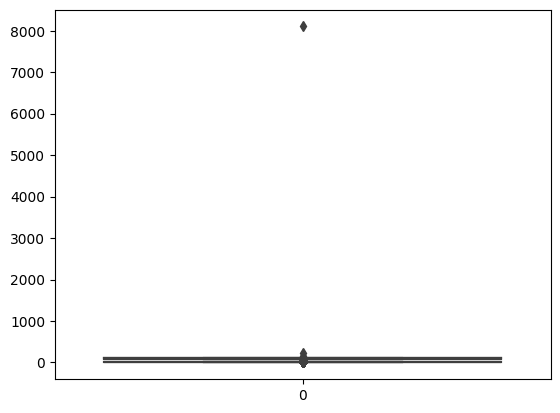

In [ ]:
# Identify outliers in the data based on output variables:
sns.boxplot(processed_imputed['waterPermeabilityCoefficient']) # >30
sns.boxplot(processed_imputed['realRejection']) # <60
sns.boxplot(processed_imputed['observedSoluteRejection']) # <40
sns.boxplot(processed_imputed['solutePermeabilityCoefficient']) # >50

In [ ]:
# Dropping outliers
processed_filtered = processed_imputed[processed_imputed['waterPermeabilityCoefficient']<30]
processed_filtered = processed_filtered[processed_filtered['realRejection']>60]
processed_filtered = processed_filtered[processed_filtered['observedSoluteRejection']>40]
processed_filtered = processed_filtered[processed_filtered['solutePermeabilityCoefficient']<50]

print("Dimensions of data after dropping outliers: ", processed_filtered.shape)
processed_filtered.head()

Dimensions of data after dropping outliers:  (728, 21)


,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,...,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.80,99.7,...,0.03422,CP calculated assuming kf = 100,1.51,26.0900,3,4,15,0,0,1
1,4,Polymeric TFC,Polyamide,No modification,No,2.93,0.2113,13.85590,99.71,99.4,...,0.03422,CP calculated assuming kf = 100,2.05,26.0900,3,4,0,0,0,1
2,5,Polymeric TFC,Polyamide,No modification,No,2.99,5.3134,0.56347,81.72,77.9,...,0.00154,CP calculated assuming kf = 100,1.27,7.9440,3,4,0,0,2,1
3,6,Polymeric TFC,Polyamide,Post-treatment: surface,No,1.89,2.7957,0.67617,84.29,82.2,...,0.00154,CP calculated assuming kf = 100,1.16,7.9440,3,4,5,0,2,1
4,7,Other,Other,Synthesis: monomers,No,0.22,1.7440,0.12842,90.53,89.0,...,0.08556,CP calculated assuming kf = 100,1.18,75.0477,2,3,13,0,2,1


In [ ]:
# Dropping outliers
processed_filtered = processed_imputed[processed_imputed['waterPermeabilityCoefficient']<30]
processed_filtered = processed_filtered[processed_filtered['realRejection']>60]
processed_filtered = processed_filtered[processed_filtered['observedSoluteRejection']>40]
processed_filtered = processed_filtered[processed_filtered['solutePermeabilityCoefficient']<50]

print("Dimensions of data after dropping outliers: ", processed_filtered.shape)
processed_filtered.head()

Dimensions of data after dropping outliers:  (728, 21)


,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,...,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.80,99.7,...,0.03422,CP calculated assuming kf = 100,1.51,26.0900,3,4,15,0,0,1
1,4,Polymeric TFC,Polyamide,No modification,No,2.93,0.2113,13.85590,99.71,99.4,...,0.03422,CP calculated assuming kf = 100,2.05,26.0900,3,4,0,0,0,1
2,5,Polymeric TFC,Polyamide,No modification,No,2.99,5.3134,0.56347,81.72,77.9,...,0.00154,CP calculated assuming kf = 100,1.27,7.9440,3,4,0,0,2,1
3,6,Polymeric TFC,Polyamide,Post-treatment: surface,No,1.89,2.7957,0.67617,84.29,82.2,...,0.00154,CP calculated assuming kf = 100,1.16,7.9440,3,4,5,0,2,1
4,7,Other,Other,Synthesis: monomers,No,0.22,1.7440,0.12842,90.53,89.0,...,0.08556,CP calculated assuming kf = 100,1.18,75.0477,2,3,13,0,2,1


In [ ]:
from numpy.ma.extras import average
# Creating Rank Columns based on how efficient a metric is based on individual values

# For these columns, it is good for the membrane to have low values
rankColsA = ["solutePermeabilityCoefficient",
             "concentrationPolarization",
             "saltConcentration"]

for i in rankColsA:
  cName = str(i)
  rankColName = i + "Rank"
  processed_filtered[rankColName] = processed_filtered[i].rank(ascending = True, method = "dense")

# For these columns, it is good for the membrane to have high values
rankColsD = ["waterPermeabilityCoefficient",
             "realRejection",
             "observedSoluteRejection",
             "pressureDiff",
             "Water/Salt-Selectivity"]

for i in rankColsD:
  cName = str(i)
  rankColName = i + "Rank"
  processed_filtered[rankColName] = processed_filtered[i].rank(ascending = False, method = "dense")

rankCols = [col for col in processed_filtered.columns if 'Rank' in col]
processed_filtered["averageEfficiencyRank"] = processed_filtered[rankCols].mean(axis = 1)
pd.set_option('display.max_columns', None)
print("Dimensions of data after adding rank columns: ", processed_filtered.shape)
processed_filtered.head()

Dimensions of data after adding rank columns:  (728, 30)


,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,filtrationMode,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank,averageEfficiencyRank
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.80,99.7,Cross-flow,0.03422,CP calculated assuming kf = 100,1.51,26.0900,3,4,15,0,0,1,97.0,80.0,21.0,192.0,14.0,19.0,109.0,83.0,76.875
1,4,Polymeric TFC,Polyamide,No modification,No,2.93,0.2113,13.85590,99.71,99.4,Cross-flow,0.03422,CP calculated assuming kf = 100,2.05,26.0900,3,4,0,0,0,1,167.0,134.0,21.0,169.0,23.0,44.0,109.0,158.0,103.125
2,5,Polymeric TFC,Polyamide,No modification,No,2.99,5.3134,0.56347,81.72,77.9,Not available,0.00154,CP calculated assuming kf = 100,1.27,7.9440,3,4,0,0,2,1,496.0,51.0,1.0,165.0,363.0,304.0,290.0,526.0,274.500
3,6,Polymeric TFC,Polyamide,Post-treatment: surface,No,1.89,2.7957,0.67617,84.29,82.2,Not available,0.00154,CP calculated assuming kf = 100,1.16,7.9440,3,4,5,0,2,1,467.0,38.0,1.0,271.0,347.0,288.0,290.0,520.0,277.750
4,7,Other,Other,Synthesis: monomers,No,0.22,1.7440,0.12842,90.53,89.0,Not available,0.08556,CP calculated assuming kf = 100,1.18,75.0477,2,3,13,0,2,1,441.0,40.0,29.0,402.0,299.0,255.0,30.0,589.0,260.625


# EDA / Data Visualization
In this section, we will be exploring the given data and creating various
visualizations to understand the underlying patterns in the data.

The histograms plot the frequency of values in a certain column. They help us understand the distribution of values in the column.

The scatter plot plots the values of a column on the x-axis vs. another column on the y-axis. It helps us understand the relationship between these two columns.

In [ ]:
# Using a copy of the processed dataset for visualization purposes
df4 = processed_filtered.copy()

In [ ]:
#Finding coorelatio between different columns
df4.corr()

,mebraneID,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,saltConcentration,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank,averageEfficiencyRank
mebraneID,1.000000,0.000779,0.074689,-0.024423,0.011577,-0.013257,0.038568,0.046037,0.008821,0.166190,0.227865,-0.131410,0.152018,-0.189543,-0.009254,0.035138,0.019111,0.076521,-0.062093,-0.032854,-0.029431,-0.095633,0.024680,-0.021090
waterPermeabilityCoefficient,0.000779,1.000000,0.146870,0.070901,0.056323,-0.020896,-0.151735,0.576995,-0.223628,0.082719,-0.041495,-0.105536,0.015878,-0.106319,-0.047999,0.326739,0.596977,-0.166461,-0.853725,-0.061146,0.040055,0.209982,-0.163922,-0.066614
solutePermeabilityCoefficient,0.074689,0.146870,1.000000,-0.202763,-0.767254,-0.856403,-0.107538,0.066792,0.035978,-0.025462,0.584576,0.048008,-0.039354,-0.121210,0.002914,0.558187,0.080601,-0.075931,-0.191084,0.560134,0.580612,-0.116546,0.482461,0.511747
Water/Salt-Selectivity,-0.024423,0.070901,-0.202763,1.000000,0.307870,0.309366,-0.018119,-0.067365,-0.122972,0.081955,-0.138444,-0.093944,0.123710,0.177197,-0.050956,-0.560046,-0.015017,0.010976,-0.122793,-0.517040,-0.537340,0.108975,-0.702133,-0.628468
realRejection,0.011577,0.056323,-0.767254,0.307870,1.000000,0.971587,0.199639,0.183059,0.124727,0.079279,-0.544947,-0.024550,0.064424,0.151598,0.001634,-0.601045,0.206835,0.258637,-0.045972,-0.850789,-0.827413,-0.134144,-0.637493,-0.758234
observedSoluteRejection,-0.013257,-0.020896,-0.856403,0.309366,0.971587,1.000000,0.181196,0.072100,0.075149,0.064583,-0.582977,-0.057068,0.066295,0.144334,-0.011119,-0.649426,0.086456,0.217959,0.031421,-0.820427,-0.836267,-0.069390,-0.646650,-0.752581
saltConcentration,0.038568,-0.151735,-0.107538,-0.018119,0.199639,0.181196,1.000000,0.091355,0.722707,0.041485,-0.048621,0.066472,-0.055994,0.299791,-0.200390,-0.150181,0.136108,0.892768,0.154913,-0.275994,-0.270506,-0.708554,-0.083541,-0.248336
concentrationPolarization,0.046037,0.576995,0.066792,-0.067365,0.183059,0.072100,0.091355,1.000000,0.143086,0.106427,-0.018486,0.012953,-0.103509,-0.004316,0.116938,0.225892,0.869972,0.142865,-0.497724,-0.169076,-0.036581,-0.184142,-0.077655,-0.074608
pressureDiff,0.008821,-0.223628,0.035978,-0.122972,0.124727,0.075149,0.722707,0.143086,1.000000,-0.015772,0.058910,0.092430,-0.042671,0.432161,-0.090832,-0.019080,0.188024,0.720545,0.293063,-0.164940,-0.154251,-0.883165,0.154944,-0.082780
structureNumerical,0.166190,0.082719,-0.025462,0.081955,0.079279,0.064583,0.041485,0.106427,-0.015772,1.000000,0.130808,0.047335,0.001648,-0.060763,0.007631,-0.005980,0.149226,-0.034291,-0.153986,-0.109327,-0.090155,0.014602,-0.097815,-0.096383


<Axes: xlabel='structure', ylabel='waterPermeabilityCoefficient'>

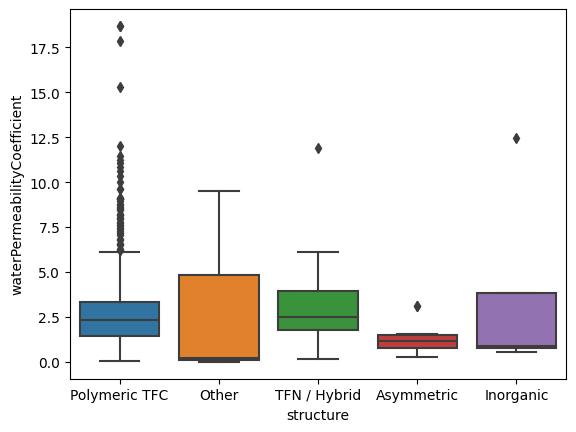

In [ ]:
#Visualizing the Water Permability Coefficient for each category of structure
sns.boxplot(x=processed['structure'],y=df4['waterPermeabilityCoefficient'])

<Axes: xlabel='structure', ylabel='waterPermeabilityCoefficientRank'>

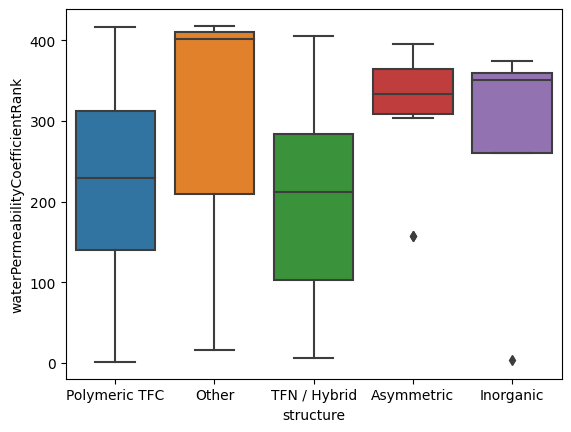

In [ ]:
#Visualizing the Water Permability Coefficient Rank for each category of structure
sns.boxplot(x=processed['structure'],y=df4['waterPermeabilityCoefficientRank'])

<Axes: xlabel='chemistry', ylabel='waterPermeabilityCoefficient'>

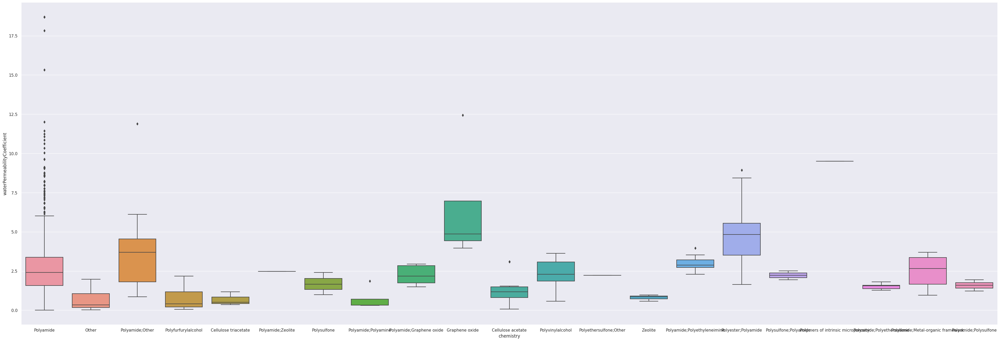

In [ ]:
#Visualizing the Water Permability Coefficient for each category of chemistry
sns.set(font_scale=1)
plt.figure(figsize=(48,16))
sns.boxplot(x=processed['chemistry'],y=df4['waterPermeabilityCoefficient'], width = 0.8)

<Axes: xlabel='chemistry', ylabel='waterPermeabilityCoefficientRank'>

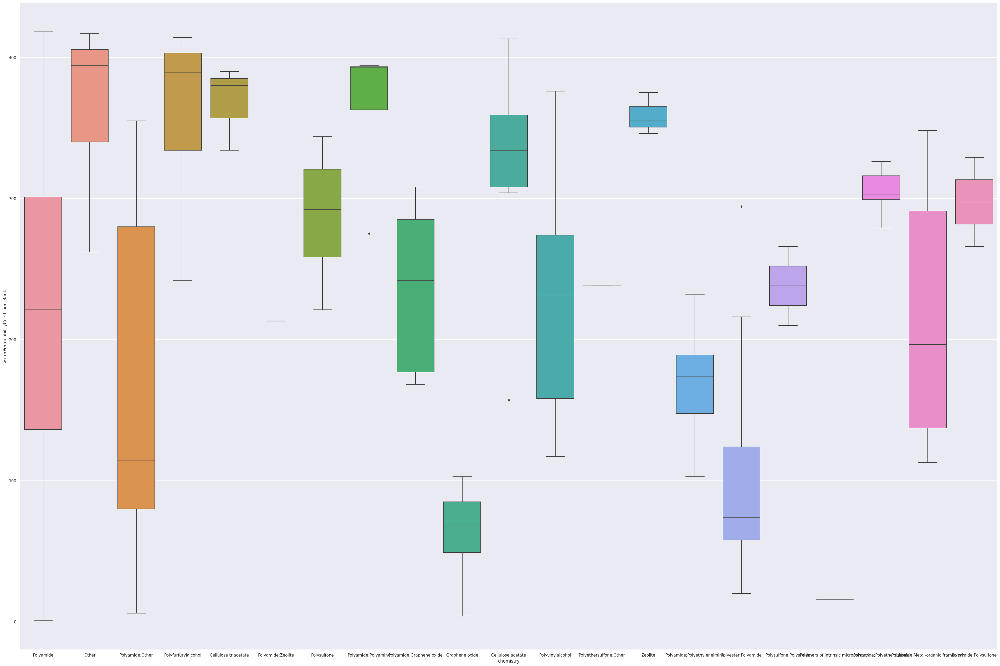

In [ ]:
#Visualizing the Water Permability Coefficient Rank for each category of chemistry
plt.figure(figsize=(48,32))
sns.set(font_scale=1)
sns.boxplot(x=processed['chemistry'],y=df4['waterPermeabilityCoefficientRank'])

<Axes: xlabel='cpMode', ylabel='waterPermeabilityCoefficient'>

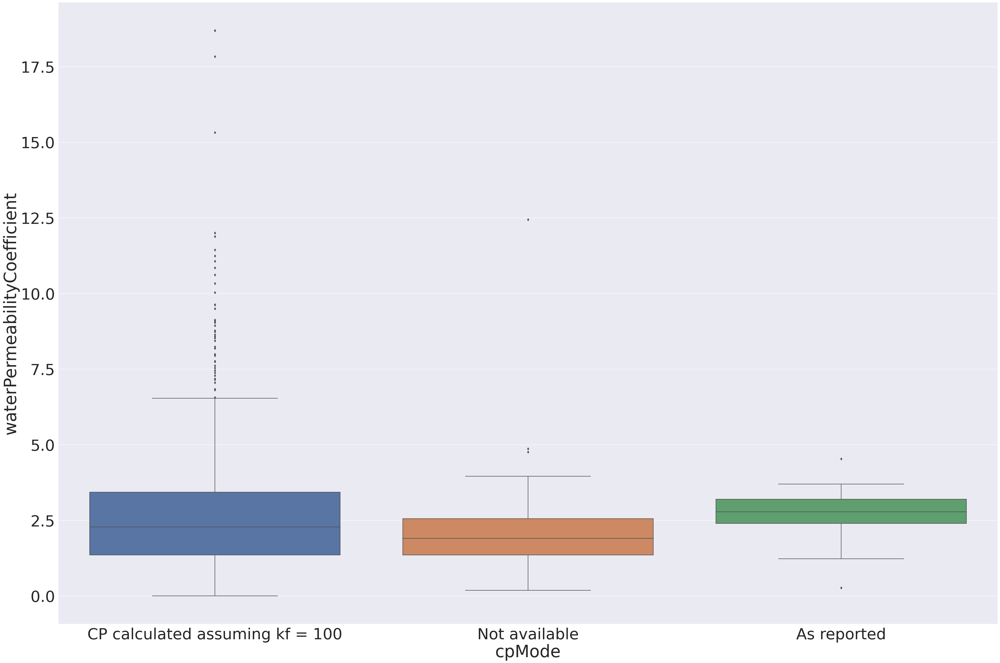

In [ ]:
#Visualizing the Water Permability Coefficient for each category of concentration polarization
plt.figure(figsize=(48,32))
sns.set(font_scale=4)
sns.boxplot(x=processed['cpMode'],y=df4['waterPermeabilityCoefficient'])

<Axes: xlabel='cpMode', ylabel='waterPermeabilityCoefficientRank'>

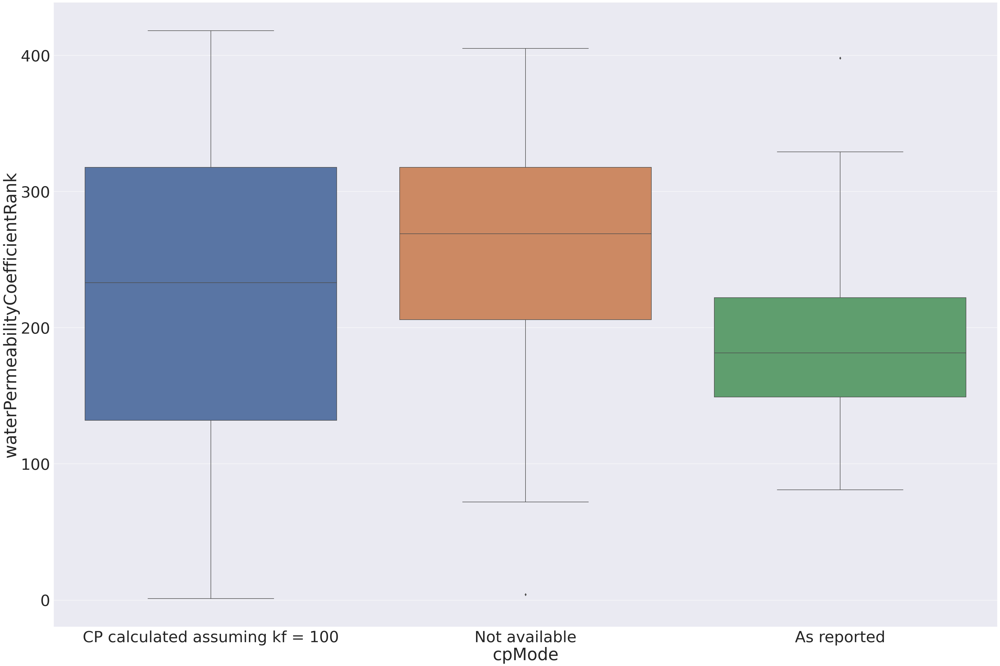

In [ ]:
#Visualizing the Water Permability Coefficient Rank for each category of concentration polarization
plt.figure(figsize=(48,32))
sns.set(font_scale=4)
sns.boxplot(x=processed['cpMode'],y=df4['waterPermeabilityCoefficientRank'])

<Axes: xlabel='modification', ylabel='waterPermeabilityCoefficient'>

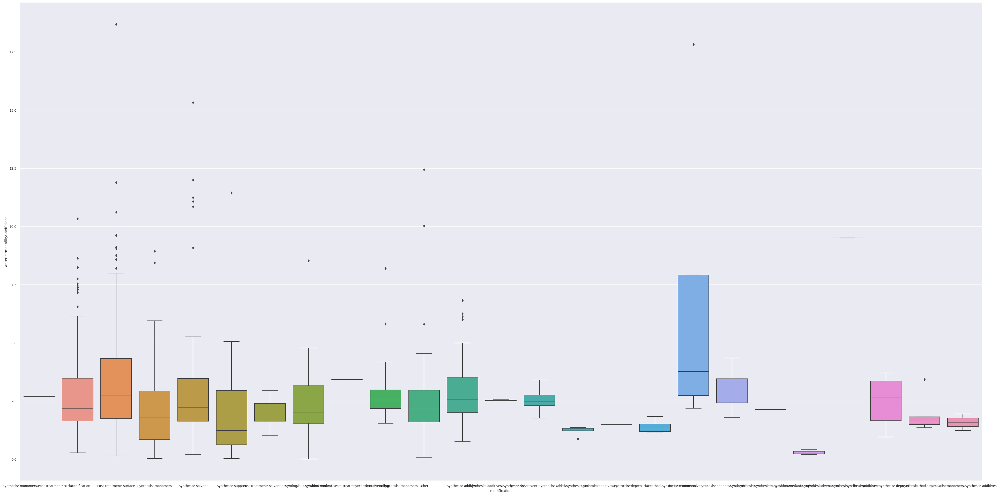

In [ ]:
#Visualizing the Water Permability Coefficient for each category of modification
plt.figure(figsize=(48,24))
sns.set(font_scale=0.8)
sns.boxplot(x=processed['modification'],y=df4['waterPermeabilityCoefficient'])

<Axes: xlabel='modification', ylabel='waterPermeabilityCoefficientRank'>

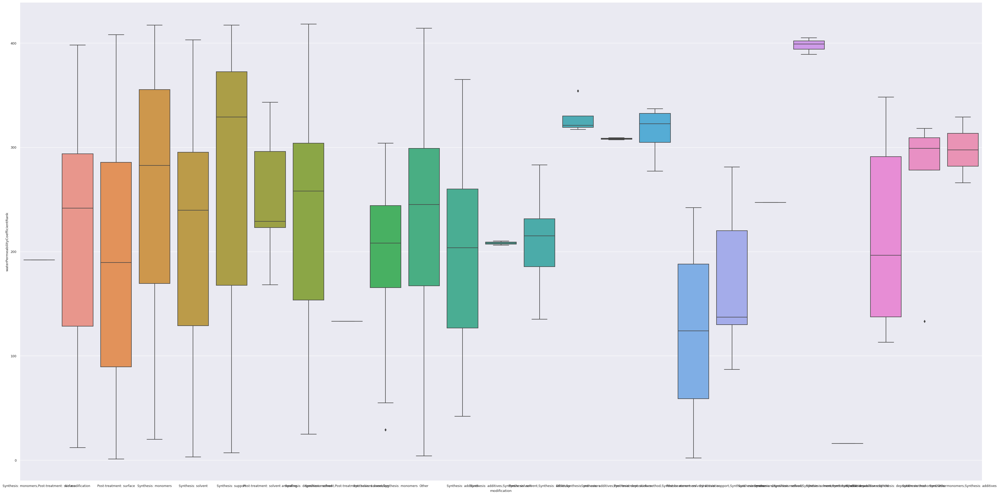

In [ ]:
#Visualizing the Water Permability Coefficient for each category of modification
plt.figure(figsize=(48,24))
sns.set(font_scale=0.8)
sns.boxplot(x=processed['modification'],y=df4['waterPermeabilityCoefficientRank'])

In [ ]:
df.describe()

,mebraneID,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,saltConcentration,concentrationPolarization,pressureDiff
count,742.000000,742.000000,742.000000,742.000000,742.000000,742.000000,742.000000,722.000000,742.000000
mean,384.083558,2.906742,14.322504,11.262886,94.382066,92.333619,0.147299,1.441447,21.241349
std,223.948931,3.723344,297.637048,18.631824,9.638596,13.443979,0.221753,0.486980,18.570019
min,3.000000,0.001600,0.000200,0.006969,36.360000,12.600000,0.001540,-1.500000,0.450000
25%,190.250000,1.400000,0.160000,1.750361,94.347500,92.347500,0.030000,1.200000,13.522500
50%,379.500000,2.310000,0.403250,5.042601,98.605000,97.900000,0.034200,1.380000,14.010000
75%,579.750000,3.380000,1.048875,11.569565,99.520000,99.300000,0.059900,1.588657,25.480000
max,773.000000,77.330000,8102.000000,231.250000,99.940000,99.910000,0.600000,4.710000,99.630000


<ipython-input-25-e1080a1e9463>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.hist(df4[df['waterPermeabilityCoefficient']<20]['waterPermeabilityCoefficient'], bins=5, color='green',edgecolor = 'black')


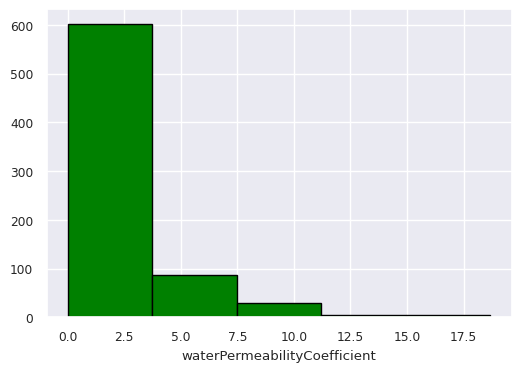

In [ ]:
# Plotting a histogram of a column from a DataFrame where waterPermeabilityCoefficient < 20
plt.figure(figsize=(6,4))
plt.hist(df4[df['waterPermeabilityCoefficient']<20]['waterPermeabilityCoefficient'], bins=5, color='green',edgecolor = 'black')
plt.xlabel('waterPermeabilityCoefficient')
plt.show()

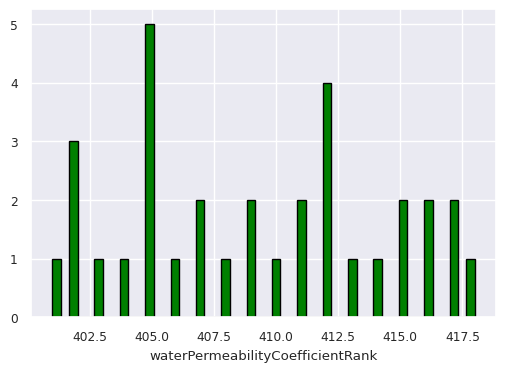

In [ ]:
#Plotting histogram of waterPermeabilityCoefficientRank where values are greater than 400
plt.figure(figsize=(6,4))
plt.hist(df4[df4['waterPermeabilityCoefficientRank']>400]['waterPermeabilityCoefficientRank'], bins=50, color='green',edgecolor = 'black')
plt.xlabel('waterPermeabilityCoefficientRank')
plt.show()

<Axes: >

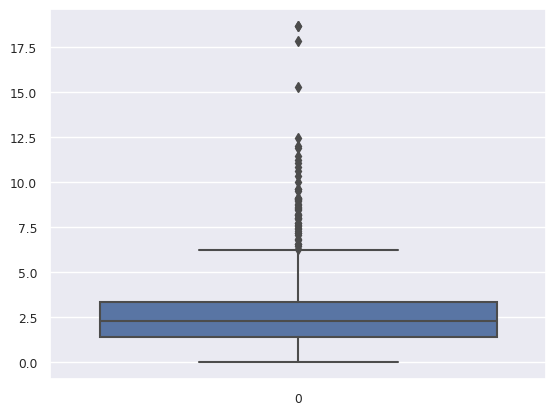

In [ ]:
# Plotting a box plot of the 'waterPermeabilityCoefficient' column
sns.boxplot(df4['waterPermeabilityCoefficient'])

<Axes: >

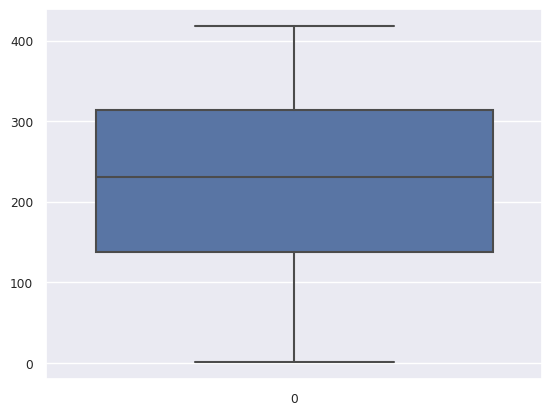

In [ ]:
# Plotting a box plot of the 'waterPermeabilityCoefficientRank' column
sns.boxplot(df4['waterPermeabilityCoefficientRank'])

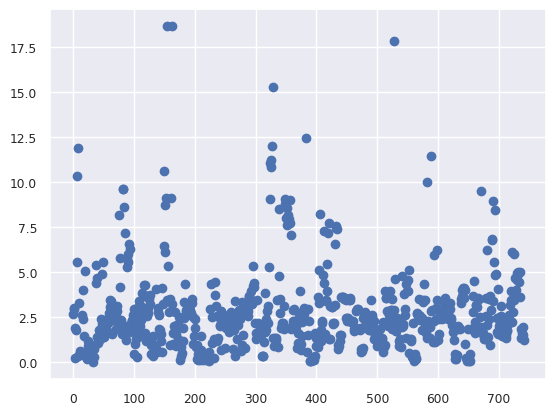

In [ ]:
# Plotting a scatter plot of the 'waterPermeabilityCoefficient' column
plt.plot(df4['waterPermeabilityCoefficient'],linestyle="",marker="o")

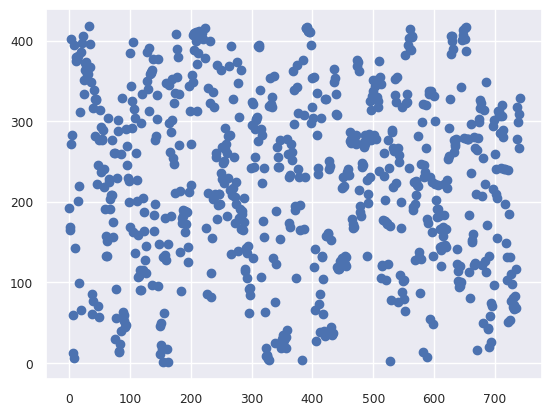

In [ ]:
# Plotting a scatter plot of the 'waterPermeabilityCoefficientRank' column
plt.plot(df4['waterPermeabilityCoefficientRank'],linestyle="",marker="o")

<Axes: >

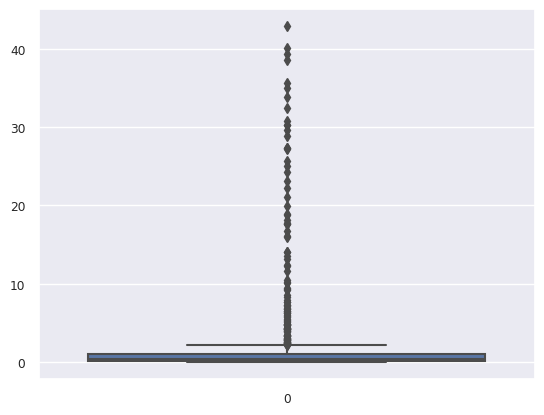

In [ ]:
# Plotting a box plot of the 'solutePermeabilityCoefficient' column
sns.boxplot(df4['solutePermeabilityCoefficient'])

<Axes: >

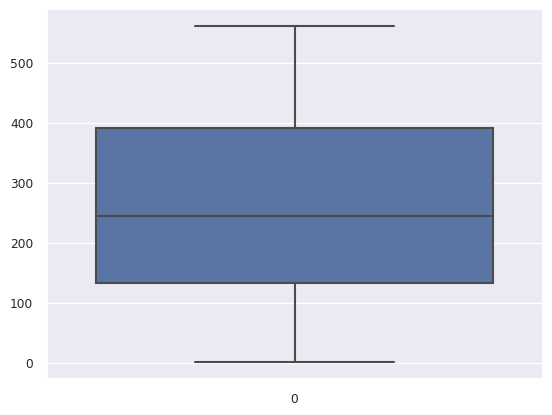

In [ ]:
# Plotting a box plot of the 'solutePermeabilityCoefficientRank' column
sns.boxplot(df4['solutePermeabilityCoefficientRank'])

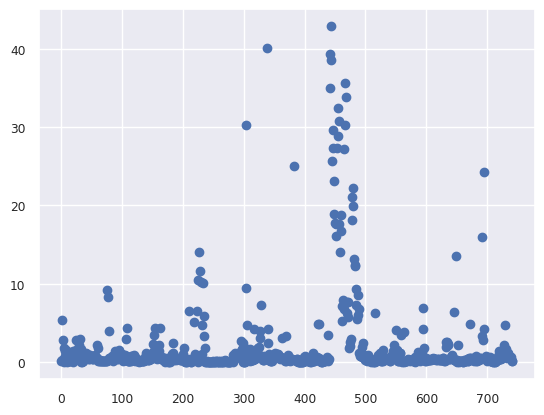

In [ ]:
# Plotting a scatter plot of the 'solutePermeabilityCoefficient' column
plt.plot(df4['solutePermeabilityCoefficient'],linestyle="",marker="o")

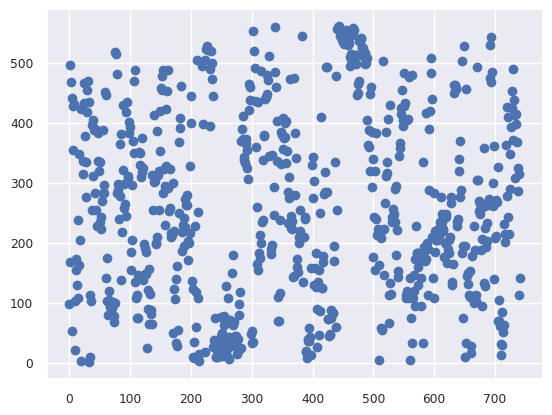

In [ ]:
# Plotting a scatter plot of the 'solutePermeabilityCoefficientRank' column
plt.plot(df4['solutePermeabilityCoefficientRank'],linestyle="",marker="o")

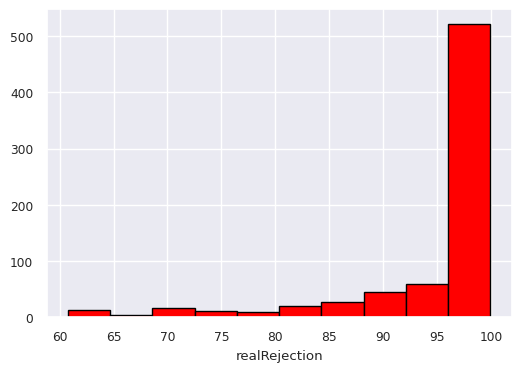

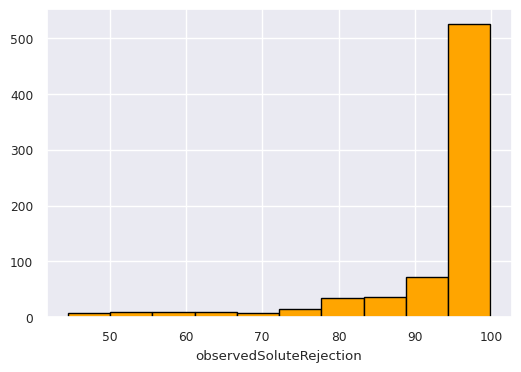

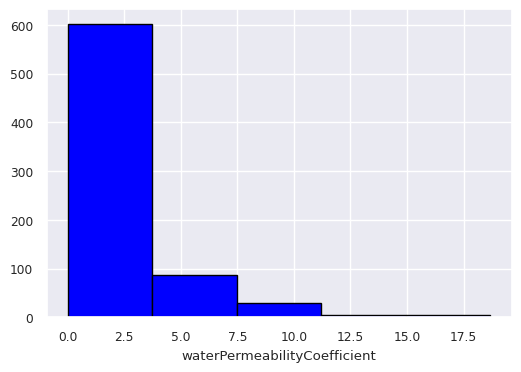

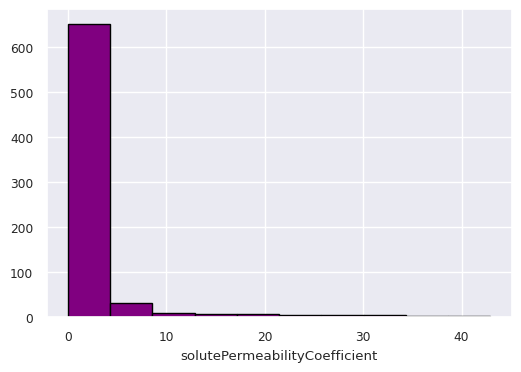

In [ ]:
# Plotting histograms of multiple numerical columns from df4
plt.figure(figsize=(6,4))
plt.hist(df4['realRejection'], color='red', edgecolor = 'black')
plt.xlabel('realRejection')
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df4['observedSoluteRejection'], color='orange', edgecolor = 'black')
plt.xlabel('observedSoluteRejection')
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df4['waterPermeabilityCoefficient'], bins=5, color='blue',edgecolor = 'black')
plt.xlabel('waterPermeabilityCoefficient')
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df4['solutePermeabilityCoefficient'], color='purple',edgecolor = 'black')
plt.xlabel('solutePermeabilityCoefficient')
plt.show()

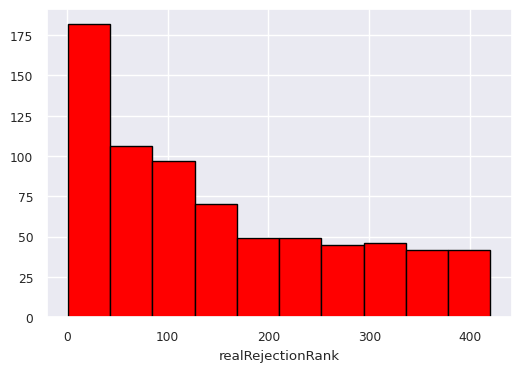

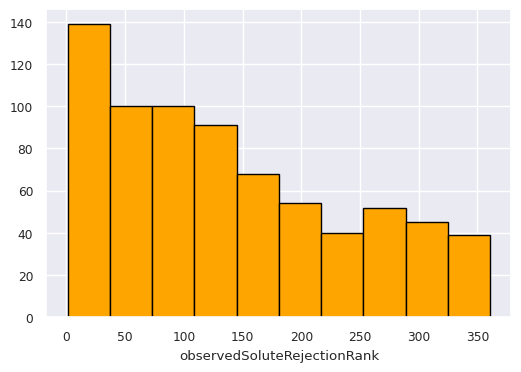

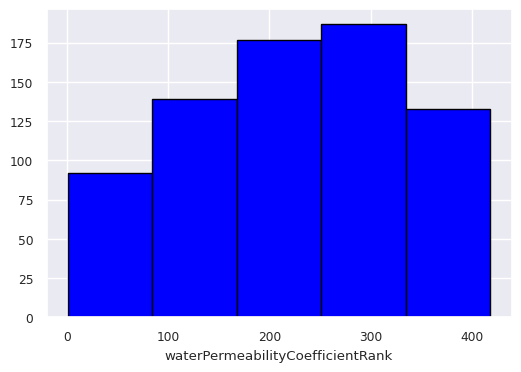

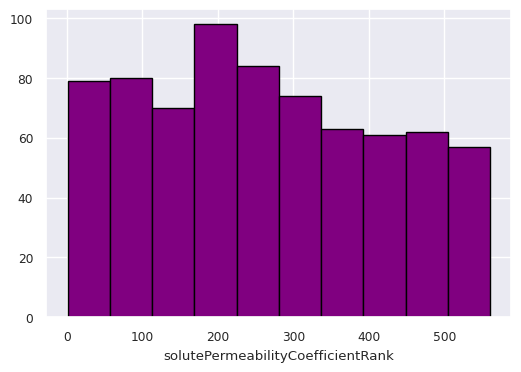

In [ ]:
# Plotting histograms of multiple rank columns from df4
plt.figure(figsize=(6,4))
plt.hist(df4['realRejectionRank'], color='red', edgecolor = 'black')
plt.xlabel('realRejectionRank')
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df4['observedSoluteRejectionRank'], color='orange', edgecolor = 'black')
plt.xlabel('observedSoluteRejectionRank')
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df4['waterPermeabilityCoefficientRank'], bins=5, color='blue',edgecolor = 'black')
plt.xlabel('waterPermeabilityCoefficientRank')
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df4['solutePermeabilityCoefficientRank'], color='purple',edgecolor = 'black')
plt.xlabel('solutePermeabilityCoefficientRank')
plt.show()

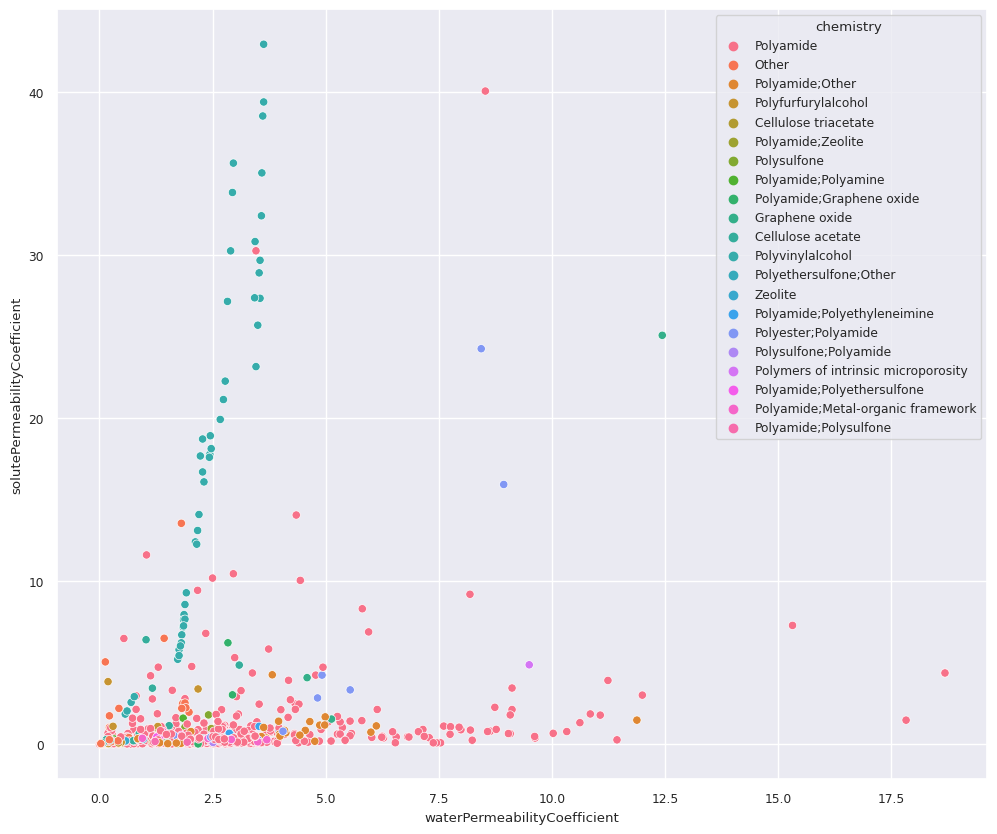

In [ ]:
# Plotting a scatter plot of 'waterPermeabilityCoefficient' vs 'solutePermeabilityCoefficient' by 'chemistry' markers
plt.figure(figsize=(12,10))
sns.scatterplot(x=df4['waterPermeabilityCoefficient'], y=df4['solutePermeabilityCoefficient'], hue=df4['chemistry'])
plt.show()

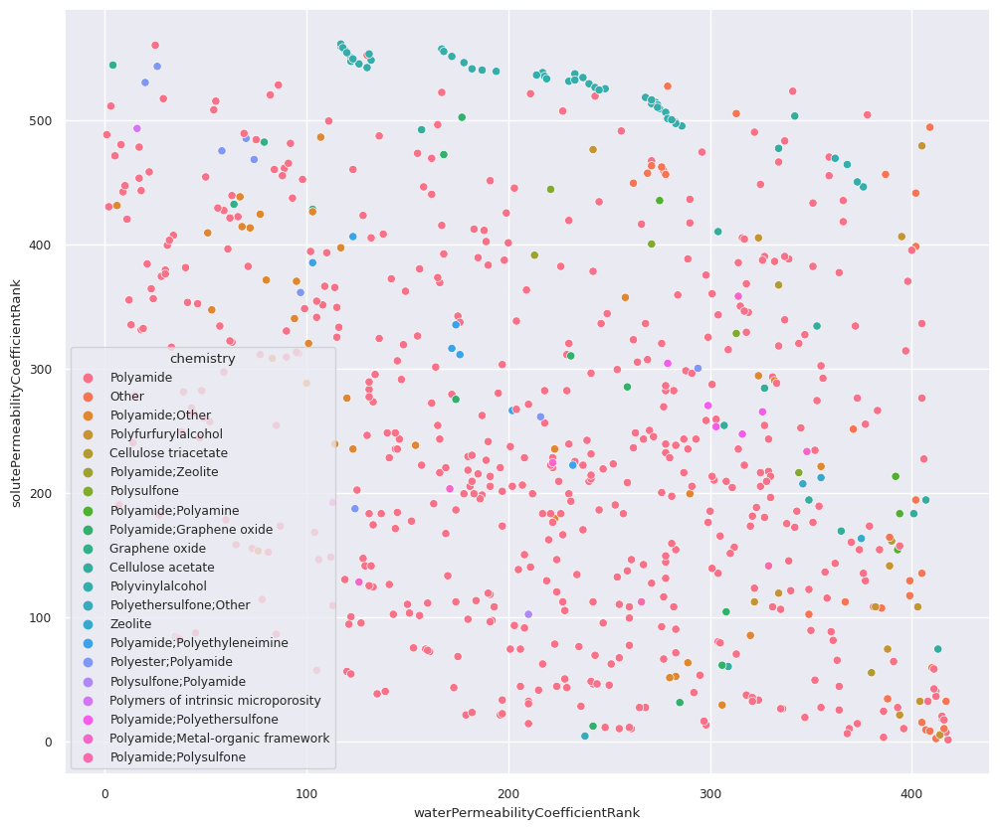

In [ ]:
# Plotting a scatter plot of 'waterPermeabilityCoefficientRank' vs 'solutePermeabilityCoefficientRank' by 'chemistry' markers
plt.figure(figsize=(12,10))
sns.scatterplot(x=df4['waterPermeabilityCoefficientRank'], y=df4['solutePermeabilityCoefficientRank'], hue=df4['chemistry'])
plt.show()

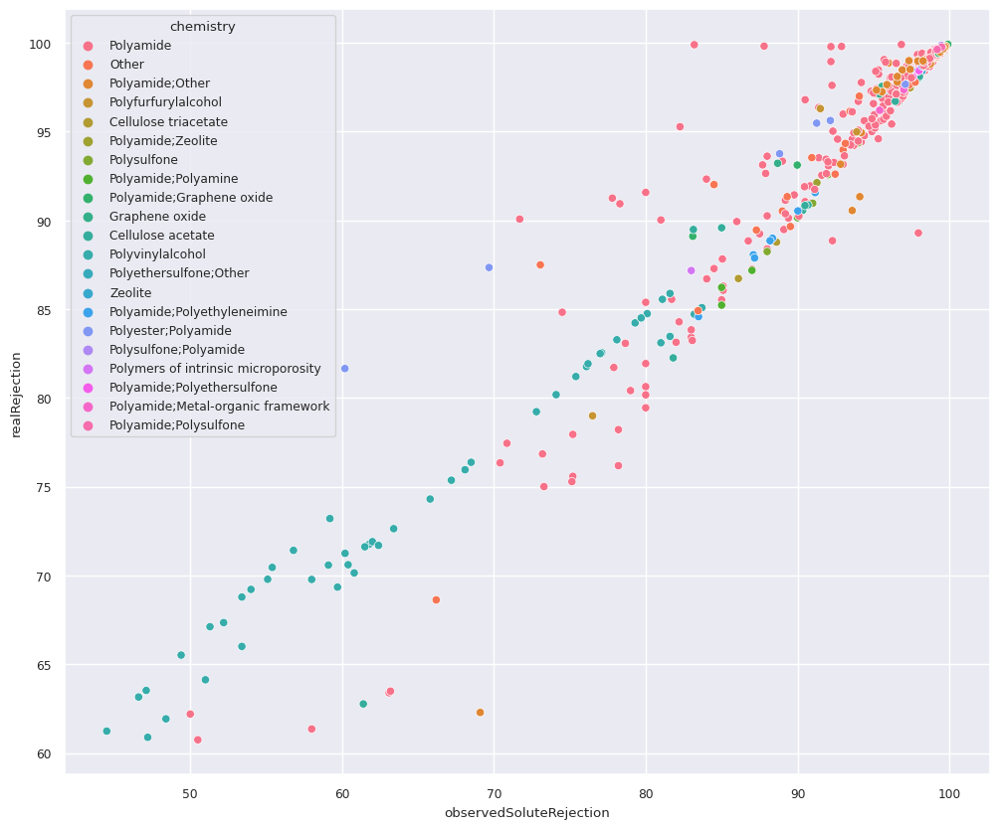

In [ ]:
# Plotting a scatter plot of 'observedSoluteRejection' vs 'realRejection' by 'chemistry' markers
plt.figure(figsize=(12,10))
sns.scatterplot(x=df4['observedSoluteRejection'], y=df4['realRejection'], hue=df4['chemistry'])
plt.show()

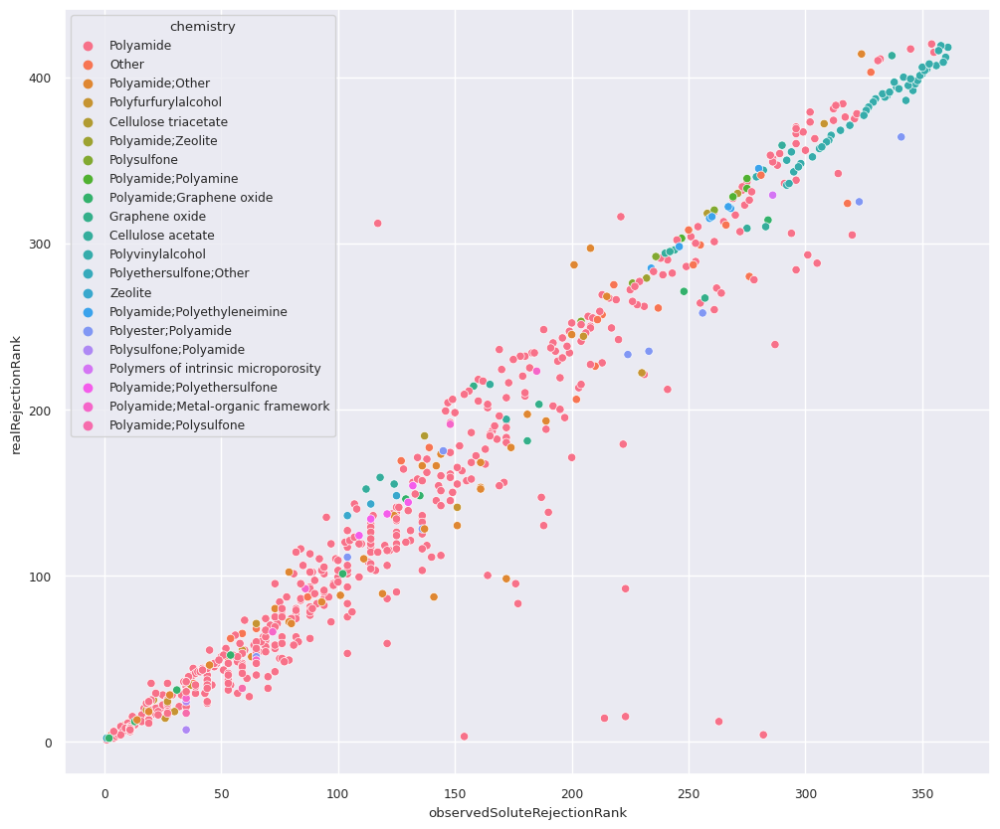

In [ ]:
# Plotting a scatter plot of 'observedSoluteRejectionRank' vs 'realRejectionRank' by 'chemistry' markers
plt.figure(figsize=(12,10))
sns.scatterplot(x=df4['observedSoluteRejectionRank'], y=df4['realRejectionRank'], hue=df4['chemistry'])
plt.show()

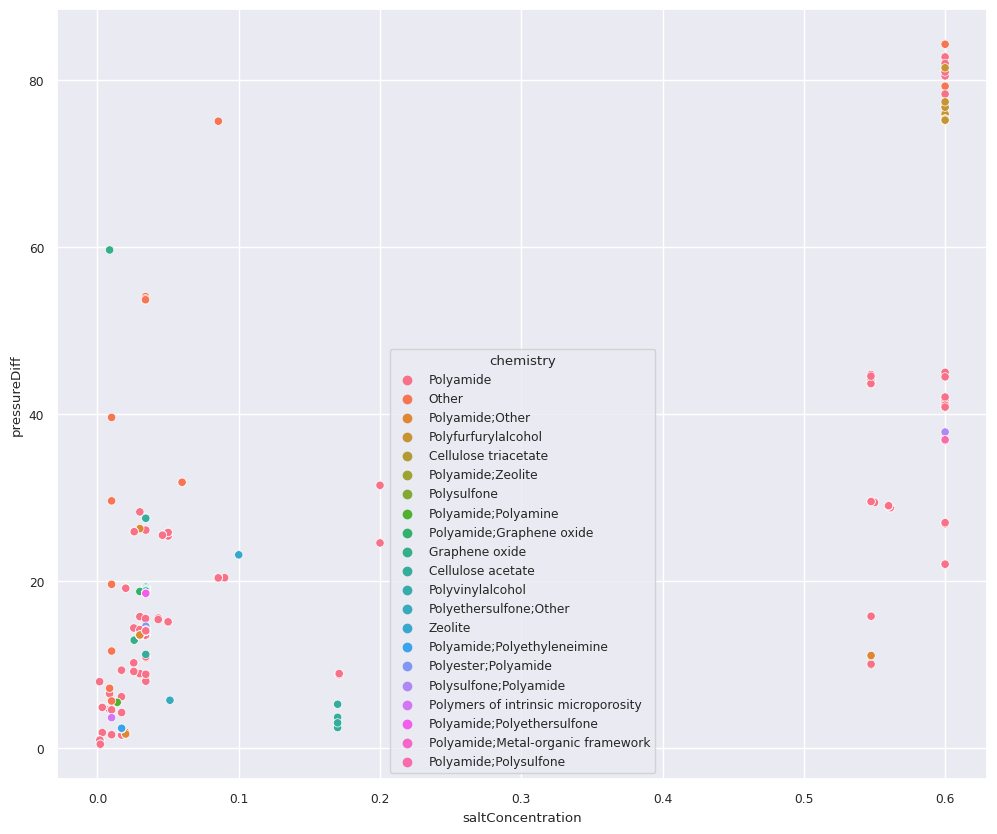

In [ ]:
# Plotting a scatter plot of 'saltConcentration' vs 'pressureDiff' by 'chemistry' markers
plt.figure(figsize=(12,10))
sns.scatterplot(x=df4['saltConcentration'], y=df4['pressureDiff'], hue=df4['chemistry'])
plt.show()

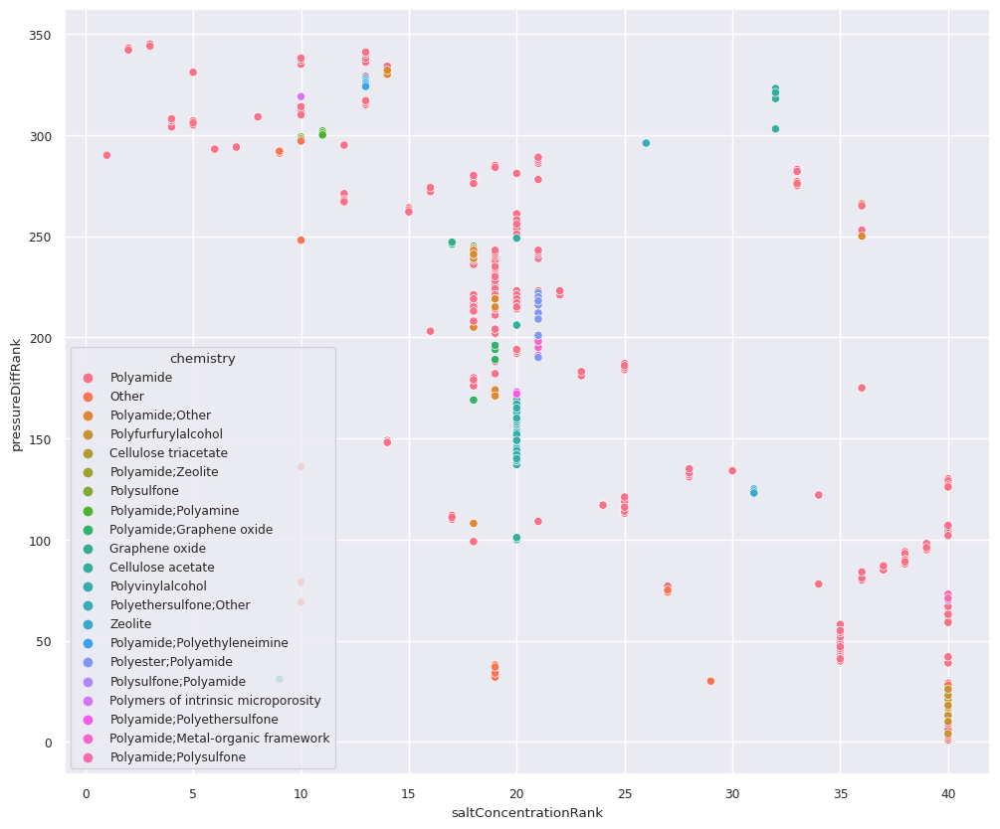

In [ ]:
# Plotting a scatter plot of 'saltConcentrationRank' vs 'pressureDiffRank' by 'chemistry' markers
plt.figure(figsize=(12,10))
sns.scatterplot(x=df4['saltConcentrationRank'], y=df4['pressureDiffRank'], hue=df4['chemistry'])
plt.show()

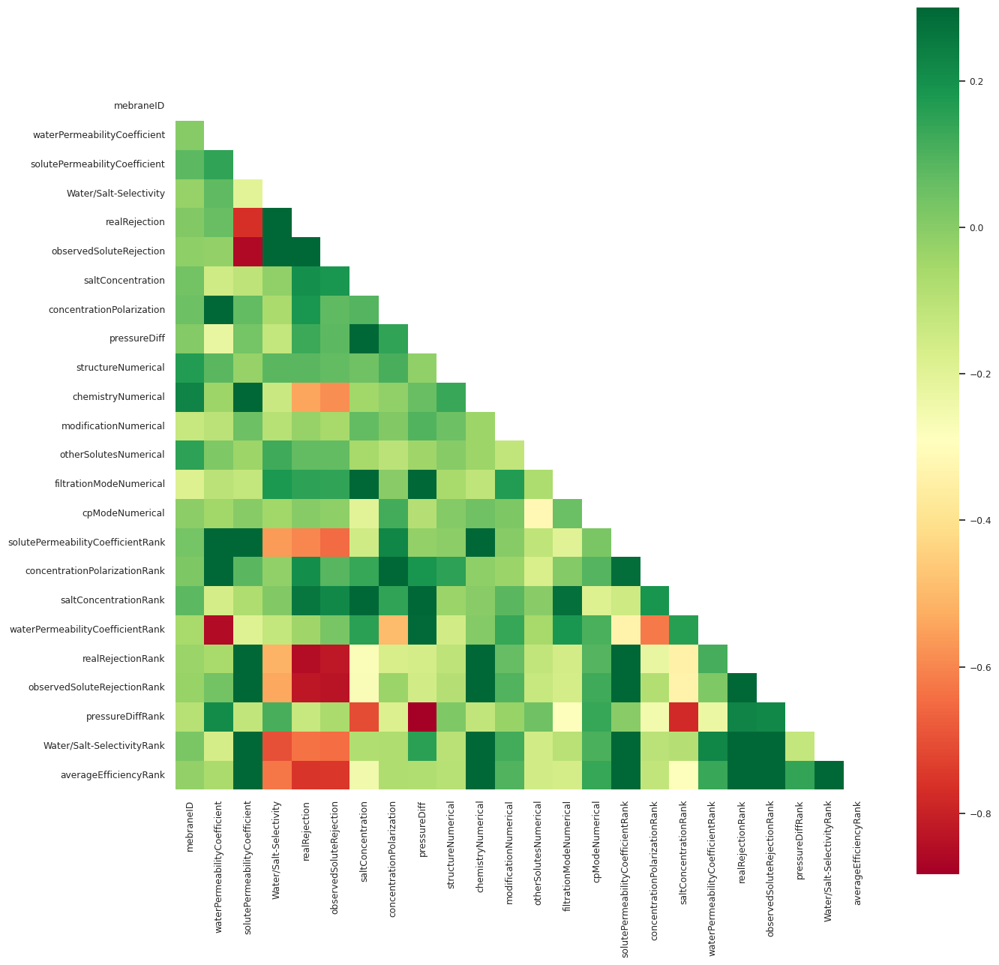

In [ ]:
#correlations of each features
corr_matrix = df4.corr()

#plot heat map
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 15))
    ax = sns.heatmap(corr_matrix, mask=mask, vmax=.3, square=True,cmap="RdYlGn")

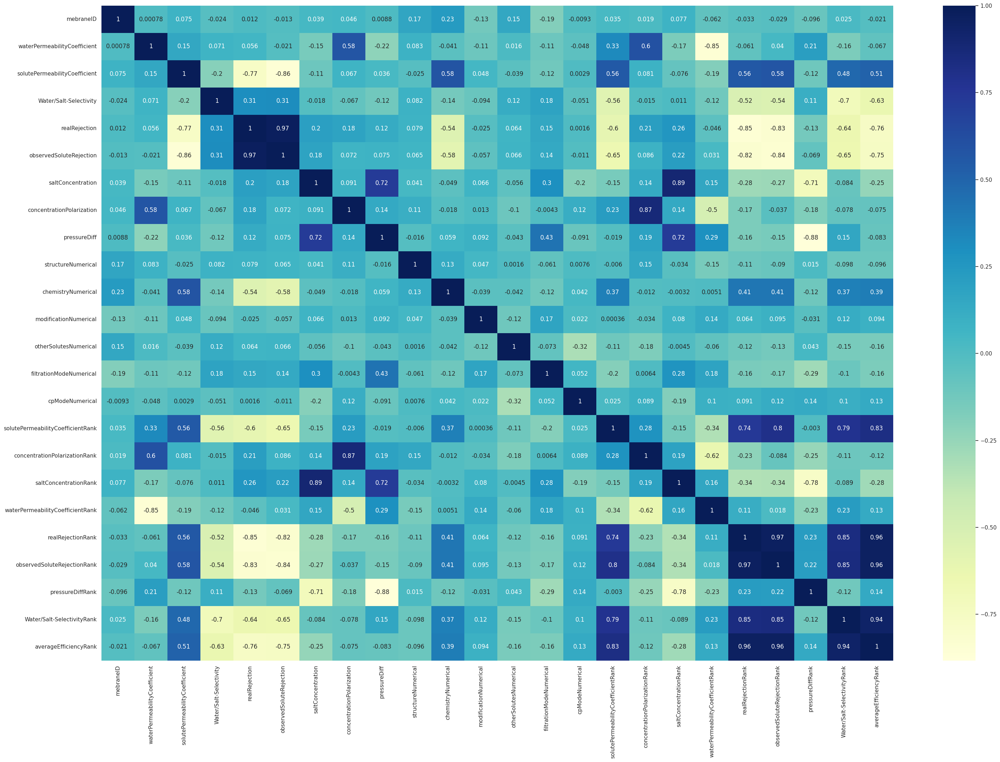

In [ ]:
#creating a heat map for the dataset
sns.set(rc={'figure.figsize':(36,24)})
dataplot = sns.heatmap(df4.corr(), cmap="YlGnBu", annot=True)

<Axes: >

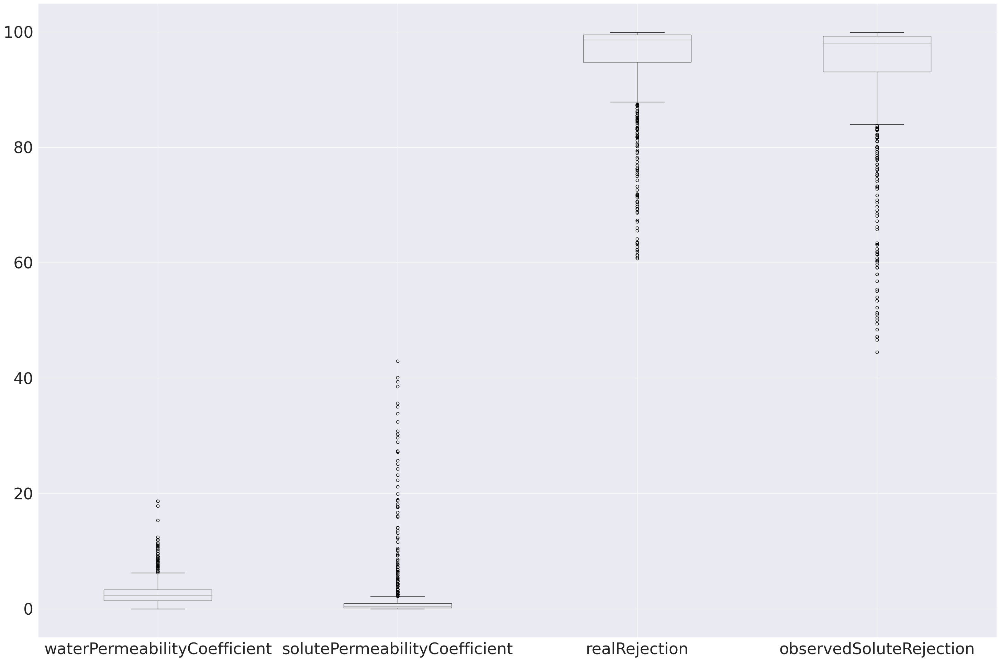

In [ ]:
#boxplot of all output variables
sns.set(font_scale=3)
df4.boxplot(column = ["waterPermeabilityCoefficient", "solutePermeabilityCoefficient", "realRejection", "observedSoluteRejection"])

<Axes: >

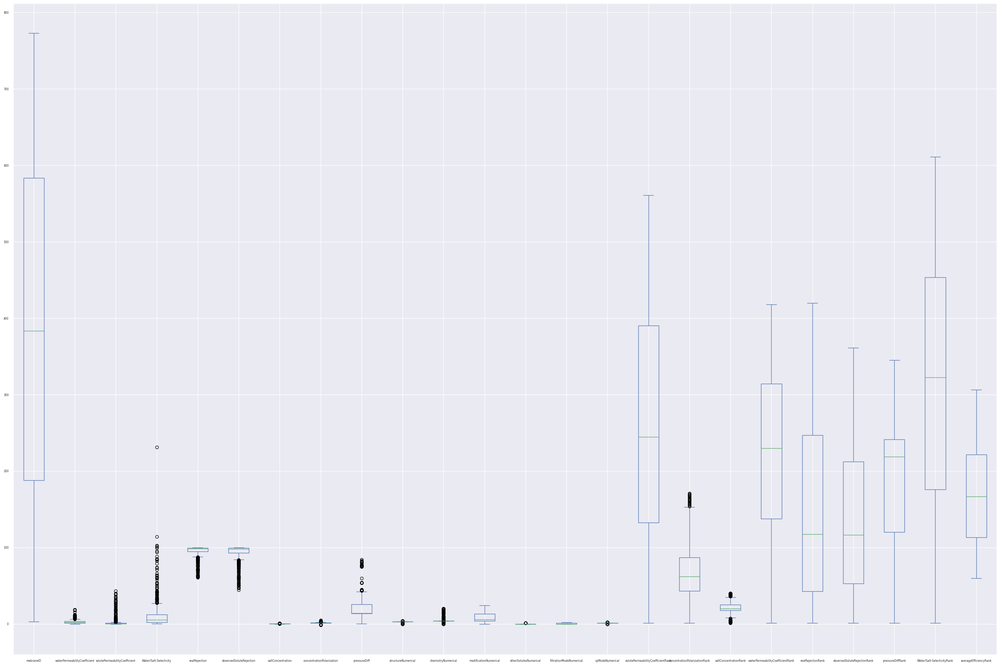

In [ ]:
#boxplot of entire dataset
sns.set(font_scale=0.5)
df4.plot.box()

#Model Development
In this section, we will be performing clustering on the given data and analyzing the results. We will try clustering our data based on different combination of features

In [ ]:
# Create a copy of the dataset after all pre-processing is complete so that we have it retained for profiling purposes later
cluster_raw = processed_filtered.copy()
# print("List of all columns in the data: \n",cluster_raw.columns)

## By Inputs (Numerical)

In [ ]:
# Keep only chosen columns required for clustering
cluster_in = cluster_raw.copy()
vars_for_clustering = ['Water/Salt-Selectivity',
       'saltConcentration', 'pressureDiff',
       'concentrationPolarization', 'structureNumerical', 'chemistryNumerical',
       'modificationNumerical', 'otherSolutesNumerical',
       'filtrationModeNumerical', 'cpModeNumerical']
dataInput = cluster_in[vars_for_clustering]

# Scale the data using standard scaling
scaler = StandardScaler()
dataInput_scaled = scaler.fit_transform(dataInput)

# Run K-Means clustering on our dataset for k ranging from 2-10
inertia = [] # Stores inertia values for our different k values
value_counts = [] # Stores value counts for our different k values
sil_score = [] # Stores sillhouette score for our different k values

num_cluster = range(2,12)

cluster_predictions = pd.DataFrame()

for cluster in num_cluster:
    kmeans = KMeans(n_clusters = cluster, init='k-means++', random_state = 42)
    kmeans.fit(dataInput_scaled)
    inertia.append(kmeans.inertia_) #Append inertia values to list

    prediction = kmeans.predict(dataInput_scaled)
    sil_score.append(silhouette_score(dataInput_scaled,prediction))

    cluster_predictions[cluster] = prediction
    value_counts.append(cluster_predictions[cluster].value_counts().to_list())
    cluster_in['cluster'+str(cluster)] = prediction #Append cluster prediction to original dataset
# cluster_in.head()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

Value Counts:  [[579, 149], [570, 149, 9], [439, 152, 128, 9], [438, 152, 108, 21, 9], [422, 108, 103, 68, 18, 9], [371, 109, 96, 66, 59, 18, 9], [311, 135, 88, 66, 58, 43, 18, 9], [254, 109, 99, 89, 66, 54, 30, 18, 9], [234, 97, 90, 89, 66, 54, 49, 22, 18, 9], [232, 89, 89, 86, 63, 54, 49, 22, 18, 17, 9]]

Inertia:  [6072.184374078324, 5235.54228127177, 4651.234334911831, 4103.634496808738, 3651.1945082836387, 3228.153751968293, 2851.367655346132, 2557.0659067729816, 2267.735338936466, 2043.8660226883787]

Silhouette Score:  [0.2590898295243826, 0.28447040038848853, 0.2852802150835294, 0.28947167881259633, 0.31376160384243684, 0.345199492296809, 0.31744272067220763, 0.3390567943210604, 0.3622172741459576, 0.3743656776122258]


Text(0, 0.5, 'Silhouette Score')

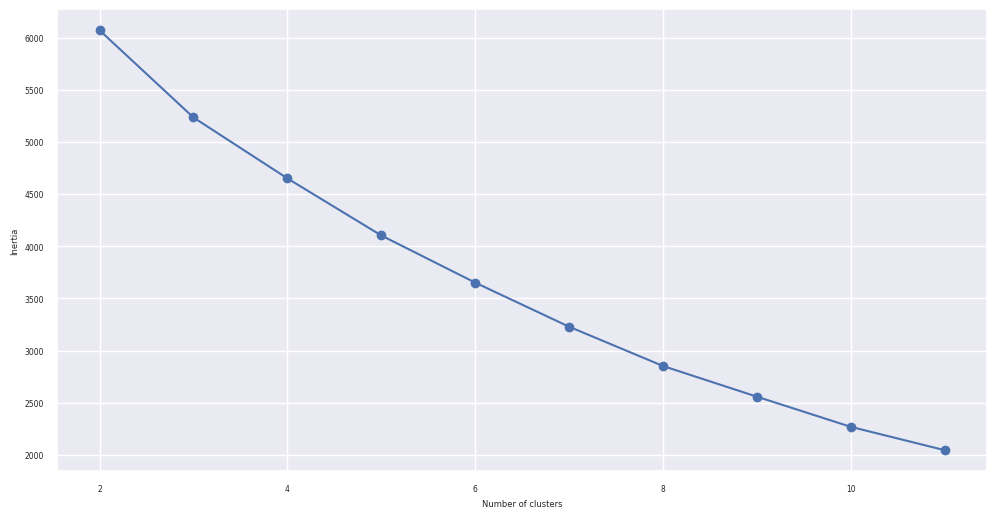

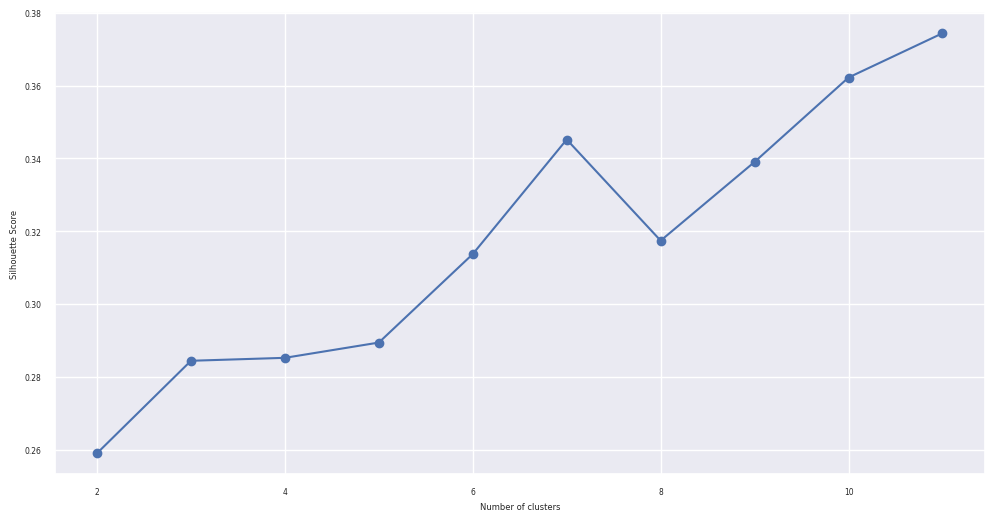

In [ ]:
#Metrics to evaluate our clusters

print("Value Counts: ",value_counts)
print("\nInertia: ",inertia)
print("\nSilhouette Score: ",sil_score)

#Plotting Inertia
frame = pd.DataFrame({'Cluster':num_cluster, 'Inertia':inertia})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Inertia'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

#Plotting Silhoutte Score
frame = pd.DataFrame({'Cluster':num_cluster, 'Silhouette Score':sil_score})

plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Silhouette Score'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

/usr/local/lib/python3.9/dist-packages/pacmap/pacmap.py:819: UserWarning: Warning: random state is set to 42
  warnings.warn(f'Warning: random state is set to {_RANDOM_STATE}')


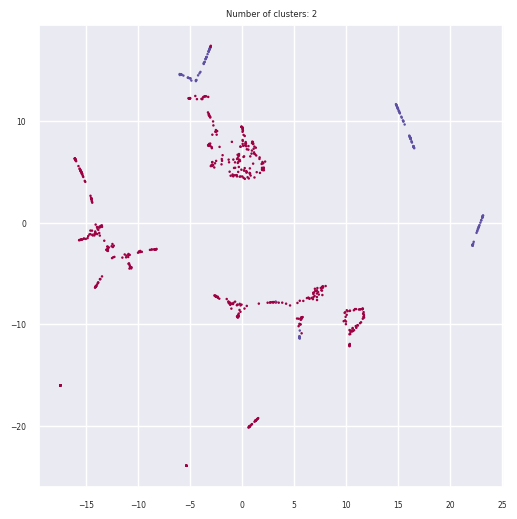

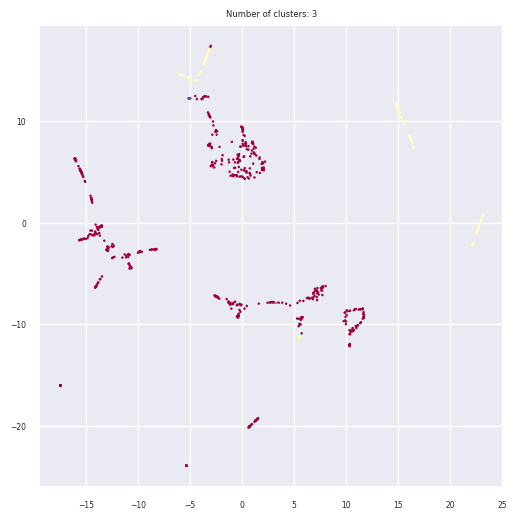

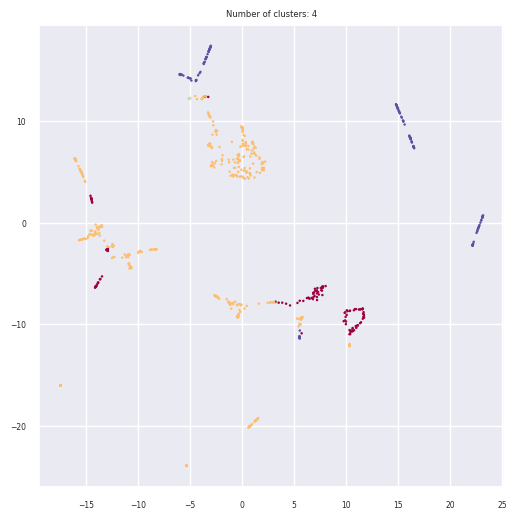

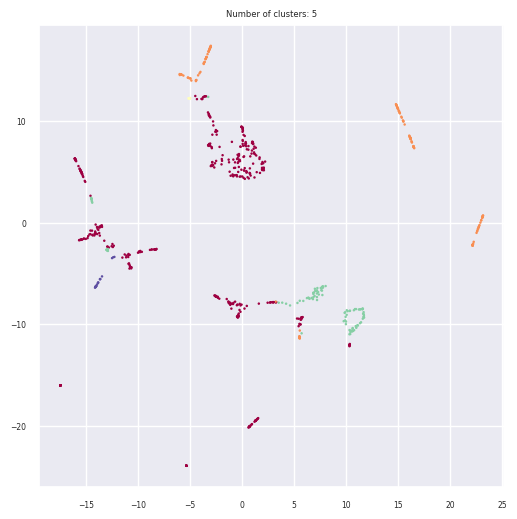

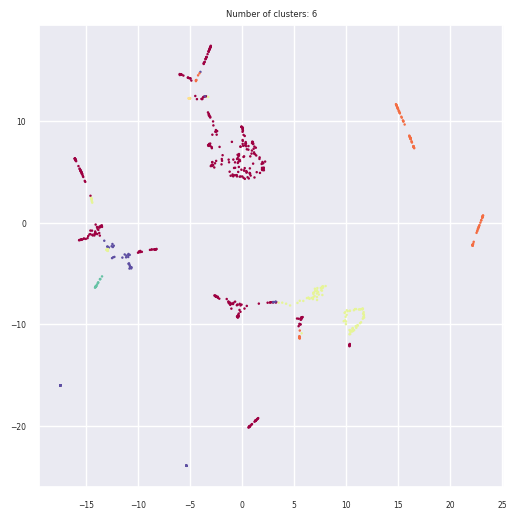

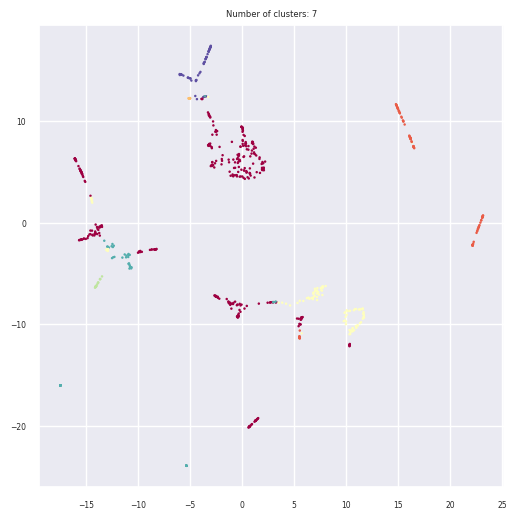

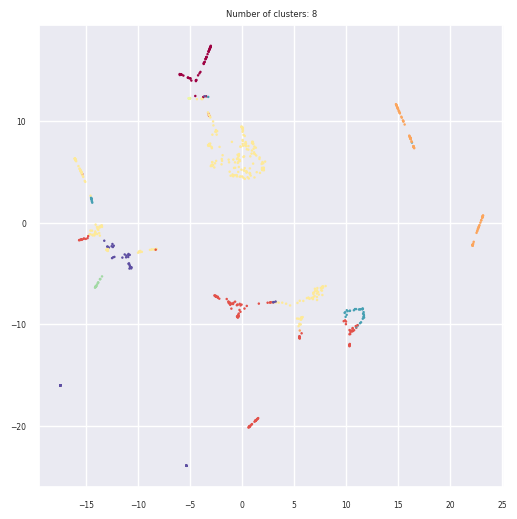

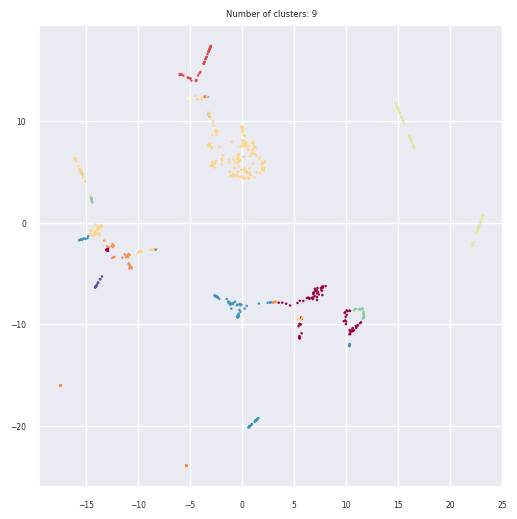

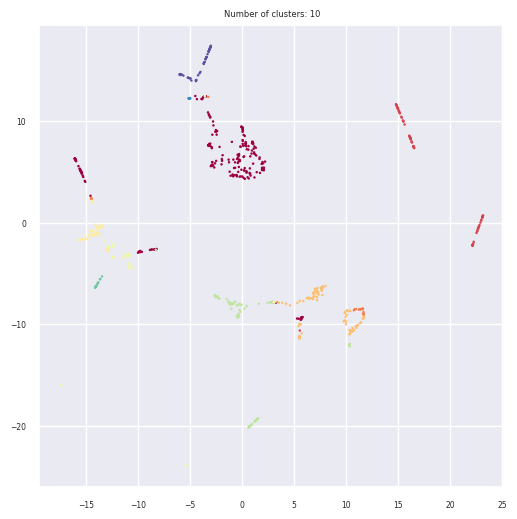

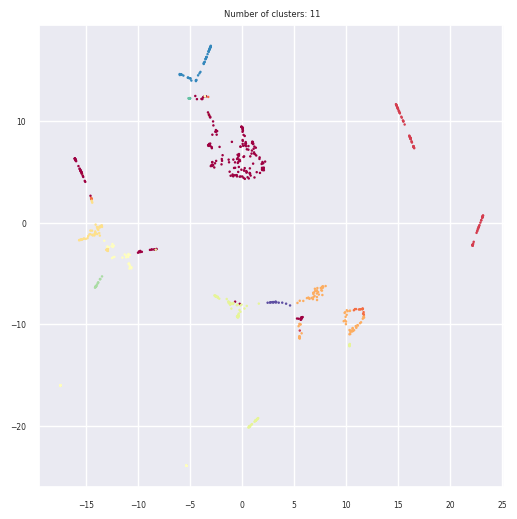

In [ ]:
#pacmap visualization to visualize our clusters in 2D

embedding = pacmap.PaCMAP(random_state=42)
dataInput_scaled_pacmap = embedding.fit_transform(dataInput_scaled, init="pca")

cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252']

# plt.figure(figsize=(84,48))
# plt.subplots_adjust(hspace = 0.5)
# plt.suptitle("PaCMAP 2D visualization")

for cluster in num_cluster:
  # ax = plt.subplot(7,2,cluster-1)
  plt.figure(figsize=(6,6))
  plt.scatter(dataInput_scaled_pacmap[:,0],
            dataInput_scaled_pacmap[:,1],
            cmap = "Spectral",
            c = cluster_in['cluster'+str(cluster)],
            s = 0.6)
  plt.title("Number of clusters: "+str(cluster))

**Best Number of Clusters:** 11 clusters

The elbow method and silhouette score both indicate that 11 clusters is the best number of clusters for input numerical data.

The inertia plot (first plot) shows that there is a elbow (sharp decrease and then increase) at 11. The silhouette score also supports this conclusion as it shows that there is a relatively high silhouette score (a measure of how similar an object is to its own cluster compared to other clusters ) for 11 clusters.

The pacmap (cluster visualization plot) also supports this conclusion.

## By Outputs (Numerical)

In [ ]:
# Keep only chosen columns required for clustering
cluster_out = cluster_raw.copy()
vars_for_clustering = ['waterPermeabilityCoefficient','realRejection',
                       'observedSoluteRejection','solutePermeabilityCoefficient']
dataOutput = cluster_out[vars_for_clustering]

# Scale the data using standard scaling
scaler = StandardScaler()
dataOutput_scaled = scaler.fit_transform(dataOutput)

# Run K-Means clustering on our dataset for k ranging from 2-10
inertia = [] # Stores inertia values for our different k values
value_counts = [] # Stores value counts for our different k values
sil_score = [] # Stores sillhouette score for our different k values

num_cluster = range(2,9)

cluster_predictions = pd.DataFrame()

for cluster in num_cluster:
    kmeans = KMeans(n_clusters = cluster, init='k-means++', random_state = 42)
    kmeans.fit(dataOutput_scaled)
    inertia.append(kmeans.inertia_) #Append inertia values to list

    prediction = kmeans.predict(dataOutput_scaled)
    sil_score.append(silhouette_score(dataOutput_scaled,prediction))

    cluster_predictions[cluster] = prediction
    value_counts.append(cluster_predictions[cluster].value_counts().to_list())
    cluster_out['cluster'+str(cluster)] = prediction #Append cluster prediction to original dataset

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

Value Counts:  [[676, 52], [611, 65, 52], [553, 87, 58, 30], [282, 281, 85, 50, 30], [377, 168, 93, 42, 28, 20], [289, 252, 87, 51, 25, 19, 5], [258, 236, 82, 52, 52, 25, 18, 5]]

Inertia:  [1457.0362419137134, 1016.7858423611057, 625.7200740205462, 520.3435469618659, 436.3849271956425, 373.43276227030486, 324.4858702186495]

Silhouette Score:  [0.7237143245338222, 0.5900830717076357, 0.6163806539359062, 0.3854064148612714, 0.40991495411765705, 0.39433105889449716, 0.4012258660920985]


Text(0, 0.5, 'Silhouette Score')

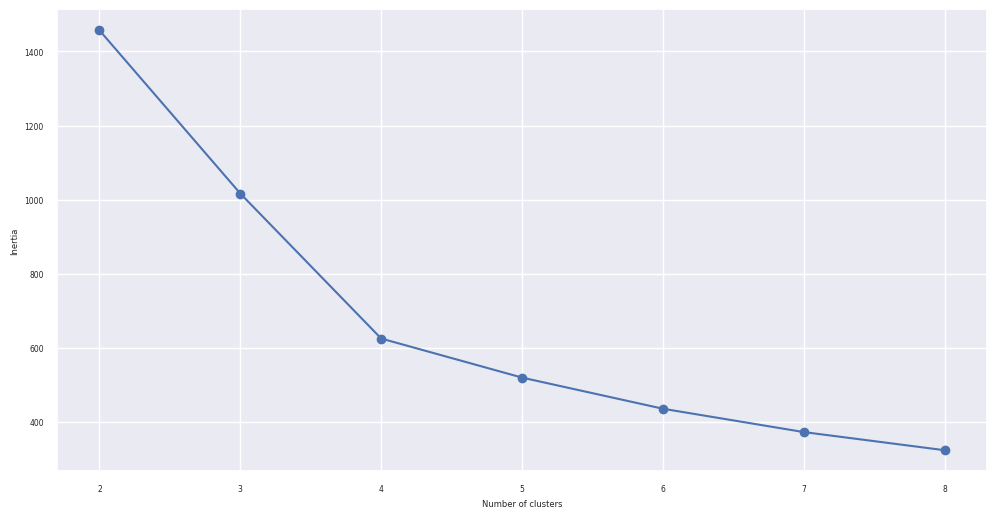

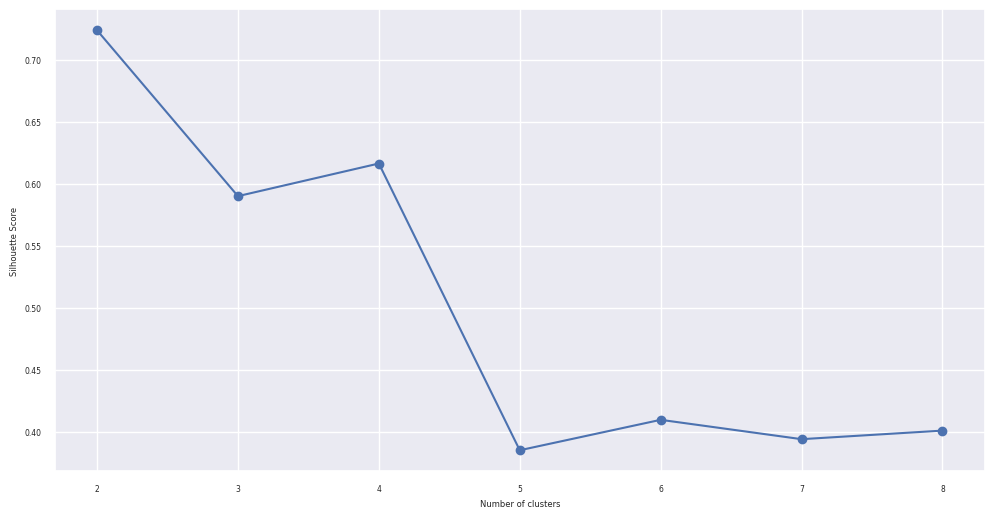

In [ ]:
#Metrics to evaluate our clusters

print("Value Counts: ",value_counts)
print("\nInertia: ",inertia)
print("\nSilhouette Score: ",sil_score)

#Plotting Inertia
frame = pd.DataFrame({'Cluster':num_cluster, 'Inertia':inertia})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Inertia'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

#Plotting Silhoutte Score
frame = pd.DataFrame({'Cluster':num_cluster, 'Silhouette Score':sil_score})

plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Silhouette Score'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

/usr/local/lib/python3.9/dist-packages/pacmap/pacmap.py:819: UserWarning: Warning: random state is set to 42
  warnings.warn(f'Warning: random state is set to {_RANDOM_STATE}')


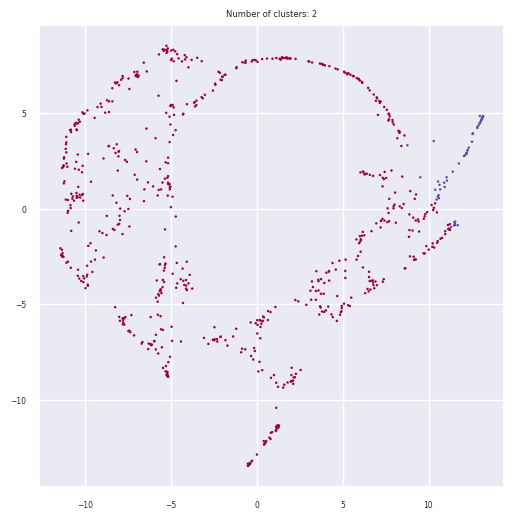

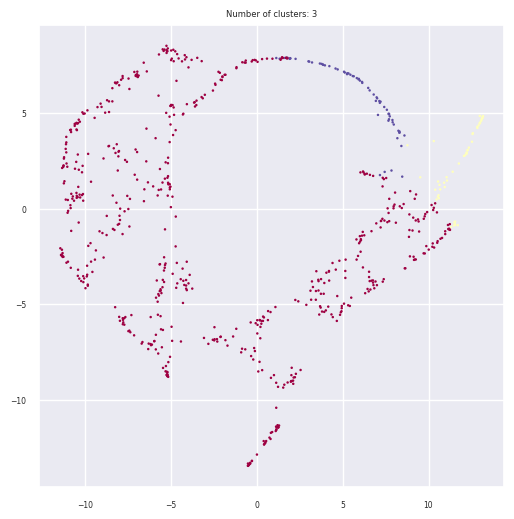

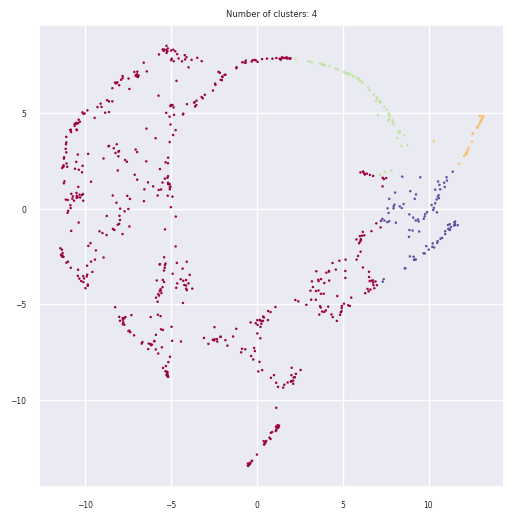

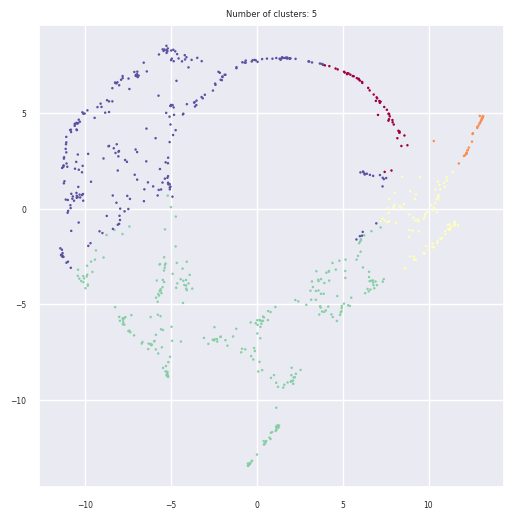

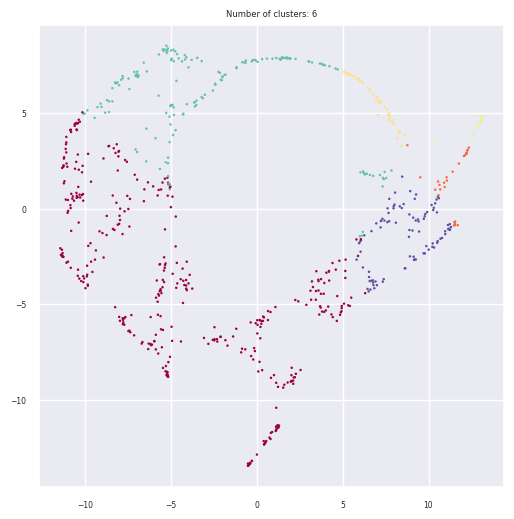

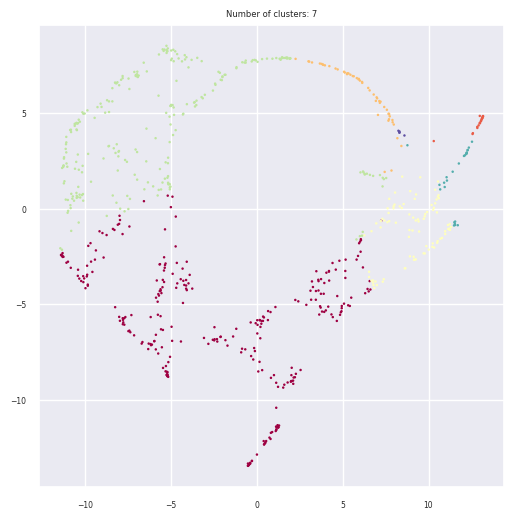

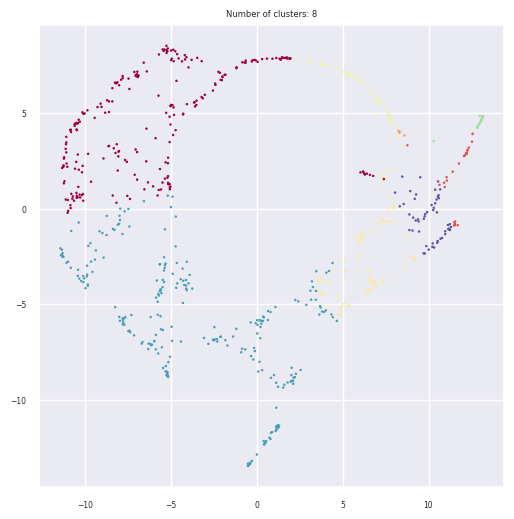

In [ ]:
#pacmap visualization to visualize our clusters in 2D

embedding = pacmap.PaCMAP(random_state=42)
dataOutput_scaled_pacmap = embedding.fit_transform(dataOutput_scaled, init="pca")

cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252']

# plt.figure(figsize=(84,48))
# plt.subplots_adjust(hspace = 0.5)
# plt.suptitle("PaCMAP 2D visualization")

for cluster in num_cluster:
  # ax = plt.subplot(7,2,cluster-1)
  plt.figure(figsize=(6,6))
  plt.scatter(dataOutput_scaled_pacmap[:,0],
            dataOutput_scaled_pacmap[:,1],
            cmap = "Spectral",
            c = cluster_out['cluster'+str(cluster)],
            s = 0.6)
  plt.title("Number of clusters: "+str(cluster))

**Best Number of Clusters:** 8 clusters

The elbow method and silhouette score both indicate that 4 clusters is the best number of clusters for input numerical data. However, since the clusters do not seem to cluster the data in the pacmaps, we have to go with a different amount of clusters.

The inertia plot shows that there is a elbow at 8 clusters. The pacmaps support this conclusion, logically separating the data into clusters.

## By All (Numerical)

In [ ]:
# Keep only chosen columns required for clustering
cluster_all = cluster_raw.copy()
vars_for_clustering = ['Water/Salt-Selectivity',
       'saltConcentration', 'pressureDiff',
       'concentrationPolarization', 'structureNumerical', 'chemistryNumerical',
       'modificationNumerical', 'otherSolutesNumerical',
       'filtrationModeNumerical', 'cpModeNumerical',
       'waterPermeabilityCoefficient','realRejection',
       'observedSoluteRejection','solutePermeabilityCoefficient']
dataAll = cluster_all[vars_for_clustering]

# Scale the data using standard scaling
scaler = StandardScaler()
dataAll_scaled = scaler.fit_transform(dataAll)

# Run K-Means clustering on our dataset for k ranging from 2-10
inertia = [] # Stores inertia values for our different k values
value_counts = [] # Stores value counts for our different k values
sil_score = [] # Stores sillhouette score for our different k values

num_cluster = range(2,12)

cluster_predictions = pd.DataFrame()

for cluster in num_cluster:
    kmeans = KMeans(n_clusters = cluster, init='k-means++', random_state = 42)
    kmeans.fit(dataAll_scaled)
    inertia.append(kmeans.inertia_) #Append inertia values to list

    prediction = kmeans.predict(dataAll_scaled)
    sil_score.append(silhouette_score(dataAll_scaled,prediction))

    cluster_predictions[cluster] = prediction
    value_counts.append(cluster_predictions[cluster].value_counts().to_list())
    cluster_all['cluster'+str(cluster)] = prediction #Append cluster prediction to original dataset


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

Value Counts:  [[667, 61], [520, 149, 59], [511, 149, 59, 9], [438, 143, 80, 58, 9], [371, 176, 93, 58, 21, 9], [270, 194, 104, 83, 47, 21, 9], [345, 97, 84, 81, 58, 34, 20, 9], [282, 131, 92, 57, 55, 53, 29, 20, 9], [245, 118, 89, 57, 55, 53, 53, 29, 20, 9], [209, 95, 88, 87, 55, 53, 49, 32, 31, 20, 9]]

Inertia:  [8371.463775321185, 7168.20536950256, 6330.254329096157, 5751.599169460298, 5329.46733249341, 4843.722856839726, 4408.61896276765, 4007.260736040432, 3639.8081135912603, 3337.993773678417]

Silhouette Score:  [0.39832818941374953, 0.24282220371555316, 0.26585347750082866, 0.2414129954974513, 0.2058889163710809, 0.22526097046202362, 0.259560800054446, 0.25792404641232713, 0.27831874642448073, 0.28319927036169357]


Text(0, 0.5, 'Silhouette Score')

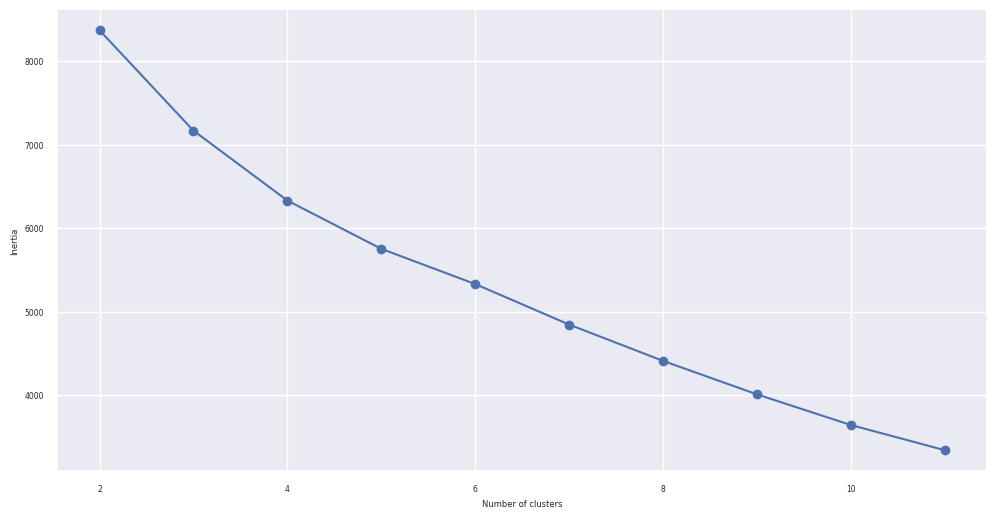

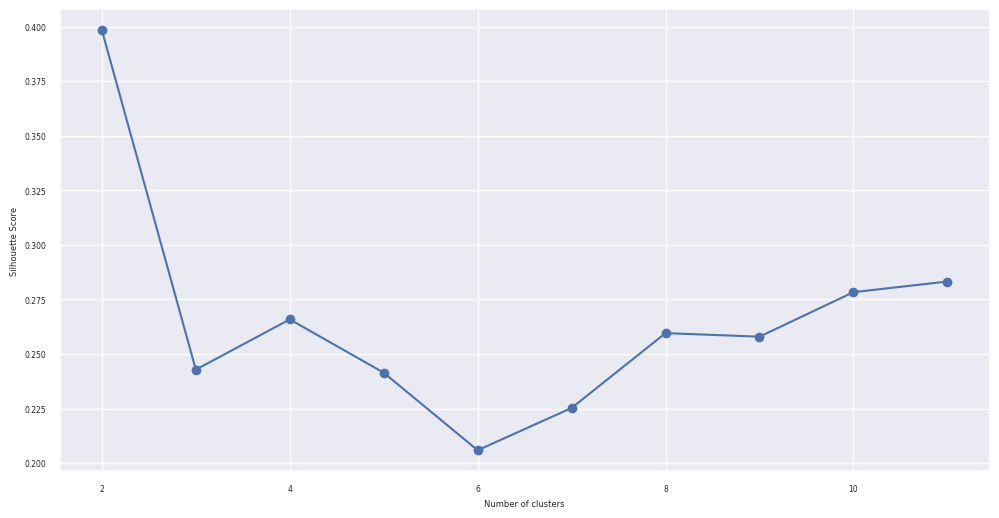

In [ ]:
#Metrics to evaluate our clusters

print("Value Counts: ",value_counts)
print("\nInertia: ",inertia)
print("\nSilhouette Score: ",sil_score)

#Plotting Inertia
frame = pd.DataFrame({'Cluster':num_cluster, 'Inertia':inertia})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Inertia'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

#Plotting Silhoutte Score
frame = pd.DataFrame({'Cluster':num_cluster, 'Silhouette Score':sil_score})

plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Silhouette Score'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

/usr/local/lib/python3.9/dist-packages/pacmap/pacmap.py:819: UserWarning: Warning: random state is set to 42
  warnings.warn(f'Warning: random state is set to {_RANDOM_STATE}')


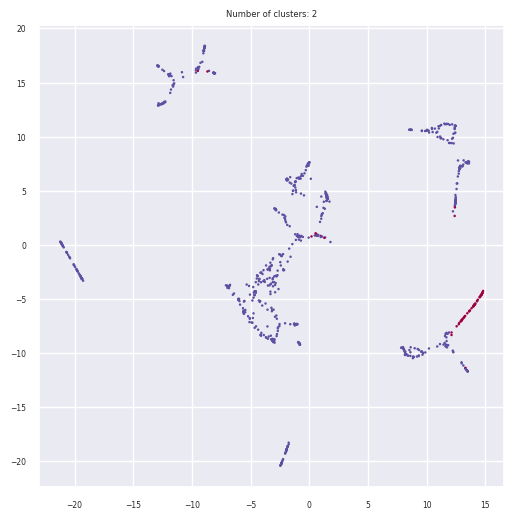

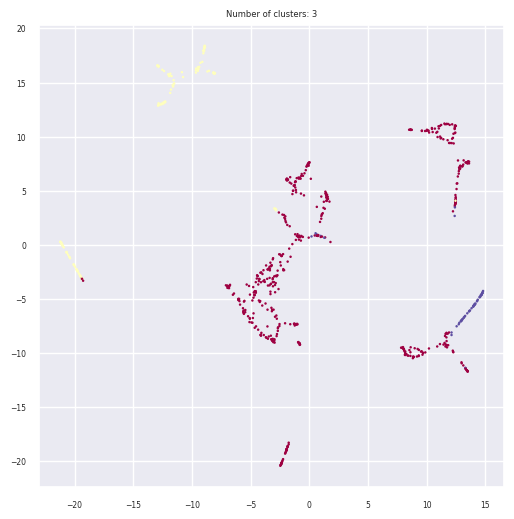

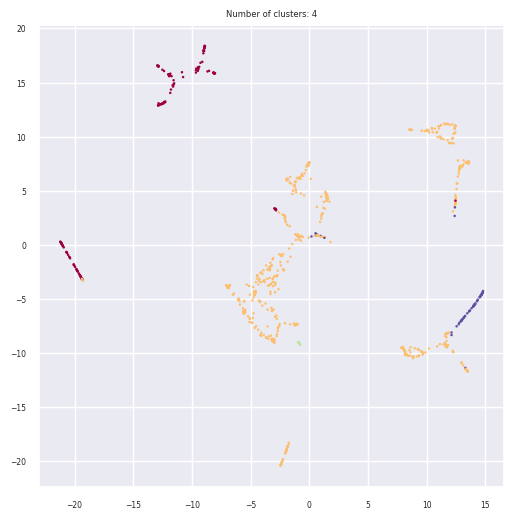

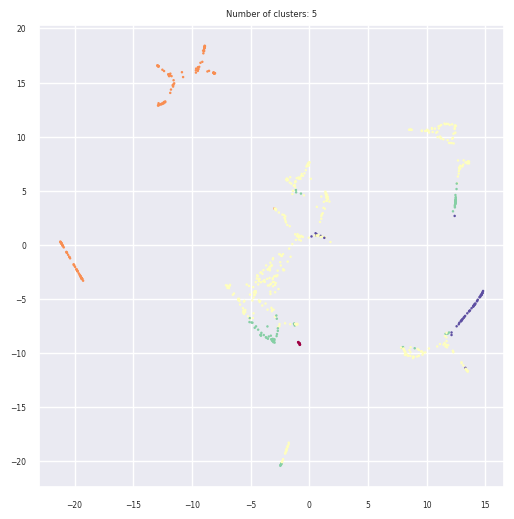

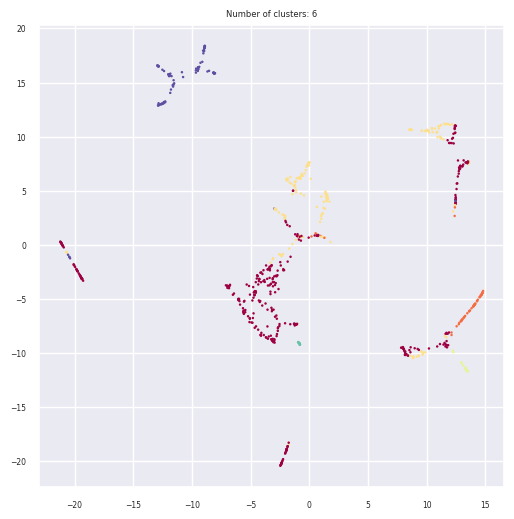

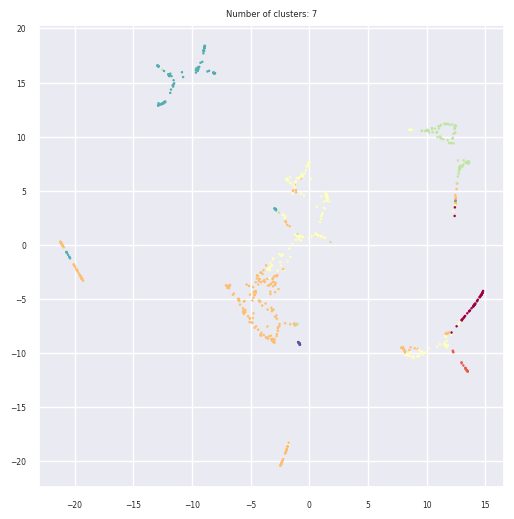

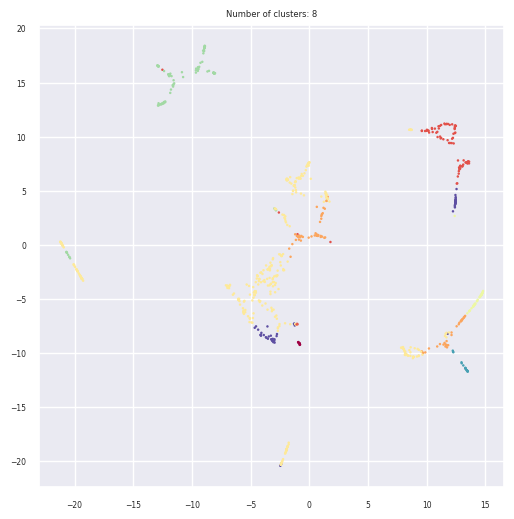

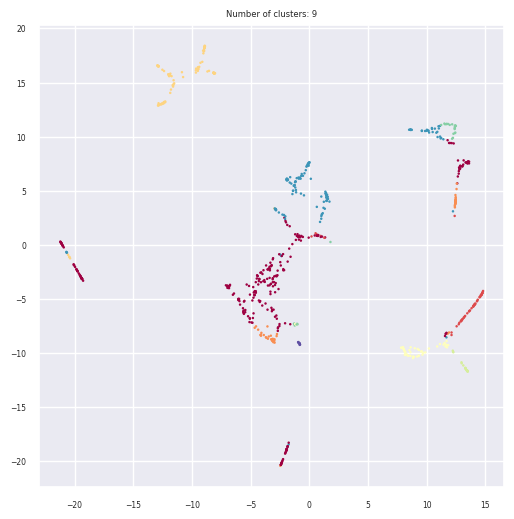

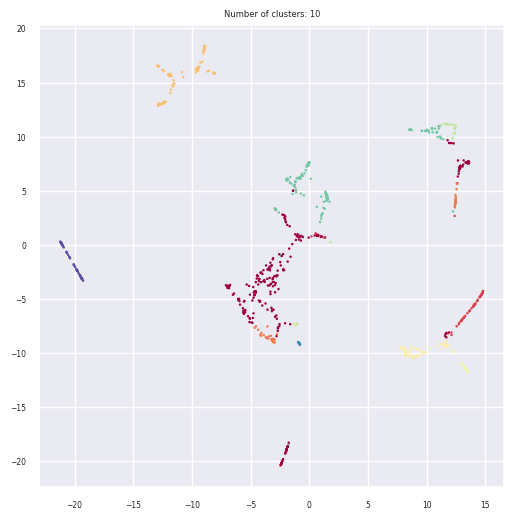

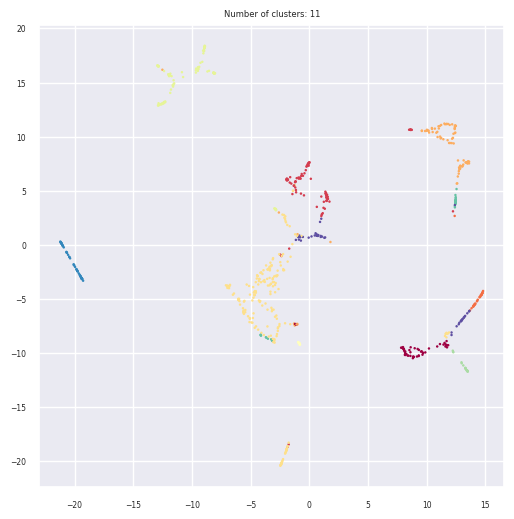

In [ ]:
#pacmap visualization to visualize our clusters in 2D

embedding = pacmap.PaCMAP(random_state=42)
dataAll_scaled_pacmap = embedding.fit_transform(dataAll_scaled, init="pca")

cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252']

# plt.figure(figsize=(84,48))
# plt.subplots_adjust(hspace = 0.5)
# plt.suptitle("PaCMAP 2D visualization")

for cluster in num_cluster:
  # ax = plt.subplot(7,2,cluster-1)
  plt.figure(figsize=(6,6))
  plt.scatter(dataAll_scaled_pacmap[:,0],
            dataAll_scaled_pacmap[:,1],
            cmap = "Spectral",
            c = cluster_all['cluster'+str(cluster)],
            s = 0.6)
  plt.title("Number of clusters: "+str(cluster))

**Best Number of Clusters:** 11 clusters

The elbow method indicates that 5 clusters is the best number of clusters for input numerical data. However, since the clusters do not seem to cluster the data in the pacmaps, we have to go with a different amount of clusters.

The inertia plot shows that there is a elbow at 11 clusters and it also has a high shilouete score. The pacmaps support this conclusion, logically separating the data into clusters.

## By Inputs (Rank)

In [ ]:
# Keep only chosen columns required for clustering
cluster_inr = cluster_raw.copy()
vars_for_clustering = ['Water/Salt-SelectivityRank',
       'pressureDiffRank', 'saltConcentrationRank',
       'concentrationPolarizationRank']
dataInputRank = cluster_inr[vars_for_clustering]

# Scale the data using standard scaling
scaler = StandardScaler()
dataInputRank_scaled = scaler.fit_transform(dataInputRank)

# Run K-Means clustering on our dataset for k ranging from 2-10
inertia = [] # Stores inertia values for our different k values
value_counts = [] # Stores value counts for our different k values
sil_score = [] # Stores sillhouette score for our different k values

num_cluster = range(2,6)

cluster_predictions = pd.DataFrame()

for cluster in num_cluster:
    kmeans = KMeans(n_clusters = cluster, init='k-means++', random_state = 42)
    kmeans.fit(dataInputRank_scaled)
    inertia.append(kmeans.inertia_) #Append inertia values to list

    prediction = kmeans.predict(dataInputRank_scaled)
    sil_score.append(silhouette_score(dataInputRank_scaled,prediction))

    cluster_predictions[cluster] = prediction
    value_counts.append(cluster_predictions[cluster].value_counts().to_list())
    cluster_inr['cluster'+str(cluster)] = prediction #Append cluster prediction to original dataset

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Value Counts:  [[533, 195], [293, 259, 176], [244, 210, 165, 109], [199, 192, 146, 107, 84]]

Inertia:  [1950.420416801046, 1475.7947006306583, 1207.3293417696436, 982.6638569406238]

Silhouette Score:  [0.349232386725712, 0.3112314498413202, 0.3120676424986202, 0.3440764545107428]


Text(0, 0.5, 'Silhouette Score')

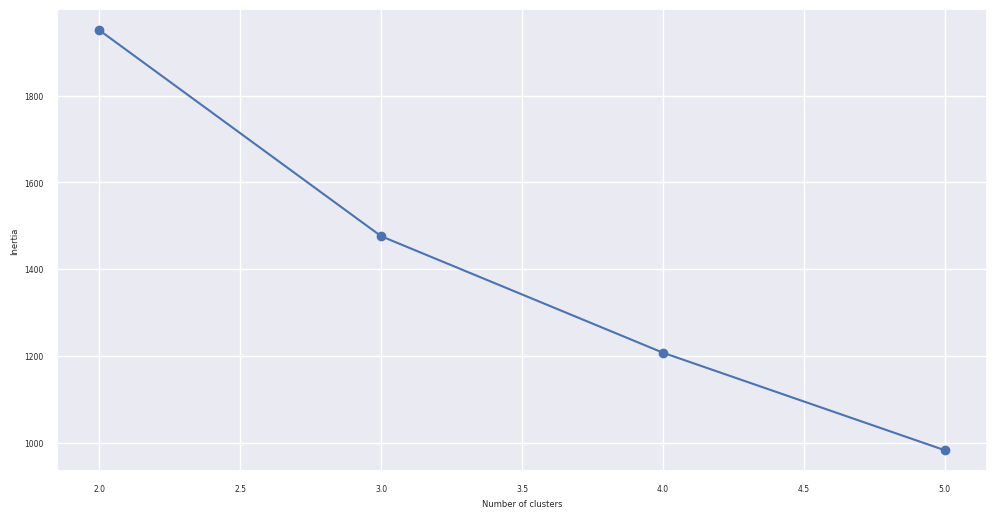

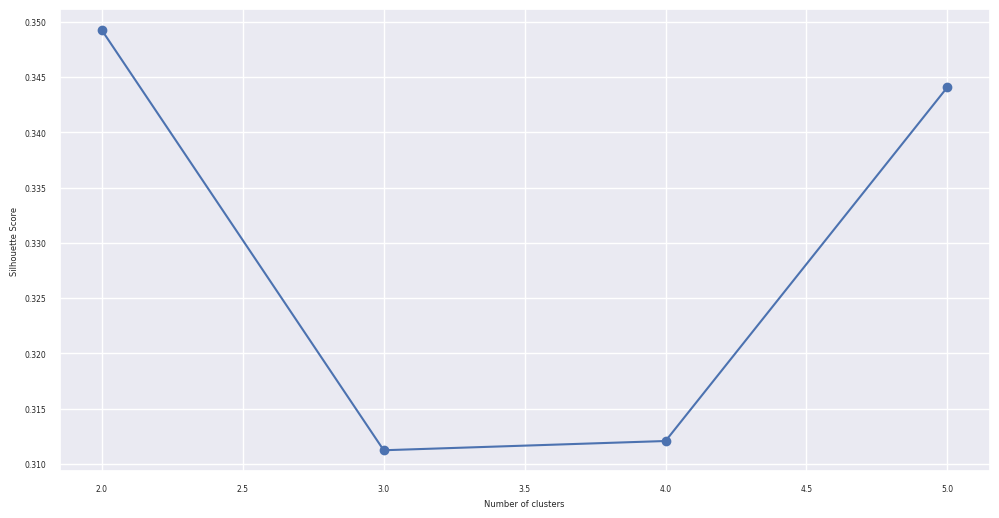

In [ ]:
#Metrics to evaluate our clusters

print("Value Counts: ",value_counts)
print("\nInertia: ",inertia)
print("\nSilhouette Score: ",sil_score)

#Plotting Inertia
frame = pd.DataFrame({'Cluster':num_cluster, 'Inertia':inertia})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Inertia'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

#Plotting Silhoutte Score
frame = pd.DataFrame({'Cluster':num_cluster, 'Silhouette Score':sil_score})

plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Silhouette Score'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

/usr/local/lib/python3.9/dist-packages/pacmap/pacmap.py:819: UserWarning: Warning: random state is set to 42
  warnings.warn(f'Warning: random state is set to {_RANDOM_STATE}')


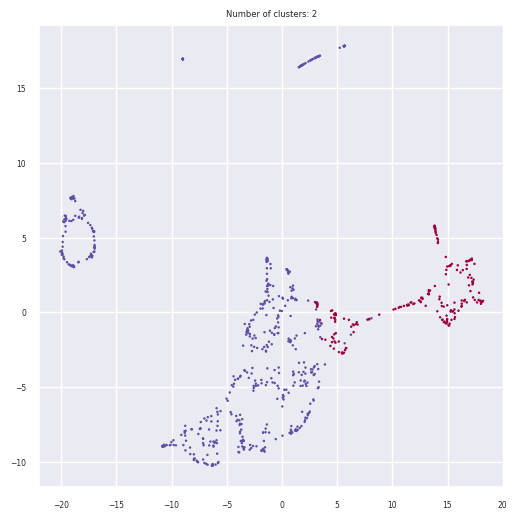

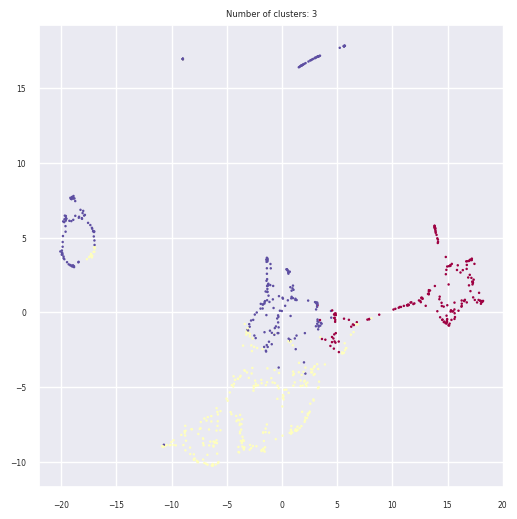

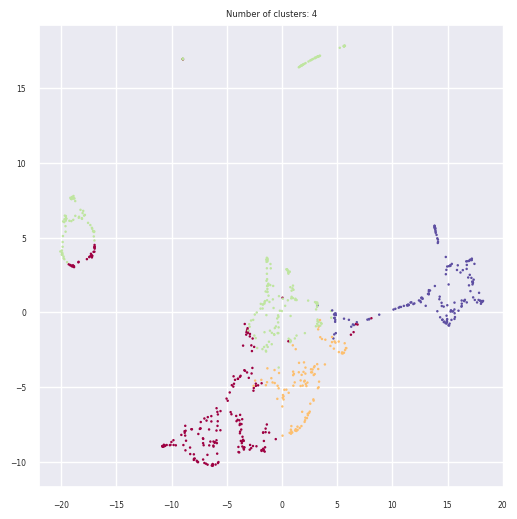

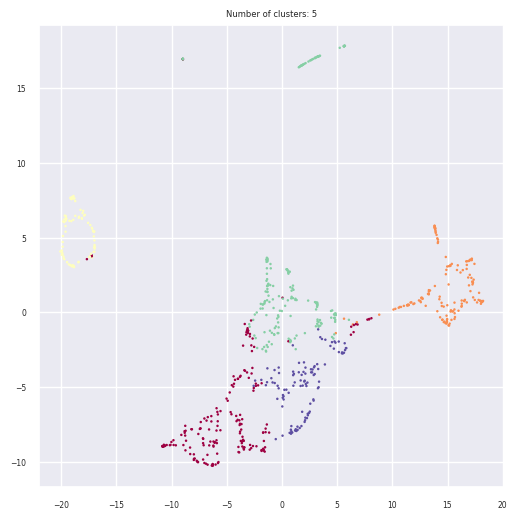

In [ ]:
#pacmap visualization to visualize our clusters in 2D

embedding = pacmap.PaCMAP(random_state=42)
dataInputRank_scaled_pacmap = embedding.fit_transform(dataInputRank_scaled, init="pca")

cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252']

# plt.figure(figsize=(84,48))
# plt.subplots_adjust(hspace = 0.5)
# plt.suptitle("PaCMAP 2D visualization")

for cluster in num_cluster:
  # ax = plt.subplot(7,2,cluster-1)
  plt.figure(figsize=(6,6))
  plt.scatter(dataInputRank_scaled_pacmap[:,0],
            dataInputRank_scaled_pacmap[:,1],
            cmap = "Spectral",
            c = cluster_inr['cluster'+str(cluster)],
            s = 0.6)
  plt.title("Number of clusters: "+str(cluster))

**Best Number of Clusters:** 5 clusters

The elbow method and silhouette score both indicate that 5 clusters is the best number of clusters for input numerical data.

The inertia plot shows that there is a elbow at 5. The silhouette score also supports this cocnclusion as it shows that there is a relatively high silhouette score for 5 clusters.

The pacmap also supports this conclusion.

## By Outputs (Rank)

In [ ]:
# Keep only chosen columns required for clustering
cluster_outr = cluster_raw.copy()
vars_for_clustering = ["waterPermeabilityCoefficientRank", "solutePermeabilityCoefficientRank",
                       "realRejectionRank", "observedSoluteRejectionRank"]
dataOutputRank = cluster_outr[vars_for_clustering]

# Scale the data using standard scaling
scaler = StandardScaler()
dataOutputRank_scaled = scaler.fit_transform(dataOutputRank)

# Run K-Means clustering on our dataset for k ranging from 2-10
inertia = [] # Stores inertia values for our different k values
value_counts = [] # Stores value counts for our different k values
sil_score = [] # Stores sillhouette score for our different k values

num_cluster = range(2,8)#range(2,16)

cluster_predictions = pd.DataFrame()

for cluster in num_cluster:
    kmeans = KMeans(n_clusters = cluster, init='k-means++', random_state = 42)
    kmeans.fit(dataOutputRank_scaled)
    inertia.append(kmeans.inertia_) #Append inertia values to list

    prediction = kmeans.predict(dataOutputRank_scaled)
    sil_score.append(silhouette_score(dataOutputRank_scaled,prediction))

    cluster_predictions[cluster] = prediction
    value_counts.append(cluster_predictions[cluster].value_counts().to_list())
    cluster_outr['cluster'+str(cluster)] = prediction #Append cluster prediction to original dataset


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

Value Counts:  [[460, 268], [368, 206, 154], [284, 155, 154, 135], [175, 151, 141, 133, 128], [151, 135, 134, 114, 100, 94], [148, 124, 113, 113, 87, 75, 68]]

Inertia:  [1501.1775130687442, 1096.842794228197, 802.5919230772324, 673.1542486096148, 563.4783770821708, 483.30668900721827]

Silhouette Score:  [0.42930298057751826, 0.37997993875484115, 0.38535894254701825, 0.33969662907326575, 0.3437646565459075, 0.35270230722240403]


Text(0, 0.5, 'Silhouette Score')

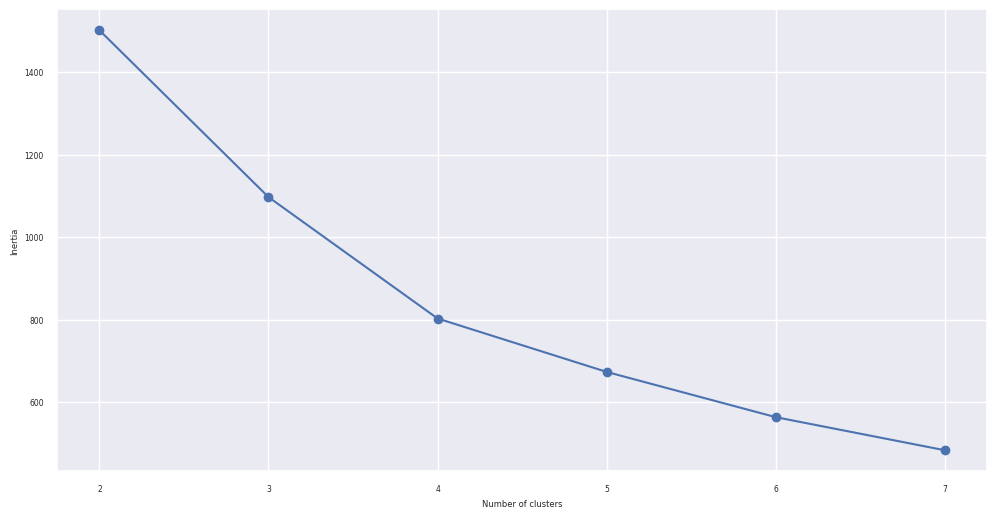

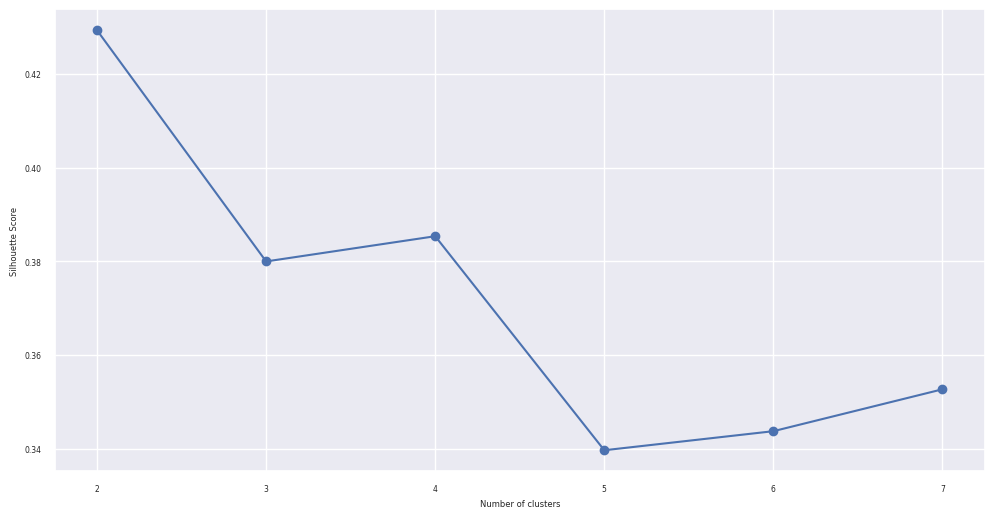

In [ ]:
#Metrics to evaluate our clusters

print("Value Counts: ",value_counts)
print("\nInertia: ",inertia)
print("\nSilhouette Score: ",sil_score)

#Plotting Inertia
frame = pd.DataFrame({'Cluster':num_cluster, 'Inertia':inertia})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Inertia'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

#Plotting Silhoutte Score
frame = pd.DataFrame({'Cluster':num_cluster, 'Silhouette Score':sil_score})

plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Silhouette Score'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

/usr/local/lib/python3.9/dist-packages/pacmap/pacmap.py:819: UserWarning: Warning: random state is set to 42
  warnings.warn(f'Warning: random state is set to {_RANDOM_STATE}')


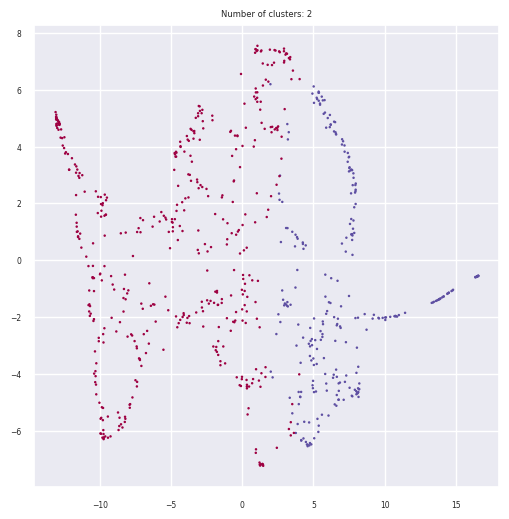

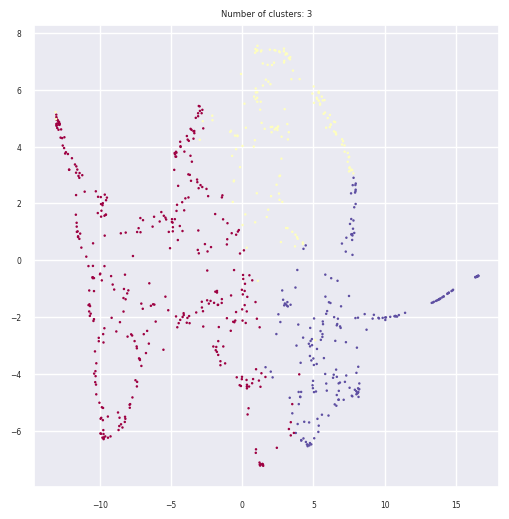

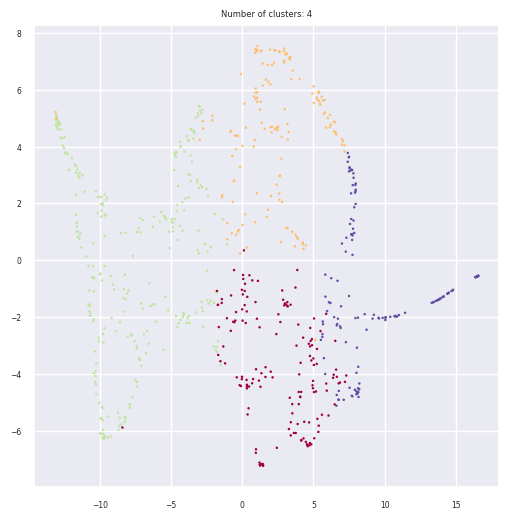

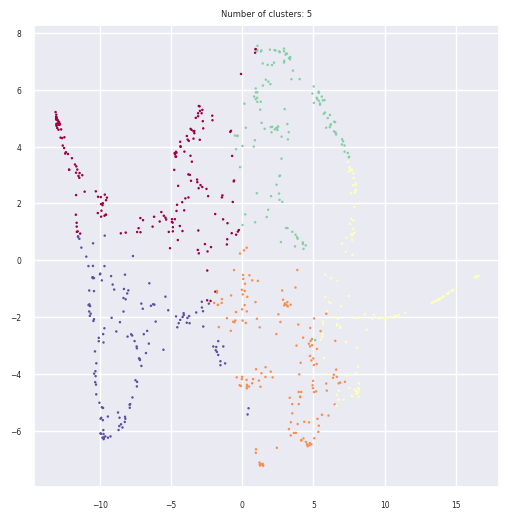

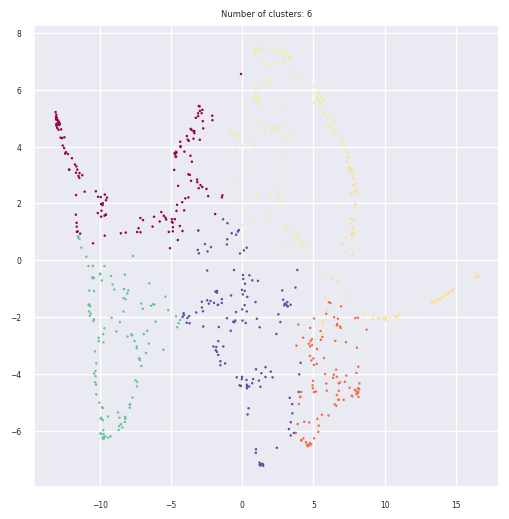

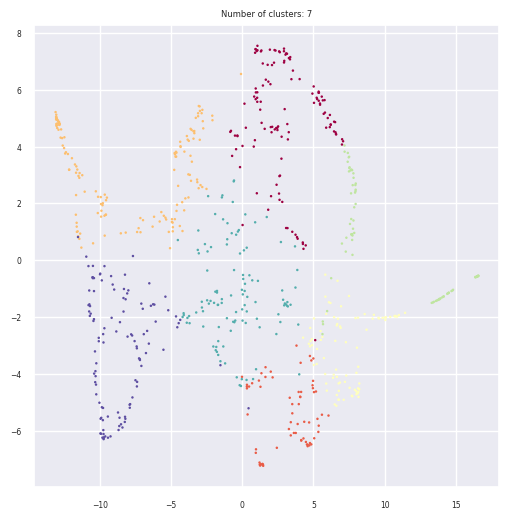

In [ ]:
#pacmap visualization to visualize our clusters in 2D

embedding = pacmap.PaCMAP(random_state=42)
dataOutputRank_scaled_pacmap = embedding.fit_transform(dataOutputRank_scaled, init="pca")

cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252']

# plt.figure(figsize=(84,48))
# plt.subplots_adjust(hspace = 0.5)
# plt.suptitle("PaCMAP 2D visualization")

for cluster in num_cluster:
  # ax = plt.subplot(7,2,cluster-1)
  plt.figure(figsize=(6,6))
  plt.scatter(dataOutputRank_scaled_pacmap[:,0],
            dataOutputRank_scaled_pacmap[:,1],
            cmap = "Spectral",
            c = cluster_outr['cluster'+str(cluster)],
            s = 0.6)
  plt.title("Number of clusters: "+str(cluster))

**Best Number of Clusters:** 7 clusters

The elbow method and silhouette score both indicate that 4 clusters is the best number of clusters for input numerical data. However, since the clusters do not seem to cluster the data in the pacmaps, we have to go with a different amount of clusters.

The inertia plot shows that there is a elbow at 7 clusters. The pacmaps support this conclusion, logically separating the data into clusters.

## By All (Rank)

In [ ]:
# Keep only chosen columns required for clustering
cluster_allr = cluster_raw.copy()
vars_for_clustering = ['Water/Salt-SelectivityRank', 'saltConcentrationRank', 'pressureDiffRank',
       'concentrationPolarizationRank', "waterPermeabilityCoefficientRank",
       "solutePermeabilityCoefficientRank", "realRejectionRank", "observedSoluteRejectionRank"]
dataAllRank = cluster_allr[vars_for_clustering]

# Scale the data using standard scaling
scaler = StandardScaler()
dataAllRank_scaled = scaler.fit_transform(dataAllRank)

# Run K-Means clustering on our dataset for k ranging from 2-10
inertia = [] # Stores inertia values for our different k values
value_counts = [] # Stores value counts for our different k values
sil_score = [] # Stores sillhouette score for our different k values

num_cluster = range(2,8)

cluster_predictions = pd.DataFrame()

for cluster in num_cluster:
    kmeans = KMeans(n_clusters = cluster, init='k-means++', random_state = 42)
    kmeans.fit(dataAllRank_scaled)
    inertia.append(kmeans.inertia_) #Append inertia values to list

    prediction = kmeans.predict(dataAllRank_scaled)
    sil_score.append(silhouette_score(dataAllRank_scaled,prediction))

    cluster_predictions[cluster] = prediction
    value_counts.append(cluster_predictions[cluster].value_counts().to_list())
    cluster_allr['cluster'+str(cluster)] = prediction #Append cluster prediction to original dataset


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

Value Counts:  [[421, 307], [303, 246, 179], [263, 165, 155, 145], [169, 164, 153, 138, 104], [157, 135, 127, 118, 98, 93], [149, 127, 125, 112, 90, 78, 47]]

Inertia:  [3941.041957346504, 3207.072646362635, 2643.880140977578, 2211.1602275628125, 1950.951735668079, 1756.1877749538235]

Silhouette Score:  [0.2961753651960622, 0.27767420051789754, 0.2799527298619641, 0.2928509801529287, 0.30269752838589337, 0.31248017198854966]


Text(0, 0.5, 'Silhouette Score')

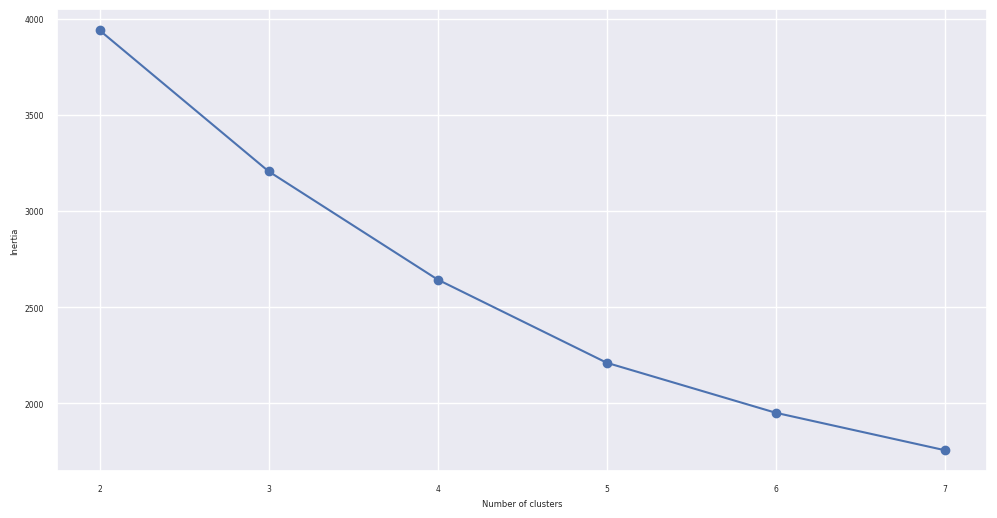

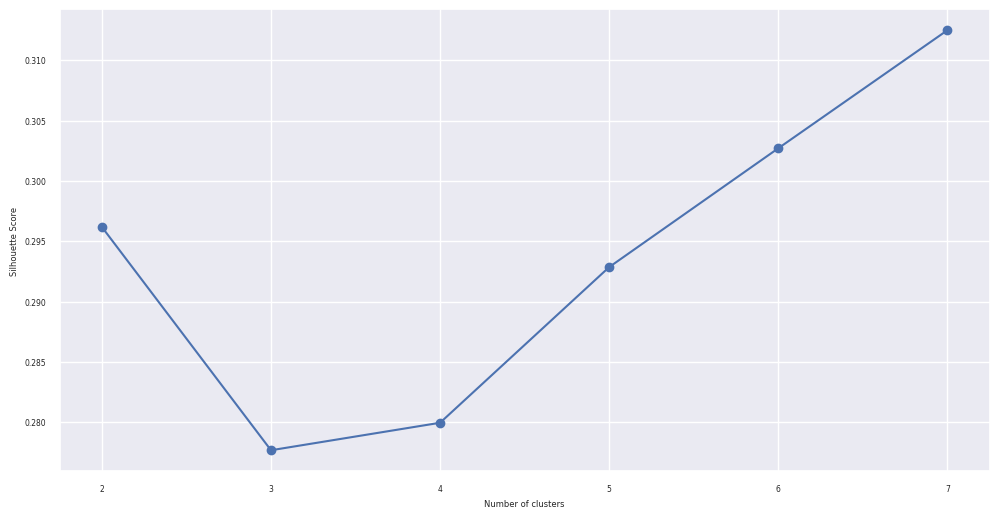

In [ ]:
#Metrics to evaluate our clusters

print("Value Counts: ",value_counts)
print("\nInertia: ",inertia)
print("\nSilhouette Score: ",sil_score)

#Plotting Inertia
frame = pd.DataFrame({'Cluster':num_cluster, 'Inertia':inertia})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Inertia'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

#Plotting Silhoutte Score
frame = pd.DataFrame({'Cluster':num_cluster, 'Silhouette Score':sil_score})

plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['Silhouette Score'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

/usr/local/lib/python3.9/dist-packages/pacmap/pacmap.py:819: UserWarning: Warning: random state is set to 42
  warnings.warn(f'Warning: random state is set to {_RANDOM_STATE}')


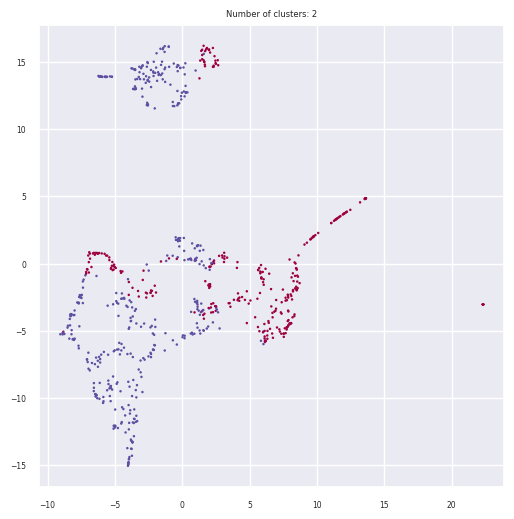

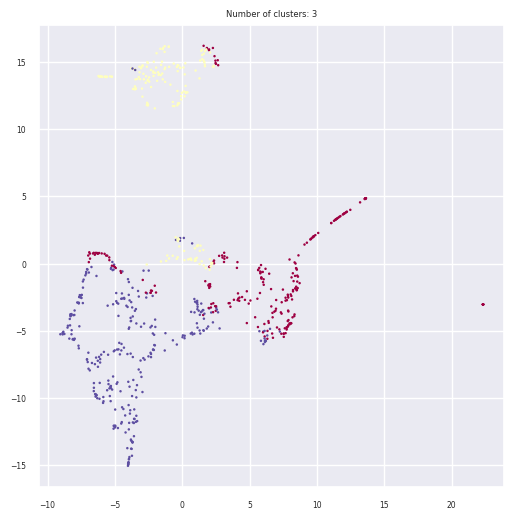

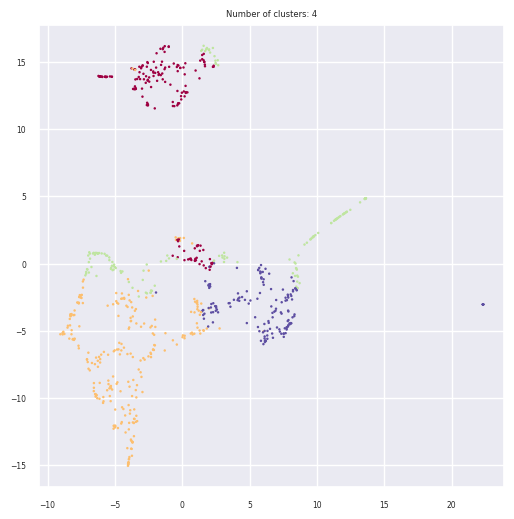

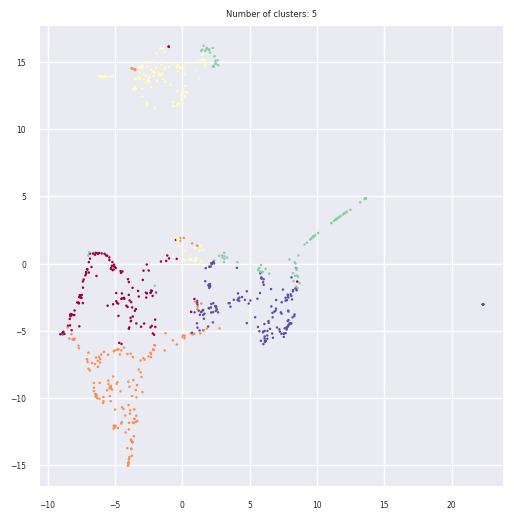

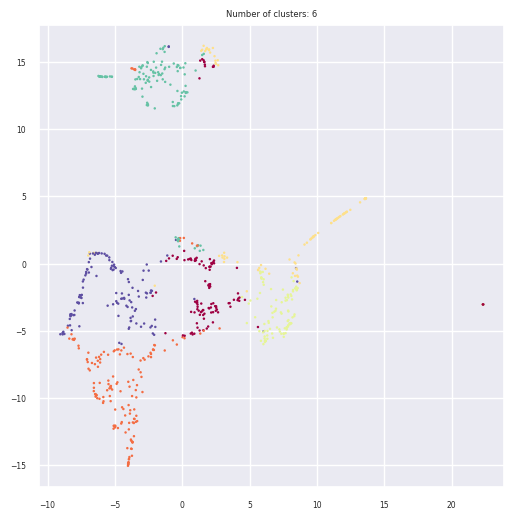

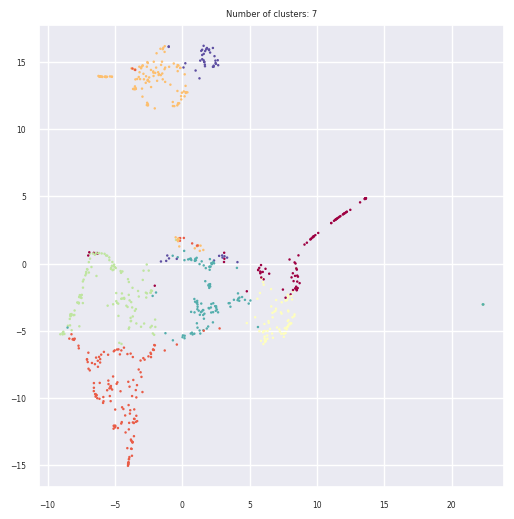

In [ ]:
#pacmap visualization to visualize our clusters in 2D

embedding = pacmap.PaCMAP(random_state=42)
dataAllRank_scaled_pacmap = embedding.fit_transform(dataAllRank_scaled, init="pca")

cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252']

# plt.figure(figsize=(84,48))
# plt.subplots_adjust(hspace = 0.5)
# plt.suptitle("PaCMAP 2D visualization")

for cluster in num_cluster:
  # ax = plt.subplot(7,2,cluster-1)
  plt.figure(figsize=(6,6))
  plt.scatter(dataAllRank_scaled_pacmap[:,0],
            dataAllRank_scaled_pacmap[:,1],
            cmap = "Spectral",
            c = cluster_allr['cluster'+str(cluster)],
            s = 0.6)
  plt.title("Number of clusters: "+str(cluster))

**Best Number of Clusters:** 7 clusters

The elbow method and silhouette score both indicate that 7 clusters is the best number of clusters for input numerical data.

The inertia plot shows that there is a elbow at 7. The silhouette score also supports this cocnclusion as it shows that there is a very high silhouette score for 7 clusters.

The pacmap also supports this conclusion.

#Cluster Profiling

##For Inputs (Numerical)

In [ ]:
cluster_in.head(1)

,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,filtrationMode,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank,averageEfficiencyRank,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9,cluster10,cluster11
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.8,99.7,Cross-flow,0.03422,CP calculated assuming kf = 100,1.51,26.09,3,4,15,0,0,1,97.0,80.0,21.0,192.0,14.0,19.0,109.0,83.0,76.875,0,0,1,0,0,0,1,7,6,6


In [ ]:
sns.set(rc={'figure.figsize':(14,6)})

###Profiling for Water Permeability Coefficient



<Axes: xlabel='cluster11', ylabel='waterPermeabilityCoefficientRank'>

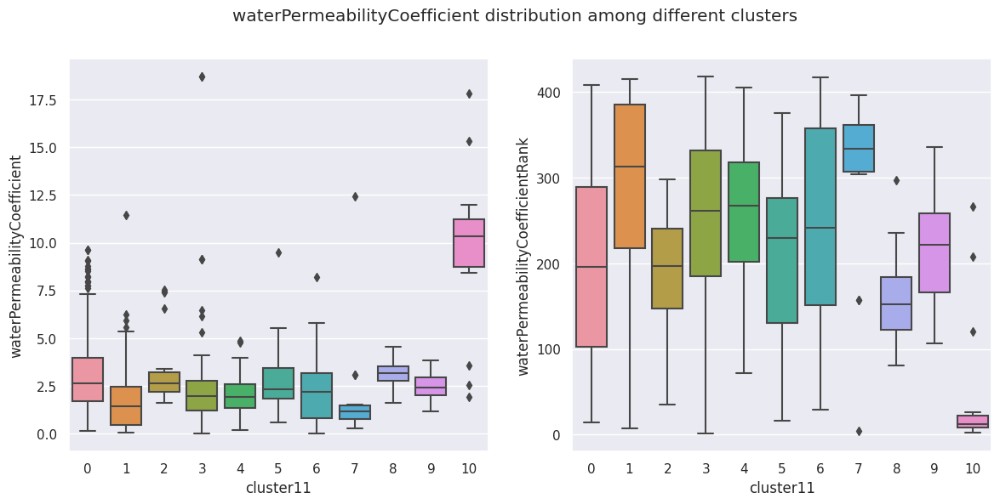

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("waterPermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='waterPermeabilityCoefficient', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='waterPermeabilityCoefficientRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'waterPermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficient                                    \
                                 count      min      mean    max  median   
cluster11                                                                  
0                                  232  0.14000  3.166361   9.63   2.655   
1                                   89  0.05000  1.898169  11.44   1.430   
2                                   22  1.60000  3.352273   7.54   2.640   
3                                   86  0.00160  2.569902  18.69   1.985   
4                                   49  0.19000  2.017755   4.87   1.930   
5                                   63  0.57000  2.569627   9.50   2.310   
6                                   89  0.03000  2.154404   8.19   2.180   
7                                   18  0.29000  1.853333  12.44   1.170   
8                                    9  1.60497  3.087199   4.53   3.160   
9                                   54  1.15000  2.414444   3.86   2.405   
10                                  17  1.94000  9.672072  17.83  10.330   

                                
                mode       std  
cluster11                       
0           1.690000  2.078198  
1           0.220000  1.804030  
2           2.510000  1.924795  
3          18.690000  2.998487  
4           1.820000  1.133540  
5           1.890000  1.390666  
6           0.100000  1.537479  
7           0.930000  2.752500  
8           2.767951  0.845513  
9           2.170000  0.672384  
10         10.330000  4.085424

In [ ]:
cluster_in.groupby('cluster11').agg({
    'waterPermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficientRank                                   \
                                     count    min        mean    max median   
cluster11                                                                     
0                                      232   14.0  195.788793  408.0  195.5   
1                                       89    7.0  278.876404  415.0  313.0   
2                                       22   35.0  181.045455  298.0  197.0   
3                                       86    1.0  248.697674  418.0  261.5   
4                                       49   72.0  258.469388  405.0  267.0   
5                                       63   16.0  218.269841  376.0  230.0   
6                                       89   29.0  250.505618  417.0  242.0   
7                                       18    4.0  306.055556  396.0  334.0   
8                                        9   81.0  166.111111  297.0  152.0   
9                                       54  106.0  220.444444  336.0  221.5   
10                                      17    2.0   44.647059  266.0   12.0   

                              
            mode         std  
cluster11                     
0          290.0  107.622932  
1          402.0  112.224392  
2          210.0   79.296596  
3            1.0  107.506834  
4          278.0   91.049232  
5          271.0   88.615554  
6          412.0  112.146832  
7          349.0  100.531220  
8          184.0   65.995160  
9          243.0   61.584017  
10          12.0   77.930210

###Profiling for Solute Permeability Coefficient



<Axes: xlabel='cluster11', ylabel='waterPermeabilityCoefficientRank'>

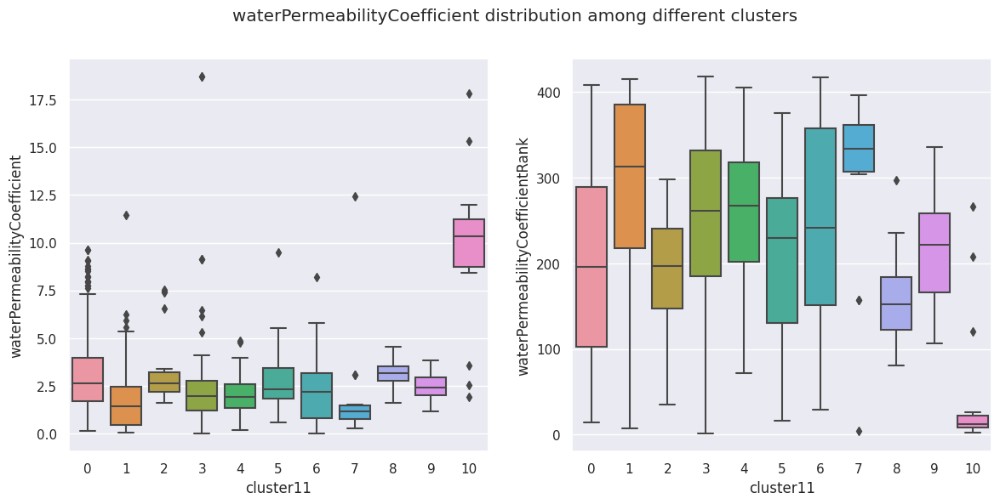

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("solutePermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='solutePermeabilityCoefficient', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='solutePermeabilityCoefficientRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'solutePermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficient                                    \
                                 count      min      mean    max  median   
cluster11                                                                  
0                                  232  0.14000  3.166361   9.63   2.655   
1                                   89  0.05000  1.898169  11.44   1.430   
2                                   22  1.60000  3.352273   7.54   2.640   
3                                   86  0.00160  2.569902  18.69   1.985   
4                                   49  0.19000  2.017755   4.87   1.930   
5                                   63  0.57000  2.569627   9.50   2.310   
6                                   89  0.03000  2.154404   8.19   2.180   
7                                   18  0.29000  1.853333  12.44   1.170   
8                                    9  1.60497  3.087199   4.53   3.160   
9                                   54  1.15000  2.414444   3.86   2.405   
10                                  17  1.94000  9.672072  17.83  10.330   

                                
                mode       std  
cluster11                       
0           1.690000  2.078198  
1           0.220000  1.804030  
2           2.510000  1.924795  
3          18.690000  2.998487  
4           1.820000  1.133540  
5           1.890000  1.390666  
6           0.100000  1.537479  
7           0.930000  2.752500  
8           2.767951  0.845513  
9           2.170000  0.672384  
10         10.330000  4.085424

In [ ]:
cluster_in.groupby('cluster11').agg({
    'waterPermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficientRank                                   \
                                     count    min        mean    max median   
cluster11                                                                     
0                                      232   14.0  195.788793  408.0  195.5   
1                                       89    7.0  278.876404  415.0  313.0   
2                                       22   35.0  181.045455  298.0  197.0   
3                                       86    1.0  248.697674  418.0  261.5   
4                                       49   72.0  258.469388  405.0  267.0   
5                                       63   16.0  218.269841  376.0  230.0   
6                                       89   29.0  250.505618  417.0  242.0   
7                                       18    4.0  306.055556  396.0  334.0   
8                                        9   81.0  166.111111  297.0  152.0   
9                                       54  106.0  220.444444  336.0  221.5   
10                                      17    2.0   44.647059  266.0   12.0   

                              
            mode         std  
cluster11                     
0          290.0  107.622932  
1          402.0  112.224392  
2          210.0   79.296596  
3            1.0  107.506834  
4          278.0   91.049232  
5          271.0   88.615554  
6          412.0  112.146832  
7          349.0  100.531220  
8          184.0   65.995160  
9          243.0   61.584017  
10          12.0   77.930210

###Profiling for Real Rejection Coefficient

<Axes: xlabel='cluster11', ylabel='realRejectionRank'>

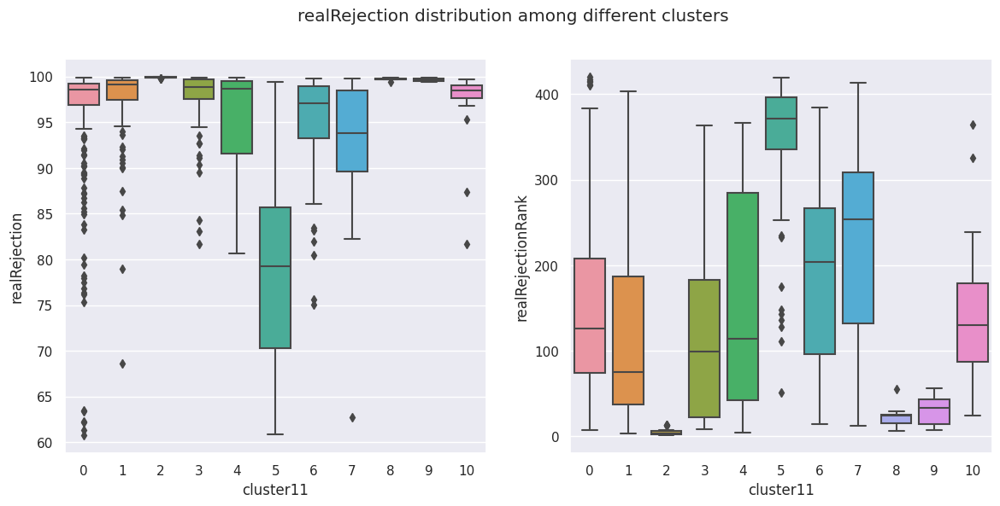

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("realRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='realRejection', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='realRejectionRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'realRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejection                                                   
                  count    min       mean    max  median   mode        std
cluster11                                                                 
0                   232  60.75  95.693158  99.87  98.545  98.81   7.454725
1                    89  68.63  97.174045  99.91  99.170  99.73   4.930328
2                    22  99.81  99.890455  99.94  99.910  99.92   0.040647
3                    86  81.72  97.521977  99.86  98.860  99.74   3.680215
4                    49  80.64  95.538571  99.90  98.670  99.10   5.222887
5                    63  60.89  79.185079  99.43  79.230  94.37  11.338613
6                    89  75.01  95.283146  99.80  97.050  99.71   5.321946
7                    18  62.77  92.087222  99.82  93.800  98.57   9.014456
8                     9  99.39  99.711111  99.88  99.700  99.88   0.145640
9                    54  99.38  99.639815  99.87  99.615  99.86   0.152829
10                   17  81.66  96.749412  99.70  98.480  99.34   4.837646

In [ ]:
cluster_in.groupby('cluster11').agg({
    'realRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejectionRank                                                   
                      count   min        mean    max median   mode         std
cluster11                                                                     
0                       232   7.0  152.288793  420.0  125.5  103.0  105.058871
1                        89   3.0  117.820225  403.0   75.0   21.0  104.222943
2                        22   1.0    5.000000   13.0    3.0    2.0    4.011887
3                        86   8.0  117.383721  363.0   99.0   20.0  101.453921
4                        49   4.0  159.061224  366.0  114.0   80.0  123.040543
5                        63  51.0  339.761905  419.0  371.0  253.0   88.008562
6                        89  14.0  183.483146  384.0  204.0   23.0  104.778350
7                        18  12.0  223.000000  413.0  254.0  123.0  119.529962
8                         9   6.0   23.000000   55.0   24.0    6.0   14.611639
9                        54   7.0   30.555556   56.0   33.5    8.0   15.588659
10                       17  24.0  147.294118  364.0  130.0   59.0   93.591376

###Profiling for Observed Solute Rejection Coefficient

<Axes: xlabel='cluster11', ylabel='observedSoluteRejectionRank'>

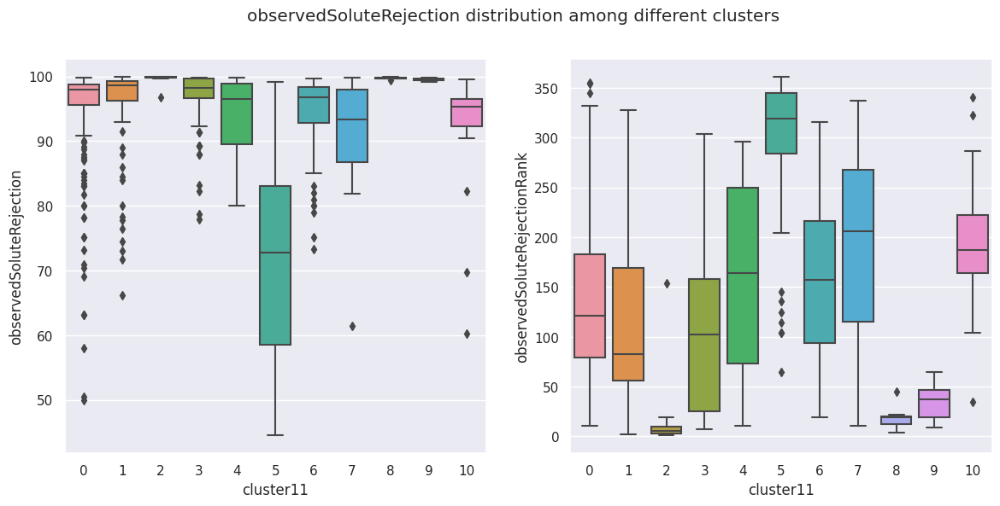

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("observedSoluteRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='observedSoluteRejection', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='observedSoluteRejectionRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'observedSoluteRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejection                                          \
                            count    min       mean    max  median   mode   
cluster11                                                                   
0                             232  50.00  94.905530  99.80  97.900  99.50   
1                              89  66.20  95.438090  99.90  98.630  99.10   
2                              22  96.84  99.701818  99.91  99.860  99.90   
3                              86  77.90  96.744535  99.84  98.250  97.80   
4                              49  80.00  94.135714  99.80  96.500  99.80   
5                              63  44.50  71.557778  99.10  72.800  81.60   
6                              89  73.30  94.360351  99.70  96.800  99.60   
7                              18  61.40  91.230600  99.80  93.345  98.00   
8                               9  99.39  99.711111  99.88  99.700  99.88   
9                              54  99.10  99.507963  99.82  99.470  99.80   
10                             17  60.19  91.285294  99.50  95.340  97.90   

                      
                 std  
cluster11             
0           8.087752  
1           7.406414  
2           0.643263  
3           4.708353  
4           5.683604  
5          16.435139  
6           5.969461  
7           9.474501  
8           0.145640  
9           0.199162  
10         10.775845

In [ ]:
cluster_in.groupby('cluster11').agg({
    'observedSoluteRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejectionRank                                         \
                                count   min        mean    max median   mode   
cluster11                                                                      
0                                 232  11.0  137.982759  355.0  121.0   35.0   
1                                  89   2.0  117.561798  328.0   83.0   65.0   
2                                  22   1.0   14.000000  154.0    5.5    2.0   
3                                  86   7.0  105.802326  304.0  102.0  125.0   
4                                  49  11.0  157.489796  296.0  164.0   11.0   
5                                  63  65.0  293.396825  361.0  319.0  292.0   
6                                  89  19.0  158.595506  316.0  157.0   27.0   
7                                  18  11.0  185.777778  337.0  206.0  114.0   
8                                   9   4.0   18.111111   45.0   19.0    4.0   
9                                  54   9.0   34.759259   65.0   37.0   11.0   
10                                 17  35.0  192.294118  341.0  187.0  121.0   

                      
                 std  
cluster11             
0          81.196729  
1          92.424288  
2          31.862801  
3          85.677757  
4          91.528712  
5          74.436277  
6          83.599657  
7          97.247746  
8          12.139238  
9          16.170011  
10         76.442597

###Profiling for Solute Permeability Coefficient

<Axes: xlabel='cluster11', ylabel='solutePermeabilityCoefficientRank'>

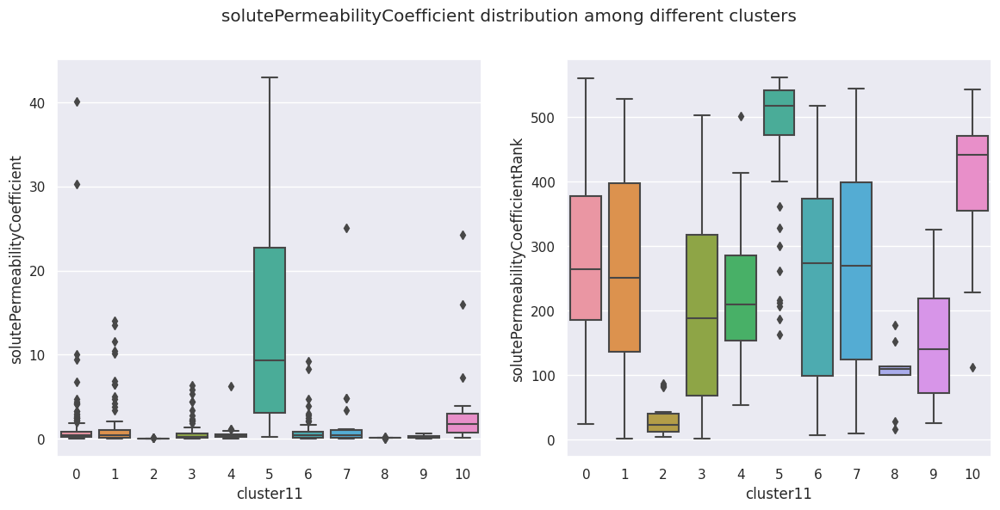

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("solutePermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='solutePermeabilityCoefficient', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='solutePermeabilityCoefficientRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'solutePermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficient                                \
                                  count     min       mean        max   
cluster11                                                               
0                                   232  0.0340   1.126156  40.060000   
1                                    89  0.0075   1.546072  14.057000   
2                                    22  0.0096   0.040768   0.092300   
3                                    86  0.0002   0.752350   6.410000   
4                                    49  0.0586   0.499165   6.222000   
5                                    63  0.2090  14.085359  42.930000   
6                                    89  0.0154   0.867059   9.197000   
7                                    18  0.0200   2.407889  25.080000   
8                                     9  0.0267   0.123533   0.241400   
9                                    54  0.0355   0.215163   0.632900   
10                                   17  0.1300   4.047275  24.257289   

                                       
            median    mode        std  
cluster11                              
0          0.44570  0.3700   3.441127  
1          0.40730  0.1700   2.967465  
2          0.03250  0.0300   0.025462  
3          0.26500  0.0510   1.321251  
4          0.31000  0.4500   0.874215  
5          9.29000  0.3300  12.287949  
6          0.46860  0.0972   1.466908  
7          0.45180  0.4936   5.875667  
8          0.12870  0.1304   0.066035  
9          0.16875  0.3000   0.150013  
10         1.78660  0.7792   6.441379

In [ ]:
cluster_in.groupby('cluster11').agg({
    'solutePermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficientRank                                   \
                                      count    min        mean    max median   
cluster11                                                                      
0                                       232   24.0  277.943966  560.0  263.5   
1                                        89    2.0  263.325843  528.0  251.0   
2                                        22    4.0   32.909091   87.0   22.5   
3                                        86    1.0  208.197674  503.0  188.5   
4                                        49   54.0  225.224490  502.0  209.0   
5                                        63  163.0  480.142857  561.0  518.0   
6                                        89    7.0  253.505618  517.0  274.0   
7                                        18   10.0  266.722222  544.0  269.0   
8                                         9   16.0  101.777778  177.0  110.0   
9                                        54   26.0  147.870370  326.0  140.0   
10                                       17  112.0  406.588235  543.0  442.0   

                              
            mode         std  
cluster11                     
0          235.0  122.606086  
1          141.0  159.663480  
2           21.0   26.885842  
3           44.0  156.574118  
4          266.0   98.852640  
5          216.0  103.717491  
6           91.0  147.982272  
7          284.0  169.605704  
8          113.0   51.618257  
9          205.0   83.214895  
10         355.0  113.460929

###Profiling for Pressure Difference Coefficient

<Axes: xlabel='cluster11', ylabel='pressureDiffRank'>

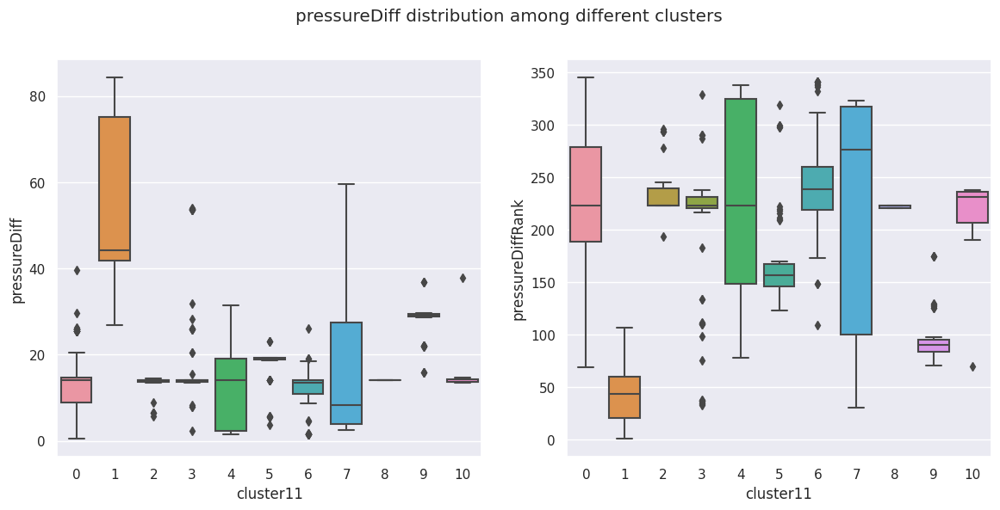

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("pressureDiff distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='pressureDiff', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='pressureDiffRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'pressureDiff': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiff                                                  \
                 count        min       mean        max  median   mode   
cluster11                                                                
0                  232   0.450000  13.080818  39.580000  13.990  14.01   
1                   89  26.850000  55.743682  84.260000  44.150  75.14   
2                   22   5.720000  12.360909  14.530000  13.990  13.99   
3                   86   2.280000  18.465047  53.890000  13.990  14.00   
4                   49   1.590000  13.106049  31.454000  13.990  25.48   
5                   63   3.632348  17.564763  23.130000  18.980  19.08   
6                   89   1.550000  11.884809  26.090000  13.550  14.00   
7                   18   2.450000  16.515222  59.630000   8.225  27.51   
8                    9  13.990000  13.993333  14.000000  13.990  13.99   
9                   54  15.780000  28.041341  36.902977  28.995  28.99   
10                  17  13.560000  15.273363  37.832751  13.730  13.56   

                      
                 std  
cluster11             
0           6.356454  
1          19.098818  
2           3.124670  
3          12.109995  
4           9.317207  
5           4.113629  
6           4.459108  
7          16.125812  
8           0.005000  
9           4.257294  
10          5.822852

In [ ]:
cluster_in.groupby('cluster11').agg({
    'pressureDiffRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiffRank                                                    
                     count    min        mean    max median   mode         std
cluster11                                                                     
0                      232   69.0  229.245690  345.0  223.0  219.0   62.424500
1                       89    1.0   44.101124  107.0   44.0   27.0   29.078673
2                       22  194.0  238.181818  296.0  223.0  223.0   30.652641
3                       86   33.0  199.744186  329.0  223.0  221.0   66.720521
4                       49   78.0  227.836735  338.0  223.0  117.0   86.067403
5                       63  123.0  171.063492  319.0  157.0  152.0   45.080885
6                       89  109.0  241.764045  341.0  239.0  221.0   45.894153
7                       18   31.0  214.222222  323.0  276.0  101.0  114.940678
8                        9  221.0  222.333333  223.0  223.0  223.0    1.000000
9                       54   71.0   96.944444  175.0   90.5   91.0   23.659070
10                      17   70.0  214.823529  238.0  231.0  238.0   40.296146

###Profiling for Concentration Polarization

<Axes: xlabel='cluster11', ylabel='concentrationPolarizationRank'>

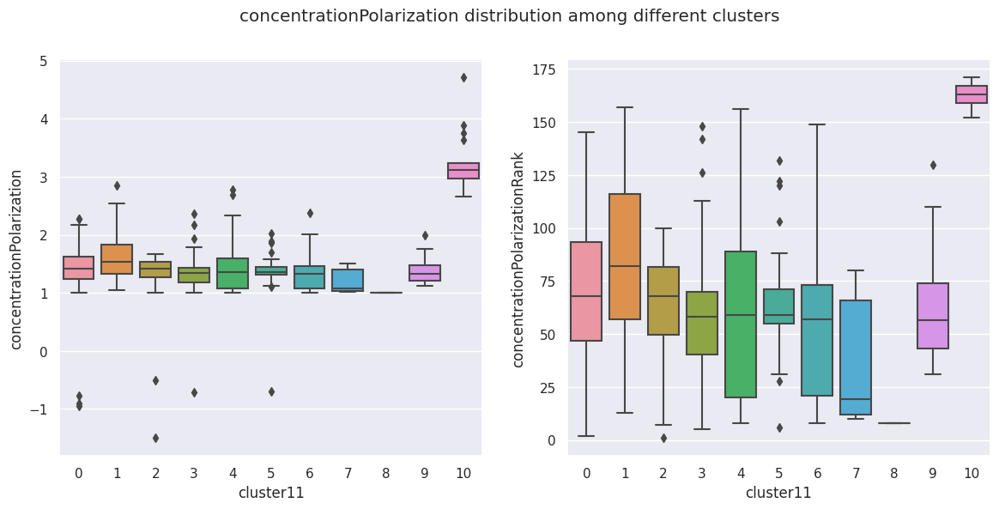

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("concentrationPolarization distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='concentrationPolarization', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='concentrationPolarizationRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'concentrationPolarization': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarization                                         \
                              count   min      mean       max median  mode   
cluster11                                                                    
0                               232 -0.95  1.420220  2.280000  1.410  1.38   
1                                89  1.04  1.601011  2.850000  1.530  1.62   
2                                22 -1.50  1.190000  1.670000  1.410  1.40   
3                                86 -0.71  1.328837  2.360000  1.340  1.14   
4                                49  1.00  1.413388  2.780000  1.350  1.38   
5                                63 -0.70  1.351245  2.021217  1.350  1.31   
6                                89  1.00  1.315584  2.380000  1.330  1.01   
7                                18  1.02  1.197778  1.510000  1.075  1.02   
8                                 9  1.00  1.000000  1.000000  1.000  1.00   
9                                54  1.12  1.375154  1.990000  1.325  1.47   
10                               17  2.66  3.232019  4.710000  3.110  3.22   

                     
                std  
cluster11            
0          0.387734  
1          0.372720  
2          0.743281  
3          0.324111  
4          0.430523  
5          0.308625  
6          0.273526  
7          0.188884  
8          0.000000  
9          0.188799  
10         0.513781

In [ ]:
cluster_in.groupby('cluster11').agg({
    'concentrationPolarizationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarizationRank                                   \
                                  count    min        mean    max median   
cluster11                                                                  
0                                   232    2.0   69.237069  145.0   68.0   
1                                    89   13.0   85.764045  157.0   82.0   
2                                    22    1.0   61.000000  100.0   68.0   
3                                    86    5.0   57.930233  148.0   58.0   
4                                    49    8.0   60.183673  156.0   59.0   
5                                    63    6.0   62.460317  132.0   59.0   
6                                    89    8.0   52.235955  149.0   57.0   
7                                    18   10.0   36.555556   80.0   19.5   
8                                     9    8.0    8.000000    8.0    8.0   
9                                    54   31.0   62.870370  130.0   56.5   
10                                   17  152.0  162.588235  171.0  163.0   

                             
            mode        std  
cluster11                    
0           62.0  34.627015  
1           93.0  38.079767  
2           67.0  27.977882  
3           34.0  28.290007  
4           62.0  43.239485  
5           55.0  20.331785  
6            9.0  34.479909  
7           10.0  27.504486  
8            8.0   0.000000  
9           74.0  22.310034  
10         166.0   5.712473

###Profiling for Salt Concentration

<Axes: xlabel='cluster11', ylabel='saltConcentrationRank'>

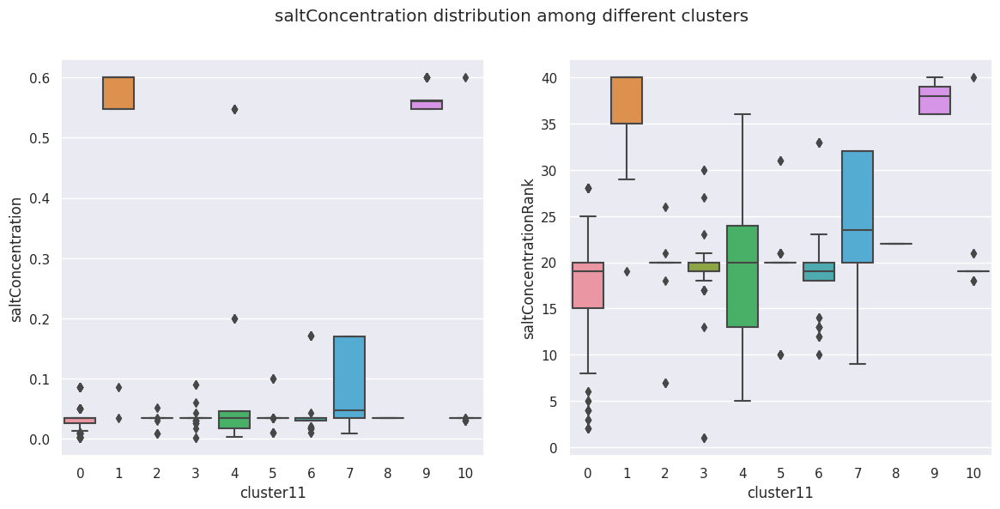

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("saltConcentration distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='saltConcentration', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='saltConcentrationRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'saltConcentration': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentration                                                    \
                      count       min      mean       max    median      mode   
cluster11                                                                       
0                       232  0.001700  0.030373  0.085500  0.034000  0.034000   
1                        89  0.034000  0.573703  0.600000  0.600000  0.600000   
2                        22  0.008556  0.031290  0.051300  0.034200  0.034200   
3                        86  0.001540  0.033990  0.090000  0.034000  0.034000   
4                        49  0.003420  0.078880  0.547600  0.034200  0.046000   
5                        63  0.010000  0.035415  0.100000  0.034200  0.034200   
6                        89  0.010000  0.038093  0.171100  0.034000  0.034000   
7                        18  0.008600  0.078294  0.170000  0.047050  0.170000   
8                         9  0.034223  0.034223  0.034223  0.034223  0.034223   
9                        54  0.547600  0.562615  0.600000  0.560000  0.560000   
10                       17  0.030000  0.066379  0.600000  0.034000  0.034000   

                     
                std  
cluster11            
0          0.016274  
1          0.081854  
2          0.009992  
3          0.010773  
4          0.147931  
5          0.015976  
6          0.033359  
7          0.068619  
8          0.000000  
9          0.017775  
10         0.137522

In [ ]:
cluster_in.groupby('cluster11').agg({
    'saltConcentrationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentrationRank                                              
                          count   min       mean   max median  mode       std
cluster11                                                                    
0                           232   2.0  17.150862  28.0   19.0  19.0  5.866376
1                            89  19.0  38.292135  40.0   40.0  40.0  3.202280
2                            22   7.0  18.454545  26.0   20.0  20.0  4.857270
3                            86   1.0  19.058140  30.0   19.0  19.0  3.542530
4                            49   5.0  18.795918  36.0   20.0  24.0  8.791520
5                            63  10.0  19.841270  31.0   20.0  20.0  3.742547
6                            89  10.0  19.000000  33.0   19.0  19.0  4.522670
7                            18   9.0  22.888889  32.0   23.5  32.0  8.683242
8                             9  22.0  22.000000  22.0   22.0  22.0  0.000000
9                            54  36.0  37.814815  40.0   38.0  38.0  1.401806
10                           17  18.0  20.235294  40.0   19.0  19.0  5.166350

###Profiling for Water/Salt Selectivity Coefficient

<Axes: xlabel='cluster11', ylabel='Water/Salt-SelectivityRank'>

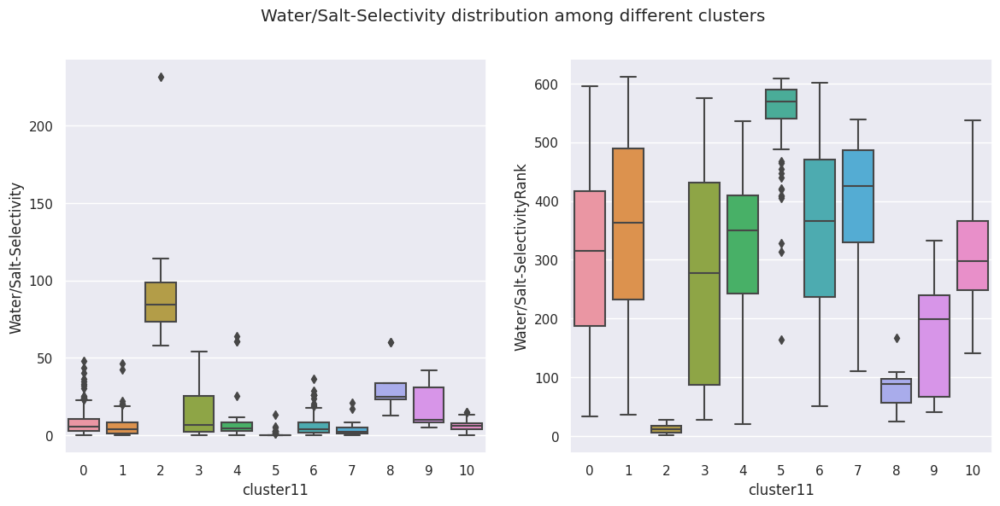

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("Water/Salt-Selectivity distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='Water/Salt-Selectivity', data=cluster_in)
sns.boxplot(ax=ax[1],x='cluster11', y='Water/Salt-SelectivityRank', data=cluster_in)

In [ ]:
cluster_in.groupby('cluster11').agg({
    'Water/Salt-Selectivity': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-Selectivity                                               \
                           count        min       mean         max     median   
cluster11                                                                       
0                            232   0.114333   8.314795   48.245614   5.550000   
1                             89   0.026670   6.244876   46.520000   3.970000   
2                             22  57.800000  90.676144  231.250000  84.354772   
3                             86   0.160686  14.606100   54.166667   6.911942   
4                             49   0.404255   8.963305   64.006515   4.304000   
5                             63   0.083053   0.935862   13.305242   0.206674   
6                             89   0.100000   7.048123   36.500000   3.900000   
7                             18   0.340116   4.703603   21.142857   2.552674   
8                              9  13.083700  32.189516   60.012050  24.818100   
9                             54   4.945489  18.543809   41.793893   9.812500   
10                            17   0.347881   6.874977   14.970149   6.200000   

                                 
                mode        std  
cluster11                        
0           1.800000   8.295383  
1          10.000000   7.909720  
2          62.750000  34.768043  
3           4.300000  15.473326  
4           2.145000  14.273660  
5           3.000000   1.988203  
6          26.100000   8.256663  
7           2.552674   5.868439  
8          21.218690  16.683114  
9          27.678571  12.873777  
10          8.000000   4.643200

In [ ]:
cluster_in.groupby('cluster11').agg({
    'Water/Salt-SelectivityRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-SelectivityRank                                          \
                               count    min        mean    max median   mode   
cluster11                                                                      
0                                232   33.0  306.297414  596.0  314.5  455.0   
1                                 89   36.0  362.280899  611.0  363.0  193.0   
2                                 22    1.0   11.818182   27.0   11.5   22.0   
3                                 86   28.0  265.988372  575.0  277.5  351.0   
4                                 49   20.0  320.448980  536.0  350.0  441.0   
5                                 63  164.0  537.015873  609.0  569.0  410.0   
6                                 89   51.0  346.505618  601.0  366.0   84.0   
7                                 18  110.0  392.722222  539.0  425.0  425.0   
8                                  9   25.0   81.222222  167.0   89.0  109.0   
9                                 54   40.0  166.500000  332.0  198.5   78.0   
10                                17  141.0  308.058824  538.0  298.0  248.0   

                       
                  std  
cluster11              
0          137.238543  
1          154.197777  
2            7.075352  
3          176.005381  
4          127.114788  
5           84.746204  
6          148.764466  
7          135.630036  
8           43.899823  
9           92.965758  
10         122.755077

###Profiling for Structure

[Text(0.5, 1.0, 'structure distribution among different clusters')]

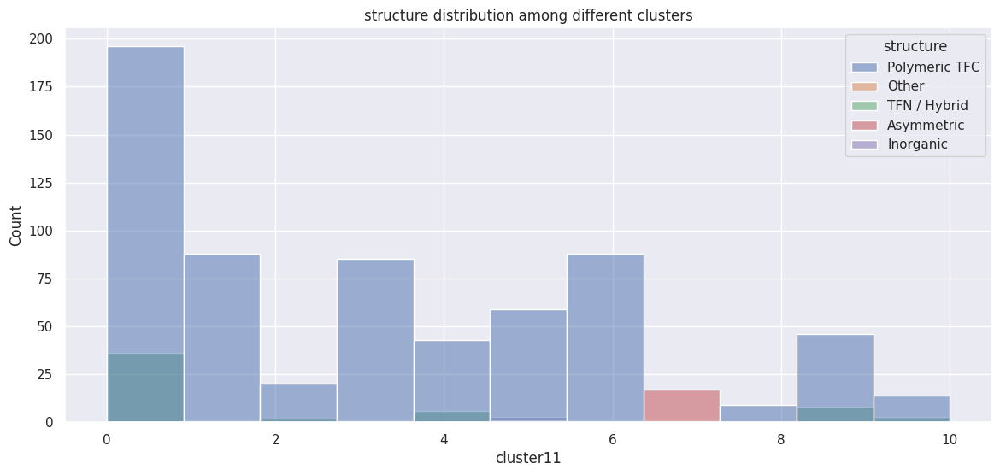

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='structure',
             data=cluster_in).set(title = "structure distribution among different clusters")

In [ ]:
cluster_in.groupby(['cluster11'])['structure'].value_counts()

cluster11  structure    
0          Polymeric TFC    196
           TFN / Hybrid      36
1          Polymeric TFC     88
           Other              1
2          Polymeric TFC     20
           TFN / Hybrid       2
3          Polymeric TFC     85
           Other              1
4          Polymeric TFC     43
           TFN / Hybrid       6
5          Polymeric TFC     59
           Inorganic          3
           Other              1
6          Polymeric TFC     88
           TFN / Hybrid       1
7          Asymmetric        17
           Inorganic          1
8          Polymeric TFC      9
9          Polymeric TFC     46
           TFN / Hybrid       8
10         Polymeric TFC     14
           TFN / Hybrid       3
Name: structure, dtype: int64

###Profiling for Chemistry

[Text(0.5, 1.0, 'chemistry distribution among different clusters')]

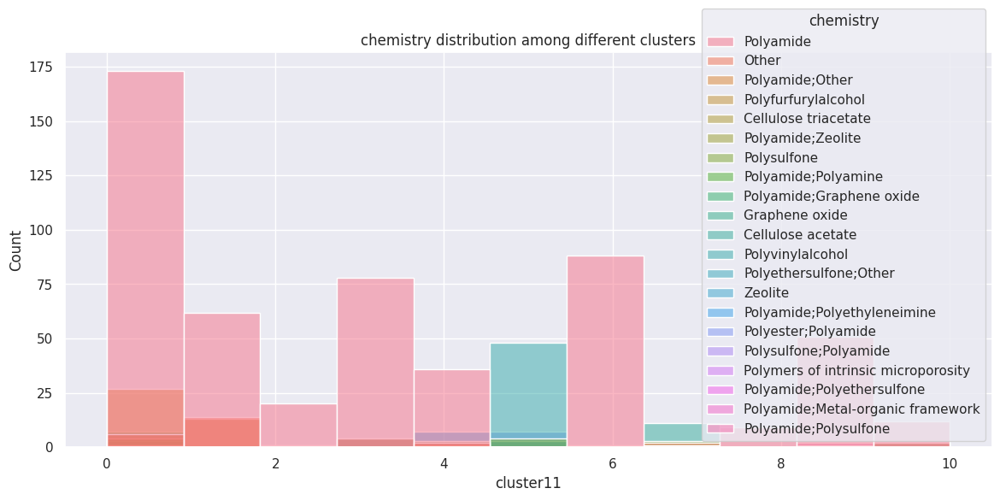

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='chemistry',
             data=cluster_in).set(title = "chemistry distribution among different clusters")

In [ ]:
cluster_in.groupby(['cluster11'])['chemistry'].value_counts()

cluster11  chemistry                          
0          Polyamide                              173
           Polyamide;Other                         27
           Polyamide;Graphene oxide                 7
           Other                                    6
           Polyamide;Metal-organic framework        6
           Polyamide;Polyethersulfone               5
           Polyamide;Polyamine                      4
           Graphene oxide                           3
           Polyamide;Zeolite                        1
1          Polyamide                               62
           Other                                   14
           Polyfurfurylalcohol                     13
2          Polyamide                               20
           Polyamide;Graphene oxide                 1
           Polyethersulfone;Other                   1
3          Polyamide                               78
           Cellulose acetate                        4
           Other                   

###Profiling for Modification

[Text(0.5, 1.0, 'modification distribution among different clusters')]

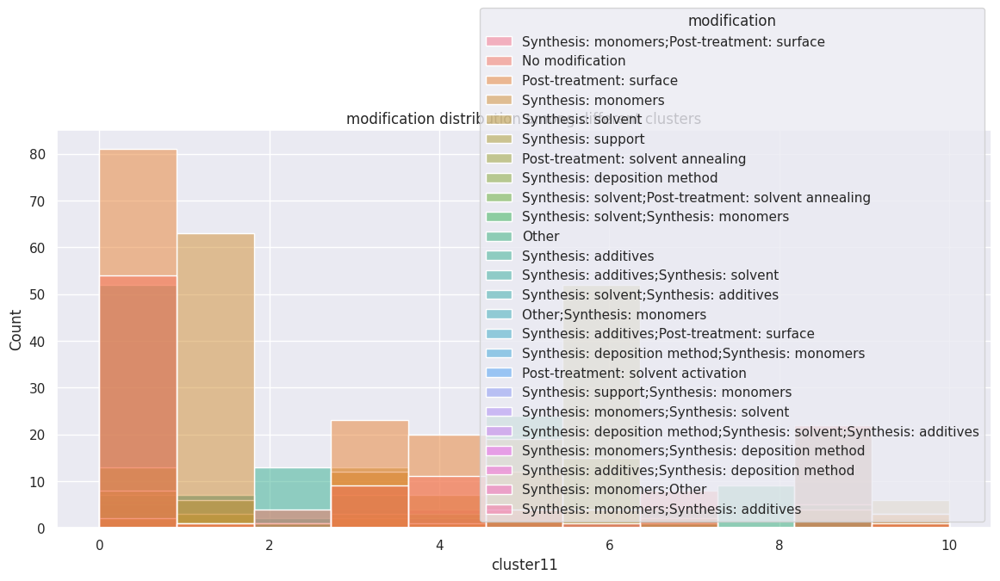

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='modification',
             data=cluster_in).set(title = "modification distribution among different clusters")

In [ ]:
cluster_in.groupby(['cluster11'])['modification'].value_counts()

cluster11  modification                      
0          Post-treatment: surface               81
           No modification                       54
           Synthesis: additives                  52
           Synthesis: deposition method          13
           Post-treatment: solvent annealing      8
                                                 ..
10         Synthesis: monomers                    3
           Synthesis: additives                   2
           No modification                        1
           Other                                  1
           Post-treatment: solvent activation     1
Name: modification, Length: 77, dtype: int64

###Profiling for Other Solutes

[Text(0.5, 1.0, 'otherSolutes distribution among different clusters')]

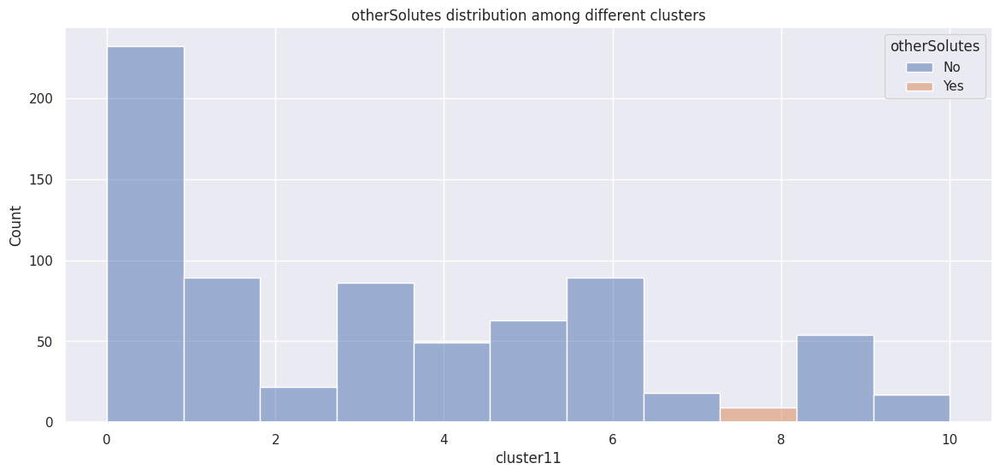

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='otherSolutes',
             data=cluster_in).set(title = "otherSolutes distribution among different clusters")

In [ ]:
cluster_in.groupby(['cluster11'])['otherSolutes'].value_counts()

cluster11  otherSolutes
0          No              232
1          No               89
2          No               22
3          No               86
4          No               49
5          No               63
6          No               89
7          No               18
8          Yes               9
9          No               54
10         No               17
Name: otherSolutes, dtype: int64

###Profiling for Filtration Mode

[Text(0.5, 1.0, 'filtrationMode distribution among different clusters')]

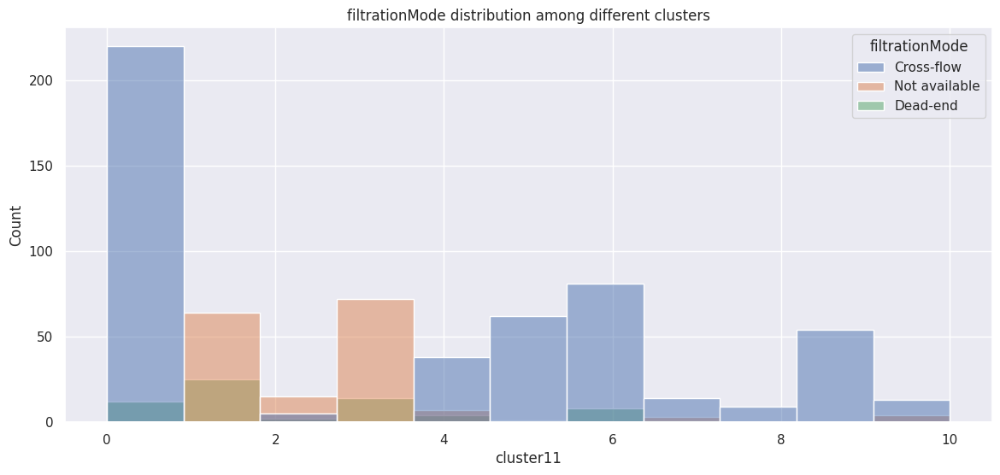

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='filtrationMode',
             data=cluster_in).set(title = "filtrationMode distribution among different clusters")

In [ ]:
cluster_in.groupby(['cluster11'])['filtrationMode'].value_counts()

cluster11  filtrationMode
0          Cross-flow        220
           Dead-end           12
1          Not available      64
           Dead-end           25
2          Not available      15
           Cross-flow          5
           Dead-end            2
3          Not available      72
           Dead-end           14
4          Cross-flow         38
           Not available       7
           Dead-end            4
5          Cross-flow         62
           Dead-end            1
6          Cross-flow         81
           Dead-end            8
7          Cross-flow         14
           Not available       3
           Dead-end            1
8          Cross-flow          9
9          Cross-flow         54
10         Cross-flow         13
           Not available       4
Name: filtrationMode, dtype: int64

###Profiling for Concentration Polarization Mode

[Text(0.5, 1.0, 'cpMode distribution among different clusters')]

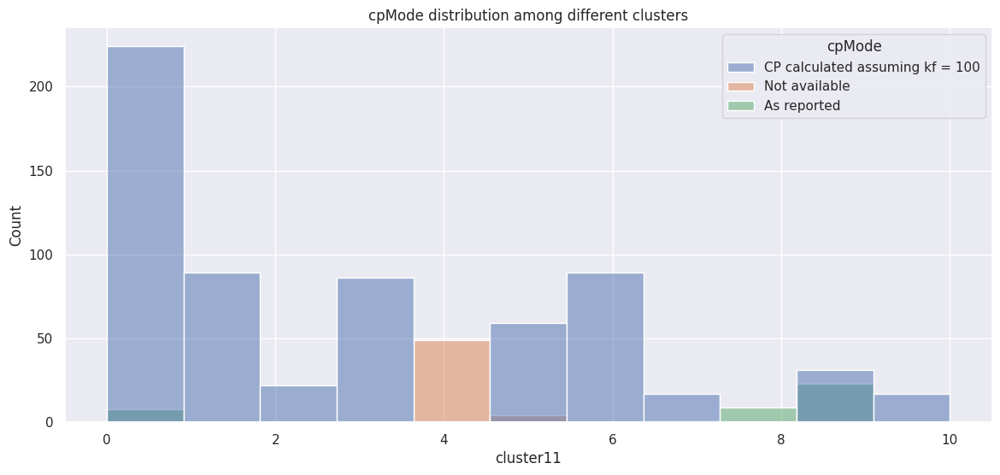

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='cpMode',
             data=cluster_in).set(title = "cpMode distribution among different clusters")

In [ ]:
cluster_in.groupby(['cluster11'])['cpMode'].value_counts()

cluster11  cpMode                         
0          CP calculated assuming kf = 100    224
           As reported                          8
1          CP calculated assuming kf = 100     89
2          CP calculated assuming kf = 100     22
3          CP calculated assuming kf = 100     86
4          Not available                       49
5          CP calculated assuming kf = 100     59
           Not available                        4
6          CP calculated assuming kf = 100     89
7          CP calculated assuming kf = 100     17
           Not available                        1
8          As reported                          9
9          CP calculated assuming kf = 100     31
           As reported                         23
10         CP calculated assuming kf = 100     17
Name: cpMode, dtype: int64

##For Outputs (Numerical)

In [ ]:
cluster_out.head(1)

,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,filtrationMode,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank,averageEfficiencyRank,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.8,99.7,Cross-flow,0.03422,CP calculated assuming kf = 100,1.51,26.09,3,4,15,0,0,1,97.0,80.0,21.0,192.0,14.0,19.0,109.0,83.0,76.875,0,0,0,4,0,4,0


In [ ]:
sns.set(rc={'figure.figsize':(14,6)})

###Profiling for Water Permeability Coefficient



<Axes: xlabel='cluster8', ylabel='waterPermeabilityCoefficientRank'>

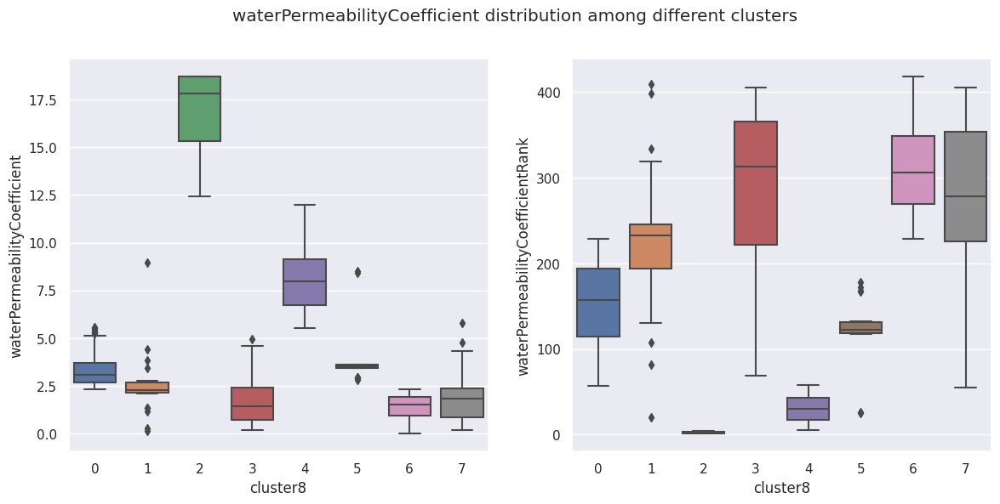

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("waterPermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster8', y='waterPermeabilityCoefficient', data=cluster_out)
sns.boxplot(ax=ax[1],x='cluster8', y='waterPermeabilityCoefficientRank', data=cluster_out)

In [ ]:
cluster_out.groupby('cluster8').agg({
    'waterPermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficient                                   \
                                count        min       mean        max   
cluster8                                                                 
0                                 236   2.330000   3.297723   5.570000   
1                                  25   0.130000   2.512663   8.936564   
2                                   5  12.440000  16.594000  18.690000   
3                                  82   0.190000   1.658915   4.940000   
4                                  52   5.542414   8.166777  12.000000   
5                                  18   2.830000   3.949925   8.530000   
6                                 258   0.001600   1.370007   2.330000   
7                                  52   0.190000   1.873654   5.810000   

                                   
          median   mode       std  
cluster8                           
0          3.080   2.70  0.805966  
1          2.280   2.17  1.630620  
2         17.830  18.69  2.701524  
3          1.430   1.69  1.172059  
4          7.970   7.99  1.736251  
5          3.540   3.63  1.672229  
6          1.510   1.82  0.659044  
7          1.815   1.89  1.187627

In [ ]:
cluster_out.groupby('cluster8').agg({
    'waterPermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficientRank                                   \
                                    count    min        mean    max median   
cluster8                                                                     
0                                     236   57.0  152.546610  229.0  157.5   
1                                      25   20.0  227.960000  409.0  233.0   
2                                       5    1.0    2.200000    4.0    2.0   
3                                      82   69.0  287.560976  405.0  313.0   
4                                      52    5.0   30.442308   58.0   30.5   
5                                      18   25.0  122.944444  178.0  122.5   
6                                     258  229.0  312.961240  418.0  306.0   
7                                      52   55.0  272.326923  405.0  278.5   

                            
           mode        std  
cluster8                    
0         191.0  49.067842  
1         243.0  87.747972  
2           1.0   1.303840  
3         290.0  95.209593  
4          30.0  15.369199  
5         117.0  41.107423  
6         278.0  53.444892  
7         271.0  91.245354

###Profiling for Real Rejection Coefficient

<Axes: xlabel='cluster8', ylabel='realRejectionRank'>

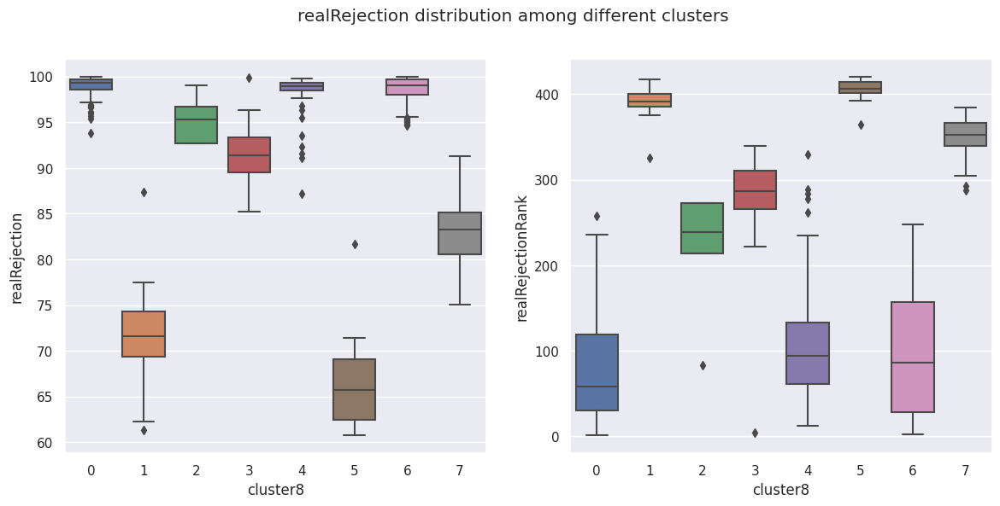

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("realRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster8', y='realRejection', data=cluster_out)
sns.boxplot(ax=ax[1],x='cluster8', y='realRejectionRank', data=cluster_out)

In [ ]:
cluster_out.groupby('cluster8').agg({
    'realRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejection                                                  
                 count    min       mean    max  median   mode       std
cluster8                                                                
0                  236  93.76  98.978750  99.94  99.350  99.48  0.946863
1                   25  61.36  71.187600  87.35  71.620  61.36  5.743676
2                    5  92.65  95.274000  99.06  95.280  92.65  2.748842
3                   82  85.23  91.300610  99.90  91.340  88.86  2.760630
4                   52  87.18  98.064038  99.82  98.925  99.81  2.511278
5                   18  60.75  66.398333  81.66  65.765  62.20  5.159070
6                  258  94.60  98.622859  99.92  99.010  99.86  1.297123
7                   52  75.01  83.142308  91.26  83.260  85.56  3.977184

In [ ]:
cluster_out.groupby('cluster8').agg({
    'realRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejectionRank                                                   
                     count    min        mean    max median   mode        std
cluster8                                                                     
0                      236    1.0   79.906780  258.0   58.5   47.0  61.685750
1                       25  325.0  391.160000  417.0  391.0  417.0  18.340938
2                        5   83.0  216.400000  273.0  239.0  273.0  78.611704
3                       82    4.0  284.719512  339.0  287.0  316.0  41.755986
4                       52   12.0  114.500000  329.0   94.5   13.0  76.459268
5                       18  364.0  405.111111  420.0  406.5  415.0  13.051432
6                      258    2.0   98.596899  248.0   86.5    8.0  75.747535
7                       52  288.0  349.538462  384.0  352.5  336.0  22.633016

###Profiling for Observed Solute Rejection Coefficient

<Axes: xlabel='cluster8', ylabel='observedSoluteRejectionRank'>

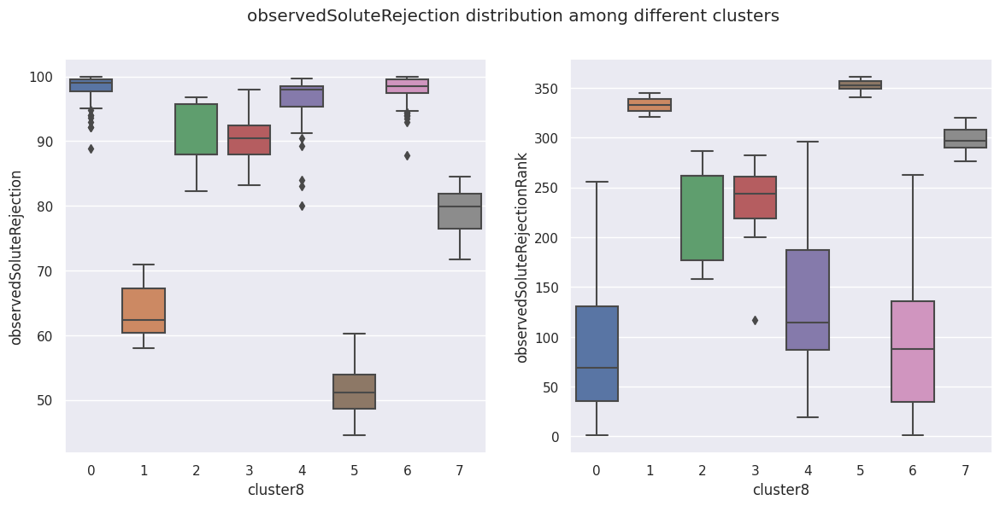

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("observedSoluteRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster8', y='observedSoluteRejection', data=cluster_out)
sns.boxplot(ax=ax[1],x='cluster8', y='observedSoluteRejectionRank', data=cluster_out)

In [ ]:
cluster_out.groupby('cluster8').agg({
    'observedSoluteRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejection                                         \
                           count    min       mean    max  median  mode   
cluster8                                                                  
0                            236  88.82  98.354759  99.91  99.000  99.6   
1                             25  58.00  63.601600  70.86  62.400  58.0   
2                              5  82.26  90.098000  96.73  87.900  87.9   
3                             82  83.20  90.008049  97.96  90.400  85.0   
4                             52  80.00  96.170385  99.70  98.000  99.7   
5                             18  44.50  51.471667  60.19  51.150  53.4   
6                            258  87.80  98.199736  99.91  98.505  99.8   
7                             52  71.70  79.104615  84.50  79.850  80.0   

                    
               std  
cluster8            
0         1.624630  
1         4.078644  
2         6.051084  
3         3.025171  
4         4.359773  
5         4.015717  
6         1.664292  
7         3.469186

In [ ]:
cluster_out.groupby('cluster8').agg({
    'observedSoluteRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejectionRank                                          \
                               count    min        mean    max median   mode   
cluster8                                                                       
0                                236    1.0   84.000000  256.0   69.0   27.0   
1                                 25  321.0  333.160000  345.0  333.0  345.0   
2                                  5  158.0  229.200000  287.0  262.0  262.0   
3                                 82  117.0  240.439024  282.0  243.5  275.0   
4                                 52   19.0  132.576923  296.0  114.0   19.0   
5                                 18  341.0  352.611111  361.0  352.5  350.0   
6                                258    1.0   89.457364  263.0   87.5   11.0   
7                                 52  276.0  298.365385  320.0  296.5  296.0   

                     
                std  
cluster8             
0         57.411097  
1          7.581117  
2         57.634191  
3         27.574410  
4         71.468997  
5          5.392139  
6         60.825068  
7         12.115504

###Profiling for Solute Permeability Coefficient

<Axes: xlabel='cluster8', ylabel='solutePermeabilityCoefficientRank'>

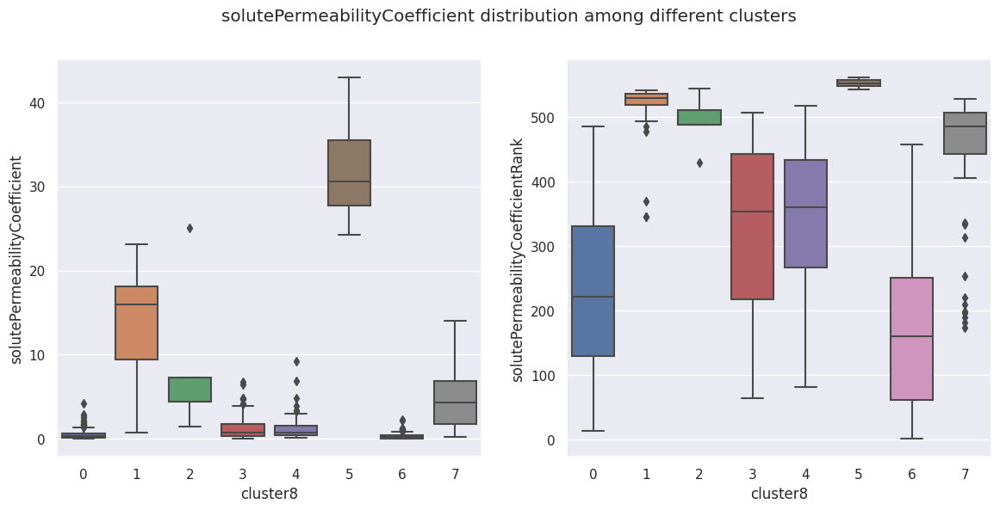

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("solutePermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster8', y='solutePermeabilityCoefficient', data=cluster_out)
sns.boxplot(ax=ax[1],x='cluster8', y='solutePermeabilityCoefficientRank', data=cluster_out)

In [ ]:
cluster_out.groupby('cluster8').agg({
    'solutePermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficient                                   \
                                 count        min       mean        max   
cluster8                                                                  
0                                  236   0.022000   0.512492   4.240697   
1                                   25   0.739000  13.219776  23.160000   
2                                    5   1.478200   8.517840  25.080000   
3                                   82   0.076000   1.380999   6.800000   
4                                   52   0.087800   1.397361   9.197000   
5                                   18  24.257289  32.201661  42.930000   
6                                  258   0.000200   0.297860   2.240000   
7                                   52   0.230000   4.652592  14.057000   

                                       
            median     mode       std  
cluster8                               
0          0.34500   0.2500  0.552870  
1         15.93199   0.8500  7.060919  
2          4.37100   4.3710  9.483727  
3          0.76570   0.1500  1.521046  
4          0.79100   0.7792  1.704260  
5         30.54630  30.2626  5.398104  
6          0.20025   0.1300  0.318163  
7          4.30500   2.9200  3.617074

In [ ]:
cluster_out.groupby('cluster8').agg({
    'solutePermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficientRank                                   \
                                     count    min        mean    max median   
cluster8                                                                      
0                                      236   14.0  231.966102  485.0  221.0   
1                                       25  345.0  505.160000  542.0  530.0   
2                                        5  430.0  492.200000  544.0  488.0   
3                                       82   64.0  331.926829  507.0  353.5   
4                                       52   82.0  345.134615  517.0  360.0   
5                                       18  543.0  552.444444  561.0  552.5   
6                                      258    1.0  168.104651  457.0  159.5   
7                                       52  173.0  436.442308  528.0  485.5   

                             
           mode         std  
cluster8                     
0         183.0  122.031209  
1         370.0   59.597735  
2         488.0   41.655732  
3         129.0  125.739765  
4         355.0  113.307499  
5         552.0    5.436502  
6         112.0  117.341302  
7         469.0  110.851148

###Profiling for Pressure Difference Coefficient

<Axes: xlabel='cluster8', ylabel='pressureDiffRank'>

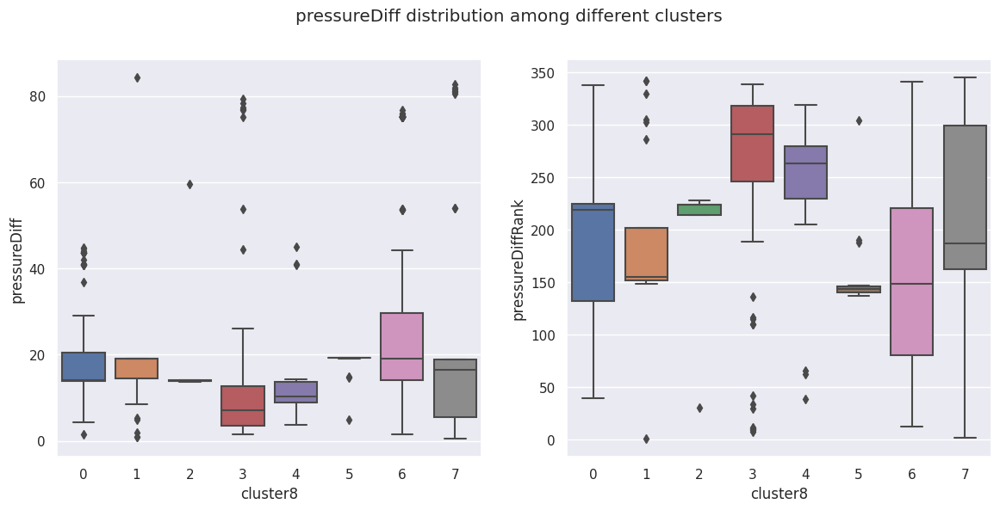

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("pressureDiff distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster8', y='pressureDiff', data=cluster_out)
sns.boxplot(ax=ax[1],x='cluster8', y='pressureDiffRank', data=cluster_out)

In [ ]:
cluster_out.groupby('cluster8').agg({
    'pressureDiff': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiff                                                       
                count        min       mean    max  median   mode        std
cluster8                                                                    
0                 236   1.590000  18.123154  44.71  14.010  13.99   8.637933
1                  25   0.950000  17.612808  84.26  19.040  19.06  15.406418
2                   5  13.760000  23.038000  59.63  13.870  13.87  20.455835
3                  82   1.570000  13.873360  79.24   7.155   4.86  19.898874
4                  52   3.632348  12.247796  44.98  10.190   8.82   8.203203
5                  18   4.920000  17.926901  19.32  19.200  19.28   3.557894
6                 258   1.550000  26.473191  76.72  19.120  14.00  19.438371
7                  52   0.450000  21.147050  82.74  16.500   0.45  24.398781

In [ ]:
cluster_out.groupby('cluster8').agg({
    'pressureDiffRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiffRank                                                    
                    count    min        mean    max median   mode         std
cluster8                                                                     
0                     236   40.0  190.508475  338.0  219.0  223.0   63.854522
1                      25    1.0  190.600000  342.0  155.0  153.0   81.304469
2                       5   31.0  184.200000  228.0  224.0  224.0   85.797436
3                      82    8.0  254.682927  339.0  291.5  308.0   94.776394
4                      52   39.0  248.403846  319.0  263.0  279.0   57.196003
5                      18  137.0  156.388889  304.0  143.5  139.0   39.908924
6                     258   13.0  154.120155  341.0  149.0  221.0   86.483288
7                      52    2.0  205.865385  345.0  187.0  345.0  107.005594

###Profiling for Concentration Polarization

<Axes: xlabel='cluster8', ylabel='concentrationPolarizationRank'>

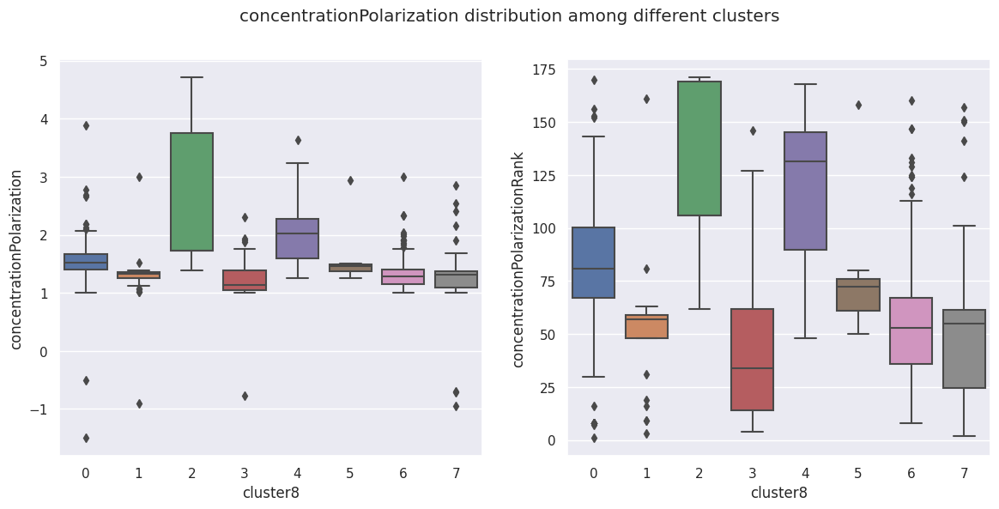

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("concentrationPolarization distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster8', y='concentrationPolarization', data=cluster_out)
sns.boxplot(ax=ax[1],x='cluster8', y='concentrationPolarizationRank', data=cluster_out)

In [ ]:
cluster_out.groupby('cluster8').agg({
    'concentrationPolarization': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarization                                            \
                             count   min      mean       max    median  mode   
cluster8                                                                       
0                              236 -1.50  1.531238  3.890000  1.520000  1.52   
1                               25 -0.91  1.264227  3.005668  1.330000  1.33   
2                                5  1.38  2.662000  4.710000  1.730000  1.73   
3                               82 -0.77  1.204098  2.300000  1.140000  1.38   
4                               52  1.25  2.052578  3.630000  2.015609  2.10   
5                               18  1.26  1.511428  2.945710  1.455000  1.49   
6                              258  1.00  1.320695  3.002950  1.290000  1.38   
7                               52 -0.95  1.230231  2.850000  1.310000  1.31   

                    
               std  
cluster8            
0         0.390024  
1         0.583221  
2         1.481611  
3         0.335290  
4         0.604858  
5         0.365169  
6         0.253186  
7         0.632794

In [ ]:
cluster_out.groupby('cluster8').agg({
    'concentrationPolarizationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarizationRank                                         \
                                 count   min        mean    max median   mode   
cluster8                                                                        
0                                  236   1.0   81.067797  170.0   81.0   81.0   
1                                   25   3.0   52.320000  161.0   57.0   57.0   
2                                    5  62.0  122.800000  171.0  106.0  106.0   
3                                   82   4.0   40.402439  146.0   34.0   62.0   
4                                   52  48.0  118.250000  168.0  131.5  139.0   
5                                   18  50.0   73.833333  158.0   72.5   76.0   
6                                  258   8.0   53.957364  160.0   53.0   62.0   
7                                   52   2.0   51.461538  157.0   55.0   55.0   

                     
                std  
cluster8             
0         30.045421  
1         30.546031  
2         46.687257  
3         32.029254  
4         35.956332  
5         22.783508  
6         29.329639  
7         38.267101

###Profiling for Salt Concentration

<Axes: xlabel='cluster8', ylabel='saltConcentrationRank'>

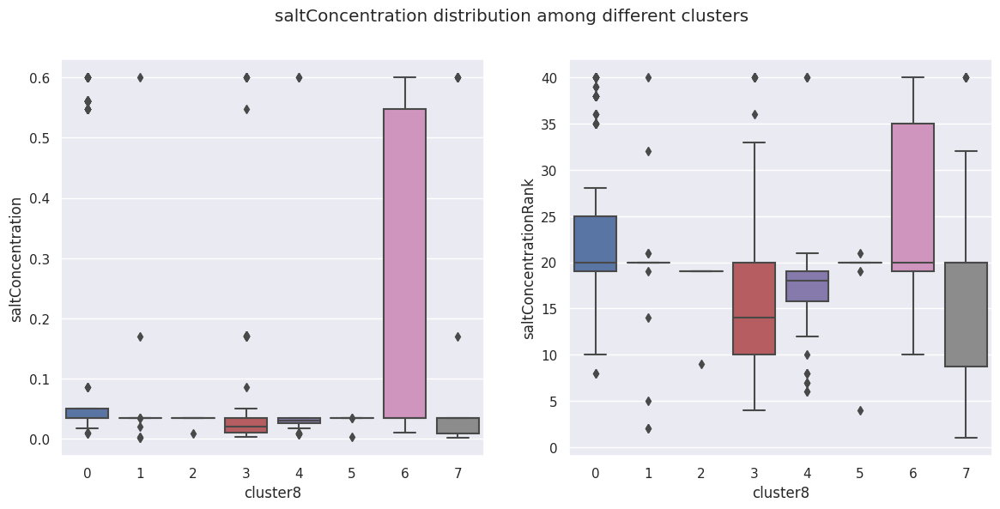

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("saltConcentration distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster8', y='saltConcentration', data=cluster_out)
sns.boxplot(ax=ax[1],x='cluster8', y='saltConcentrationRank', data=cluster_out)

In [ ]:
cluster_out.groupby('cluster8').agg({
    'saltConcentration': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentration                                              \
                     count      min      mean      max  median    mode   
cluster8                                                                 
0                      236  0.00856  0.154339  0.60000  0.0342  0.0340   
1                       25  0.00170  0.057858  0.60000  0.0342  0.0342   
2                        5  0.00860  0.028920  0.03400  0.0340  0.0340   
3                       82  0.00340  0.084106  0.60000  0.0200  0.0100   
4                       52  0.00800  0.059920  0.60000  0.0300  0.0300   
5                       18  0.00340  0.032479  0.03422  0.0342  0.0342   
6                      258  0.01000  0.197562  0.60000  0.0342  0.0342   
7                       52  0.00154  0.093226  0.60000  0.0342  0.0342   

                    
               std  
cluster8            
0         0.224462  
1         0.116876  
2         0.011359  
3         0.163108  
4         0.135255  
5         0.007257  
6         0.246449  
7         0.186410

In [ ]:
cluster_out.groupby('cluster8').agg({
    'saltConcentrationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentrationRank                                               
                         count   min       mean   max median  mode        std
cluster8                                                                     
0                          236   8.0  23.669492  40.0   20.0  19.0   8.171622
1                           25   2.0  19.040000  40.0   20.0  20.0   7.727009
2                            5   9.0  17.000000  19.0   19.0  19.0   4.472136
3                           82   4.0  17.743902  40.0   14.0  10.0  10.093160
4                           52   6.0  17.615385  40.0   18.0  18.0   7.151454
5                           18   4.0  19.111111  21.0   20.0  20.0   3.786802
6                          258  10.0  25.193798  40.0   20.0  20.0   9.285424
7                           52   1.0  17.846154  40.0   20.0  20.0  11.063781

###Profiling for Water/Salt Selectivity Coefficient

<Axes: xlabel='cluster8', ylabel='Water/Salt-SelectivityRank'>

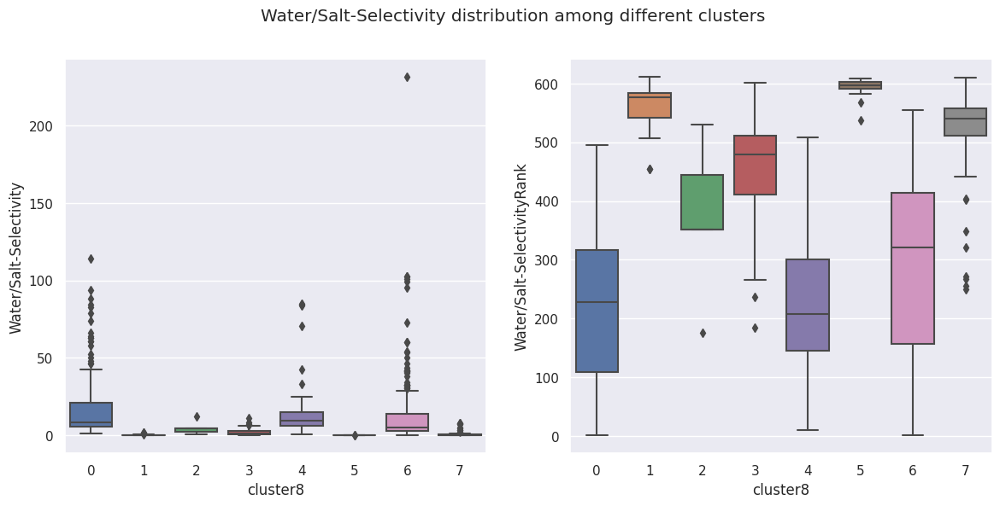

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("Water/Salt-Selectivity distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster8', y='Water/Salt-Selectivity', data=cluster_out)
sns.boxplot(ax=ax[1],x='cluster8', y='Water/Salt-SelectivityRank', data=cluster_out)

In [ ]:
cluster_out.groupby('cluster8').agg({
    'Water/Salt-Selectivity': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-Selectivity                                             \
                          count       min       mean         max    median   
cluster8                                                                     
0                           236  1.160266  16.266978  114.090909  8.685354   
1                            25  0.026670   0.346471    1.800000  0.149396   
2                             5  0.496013   4.659203   12.100000  4.300000   
3                            82  0.100000   2.180312   11.100000  1.419918   
4                            52  0.863570  16.227194   84.909910  9.500000   
5                            18  0.083053   0.126114    0.347881  0.111020   
6                           258  0.272727  13.148019  231.250000  5.275000   
7                            52  0.049479   1.266499    7.965517  0.327792   

                                
               mode        std  
cluster8                        
0         26.100000  18.573803  
1          1.800000   0.473620  
2          4.300000   4.458284  
3          1.000000   2.084010  
4          2.900000  20.417110  
5          0.114333   0.062435  
6          5.000000  22.232791  
7          0.500000   2.108431

In [ ]:
cluster_out.groupby('cluster8').agg({
    'Water/Salt-SelectivityRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-SelectivityRank                                          \
                              count    min        mean    max median   mode   
cluster8                                                                      
0                               236    2.0  223.728814  495.0  227.5   84.0   
1                                25  455.0  561.840000  611.0  577.0  455.0   
2                                 5  176.0  370.400000  530.0  351.0  351.0   
3                                82  184.0  456.451220  601.0  479.5  503.0   
4                                52   10.0  222.000000  508.0  207.5  413.0   
5                                18  538.0  593.055556  609.0  597.5  596.0   
6                               258    1.0  287.019380  554.0  321.5  329.0   
7                                52  250.0  508.519231  610.0  540.5  529.0   

                      
                 std  
cluster8              
0         128.383512  
1          39.943377  
2         131.750901  
3          85.807443  
4         126.236473  
5          16.916655  
6         149.575806  
7          91.259271

###Profiling for Structure

[Text(0.5, 1.0, 'structure distribution among different clusters')]

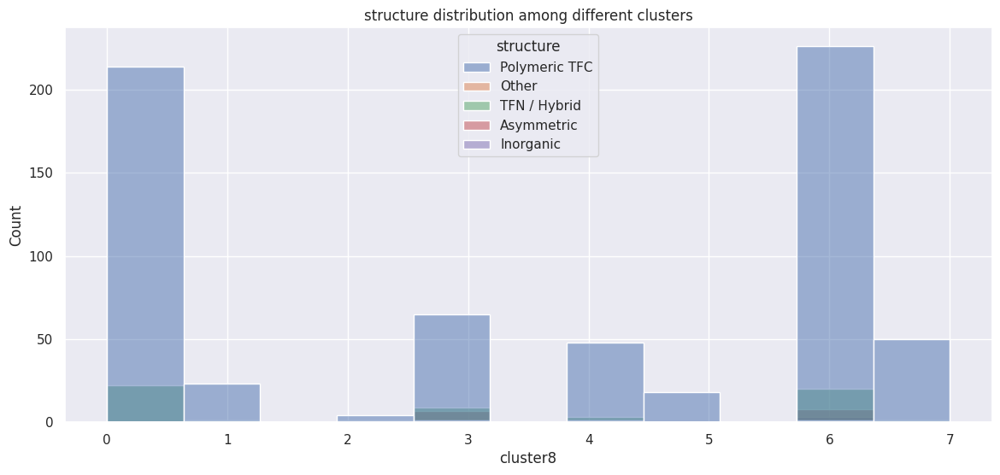

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster8',
             hue='structure',
             data=cluster_out).set(title = "structure distribution among different clusters")

In [ ]:
cluster_out.groupby(['cluster8'])['structure'].value_counts()

cluster8  structure    
0         Polymeric TFC    214
          TFN / Hybrid      22
1         Polymeric TFC     23
          Asymmetric         1
          TFN / Hybrid       1
2         Polymeric TFC      4
          Inorganic          1
3         Polymeric TFC     65
          TFN / Hybrid       9
          Asymmetric         7
          Other              1
4         Polymeric TFC     48
          TFN / Hybrid       3
          Other              1
5         Polymeric TFC     18
6         Polymeric TFC    226
          TFN / Hybrid      20
          Asymmetric         8
          Inorganic          3
          Other              1
7         Polymeric TFC     50
          Asymmetric         1
          TFN / Hybrid       1
Name: structure, dtype: int64

###Profiling for Chemistry

[Text(0.5, 1.0, 'chemistry distribution among different clusters')]

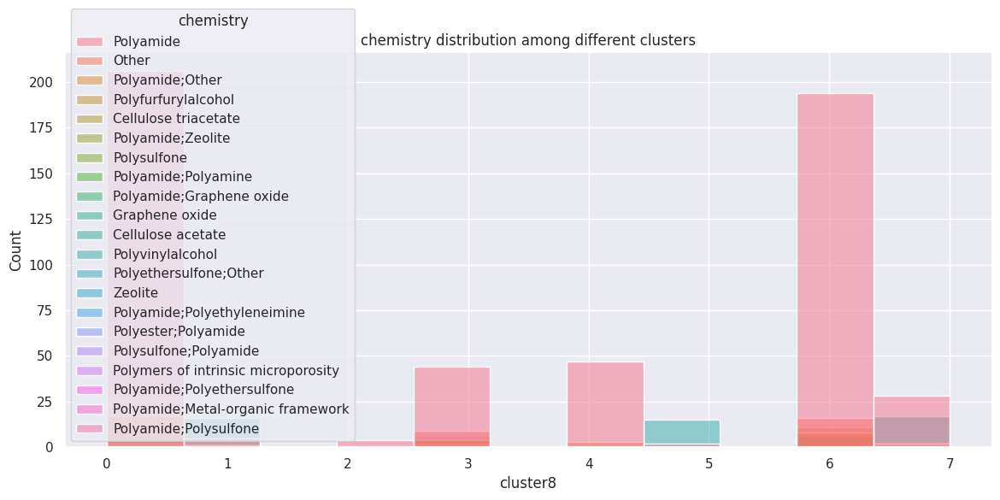

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster8',
             hue='chemistry',
             data=cluster_out).set(title = "chemistry distribution among different clusters")

In [ ]:
cluster_out.groupby(['cluster8'])['chemistry'].value_counts()

cluster8  chemistry                          
0         Polyamide                              206
          Polyamide;Other                         17
          Polyester;Polyamide                      5
          Polyamide;Metal-organic framework        4
          Graphene oxide                           2
          Polyamide;Graphene oxide                 1
          Polysulfone;Polyamide                    1
1         Polyvinylalcohol                        16
          Polyamide                                5
          Cellulose acetate                        1
          Other                                    1
          Polyamide;Other                          1
          Polyester;Polyamide                      1
2         Polyamide                                4
          Graphene oxide                           1
3         Polyamide                               44
          Other                                    9
          Polyamide;Polyethyleneimine              6


###Profiling for Modification

[Text(0.5, 1.0, 'modification distribution among different clusters')]

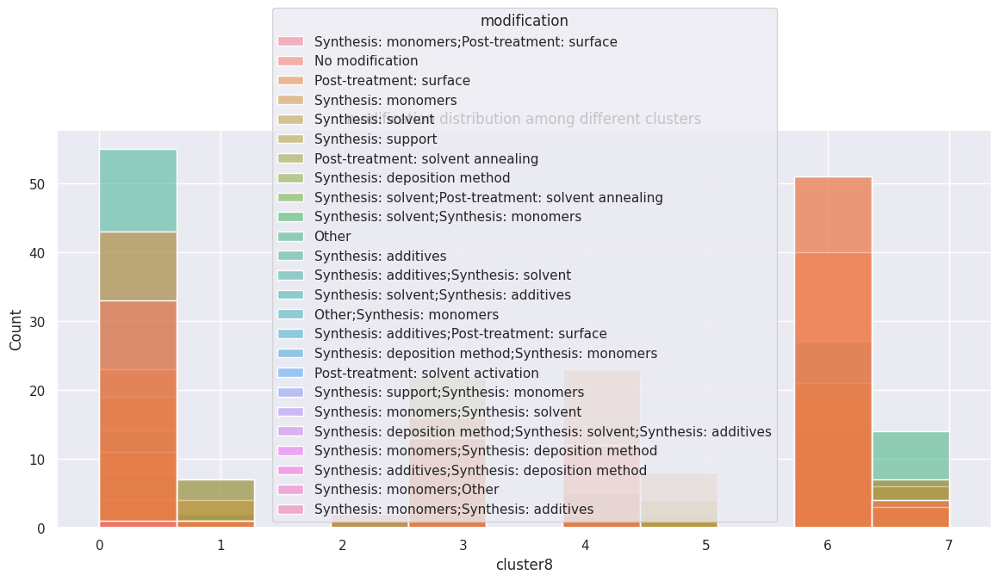

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster8',
             hue='modification',
             data=cluster_out).set(title = "modification distribution among different clusters")

In [ ]:
cluster_out.groupby(['cluster8'])['modification'].value_counts()

cluster8  modification                          
0         Synthesis: additives                      55
          Post-treatment: surface                   43
          No modification                           33
          Synthesis: monomers                       23
          Synthesis: support                        19
                                                    ..
7         Synthesis: solvent                         4
          Other;Synthesis: monomers                  3
          Post-treatment: surface                    3
          Synthesis: deposition method               3
          Synthesis: solvent;Synthesis: monomers     1
Name: modification, Length: 83, dtype: int64

###Profiling for Other Solutes

[Text(0.5, 1.0, 'otherSolutes distribution among different clusters')]

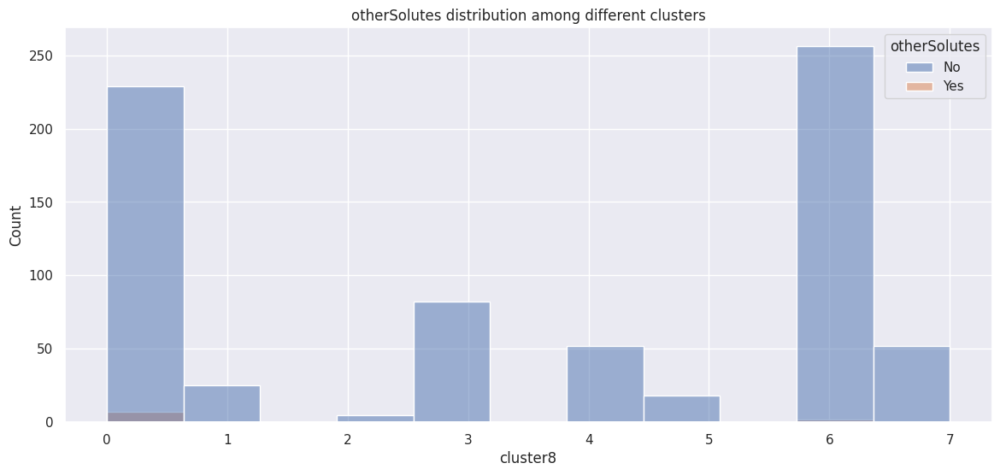

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster8',
             hue='otherSolutes',
             data=cluster_out).set(title = "otherSolutes distribution among different clusters")

In [ ]:
cluster_out.groupby(['cluster8'])['otherSolutes'].value_counts()

cluster8  otherSolutes
0         No              229
          Yes               7
1         No               25
2         No                5
3         No               82
4         No               52
5         No               18
6         No              256
          Yes               2
7         No               52
Name: otherSolutes, dtype: int64

###Profiling for Filtration Mode

[Text(0.5, 1.0, 'filtrationMode distribution among different clusters')]

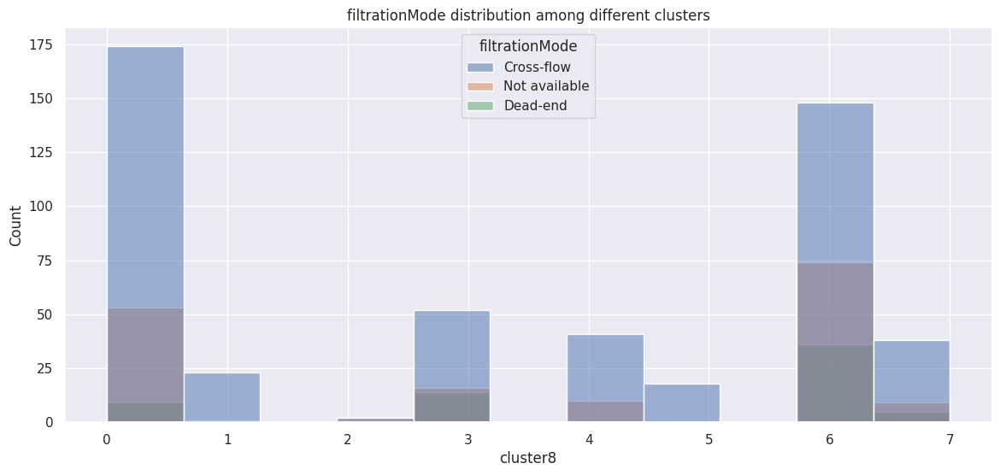

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster8',
             hue='filtrationMode',
             data=cluster_out).set(title = "filtrationMode distribution among different clusters")

In [ ]:
cluster_out.groupby(['cluster8'])['filtrationMode'].value_counts()

cluster8  filtrationMode
0         Cross-flow        174
          Not available      53
          Dead-end            9
1         Cross-flow         23
          Dead-end            1
          Not available       1
2         Cross-flow          2
          Not available       2
          Dead-end            1
3         Cross-flow         52
          Not available      16
          Dead-end           14
4         Cross-flow         41
          Not available      10
          Dead-end            1
5         Cross-flow         18
6         Cross-flow        148
          Not available      74
          Dead-end           36
7         Cross-flow         38
          Not available       9
          Dead-end            5
Name: filtrationMode, dtype: int64

###Profiling for Concentration Polarization Mode

[Text(0.5, 1.0, 'cpMode distribution among different clusters')]

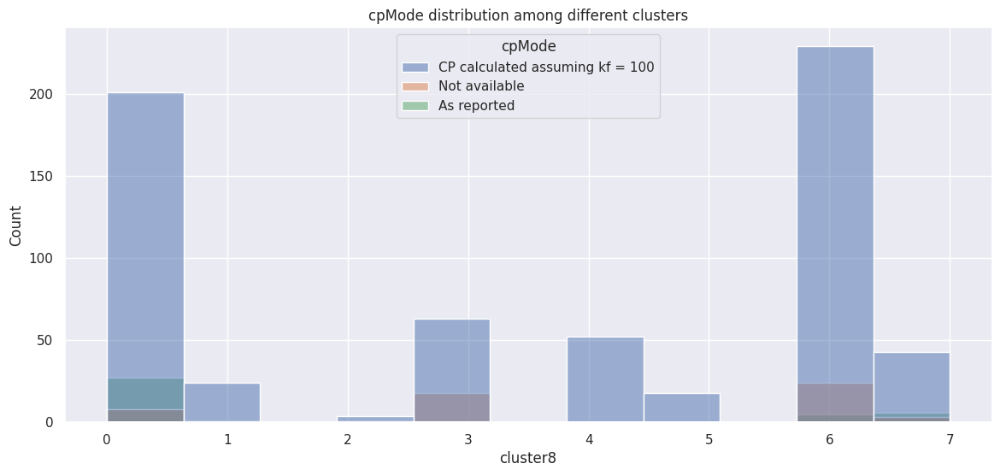

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster8',
             hue='cpMode',
             data=cluster_out).set(title = "cpMode distribution among different clusters")

In [ ]:
cluster_out.groupby(['cluster8'])['cpMode'].value_counts()

cluster8  cpMode                         
0         CP calculated assuming kf = 100    201
          As reported                         27
          Not available                        8
1         CP calculated assuming kf = 100     24
          As reported                          1
2         CP calculated assuming kf = 100      4
          Not available                        1
3         CP calculated assuming kf = 100     63
          Not available                       18
          As reported                          1
4         CP calculated assuming kf = 100     52
5         CP calculated assuming kf = 100     18
6         CP calculated assuming kf = 100    229
          Not available                       24
          As reported                          5
7         CP calculated assuming kf = 100     43
          As reported                          6
          Not available                        3
Name: cpMode, dtype: int64

##For All (Numerical)

In [ ]:
cluster_all.head(1)

,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,filtrationMode,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank,averageEfficiencyRank,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9,cluster10,cluster11
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.8,99.7,Cross-flow,0.03422,CP calculated assuming kf = 100,1.51,26.09,3,4,15,0,0,1,97.0,80.0,21.0,192.0,14.0,19.0,109.0,83.0,76.875,1,0,1,2,2,2,3,7,7,1


In [ ]:
sns.set(rc={'figure.figsize':(14,6)})

###Profiling for Water Permeability Coefficient



<Axes: xlabel='cluster11', ylabel='waterPermeabilityCoefficientRank'>

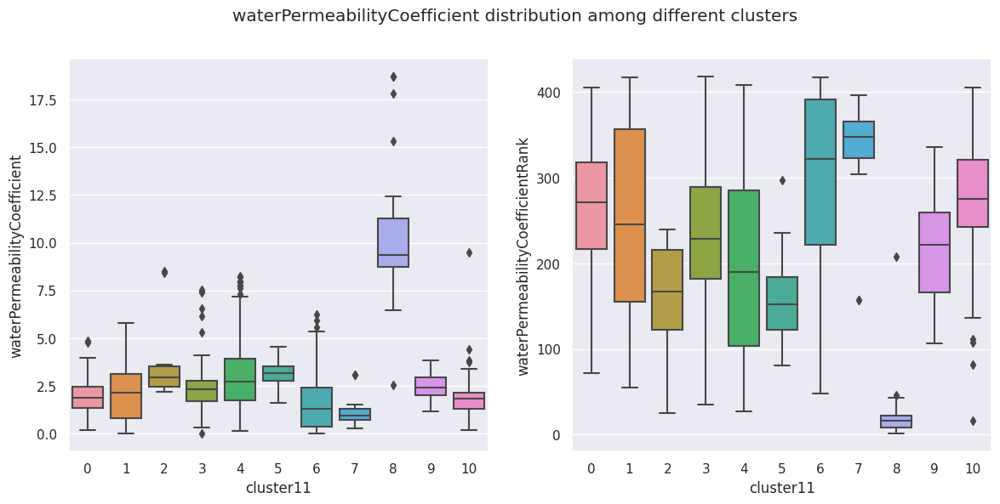

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("waterPermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='waterPermeabilityCoefficient', data=cluster_all)
sns.boxplot(ax=ax[1],x='cluster11', y='waterPermeabilityCoefficientRank', data=cluster_all)

In [ ]:
cluster_all.groupby('cluster11').agg({
    'waterPermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficient                                    \
                                 count      min       mean    max median   
cluster11                                                                  
0                                   53  0.19000   1.992264   4.87  1.890   
1                                   87  0.03000   2.073356   5.81  2.150   
2                                   31  2.20000   3.349634   8.53  2.960   
3                                   88  0.00160   2.447939   7.54  2.335   
4                                  209  0.14000   3.037810   8.24  2.710   
5                                    9  1.60497   3.087199   4.53  3.160   
6                                   95  0.03000   1.676632   6.25  1.300   
7                                   20  0.29000   1.166000   3.09  0.950   
8                                   32  2.54000  10.271768  18.69  9.370   
9                                   55  1.15000   2.405818   3.86  2.400   
10                                  49  0.19000   1.943061   9.50  1.850   

                               
               mode       std  
cluster11                      
0          1.820000  1.102561  
1          0.100000  1.399837  
2          3.460000  1.465094  
3          2.640000  1.460513  
4          2.740000  1.743068  
5          2.767951  0.845513  
6          0.220000  1.495859  
7          0.930000  0.749690  
8          9.120000  3.456947  
9          2.170000  0.669194  
10         1.890000  1.453969

In [ ]:
cluster_all.groupby('cluster11').agg({
    'waterPermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficientRank                                   \
                                     count    min        mean    max median   
cluster11                                                                     
0                                       53   72.0  260.641509  405.0  271.0   
1                                       87   55.0  254.183908  417.0  245.0   
2                                       31   25.0  159.580645  240.0  167.0   
3                                       88   35.0  231.352273  418.0  228.5   
4                                      209   27.0  195.454545  408.0  190.0   
5                                        9   81.0  166.111111  297.0  152.0   
6                                       95   48.0  290.652632  417.0  322.0   
7                                       20  157.0  329.050000  396.0  347.5   
8                                       32    1.0   22.781250  208.0   16.0   
9                                       55  106.0  221.272727  336.0  222.0   
10                                      49   16.0  271.857143  405.0  275.0   

                              
            mode         std  
cluster11                     
0          278.0   88.743168  
1          412.0  109.830157  
2          130.0   57.039036  
3          197.0   89.797606  
4          187.0  101.262412  
5          184.0   65.995160  
6          402.0  109.533223  
7          349.0   64.376749  
8           17.0   35.995281  
9          243.0   61.319580  
10         271.0   87.007184

###Profiling for Real Rejection Coefficient

<Axes: xlabel='cluster11', ylabel='realRejectionRank'>

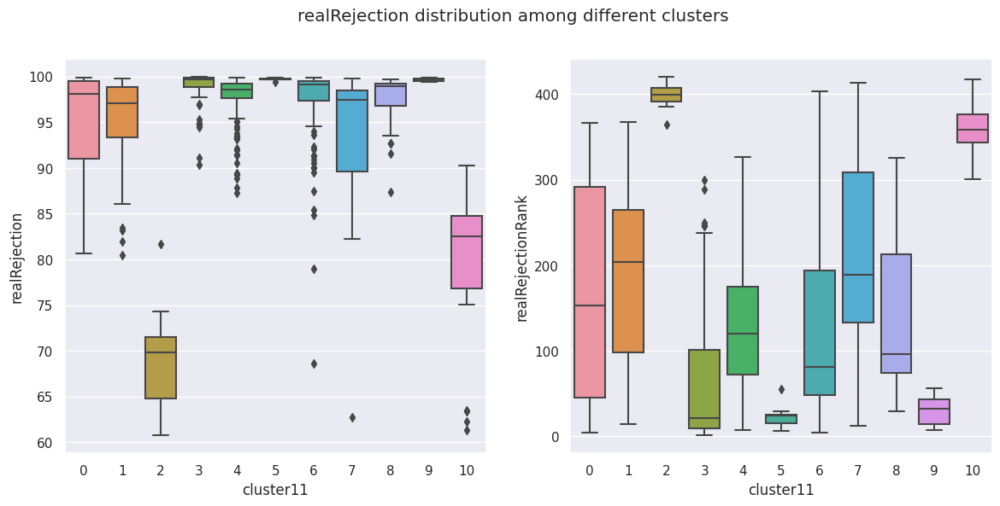

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("realRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='realRejection', data=cluster_all)
sns.boxplot(ax=ax[1],x='cluster11', y='realRejectionRank', data=cluster_all)

In [ ]:
cluster_all.groupby('cluster11').agg({
    'realRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejection                                                  
                  count    min       mean    max  median   mode       std
cluster11                                                                
0                    53  80.64  95.236981  99.90  98.090  99.10  5.167694
1                    87  80.42  95.665287  99.80  97.050  99.71  4.430408
2                    31  60.75  68.518065  81.66  69.780  62.20  4.721614
3                    88  90.38  98.971932  99.94  99.725  99.92  1.768551
4                   209  87.29  97.849104  99.87  98.600  98.81  2.352671
5                     9  99.39  99.711111  99.88  99.700  99.88  0.145640
6                    95  68.63  97.025158  99.90  99.080  99.73  4.863550
7                    20  62.77  92.791000  99.82  97.400  98.57  8.786287
8                    32  87.35  97.455000  99.66  98.895  99.30  2.906706
9                    55  99.38  99.640909  99.87  99.630  99.86  0.151624
10                   49  61.36  80.415918  90.26  82.500  85.56  6.666190

In [ ]:
cluster_all.groupby('cluster11').agg({
    'realRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejectionRank                                          \
                      count    min        mean    max median   mode   
cluster11                                                             
0                        53    4.0  168.584906  366.0  153.0   80.0   
1                        87   14.0  181.091954  367.0  204.0   23.0   
2                        31  364.0  399.548387  420.0  399.0  415.0   
3                        88    1.0   62.568182  300.0   21.5    2.0   
4                       209    7.0  130.334928  326.0  120.0  103.0   
5                         9    6.0   23.000000   55.0   24.0    6.0   
6                        95    4.0  126.115789  403.0   81.0   21.0   
7                        20   12.0  211.350000  413.0  189.0  123.0   
8                        32   29.0  136.937500  325.0   96.5   63.0   
9                        55    7.0   30.436364   56.0   32.0    8.0   
10                       49  301.0  359.857143  417.0  358.0  336.0   

                       
                  std  
cluster11              
0          123.096028  
1          101.645031  
2           12.268764  
3           77.451178  
4           76.797766  
5           14.611639  
6          103.916380  
7          116.908545  
8           84.710108  
9           15.468922  
10          25.259487

###Profiling for Observed Solute Rejection Coefficient

<Axes: xlabel='cluster11', ylabel='observedSoluteRejectionRank'>

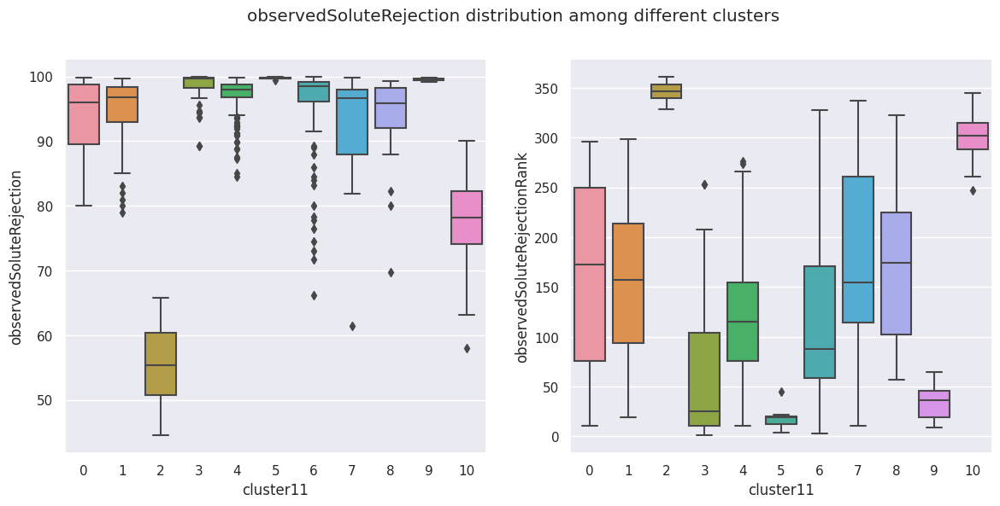

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("observedSoluteRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='observedSoluteRejection', data=cluster_all)
sns.boxplot(ax=ax[1],x='cluster11', y='observedSoluteRejectionRank', data=cluster_all)

In [ ]:
cluster_all.groupby('cluster11').agg({
    'observedSoluteRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejection                                         \
                            count    min       mean    max median   mode   
cluster11                                                                  
0                              53  80.00  93.917925  99.80  95.98  98.90   
1                              87  79.00  94.866910  99.70  96.80  99.60   
2                              31  44.50  55.509355  65.80  55.40  53.40   
3                              88  89.20  98.669318  99.91  99.62  99.70   
4                             209  84.50  97.166761  99.80  97.99  99.50   
5                               9  99.39  99.711111  99.88  99.70  99.88   
6                              95  66.20  95.305158  99.89  98.50  99.10   
7                              20  61.40  91.971040  99.80  96.71  98.00   
8                              32  69.68  93.933437  99.25  95.90  97.90   
9                              55  99.10  99.507818  99.82  99.48  99.80   
10                             49  58.00  77.490000  90.00  78.20  78.20   

                     
                std  
cluster11            
0          5.547187  
1          4.952623  
2          5.845264  
3          2.068500  
4          2.705580  
5          0.145640  
6          7.305678  
7          9.240559  
8          6.520197  
9          0.197312  
10         6.716888

In [ ]:
cluster_all.groupby('cluster11').agg({
    'observedSoluteRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejectionRank                                          \
                                count    min        mean    max median   mode   
cluster11                                                                       
0                                  53   11.0  163.094340  296.0  173.0   73.0   
1                                  87   19.0  155.885057  299.0  157.0   27.0   
2                                  31  329.0  346.290323  361.0  347.0  350.0   
3                                  88    1.0   59.931818  253.0   25.5   19.0   
4                                 209   11.0  120.650718  276.0  115.0   35.0   
5                                   9    4.0   18.111111   45.0   19.0    4.0   
6                                  95    3.0  122.736842  328.0   88.0   65.0   
7                                  20   11.0  176.450000  337.0  154.5  114.0   
8                                  32   57.0  169.062500  323.0  174.0  121.0   
9                                  55    9.0   34.763636   65.0   36.0   11.0   
10                                 49  247.0  300.938776  345.0  302.0  302.0   

                      
                 std  
cluster11             
0          90.318936  
1          80.324259  
2           9.194903  
3          65.512971  
4          60.696419  
5          12.139238  
6          91.355421  
7          95.639936  
8          74.169352  
9          16.019622  
10         19.804680

###Profiling for Solute Permeability Coefficient

<Axes: xlabel='cluster11', ylabel='solutePermeabilityCoefficientRank'>

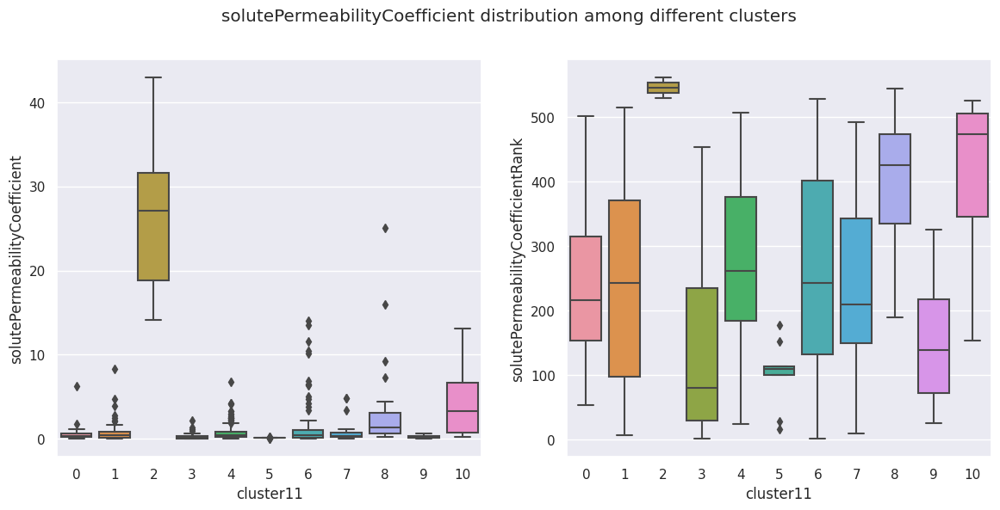

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("solutePermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='solutePermeabilityCoefficient', data=cluster_all)
sns.boxplot(ax=ax[1],x='cluster11', y='solutePermeabilityCoefficientRank', data=cluster_all)

In [ ]:
cluster_all.groupby('cluster11').agg({
    'solutePermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficient                               \
                                  count      min       mean      max   
cluster11                                                              
0                                    53   0.0586   0.533568   6.2220   
1                                    87   0.0154   0.742236   8.3102   
2                                    31  14.0900  26.510642  42.9300   
3                                    88   0.0002   0.234027   2.1323   
4                                   209   0.0340   0.741708   6.8000   
5                                     9   0.0267   0.123533   0.2414   
6                                    95   0.0075   1.546120  14.0570   
7                                    20   0.0200   0.954970   4.8557   
8                                    32   0.2700   3.122197  25.0800   
9                                    55   0.0355   0.213615   0.6329   
10                                   49   0.1900   4.271474  13.1100   

                                        
             median     mode       std  
cluster11                               
0           0.33000   0.3500  0.862302  
1           0.39000   0.0972  1.154155  
2          27.16000  30.2626  8.085177  
3           0.08640   0.0510  0.335946  
4           0.43860   0.3700  0.876530  
5           0.12870   0.1304  0.066035  
6           0.39000   0.2500  2.929384  
7           0.31420   0.4936  1.526211  
8           1.40075   4.3710  5.127181  
9           0.16750   0.3000  0.149061  
10          3.30890   2.9200  3.658874

In [ ]:
cluster_all.groupby('cluster11').agg({
    'solutePermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficientRank                                   \
                                      count    min        mean    max median   
cluster11                                                                      
0                                        53   54.0  234.415094  502.0  216.0   
1                                        87    7.0  246.229885  515.0  243.0   
2                                        31  529.0  545.516129  561.0  546.0   
3                                        88    1.0  128.875000  454.0   80.5   
4                                       209   24.0  272.808612  507.0  262.0   
5                                         9   16.0  101.777778  177.0  110.0   
6                                        95    2.0  261.989474  528.0  243.0   
7                                        20   10.0  241.950000  492.0  209.5   
8                                        32  190.0  395.625000  544.0  425.0   
9                                        55   26.0  147.218182  326.0  139.0   
10                                       49  154.0  418.224490  526.0  474.0   

                              
            mode         std  
cluster11                     
0          222.0  103.182891  
1           91.0  145.013768  
2          552.0    9.587739  
3           44.0  122.491361  
4          235.0  120.173119  
5          113.0   51.618257  
6          183.0  160.920854  
7          284.0  148.179647  
8          488.0   95.765086  
9          205.0   82.582549  
10         469.0  122.189447

###Profiling for Pressure Difference Coefficient

<Axes: xlabel='cluster11', ylabel='pressureDiffRank'>

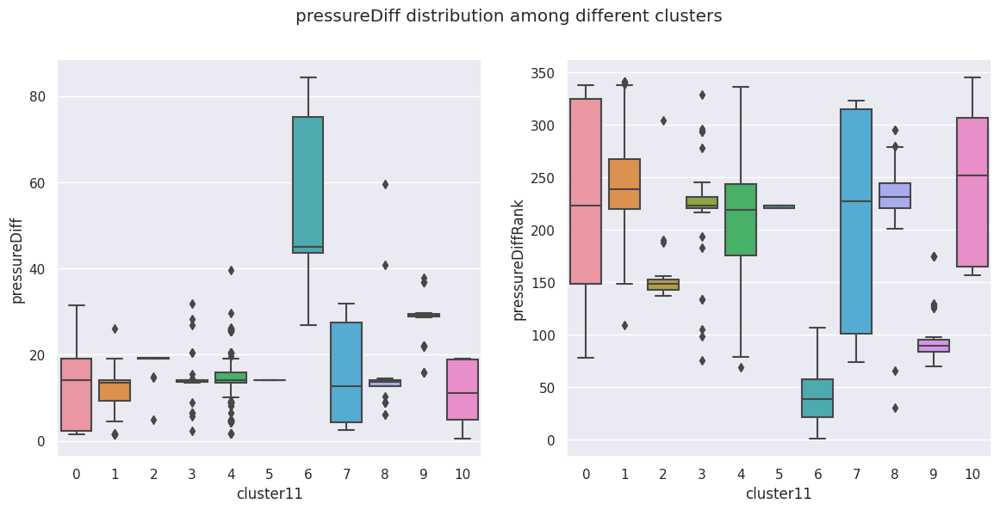

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("pressureDiff distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='pressureDiff', data=cluster_all)
sns.boxplot(ax=ax[1],x='cluster11', y='pressureDiffRank', data=cluster_all)

In [ ]:
cluster_all.groupby('cluster11').agg({
    'pressureDiff': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiff                                                       
                 count    min       mean        max  median   mode        std
cluster11                                                                    
0                   53   1.59  12.538800  31.454000  13.990  25.48   9.173338
1                   87   1.55  11.720632  26.090000  13.550  14.00   4.585866
2                   31   4.92  18.406588  19.320000  19.120  19.06   2.739126
3                   88   2.28  14.026205  31.816000  13.990  13.99   3.676818
4                  209   1.62  14.631950  39.580000  14.010  14.01   5.888563
5                    9  13.99  13.993333  14.000000  13.990  13.99   0.005000
6                   95  26.85  56.032502  84.260000  44.980  75.14  18.181560
7                   20   2.45  15.350200  31.824000  12.710  27.51  11.844499
8                   32   6.14  14.734069  59.630000  13.730  14.00   9.937434
9                   55  15.78  28.219367  37.832751  29.000  28.99   4.419506
10                  49   0.45  10.870681  18.980000  11.017   0.45   7.467635

In [ ]:
cluster_all.groupby('cluster11').agg({
    'pressureDiffRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiffRank                                                    
                     count    min        mean    max median   mode         std
cluster11                                                                     
0                       53   78.0  233.169811  338.0  223.0  117.0   84.811042
1                       87  109.0  243.367816  341.0  239.0  221.0   47.098145
2                       31  137.0  154.677419  304.0  149.0  153.0   30.138997
3                       88   76.0  223.681818  329.0  223.0  223.0   35.124261
4                      209   69.0  214.521531  336.0  219.0  219.0   58.264737
5                        9  221.0  222.333333  223.0  223.0  223.0    1.000000
6                       95    1.0   42.536842  107.0   39.0   27.0   27.396152
7                       20   74.0  209.850000  323.0  227.5  101.0  106.391172
8                       32   31.0  228.468750  295.0  231.0  221.0   54.121121
9                       55   70.0   96.454545  175.0   90.0   91.0   23.718892
10                      49  157.0  245.510204  345.0  252.0  345.0   75.610880

###Profiling for Concentration Polarization

<Axes: xlabel='cluster11', ylabel='concentrationPolarizationRank'>

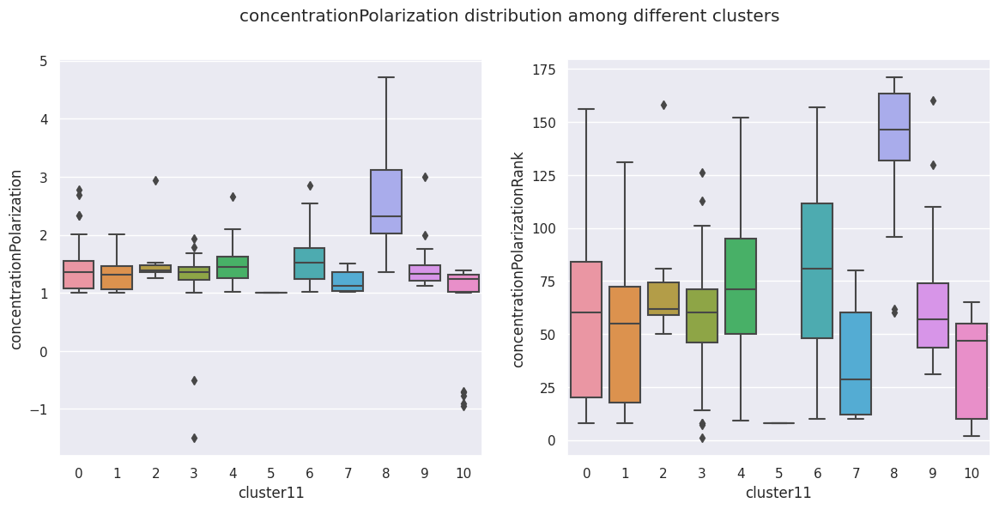

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("concentrationPolarization distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='concentrationPolarization', data=cluster_all)
sns.boxplot(ax=ax[1],x='cluster11', y='concentrationPolarizationRank', data=cluster_all)

In [ ]:
cluster_all.groupby('cluster11').agg({
    'concentrationPolarization': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarization                                        \
                              count   min      mean      max median  mode   
cluster11                                                                   
0                                53  1.00  1.410868  2.78000  1.360  1.38   
1                                87  1.00  1.299920  2.01000  1.310  1.01   
2                                31  1.26  1.448894  2.94571  1.380  1.35   
3                                88 -1.50  1.296705  1.93000  1.360  1.41   
4                               209  1.01  1.471079  2.66000  1.440  1.38   
5                                 9  1.00  1.000000  1.00000  1.000  1.00   
6                                95  1.02  1.562737  2.85000  1.520  1.83   
7                                20  1.02  1.188500  1.51000  1.115  1.02   
8                                32  1.36  2.551740  4.71000  2.320  2.28   
9                                55  1.12  1.404750  3.00295  1.330  1.47   
10                               49 -0.95  1.003630  1.39285  1.240  1.31   

                     
                std  
cluster11            
0          0.413729  
1          0.250255  
2          0.286939  
3          0.401971  
4          0.266081  
5          0.000000  
6          0.375940  
7          0.174243  
8          0.798570  
9          0.288377  
10         0.631429

In [ ]:
cluster_all.groupby('cluster11').agg({
    'concentrationPolarizationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarizationRank                                  \
                                  count   min        mean    max median   
cluster11                                                                 
0                                    53   8.0   60.320755  156.0   60.0   
1                                    87   8.0   50.609195  131.0   55.0   
2                                    31  50.0   68.290323  158.0   62.0   
3                                    88   1.0   57.909091  126.0   60.0   
4                                   209   9.0   73.157895  152.0   71.0   
5                                     9   8.0    8.000000    8.0    8.0   
6                                    95  10.0   81.284211  157.0   81.0   
7                                    20  10.0   36.000000   80.0   28.5   
8                                    32  60.0  140.125000  171.0  146.5   
9                                    55  31.0   64.636364  160.0   57.0   
10                                   49   2.0   36.448980   65.0   47.0   

                             
            mode        std  
cluster11                    
0           62.0  41.545977  
1            9.0  33.166723  
2           59.0  18.864771  
3           68.0  24.247591  
4           62.0  30.700773  
5            8.0   0.000000  
6          116.0  39.499707  
7           10.0  25.509544  
8          145.0  30.154174  
9           74.0  25.691448  
10          55.0  22.004792

###Profiling for Salt Concentration

<Axes: xlabel='cluster11', ylabel='saltConcentrationRank'>

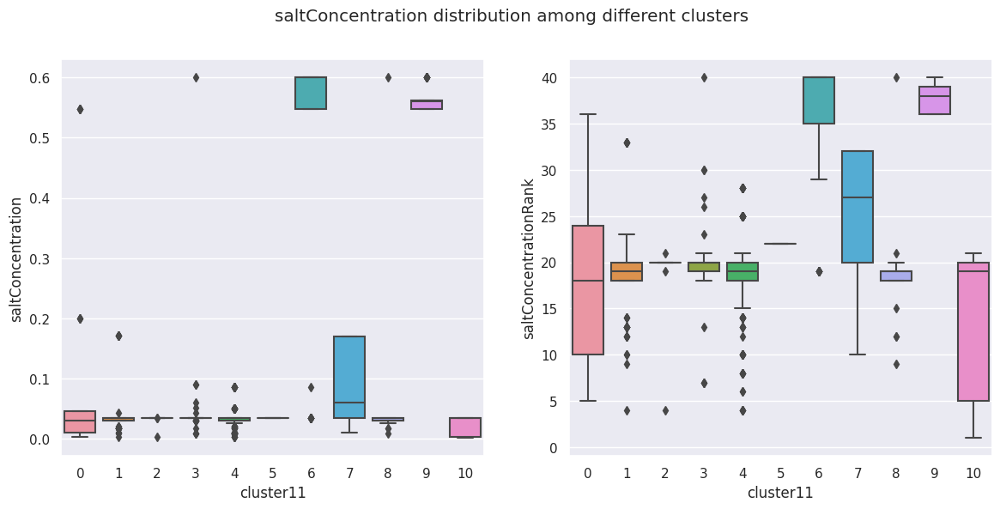

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("saltConcentration distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='saltConcentration', data=cluster_all)
sns.boxplot(ax=ax[1],x='cluster11', y='saltConcentrationRank', data=cluster_all)

In [ ]:
cluster_all.groupby('cluster11').agg({
    'saltConcentration': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentration                                                    \
                      count       min      mean       max    median      mode   
cluster11                                                                       
0                        53  0.003420  0.073681  0.547600  0.030000  0.010000   
1                        87  0.003400  0.037536  0.171100  0.034000  0.034000   
2                        31  0.003400  0.033201  0.034220  0.034200  0.034200   
3                        88  0.008556  0.040934  0.600000  0.034200  0.034200   
4                       209  0.003400  0.033035  0.085500  0.034000  0.034000   
5                         9  0.034223  0.034223  0.034223  0.034223  0.034223   
6                        95  0.034000  0.527701  0.600000  0.600000  0.600000   
7                        20  0.010000  0.085035  0.170000  0.059900  0.170000   
8                        32  0.008600  0.048465  0.600000  0.034000  0.034000   
9                        55  0.547600  0.563295  0.600000  0.560000  0.560000   
10                       49  0.001540  0.021471  0.034220  0.034000  0.034200   

                     
                std  
cluster11            
0          0.143310  
1          0.034085  
2          0.005531  
3          0.061197  
4          0.014820  
5          0.000000  
6          0.170026  
7          0.063118  
8          0.100819  
9          0.018317  
10         0.014732

In [ ]:
cluster_all.groupby('cluster11').agg({
    'saltConcentrationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentrationRank                                              
                          count   min       mean   max median  mode       std
cluster11                                                                    
0                            53   5.0  18.132075  36.0   18.0  10.0  8.766277
1                            87   4.0  18.678161  33.0   19.0  19.0  4.956777
2                            31   4.0  19.483871  21.0   20.0  20.0  2.885261
3                            88   7.0  19.659091  40.0   20.0  20.0  3.865219
4                           209   4.0  18.454545  28.0   19.0  19.0  4.620095
5                             9  22.0  22.000000  22.0   22.0  22.0  0.000000
6                            95  19.0  36.631579  40.0   40.0  40.0  6.198923
7                            20  10.0  24.800000  32.0   27.0  32.0  7.990784
8                            32   9.0  18.625000  40.0   19.0  19.0  4.633329
9                            55  36.0  37.854545  40.0   38.0  38.0  1.419679
10                           49   1.0  13.489796  21.0   19.0  20.0  7.754360

###Profiling for Water/Salt Selectivity Coefficient

<Axes: xlabel='cluster11', ylabel='Water/Salt-SelectivityRank'>

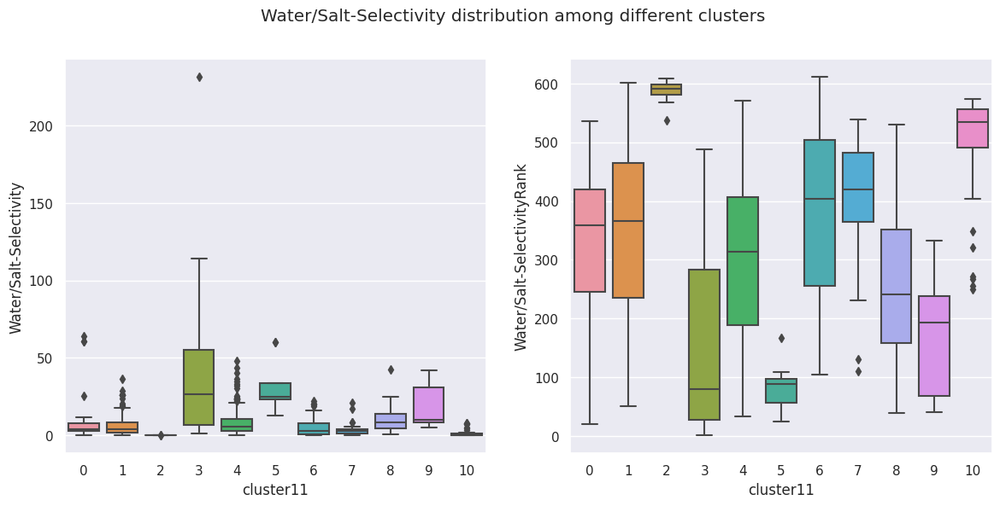

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("Water/Salt-Selectivity distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster11', y='Water/Salt-Selectivity', data=cluster_all)
sns.boxplot(ax=ax[1],x='cluster11', y='Water/Salt-SelectivityRank', data=cluster_all)

In [ ]:
cluster_all.groupby('cluster11').agg({
    'Water/Salt-Selectivity': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-Selectivity                                               \
                           count        min       mean         max     median   
cluster11                                                                       
0                             53   0.404255   8.443433   64.006515   4.155645   
1                             87   0.100000   7.149528   36.500000   3.900000   
2                             31   0.083053   0.130101    0.347881   0.125274   
3                             88   1.300000  36.889406  231.250000  26.733259   
4                            209   0.200000   8.495407   48.245614   5.653677   
5                              9  13.083700  32.189516   60.012050  24.818100   
6                             95   0.026670   4.982012   22.076923   3.160000   
7                             20   0.340116   4.637209   21.142857   2.718596   
8                             32   0.496013   9.929992   42.370370   8.250000   
9                             55   4.945489  18.477978   41.793893  10.000000   
10                            49   0.165523   1.402857    7.965517   0.427673   

                                 
                mode        std  
cluster11                        
0           2.145000  13.837249  
1          26.100000   8.300168  
2           0.114333   0.047647  
3           1.300000  38.209708  
4           2.500000   8.382695  
5          21.218690  16.683114  
6          10.000000   5.326189  
7           2.552674   5.515534  
8           4.300000   8.327840  
9          14.923077  12.763360  
10          1.200000   2.120759

In [ ]:
cluster_all.groupby('cluster11').agg({
    'Water/Salt-SelectivityRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-SelectivityRank                                          \
                               count    min        mean    max median   mode   
cluster11                                                                      
0                                 53   20.0  330.094340  536.0  358.0  441.0   
1                                 87   51.0  343.482759  601.0  366.0   84.0   
2                                 31  538.0  589.129032  609.0  591.0  596.0   
3                                 88    1.0  154.522727  488.0   80.5  488.0   
4                                209   33.0  300.511962  570.0  313.0  428.0   
5                                  9   25.0   81.222222  167.0   89.0  109.0   
6                                 95  105.0  382.336842  611.0  404.0  193.0   
7                                 20  110.0  389.200000  539.0  420.0  425.0   
8                                 32   39.0  262.531250  530.0  240.5  351.0   
9                                 55   40.0  166.054545  332.0  193.0  142.0   
10                                49  250.0  498.428571  574.0  534.0  491.0   

                       
                  std  
cluster11              
0          127.033500  
1          146.906699  
2           14.087209  
3          152.227747  
4          130.493557  
5           43.899823  
6          147.757464  
7          124.661901  
8          130.167134  
9           92.160170  
10          89.879085

###Profiling for Structure

[Text(0.5, 1.0, 'structure distribution among different clusters')]

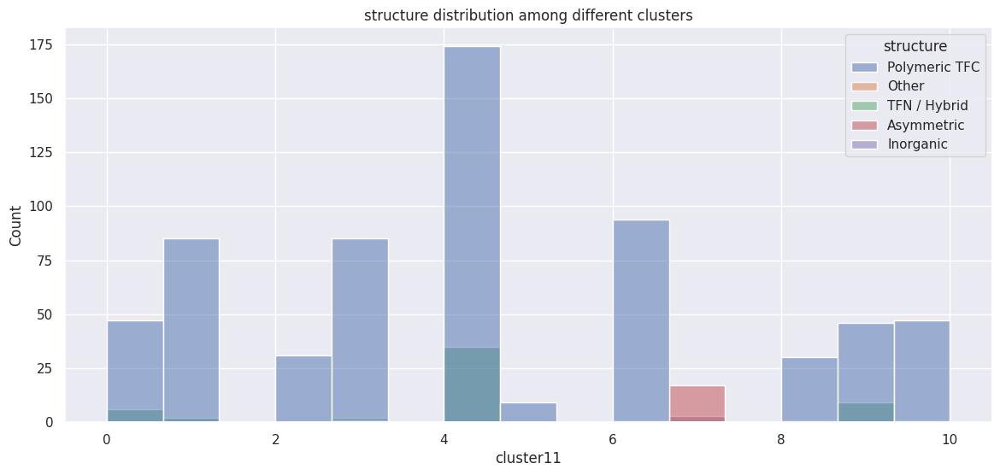

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='structure',
             data=cluster_all).set(title = "structure distribution among different clusters")

In [ ]:
cluster_all.groupby(['cluster11'])['structure'].value_counts()

cluster11  structure    
0          Polymeric TFC     47
           TFN / Hybrid       6
1          Polymeric TFC     85
           TFN / Hybrid       2
2          Polymeric TFC     31
3          Polymeric TFC     85
           TFN / Hybrid       2
           Other              1
4          Polymeric TFC    174
           TFN / Hybrid      35
5          Polymeric TFC      9
6          Polymeric TFC     94
           Other              1
7          Asymmetric        17
           Inorganic          3
8          Polymeric TFC     30
           Inorganic          1
           TFN / Hybrid       1
9          Polymeric TFC     46
           TFN / Hybrid       9
10         Polymeric TFC     47
           Other              1
           TFN / Hybrid       1
Name: structure, dtype: int64

###Profiling for Chemistry

[Text(0.5, 1.0, 'chemistry distribution among different clusters')]

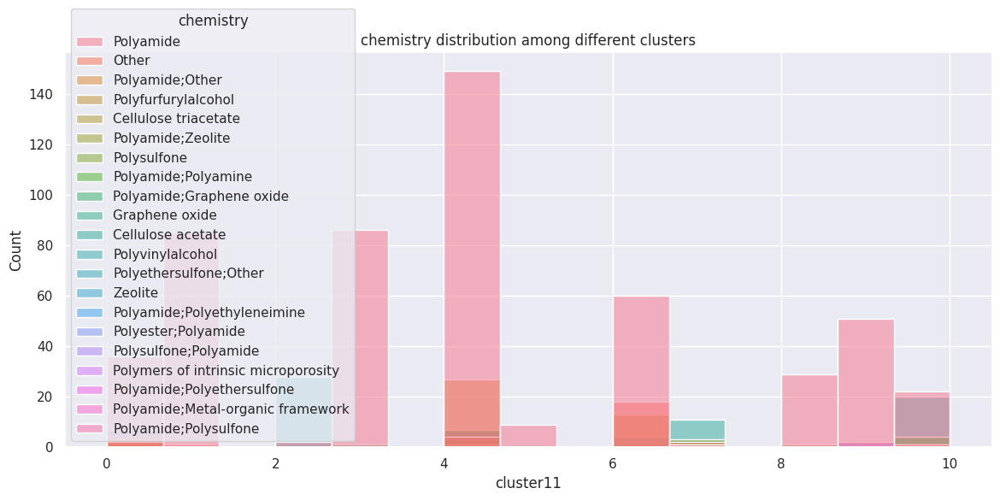

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='chemistry',
             data=cluster_all).set(title = "chemistry distribution among different clusters")

In [ ]:
cluster_all.groupby(['cluster11'])['chemistry'].value_counts()

cluster11  chemistry                          
0          Polyamide                               36
           Polyamide;Polyethyleneimine              7
           Polysulfone                              4
           Polyamide;Other                          3
           Other                                    2
           Polyamide;Graphene oxide                 1
1          Polyamide                               85
           Other                                    1
           Polyamide;Other                          1
2          Polyvinylalcohol                        28
           Polyamide                                2
           Polyester;Polyamide                      1
3          Polyamide                               86
           Polyamide;Graphene oxide                 1
           Polyethersulfone;Other                   1
4          Polyamide                              149
           Polyamide;Other                         27
           Polyamide;Graphene oxide

###Profiling for Modification

[Text(0.5, 1.0, 'modification distribution among different clusters')]

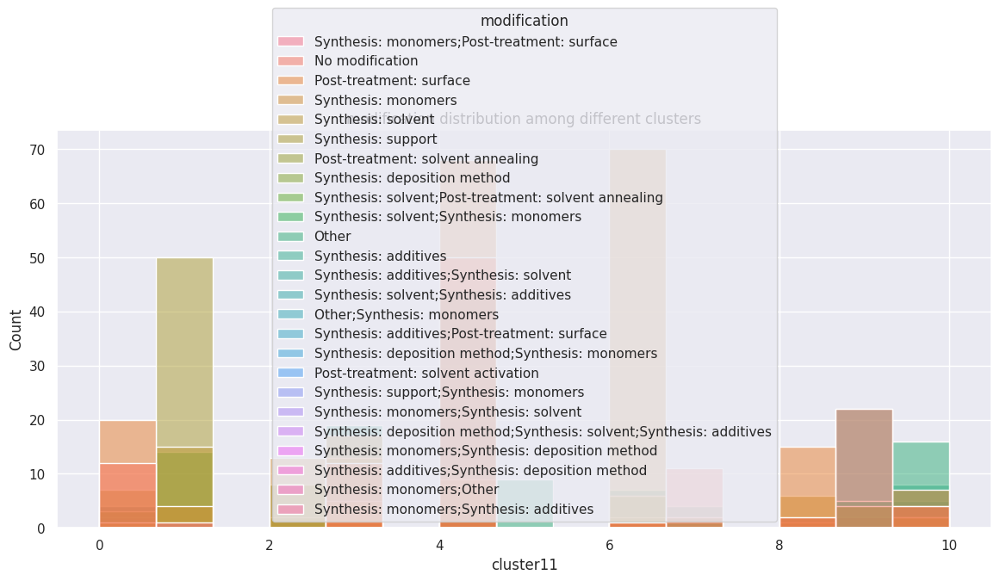

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='modification',
             data=cluster_all).set(title = "modification distribution among different clusters")

In [ ]:
cluster_all.groupby(['cluster11'])['modification'].value_counts()

cluster11  modification                                    
0          Post-treatment: surface                             20
           No modification                                     12
           Synthesis: support                                   7
           Synthesis: additives                                 4
           Synthesis: monomers;Other                            4
                                                               ..
10         No modification                                      4
           Synthesis: solvent                                   4
           Synthesis: deposition method                         2
           Synthesis: support                                   2
           Synthesis: monomers;Synthesis: deposition method     1
Name: modification, Length: 80, dtype: int64

###Profiling for Other Solutes

[Text(0.5, 1.0, 'otherSolutes distribution among different clusters')]

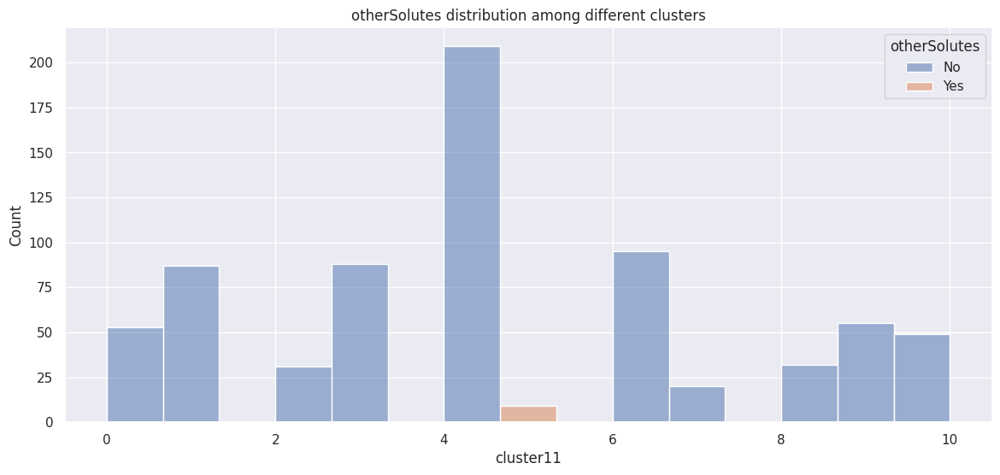

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='otherSolutes',
             data=cluster_all).set(title = "otherSolutes distribution among different clusters")

In [ ]:
cluster_all.groupby(['cluster11'])['otherSolutes'].value_counts()

cluster11  otherSolutes
0          No               53
1          No               87
2          No               31
3          No               88
4          No              209
5          Yes               9
6          No               95
7          No               20
8          No               32
9          No               55
10         No               49
Name: otherSolutes, dtype: int64

###Profiling for Filtration Mode

[Text(0.5, 1.0, 'filtrationMode distribution among different clusters')]

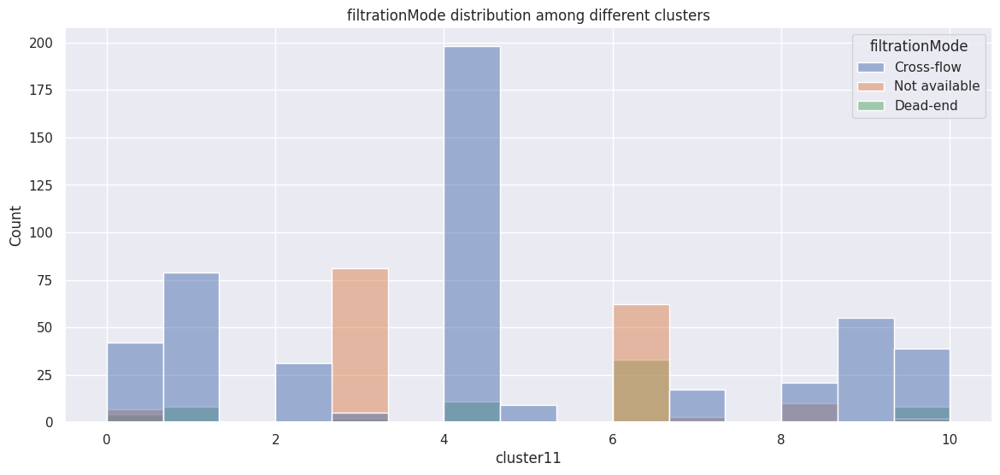

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='filtrationMode',
             data=cluster_all).set(title = "filtrationMode distribution among different clusters")

In [ ]:
cluster_all.groupby(['cluster11'])['filtrationMode'].value_counts()

cluster11  filtrationMode
0          Cross-flow         42
           Not available       7
           Dead-end            4
1          Cross-flow         79
           Dead-end            8
2          Cross-flow         31
3          Not available      81
           Cross-flow          5
           Dead-end            2
4          Cross-flow        198
           Dead-end           11
5          Cross-flow          9
6          Not available      62
           Dead-end           33
7          Cross-flow         17
           Not available       3
8          Cross-flow         21
           Not available      10
           Dead-end            1
9          Cross-flow         55
10         Cross-flow         39
           Dead-end            8
           Not available       2
Name: filtrationMode, dtype: int64

###Profiling for Concentration Polarization Mode

[Text(0.5, 1.0, 'cpMode distribution among different clusters')]

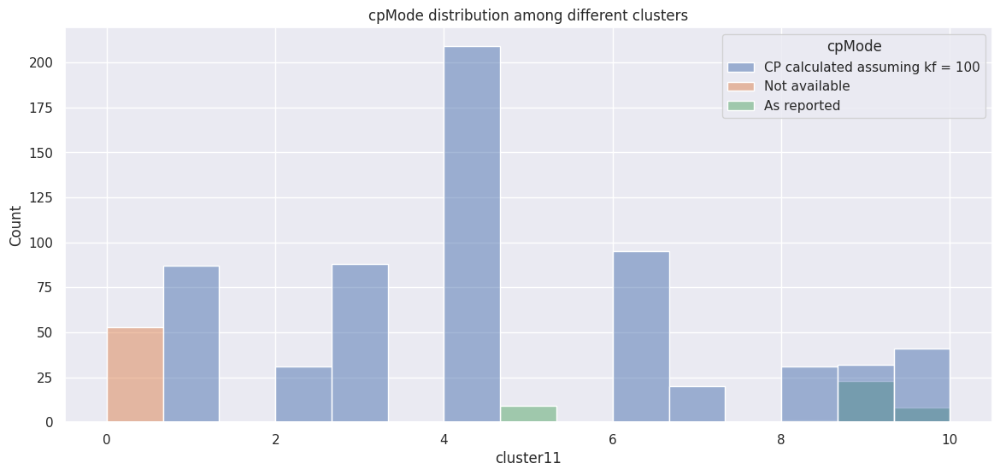

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster11',
             hue='cpMode',
             data=cluster_all).set(title = "cpMode distribution among different clusters")

In [ ]:
cluster_all.groupby(['cluster11'])['cpMode'].value_counts()

cluster11  cpMode                         
0          Not available                       53
1          CP calculated assuming kf = 100     87
2          CP calculated assuming kf = 100     31
3          CP calculated assuming kf = 100     88
4          CP calculated assuming kf = 100    209
5          As reported                          9
6          CP calculated assuming kf = 100     95
7          CP calculated assuming kf = 100     20
8          CP calculated assuming kf = 100     31
           Not available                        1
9          CP calculated assuming kf = 100     32
           As reported                         23
10         CP calculated assuming kf = 100     41
           As reported                          8
Name: cpMode, dtype: int64

##For Inputs (Rank)

In [ ]:
cluster_inr.head(1)

,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,filtrationMode,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank,averageEfficiencyRank,cluster2,cluster3,cluster4,cluster5
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.8,99.7,Cross-flow,0.03422,CP calculated assuming kf = 100,1.51,26.09,3,4,15,0,0,1,97.0,80.0,21.0,192.0,14.0,19.0,109.0,83.0,76.875,0,1,0,0


In [ ]:
sns.set(rc={'figure.figsize':(14,6)})

###Profiling for Water Permeability Coefficient



<Axes: xlabel='cluster5', ylabel='waterPermeabilityCoefficientRank'>

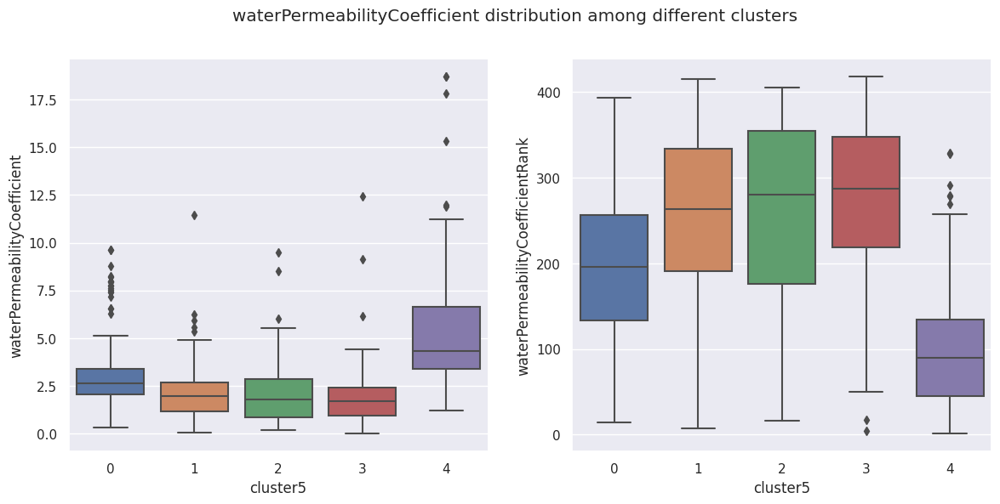

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("waterPermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster5', y='waterPermeabilityCoefficient', data=cluster_inr)
sns.boxplot(ax=ax[1],x='cluster5', y='waterPermeabilityCoefficientRank', data=cluster_inr)

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'waterPermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficient                                        \
                                count     min      mean    max median  mode   
cluster5                                                                      
0                                 192  0.3200  3.031066   9.63  2.655  2.64   
1                                 146  0.0500  2.052856  11.44  1.970  1.82   
2                                  84  0.1900  2.060286   9.50  1.795  2.99   
3                                 199  0.0016  1.830183  12.44  1.720  1.82   
4                                 107  1.2300  5.493372  18.69  4.310  2.35   

                    
               std  
cluster5            
0         1.768155  
1         1.484067  
2         1.702756  
3         1.395272  
4         3.516094

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'waterPermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficientRank                                  \
                                    count   min        mean    max median   
cluster5                                                                    
0                                     192  14.0  194.895833  393.0  195.5   
1                                     146   7.0  260.342466  415.0  263.0   
2                                      84  16.0  264.940476  405.0  280.0   
3                                     199   4.0  277.849246  418.0  287.0   
4                                     107   1.0  102.943925  329.0   90.0   

                             
           mode         std  
cluster5                     
0         197.0   86.778526  
1         278.0   98.735204  
2         165.0  106.411041  
3         278.0   90.792011  
4         227.0   81.085423

###Profiling for Real Rejection Coefficient

<Axes: xlabel='cluster5', ylabel='realRejectionRank'>

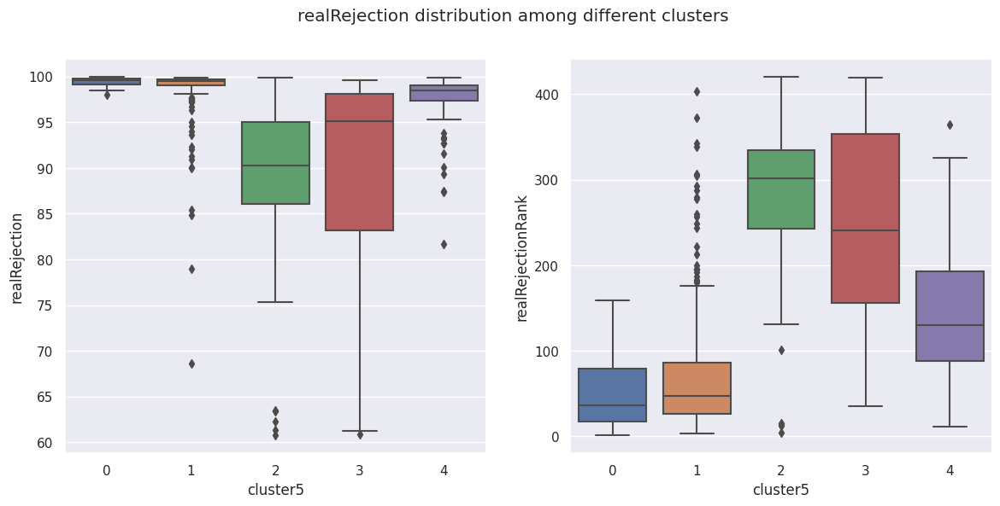

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("realRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster5', y='realRejection', data=cluster_inr)
sns.boxplot(ax=ax[1],x='cluster5', y='realRejectionRank', data=cluster_inr)

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'realRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejection                                                   
                 count    min       mean    max  median   mode        std
cluster5                                                                 
0                  192  98.01  99.435026  99.94  99.590  99.69   0.414419
1                  146  68.63  98.274315  99.91  99.480  99.86   3.877429
2                   84  60.75  88.778810  99.90  90.255  95.62   8.937292
3                  199  60.89  89.640089  99.60  95.080  98.61  10.988014
4                  107  81.66  97.466542  99.83  98.480  99.06   2.912793

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'realRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejectionRank                                                   
                     count   min        mean    max median   mode         std
cluster5                                                                     
0                      192   1.0   48.057292  159.0   36.0   25.0   37.118204
1                      146   3.0   80.602740  403.0   47.0    8.0   88.327797
2                       84   4.0  282.047619  420.0  301.5  234.0   89.179514
3                      199  35.0  250.537688  419.0  241.0  119.0  103.395081
4                      107  11.0  143.757009  364.0  130.0   83.0   77.266610

###Profiling for Observed Solute Rejection Coefficient

<Axes: xlabel='cluster5', ylabel='observedSoluteRejectionRank'>

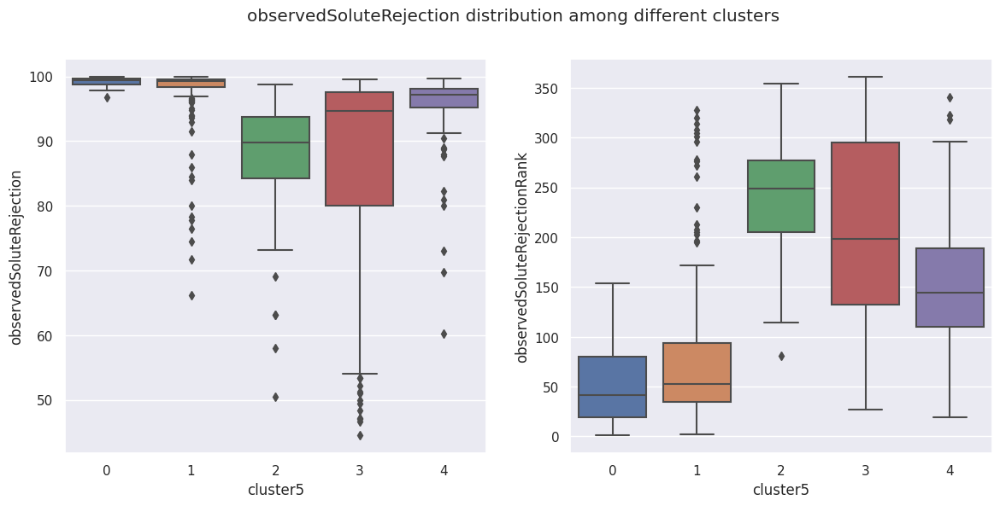

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("observedSoluteRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster5', y='observedSoluteRejection', data=cluster_inr)
sns.boxplot(ax=ax[1],x='cluster5', y='observedSoluteRejectionRank', data=cluster_inr)

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'observedSoluteRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejection                                         \
                           count    min       mean    max  median  mode   
cluster5                                                                  
0                            192  96.84  99.196817  99.91  99.425  99.5   
1                            146  66.20  97.262945  99.90  99.300  99.8   
2                             84  50.50  87.671898  98.71  89.765  80.0   
3                            199  44.50  86.544657  99.60  94.700  98.0   
4                            107  60.19  95.104953  99.70  97.200  97.5   

                     
                std  
cluster5             
0          0.609810  
1          5.729841  
2          9.130118  
3         15.142719  
4          6.048506

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'observedSoluteRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejectionRank                                         \
                               count   min        mean    max median   mode   
cluster5                                                                      
0                                192   1.0   50.104167  154.0   41.5   35.0   
1                                146   2.0   82.897260  328.0   53.0   11.0   
2                                 84  81.0  240.297619  354.0  248.5  296.0   
3                                199  27.0  212.638191  361.0  198.0  114.0   
4                                107  19.0  155.401869  341.0  144.0  136.0   

                     
                std  
cluster5             
0         35.258501  
1         79.548790  
2         55.644478  
3         89.091825  
4         65.739029

###Profiling for Solute Permeability Coefficient

<Axes: xlabel='cluster5', ylabel='solutePermeabilityCoefficientRank'>

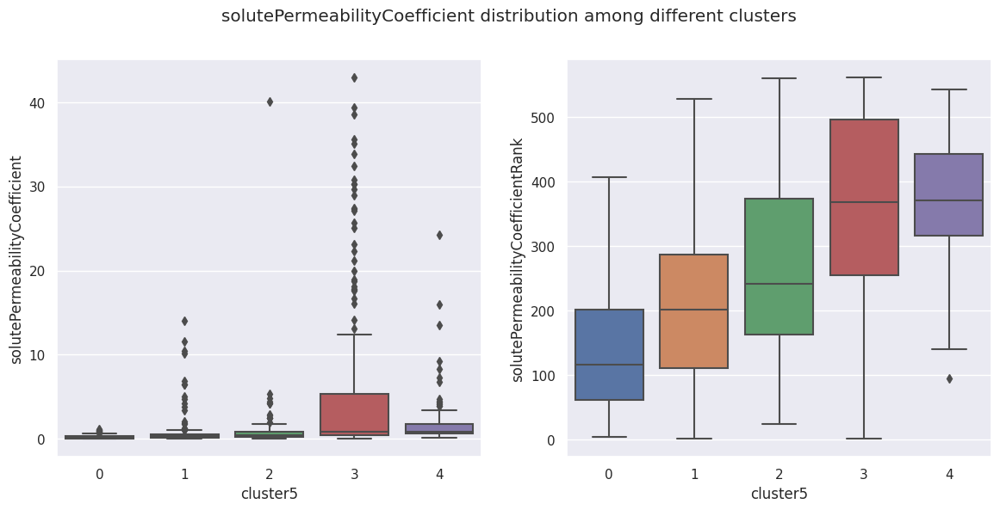

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("solutePermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster5', y='solutePermeabilityCoefficient', data=cluster_inr)
sns.boxplot(ax=ax[1],x='cluster5', y='solutePermeabilityCoefficientRank', data=cluster_inr)

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'solutePermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficient                                        \
                                 count     min      mean        max   median   
cluster5                                                                       
0                                  192  0.0096  0.211683   1.113000  0.13515   
1                                  146  0.0075  0.925866  14.057000  0.29300   
2                                   84  0.0340  1.309702  40.060000  0.38500   
3                                  199  0.0002  5.434469  42.930000  0.83000   
4                                  107  0.1000  1.972477  24.257289  0.85140   

                           
           mode       std  
cluster5                   
0         0.036  0.209576  
1         0.130  2.165579  
2         0.190  4.430872  
3         0.280  9.532241  
4         4.371  3.275700

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'solutePermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficientRank                                  \
                                     count   min        mean    max median   
cluster5                                                                     
0                                      192   4.0  138.317708  407.0  116.0   
1                                      146   2.0  214.410959  528.0  201.5   
2                                       84  24.0  267.011905  560.0  241.0   
3                                      199   1.0  358.105528  561.0  368.0   
4                                      107  95.0  368.747664  543.0  371.0   

                             
           mode         std  
cluster5                     
0          27.0   96.195689  
1         112.0  142.744898  
2         154.0  131.253961  
3         194.0  146.706207  
4         488.0   99.253924

###Profiling for Pressure Difference Coefficient

<Axes: xlabel='cluster5', ylabel='pressureDiffRank'>

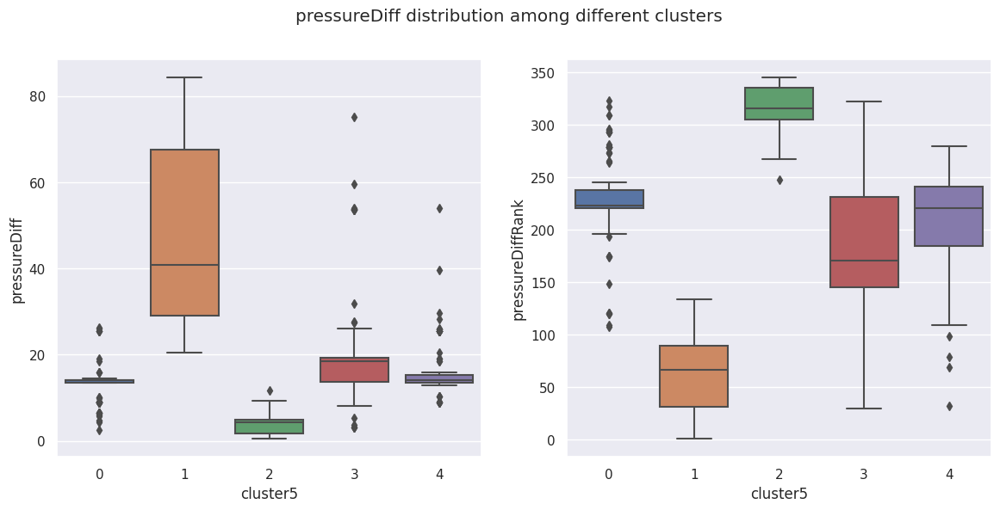

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("pressureDiff distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster5', y='pressureDiff', data=cluster_inr)
sns.boxplot(ax=ax[1],x='cluster5', y='pressureDiffRank', data=cluster_inr)

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'pressureDiff': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiff                                                        
                count    min       mean      max     median   mode        std
cluster5                                                                     
0                 192   2.45  13.479439  26.2700  13.990000  14.00   3.285620
1                 146  20.39  44.795351  84.2600  40.855000  28.99  19.874453
2                  84   0.45   3.810933  11.6100   4.271793   4.87   2.536235
3                 199   3.00  18.509882  75.0477  18.530000  13.73  10.084482
4                 107   8.81  16.147022  54.0500  14.000000  13.53   6.365591

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'pressureDiffRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiffRank                                                   
                    count    min        mean    max median   mode        std
cluster5                                                                    
0                     192  108.0  227.979167  323.0  223.0  221.0  33.061257
1                     146    1.0   63.568493  134.0   66.5   91.0  34.022084
2                      84  248.0  316.714286  345.0  315.5  307.0  21.770197
3                     199   30.0  181.366834  322.0  171.0  231.0  61.985019
4                     107   32.0  205.429907  280.0  221.0  241.0  51.734830

###Profiling for Concentration Polarization

<Axes: xlabel='cluster5', ylabel='concentrationPolarizationRank'>

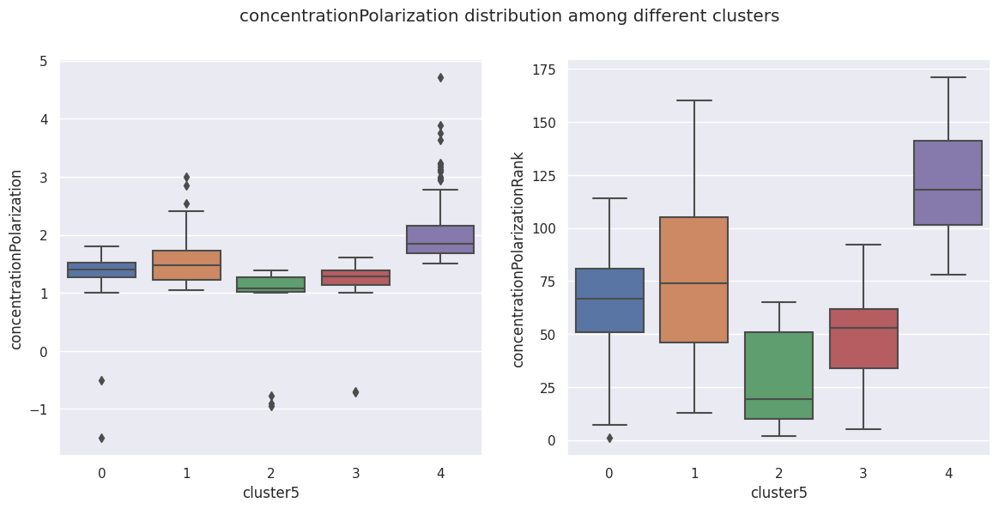

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("concentrationPolarization distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster5', y='concentrationPolarization', data=cluster_inr)
sns.boxplot(ax=ax[1],x='cluster5', y='concentrationPolarizationRank', data=cluster_inr)

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'concentrationPolarization': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarization                                          \
                             count   min      mean      max   median  mode   
cluster5                                                                     
0                              192 -1.50  1.360424  1.80000  1.39815  1.00   
1                              146  1.04  1.528337  3.00295  1.47000  1.19   
2                               84 -0.95  1.076220  1.39285  1.07500  1.38   
3                              199 -0.71  1.248065  1.61000  1.29000  1.31   
4                              107  1.50  2.061394  4.71000  1.85000  1.68   

                    
               std  
cluster5            
0         0.302366  
1         0.351451  
2         0.403839  
3         0.250948  
4         0.586452

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'concentrationPolarizationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarizationRank                                         \
                                 count   min        mean    max median   mode   
cluster5                                                                        
0                                  192   1.0   62.854167  114.0   66.5    8.0   
1                                  146  13.0   78.047945  160.0   74.0   41.0   
2                                   84   2.0   29.321429   65.0   19.5   62.0   
3                                  199   5.0   47.723618   92.0   53.0   55.0   
4                                  107  78.0  121.672897  171.0  118.0  101.0   

                     
                std  
cluster5             
0         23.316389  
1         35.193129  
2         21.370603  
3         21.722050  
4         25.233168

###Profiling for Salt Concentration

<Axes: xlabel='cluster5', ylabel='saltConcentrationRank'>

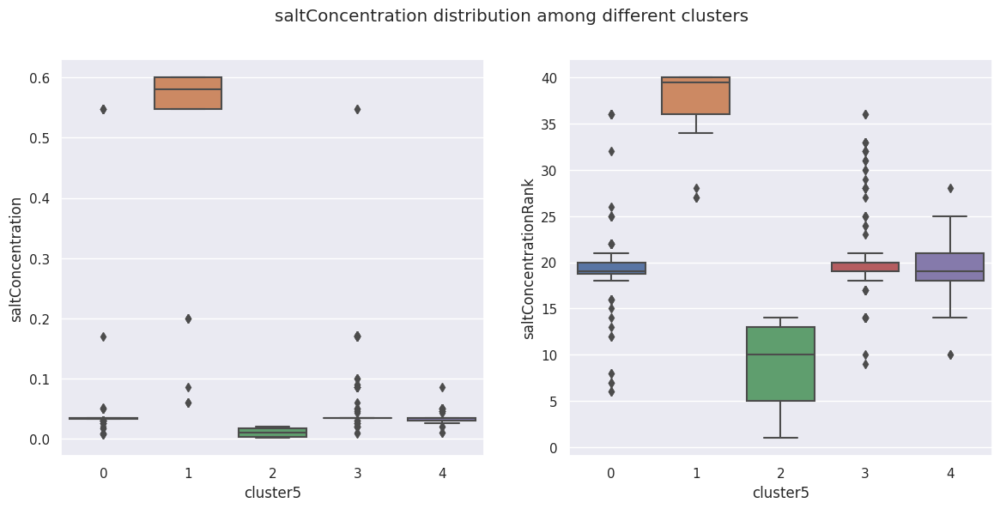

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("saltConcentration distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster5', y='saltConcentration', data=cluster_inr)
sns.boxplot(ax=ax[1],x='cluster5', y='saltConcentrationRank', data=cluster_inr)

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'saltConcentration': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentration                                              \
                     count      min      mean     max  median     mode   
cluster5                                                                 
0                      192  0.00800  0.046417  0.5476  0.0340  0.03420   
1                      146  0.05990  0.555778  0.6000  0.5806  0.60000   
2                       84  0.00154  0.010654  0.0200  0.0100  0.01711   
3                      199  0.00860  0.049205  0.5476  0.0342  0.03420   
4                      107  0.01000  0.034473  0.0855  0.0340  0.03400   

                    
               std  
cluster5            
0         0.082997  
1         0.101181  
2         0.006206  
3         0.060052  
4         0.009005

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'saltConcentrationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentrationRank                                              
                         count   min       mean   max median  mode       std
cluster5                                                                    
0                          192   6.0  19.458333  36.0   19.0  20.0  4.118447
1                          146  27.0  37.979452  40.0   39.5  40.0  2.725282
2                           84   1.0   9.095238  14.0   10.0  13.0  4.004874
3                          199   9.0  20.894472  36.0   20.0  20.0  4.420329
4                          107  10.0  19.504673  28.0   19.0  19.0  2.979090

###Profiling for Water/Salt Selectivity Coefficient

<Axes: xlabel='cluster5', ylabel='Water/Salt-SelectivityRank'>

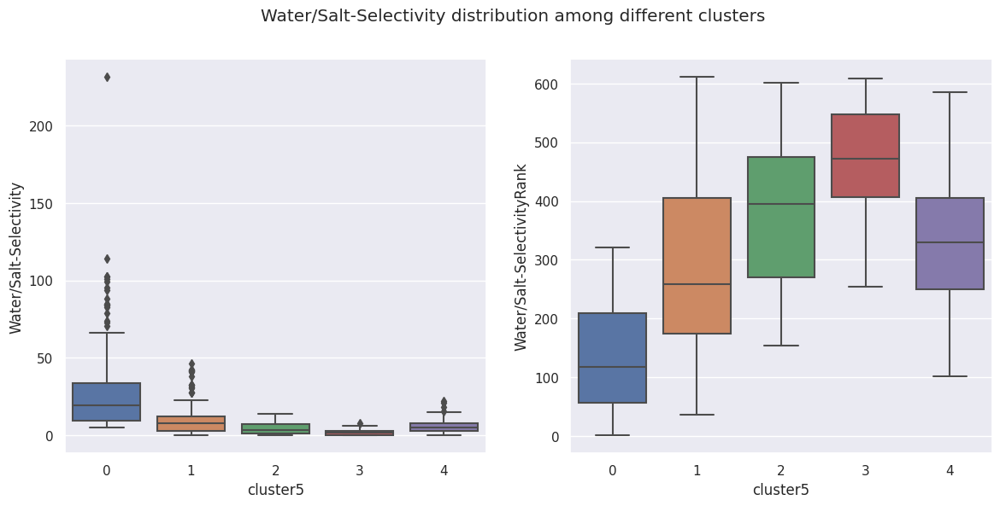

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("Water/Salt-Selectivity distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster5', y='Water/Salt-Selectivity', data=cluster_inr)
sns.boxplot(ax=ax[1],x='cluster5', y='Water/Salt-SelectivityRank', data=cluster_inr)

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'Water/Salt-Selectivity': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-Selectivity                                              \
                          count       min       mean         max     median   
cluster5                                                                      
0                           192  5.300000  28.323934  231.250000  19.390802   
1                           146  0.026670  10.435467   46.520000   7.672581   
2                            84  0.100000   4.363891   14.200000   3.386250   
3                           199  0.083053   1.884912    7.830000   1.572806   
4                           107  0.133579   6.078912   22.364086   4.989496   

                           
          mode        std  
cluster5                   
0         26.1  28.440727  
1         10.0  10.806191  
2          1.8   3.467777  
3          2.4   1.633868  
4          3.9   4.567837

In [ ]:
cluster_inr.groupby('cluster5').agg({
    'Water/Salt-SelectivityRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-SelectivityRank                                          \
                              count    min        mean    max median   mode   
cluster5                                                                      
0                               192    1.0  136.515625  321.0  117.5   84.0   
1                               146   36.0  285.342466  611.0  258.0  193.0   
2                                84  154.0  377.880952  601.0  394.5  455.0   
3                               199  254.0  472.185930  609.0  472.0  433.0   
4                               107  102.0  329.551402  585.0  330.0  366.0   

                      
                 std  
cluster5              
0          95.041792  
1         156.936554  
2         116.061928  
3          84.935392  
4         112.698482

###Profiling for Structure

[Text(0.5, 1.0, 'structure distribution among different clusters')]

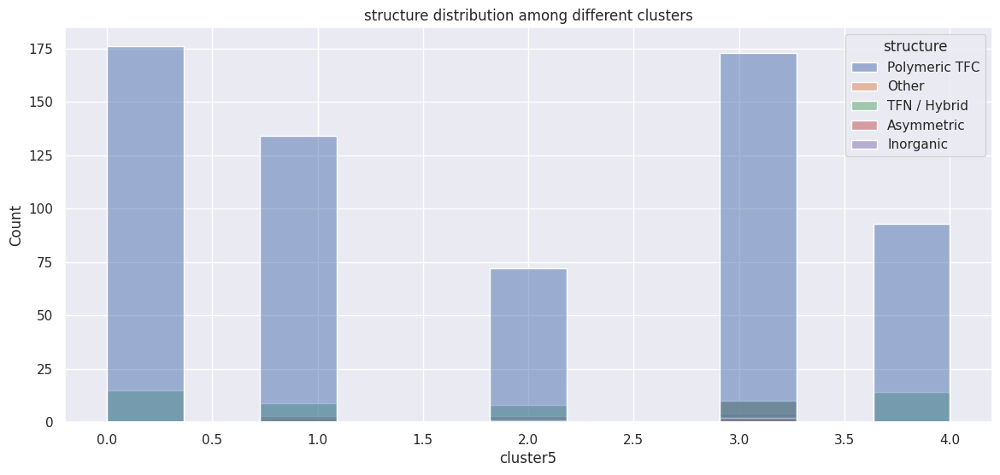

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster5',
             hue='structure',
             data=cluster_inr).set(title = "structure distribution among different clusters")

In [ ]:
cluster_inr.groupby(['cluster5'])['structure'].value_counts()

cluster5  structure    
0         Polymeric TFC    176
          TFN / Hybrid      15
          Asymmetric         1
1         Polymeric TFC    134
          TFN / Hybrid       9
          Asymmetric         3
2         Polymeric TFC     72
          TFN / Hybrid       8
          Asymmetric         3
          Other              1
3         Polymeric TFC    173
          Asymmetric        10
          TFN / Hybrid      10
          Inorganic          4
          Other              2
4         Polymeric TFC     93
          TFN / Hybrid      14
Name: structure, dtype: int64

###Profiling for Chemistry

[Text(0.5, 1.0, 'chemistry distribution among different clusters')]

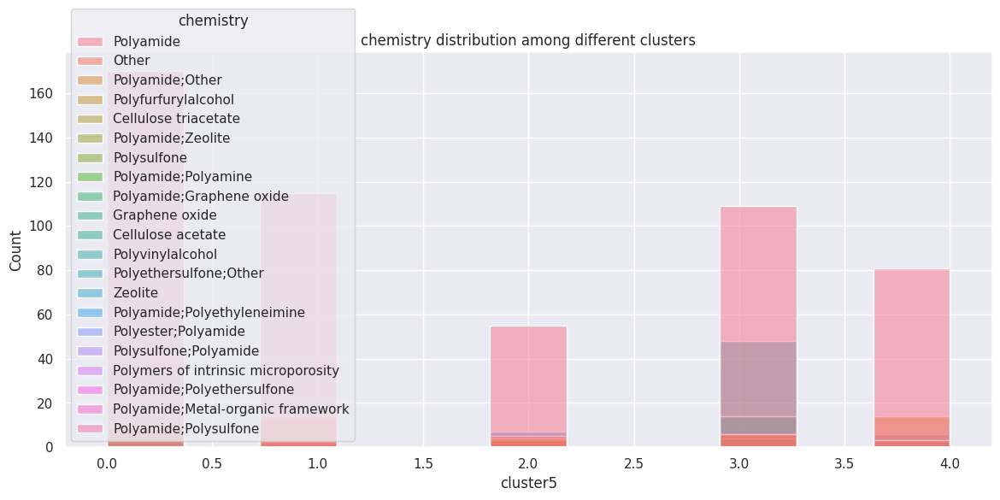

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster5',
             hue='chemistry',
             data=cluster_inr).set(title = "chemistry distribution among different clusters")

In [ ]:
cluster_inr.groupby(['cluster5'])['chemistry'].value_counts()

cluster5  chemistry                          
0         Polyamide                              170
          Polyamide;Other                          9
          Polyamide;Graphene oxide                 5
          Polyamide;Metal-organic framework        4
          Polyester;Polyamide                      2
          Cellulose acetate                        1
          Polyethersulfone;Other                   1
1         Polyamide                              115
          Other                                   14
          Polyfurfurylalcohol                     13
          Polyamide;Polysulfone                    2
          Polysulfone;Polyamide                    2
2         Polyamide                               55
          Polyamide;Polyethyleneimine              7
          Other                                    5
          Polyamide;Other                          4
          Polyamide;Polyamine                      4
          Polysulfone                              4


###Profiling for Modification

[Text(0.5, 1.0, 'modification distribution among different clusters')]

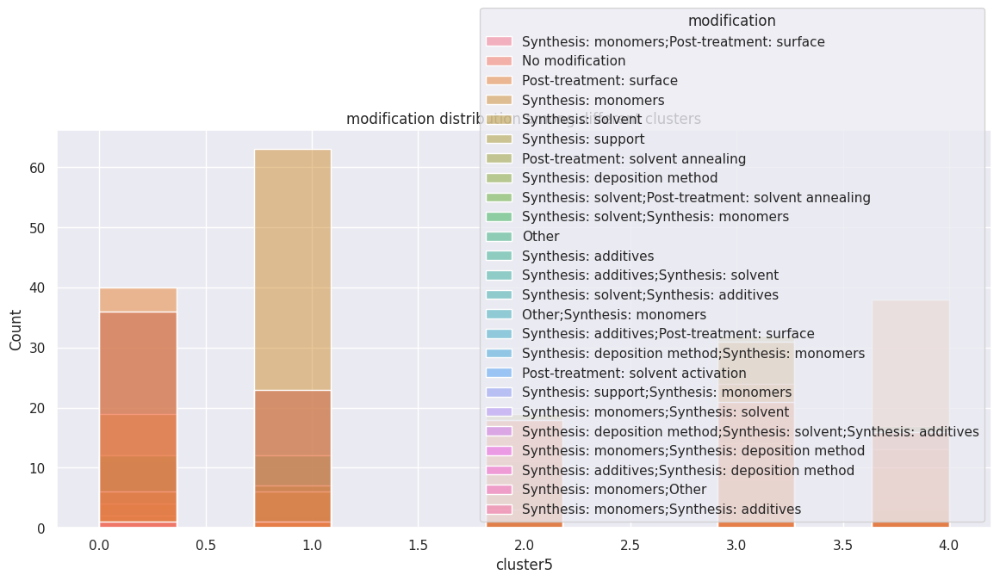

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster5',
             hue='modification',
             data=cluster_inr).set(title = "modification distribution among different clusters")

In [ ]:
cluster_inr.groupby(['cluster5'])['modification'].value_counts()

cluster5  modification                          
0         Post-treatment: surface                   40
          No modification                           36
          Synthesis: additives                      36
          Synthesis: solvent                        19
          Other                                     12
                                                    ..
4         Synthesis: solvent;Synthesis: monomers     3
          Other                                      2
          Post-treatment: solvent activation         1
          Post-treatment: solvent annealing          1
          Synthesis: monomers;Synthesis: solvent     1
Name: modification, Length: 62, dtype: int64

###Profiling for Other Solutes

[Text(0.5, 1.0, 'otherSolutes distribution among different clusters')]

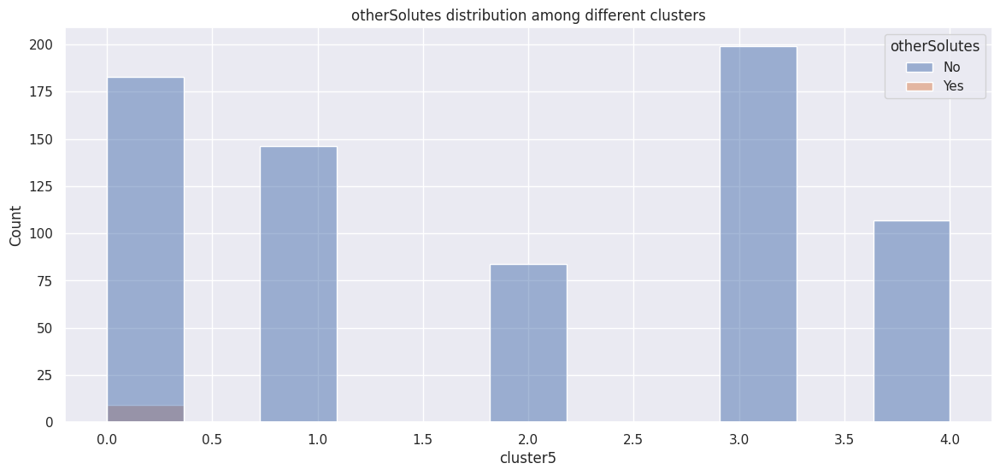

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster5',
             hue='otherSolutes',
             data=cluster_inr).set(title = "otherSolutes distribution among different clusters")

In [ ]:
cluster_inr.groupby(['cluster5'])['otherSolutes'].value_counts()

cluster5  otherSolutes
0         No              183
          Yes               9
1         No              146
2         No               84
3         No              199
4         No              107
Name: otherSolutes, dtype: int64

###Profiling for Filtration Mode

[Text(0.5, 1.0, 'filtrationMode distribution among different clusters')]

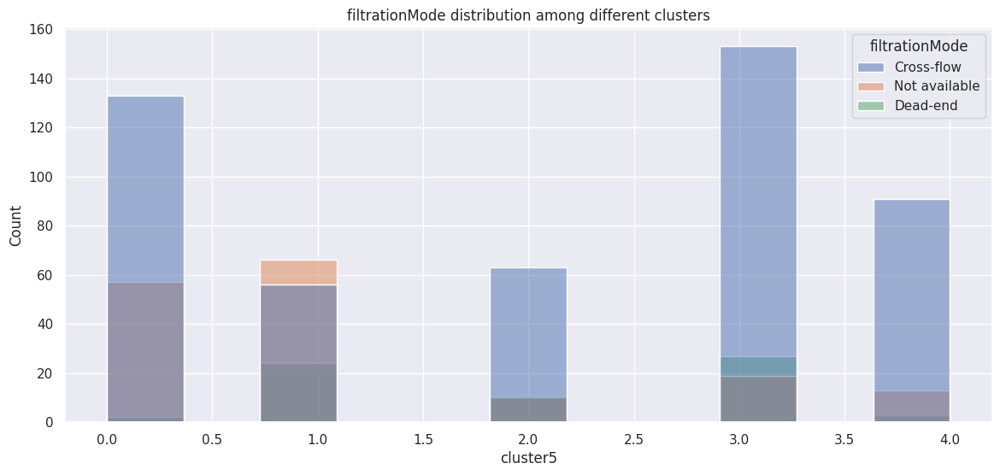

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster5',
             hue='filtrationMode',
             data=cluster_inr).set(title = "filtrationMode distribution among different clusters")

In [ ]:
cluster_inr.groupby(['cluster5'])['filtrationMode'].value_counts()

cluster5  filtrationMode
0         Cross-flow        133
          Not available      57
          Dead-end            2
1         Not available      66
          Cross-flow         56
          Dead-end           24
2         Cross-flow         63
          Dead-end           11
          Not available      10
3         Cross-flow        153
          Dead-end           27
          Not available      19
4         Cross-flow         91
          Not available      13
          Dead-end            3
Name: filtrationMode, dtype: int64

###Profiling for Concentration Polarization Mode

[Text(0.5, 1.0, 'cpMode distribution among different clusters')]

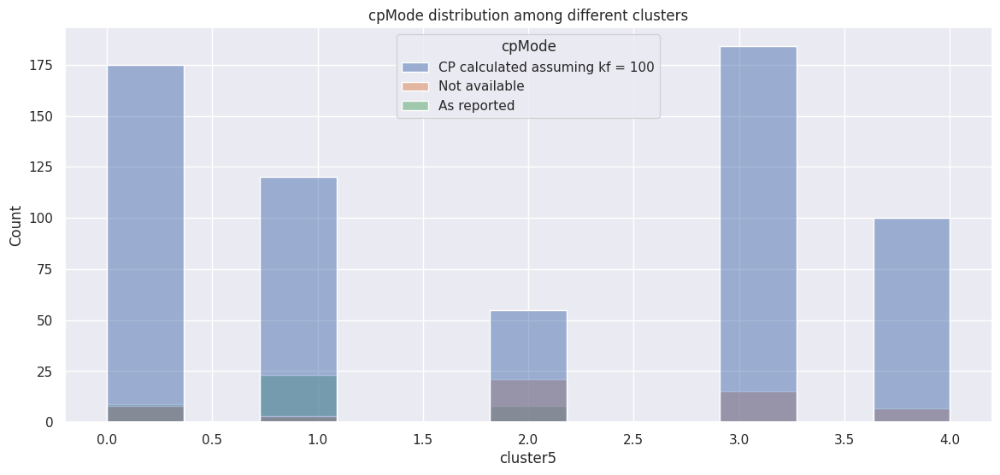

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster5',
             hue='cpMode',
             data=cluster_inr).set(title = "cpMode distribution among different clusters")

In [ ]:
cluster_inr.groupby(['cluster5'])['cpMode'].value_counts()

cluster5  cpMode                         
0         CP calculated assuming kf = 100    175
          As reported                          9
          Not available                        8
1         CP calculated assuming kf = 100    120
          As reported                         23
          Not available                        3
2         CP calculated assuming kf = 100     55
          Not available                       21
          As reported                          8
3         CP calculated assuming kf = 100    184
          Not available                       15
4         CP calculated assuming kf = 100    100
          Not available                        7
Name: cpMode, dtype: int64

##For Outputs (Rank)

In [ ]:
cluster_outr.head(1)

,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,filtrationMode,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank,averageEfficiencyRank,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.8,99.7,Cross-flow,0.03422,CP calculated assuming kf = 100,1.51,26.09,3,4,15,0,0,1,97.0,80.0,21.0,192.0,14.0,19.0,109.0,83.0,76.875,0,0,2,0,0,2


In [ ]:
sns.set(rc={'figure.figsize':(14,6)})

###Profiling for Average Efficiency Rank


[Text(0.5, 1.0, 'averageEfficiencyRank distribution among different clusters')]

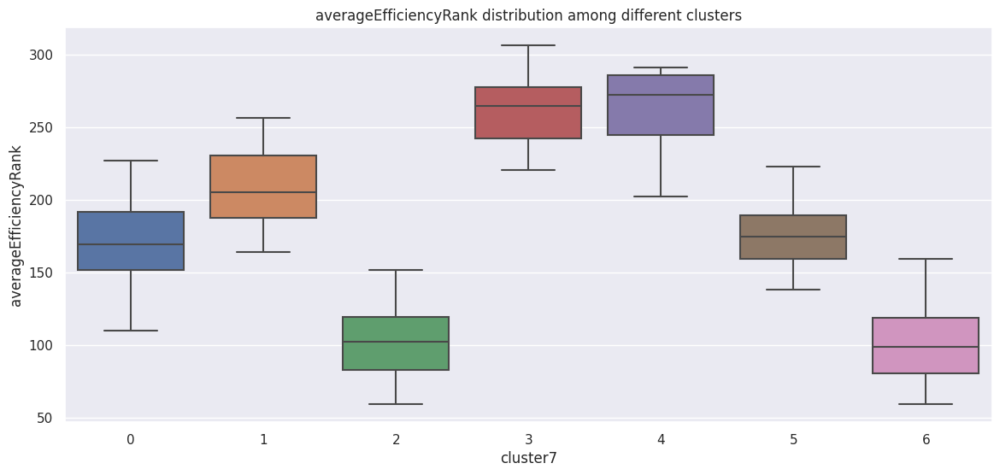

In [ ]:
sns.boxplot(x='cluster7', y='averageEfficiencyRank', data=cluster_outr).set(title = "averageEfficiencyRank distribution among different clusters")

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'averageEfficiencyRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

averageEfficiencyRank                                          \
                         count      min        mean      max    median   
cluster7                                                                 
0                          124  110.375  172.187500  227.125  169.7500   
1                           68  164.500  208.724265  256.625  205.2500   
2                          148   59.500  102.180743  151.750  102.3125   
3                           87  220.500  260.952586  306.375  264.8750   
4                           75  202.375  263.565000  291.500  272.6250   
5                          113  138.500  176.567478  223.125  175.1250   
6                          113   59.750  102.171460  159.500   98.8750   

                              
             mode        std  
cluster7                      
0         219.750  28.420713  
1         229.500  25.477388  
2          68.875  23.017621  
3         276.875  21.530968  
4         285.750  24.731244  
5         158.250  21.063295  
6          76.750  23.329664

###Profiling for Water Permeability Coefficient



<Axes: xlabel='cluster7', ylabel='waterPermeabilityCoefficientRank'>

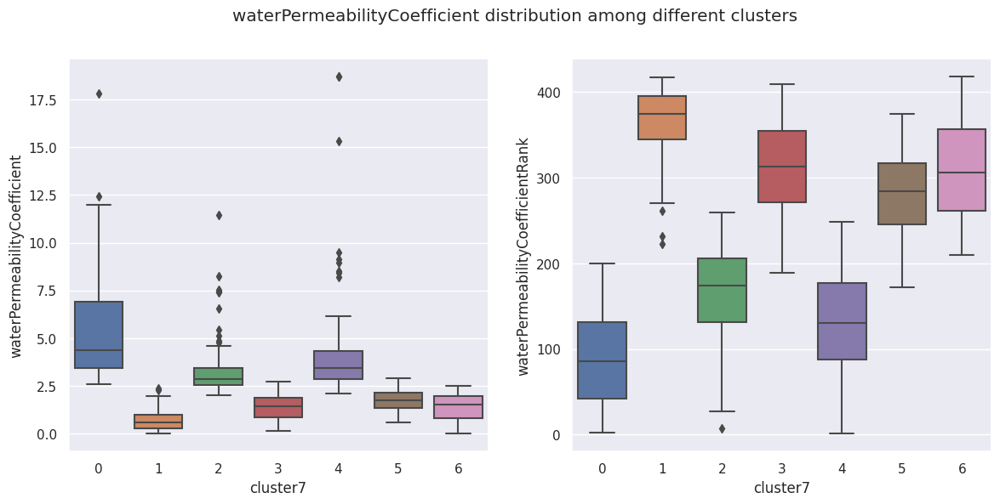

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("waterPermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='waterPermeabilityCoefficient', data=cluster_outr)
sns.boxplot(ax=ax[1],x='cluster7', y='waterPermeabilityCoefficientRank', data=cluster_outr)

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'waterPermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficient                                        \
                                count     min      mean    max median  mode   
cluster7                                                                      
0                                 124  2.6100  5.462442  17.83  4.370  3.44   
1                                  68  0.0300  0.725692   2.39  0.585  0.55   
2                                 148  2.0100  3.216003  11.44  2.870  2.64   
3                                  87  0.1300  1.412782   2.72  1.430  1.89   
4                                  75  2.1200  4.371066  18.69  3.460  3.53   
5                                 113  0.5800  1.758381   2.90  1.750  1.26   
6                                 113  0.0016  1.368544   2.51  1.510  2.18   

                    
               std  
cluster7            
0         2.721670  
1         0.566145  
2         1.224325  
3         0.673707  
4         3.231541  
5         0.517665  
6         0.704119

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'waterPermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficientRank                                   \
                                    count    min        mean    max median   
cluster7                                                                     
0                                     124    2.0   87.725806  200.0   86.0   
1                                      68  223.0  363.823529  417.0  375.0   
2                                     148    7.0  164.790541  259.0  174.0   
3                                      87  189.0  309.022989  409.0  313.0   
4                                      75    1.0  133.960000  248.0  130.0   
5                                     113  172.0  280.849558  375.0  284.0   
6                                     113  210.0  312.539823  418.0  306.0   

                            
           mode        std  
cluster7                    
0         131.0  55.156000  
1         377.0  44.268496  
2         197.0  51.866948  
3         271.0  55.876936  
4         123.0  67.961722  
5         327.0  46.797096  
6         242.0  57.209832

###Profiling for Real Rejection Coefficient

<Axes: xlabel='cluster7', ylabel='realRejectionRank'>

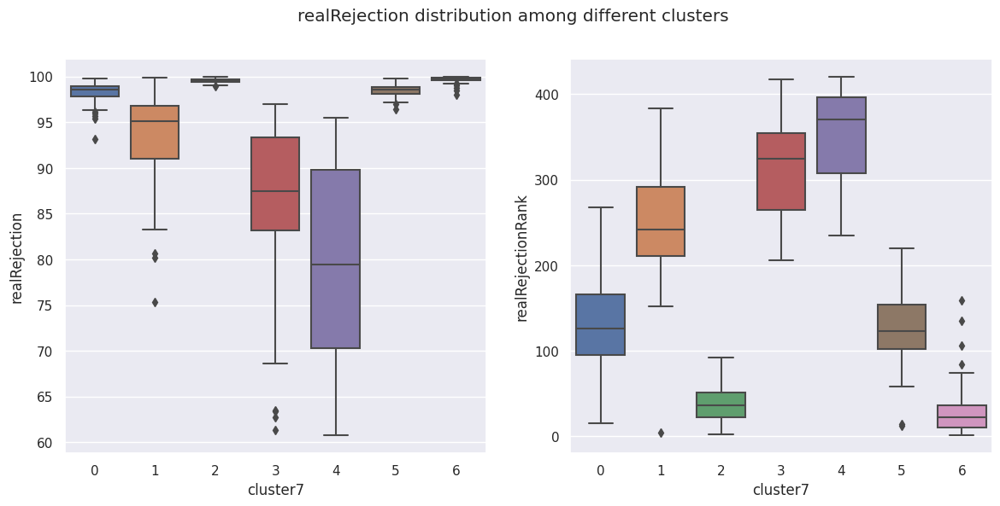

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("realRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='realRejection', data=cluster_outr)
sns.boxplot(ax=ax[1],x='cluster7', y='realRejectionRank', data=cluster_outr)

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'realRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejection                                                   
                 count    min       mean    max  median   mode        std
cluster7                                                                 
0                  124  93.17  98.267177  99.79  98.545  98.86   0.977936
1                   68  75.29  93.372794  99.90  95.110  95.62   4.804309
2                  148  98.95  99.566791  99.92  99.590  99.48   0.220450
3                   87  61.36  86.717904  97.00  87.500  89.49   7.965789
4                   75  60.75  79.522933  95.48  79.450  92.65  11.101256
5                  113  96.44  98.450354  99.82  98.570  98.57   0.598598
6                  113  98.01  99.649204  99.94  99.720  99.86   0.288618

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'realRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejectionRank                                                   
                     count    min        mean    max median   mode        std
cluster7                                                                     
0                      124   15.0  132.250000  268.0  125.5   99.0  50.122877
1                       68    4.0  248.735294  383.0  241.5  234.0  62.432917
2                      148    2.0   37.310811   92.0   36.0   47.0  21.235592
3                       87  206.0  314.333333  417.0  324.0  310.0  52.597565
4                       75  235.0  349.560000  420.0  370.0  273.0  54.152248
5                      113   12.0  126.433628  220.0  123.0  123.0  39.059450
6                      113    1.0   28.672566  159.0   22.0    8.0  26.173338

###Profiling for Observed Solute Rejection Coefficient

<Axes: xlabel='cluster7', ylabel='observedSoluteRejectionRank'>

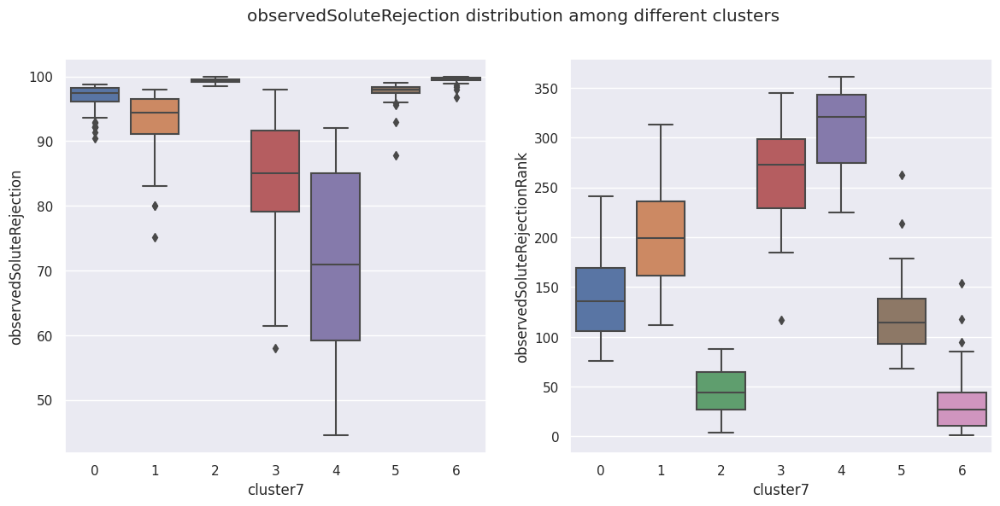

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("observedSoluteRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='observedSoluteRejection', data=cluster_outr)
sns.boxplot(ax=ax[1],x='cluster7', y='observedSoluteRejectionRank', data=cluster_outr)

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'observedSoluteRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejection                                          \
                           count    min       mean      max median  mode   
cluster7                                                                   
0                            124  90.50  96.886129  98.8000  97.50  97.5   
1                             68  75.14  92.949124  98.0300  94.40  94.4   
2                            148  98.50  99.358454  99.8800  99.40  99.5   
3                             87  58.00  84.423145  97.9600  85.10  88.0   
4                             75  44.50  71.196416  92.0356  70.86  80.0   
5                            113  87.80  97.690519  99.0200  98.00  98.0   
6                            113  96.84  99.523805  99.9100  99.60  99.8   

                     
                std  
cluster7             
0          1.747008  
1          4.855035  
2          0.330502  
3          8.665622  
4         14.868912  
5          1.313309  
6          0.410599

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'observedSoluteRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejectionRank                                          \
                               count    min        mean    max median   mode   
cluster7                                                                       
0                                124   76.0  141.072581  241.0  136.0  136.0   
1                                 68  112.0  201.411765  313.0  199.0  199.0   
2                                148    4.0   43.993243   88.0   44.0   35.0   
3                                 87  117.0  264.436782  345.0  273.0  261.0   
4                                 75  225.0  308.333333  361.0  321.0  296.0   
5                                113   68.0  119.327434  263.0  114.0  114.0   
6                                113    1.0   31.292035  154.0   27.0   11.0   

                     
                std  
cluster7             
0         40.636436  
1         48.550708  
2         22.324903  
3         44.812452  
4         38.960595  
5         33.018783  
6         25.267738

###Profiling for Solute Permeability Coefficient

<Axes: xlabel='cluster7', ylabel='solutePermeabilityCoefficientRank'>

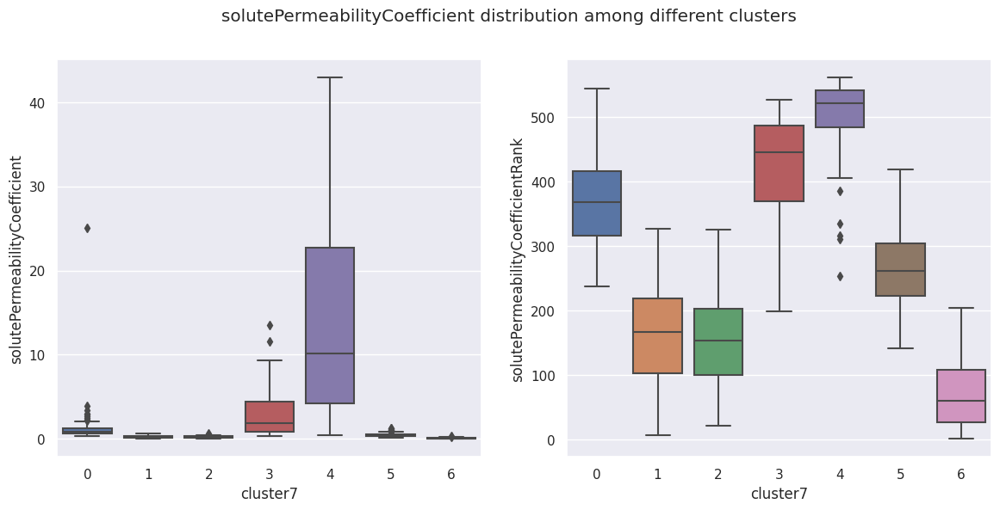

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("solutePermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='solutePermeabilityCoefficient', data=cluster_outr)
sns.boxplot(ax=ax[1],x='cluster7', y='solutePermeabilityCoefficientRank', data=cluster_outr)

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'solutePermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficient                                         \
                                 count     min       mean      max     median   
cluster7                                                                        
0                                  124  0.3754   1.217147  25.0800   0.824150   
1                                   68  0.0154   0.235582   0.6354   0.214800   
2                                  148  0.0300   0.208123   0.6329   0.189300   
3                                   87  0.2900   2.927821  13.5500   1.830000   
4                                   75  0.4100  14.140471  42.9300  10.192600   
5                                  113  0.1715   0.496720   1.3000   0.435001   
6                                  113  0.0002   0.081557   0.2960   0.070000   

                             
            mode        std  
cluster7                     
0         0.7792   2.253977  
1         0.1900   0.151148  
2         0.2500   0.117398  
3         1.6000   2.802513  
4         4.3710  12.048583  
5         0.4900   0.233401  
6         0.1200   0.059199

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'solutePermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficientRank                                   \
                                     count    min        mean    max median   
cluster7                                                                      
0                                      124  238.0  364.193548  544.0  367.5   
1                                       68    7.0  160.691176  327.0  166.5   
2                                      148   21.0  150.540541  326.0  154.0   
3                                       87  199.0  423.885057  527.0  445.0   
4                                       75  254.0  501.013333  561.0  521.0   
5                                      113  142.0  269.893805  419.0  261.0   
6                                      113    1.0   68.053097  204.0   60.0   

                            
           mode        std  
cluster7                    
0         355.0  65.432107  
1         154.0  81.564782  
2         183.0  65.667103  
3         435.0  76.350237  
4         488.0  61.436078  
5         282.0  65.161388  
6         108.0  48.975913

###Profiling for Pressure Difference Coefficient

<Axes: xlabel='cluster7', ylabel='pressureDiffRank'>

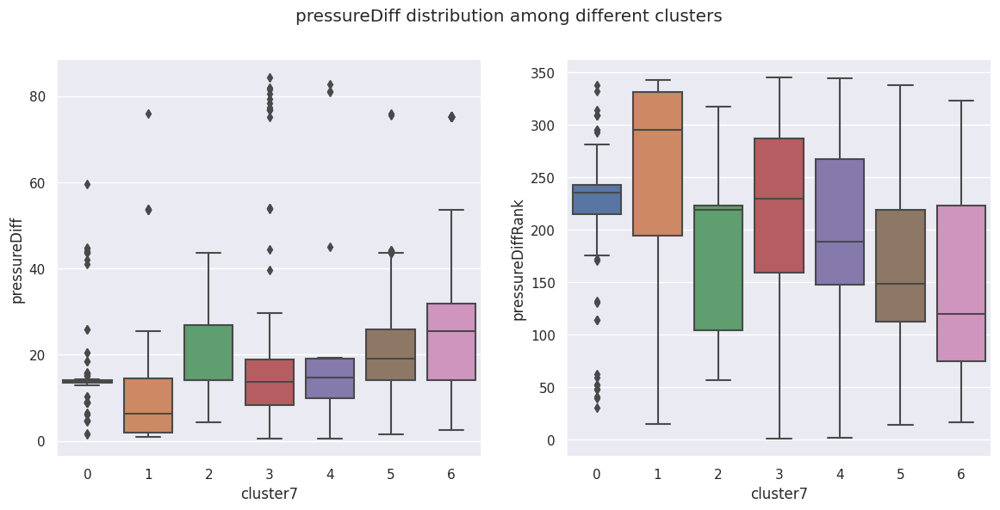

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("pressureDiff distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='pressureDiff', data=cluster_outr)
sns.boxplot(ax=ax[1],x='cluster7', y='pressureDiffRank', data=cluster_outr)

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'pressureDiff': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiff                                                      
                count       min       mean    max  median   mode        std
cluster7                                                                   
0                 124  1.590000  15.141403  59.63  13.595  13.53   9.321726
1                  68  0.940000  11.800589  75.89   6.365  14.53  15.696800
2                 148  4.247501  19.367870  43.55  14.010  14.00   8.848909
3                  87  0.450000  22.559688  84.26  13.730   0.45  24.132704
4                  75  0.460000  16.859384  82.74  14.640  14.00  15.043041
5                 113  1.590000  22.780711  75.91  19.120  14.01  12.990767
6                 113  2.450000  31.077026  75.33  25.390  14.00  22.800909

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'pressureDiffRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiffRank                                                   
                    count   min        mean    max median   mode         std
cluster7                                                                    
0                     124  31.0  222.145161  338.0  235.5  241.0   62.593500
1                      68  15.0  259.117647  343.0  295.5  194.0   92.862847
2                     148  57.0  178.648649  317.0  219.0  221.0   67.069450
3                      87   1.0  198.172414  345.0  230.0  345.0  105.585434
4                      75   2.0  200.586667  344.0  189.0  221.0   80.501988
5                     113  14.0  158.672566  338.0  149.0  219.0   71.836178
6                     113  17.0  140.787611  323.0  120.0  221.0   87.226046

###Profiling for Concentration Polarization

<Axes: xlabel='cluster7', ylabel='concentrationPolarizationRank'>

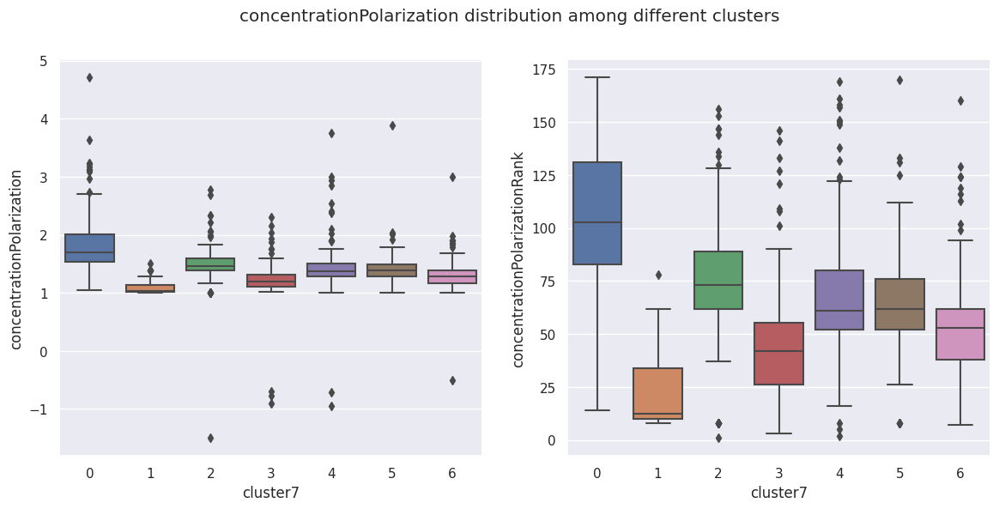

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("concentrationPolarization distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='concentrationPolarization', data=cluster_outr)
sns.boxplot(ax=ax[1],x='cluster7', y='concentrationPolarizationRank', data=cluster_outr)

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'concentrationPolarization': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarization                                           \
                             count   min      mean      max    median  mode   
cluster7                                                                      
0                              124  1.05  1.841417  4.71000  1.691922  1.64   
1                               68  1.00  1.096160  1.50000  1.035000  1.02   
2                              148 -1.50  1.476257  2.78000  1.460000  1.00   
3                               87 -0.91  1.206454  2.30000  1.200000  1.31   
4                               75 -0.95  1.475018  3.76000  1.370000  1.33   
5                              113  1.00  1.410369  3.89000  1.380000  1.38   
6                              113 -0.50  1.304027  3.00295  1.290000  1.32   

                    
               std  
cluster7            
0         0.538219  
1         0.120617  
2         0.372534  
3         0.457389  
4         0.624030  
5         0.302550  
6         0.308293

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'concentrationPolarizationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarizationRank                                        \
                                 count   min        mean    max median  mode   
cluster7                                                                       
0                                  124  14.0  104.838710  171.0  102.5  96.0   
1                                   68   8.0   22.617647   78.0   12.5  10.0   
2                                  148   1.0   74.932432  156.0   73.0   8.0   
3                                   87   3.0   46.977011  146.0   42.0  55.0   
4                                   75   2.0   71.386667  169.0   61.0  57.0   
5                                  113   8.0   64.840708  170.0   62.0  62.0   
6                                  113   7.0   53.504425  160.0   53.0  56.0   

                     
                std  
cluster7             
0         32.751935  
1         18.052188  
2         29.672512  
3         31.050962  
4         39.171450  
5         25.382983  
6         27.766605

###Profiling for Salt Concentration

<Axes: xlabel='cluster7', ylabel='saltConcentrationRank'>

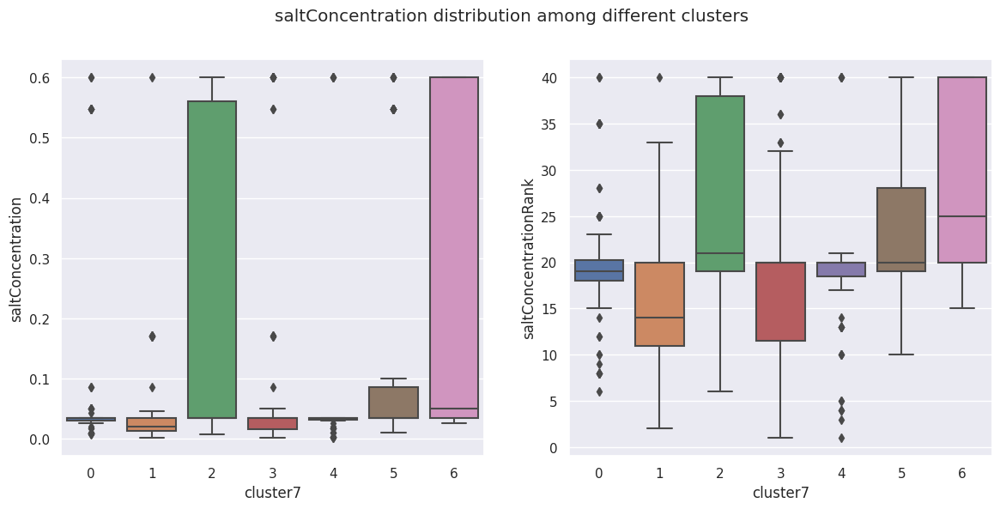

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("saltConcentration distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='saltConcentration', data=cluster_outr)
sns.boxplot(ax=ax[1],x='cluster7', y='saltConcentrationRank', data=cluster_outr)

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'saltConcentration': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentration                                             \
                     count       min      mean  max   median     mode   
cluster7                                                                
0                      124  0.008000  0.066012  0.6  0.03400  0.03400   
1                       68  0.001700  0.044094  0.6  0.02000  0.01711   
2                      148  0.008000  0.215317  0.6  0.03422  0.03400   
3                       87  0.001540  0.116714  0.6  0.03420  0.03420   
4                       75  0.001540  0.058910  0.6  0.03420  0.03420   
5                      113  0.010000  0.145840  0.6  0.03420  0.03400   
6                      113  0.025667  0.268389  0.6  0.05000  0.60000   

                    
               std  
cluster7            
0         0.130976  
1         0.081587  
2         0.256966  
3         0.203225  
4         0.129713  
5         0.213164  
6         0.267006

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'saltConcentrationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentrationRank                                               
                         count   min       mean   max median  mode        std
cluster7                                                                     
0                          124   6.0  19.516129  40.0   19.0  19.0   5.761498
1                           68   2.0  16.294118  40.0   14.0  13.0   8.081781
2                          148   6.0  25.716216  40.0   21.0  19.0   9.551892
3                           87   1.0  19.816092  40.0   20.0  20.0  10.797856
4                           75   1.0  18.440000  40.0   20.0  20.0   7.261971
5                          113  10.0  23.300885  40.0   20.0  19.0   7.961834
6                          113  15.0  28.460177  40.0   25.0  40.0   9.296731

###Profiling for Water/Salt Selectivity Coefficient

<Axes: xlabel='cluster7', ylabel='Water/Salt-SelectivityRank'>

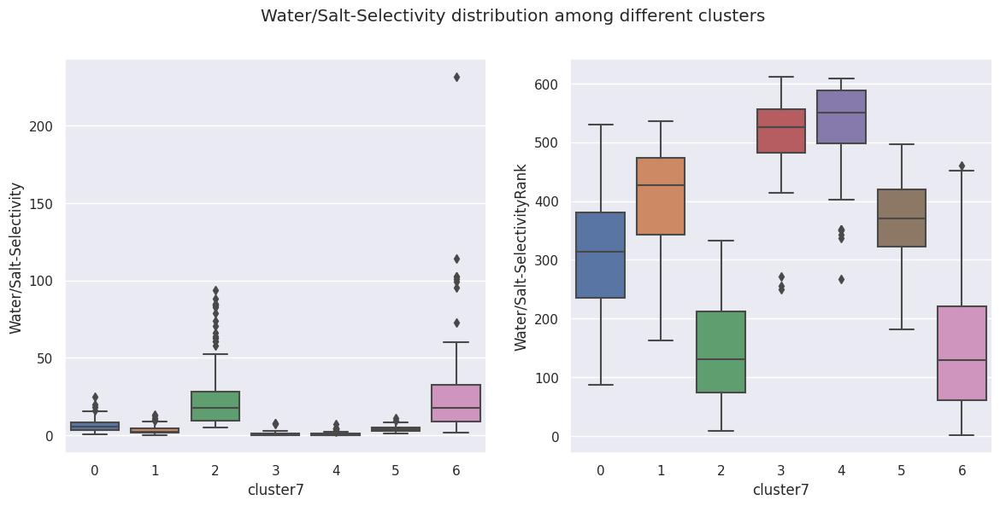

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("Water/Salt-Selectivity distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='Water/Salt-Selectivity', data=cluster_outr)
sns.boxplot(ax=ax[1],x='cluster7', y='Water/Salt-SelectivityRank', data=cluster_outr)

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'Water/Salt-Selectivity': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-Selectivity                                              \
                          count       min       mean         max     median   
cluster7                                                                      
0                           124  0.496013   6.751797   25.200000   5.600000   
1                            68  0.404255   3.684816   13.377193   2.504387   
2                           148  4.945489  24.196549   94.000000  17.538462   
3                            87  0.026670   1.076847    7.965517   0.574300   
4                            75  0.083053   1.021770    7.292683   0.283031   
5                           113  1.140000   4.143213   11.253644   3.857678   
6                           113  1.750000  26.960180  231.250000  18.000000   

                           
          mode        std  
cluster7                   
0          8.5   4.359079  
1          1.3   3.037657  
2         26.1  21.015679  
3          1.8   1.449331  
4          4.3   1.502005  
5          5.0   1.867968  
6         10.0  30.656481

In [ ]:
cluster_outr.groupby('cluster7').agg({
    'Water/Salt-SelectivityRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-SelectivityRank                                          \
                              count    min        mean    max median   mode   
cluster7                                                                      
0                               124   87.0  305.758065  530.0  314.0  233.0   
1                                68  163.0  397.102941  536.0  427.0  488.0   
2                               148    8.0  141.513514  332.0  130.0   84.0   
3                                87  250.0  510.977011  611.0  525.0  455.0   
4                                75  267.0  525.240000  609.0  550.0  351.0   
5                               113  181.0  369.221239  496.0  370.0  329.0   
6                               113    1.0  154.061947  460.0  129.0  193.0   

                      
                 std  
cluster7              
0          98.168792  
1          98.703557  
2          84.705290  
3          67.802376  
4          82.275877  
5          65.805685  
6         119.248411

###Profiling for Structure

[Text(0.5, 1.0, 'structure distribution among different clusters')]

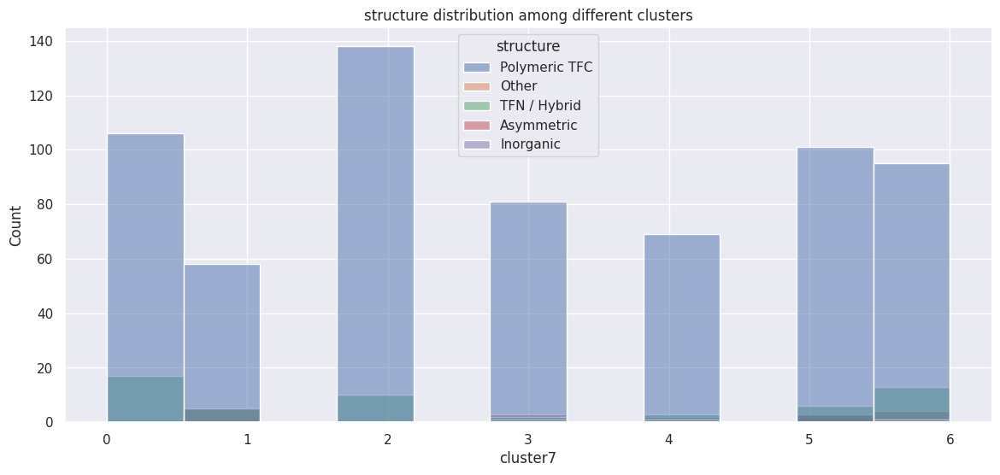

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='structure',
             data=cluster_outr).set(title = "structure distribution among different clusters")

In [ ]:
cluster_outr.groupby(['cluster7'])['structure'].value_counts()

cluster7  structure    
0         Polymeric TFC    106
          TFN / Hybrid      17
          Inorganic          1
1         Polymeric TFC     58
          Asymmetric         5
          TFN / Hybrid       5
2         Polymeric TFC    138
          TFN / Hybrid      10
3         Polymeric TFC     81
          Asymmetric         3
          TFN / Hybrid       2
          Other              1
4         Polymeric TFC     69
          TFN / Hybrid       3
          Asymmetric         2
          Other              1
5         Polymeric TFC    101
          TFN / Hybrid       6
          Asymmetric         3
          Inorganic          3
6         Polymeric TFC     95
          TFN / Hybrid      13
          Asymmetric         4
          Other              1
Name: structure, dtype: int64

###Profiling for Chemistry

[Text(0.5, 1.0, 'chemistry distribution among different clusters')]

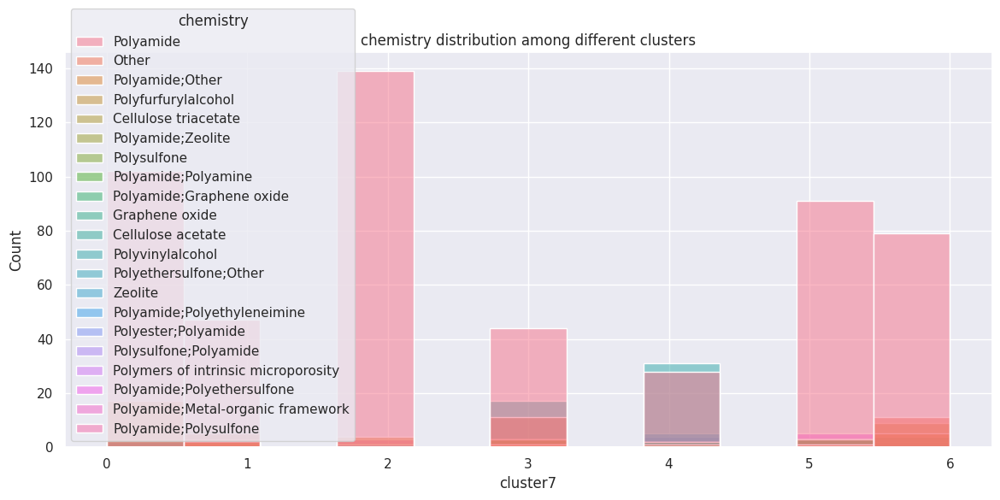

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='chemistry',
             data=cluster_outr).set(title = "chemistry distribution among different clusters")

In [ ]:
cluster_outr.groupby(['cluster7'])['chemistry'].value_counts()

cluster7  chemistry                          
0         Polyamide                              102
          Polyamide;Other                         17
          Graphene oxide                           3
          Polyester;Polyamide                      2
1         Polyamide                               47
          Cellulose acetate                        6
          Other                                    5
          Polyamide;Polyamine                      3
          Cellulose triacetate                     2
          Polyamide;Other                          2
          Polyamide;Metal-organic framework        1
          Polyamide;Polyethyleneimine              1
          Polysulfone                              1
2         Polyamide                              139
          Polyamide;Other                          4
          Polyamide;Metal-organic framework        3
          Polyester;Polyamide                      1
          Polysulfone;Polyamide                    1


###Profiling for Modification

[Text(0.5, 1.0, 'modification distribution among different clusters')]

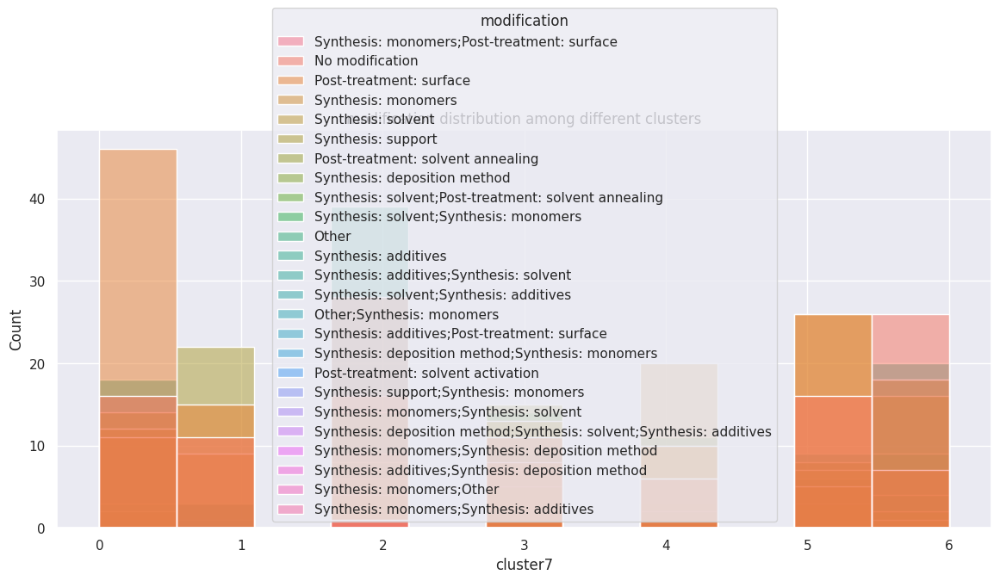

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='modification',
             data=cluster_outr).set(title = "modification distribution among different clusters")

In [ ]:
cluster_outr.groupby(['cluster7'])['modification'].value_counts()

cluster7  modification                                
0         Post-treatment: surface                         46
          Synthesis: additives                            18
          No modification                                 16
          Synthesis: support                              14
          Synthesis: solvent                              12
                                                          ..
6         Post-treatment: solvent activation               1
          Synthesis: additives;Post-treatment: surface     1
          Synthesis: monomers;Synthesis: solvent           1
          Synthesis: support                               1
          Synthesis: support;Synthesis: monomers           1
Name: modification, Length: 85, dtype: int64

###Profiling for Other Solutes

[Text(0.5, 1.0, 'otherSolutes distribution among different clusters')]

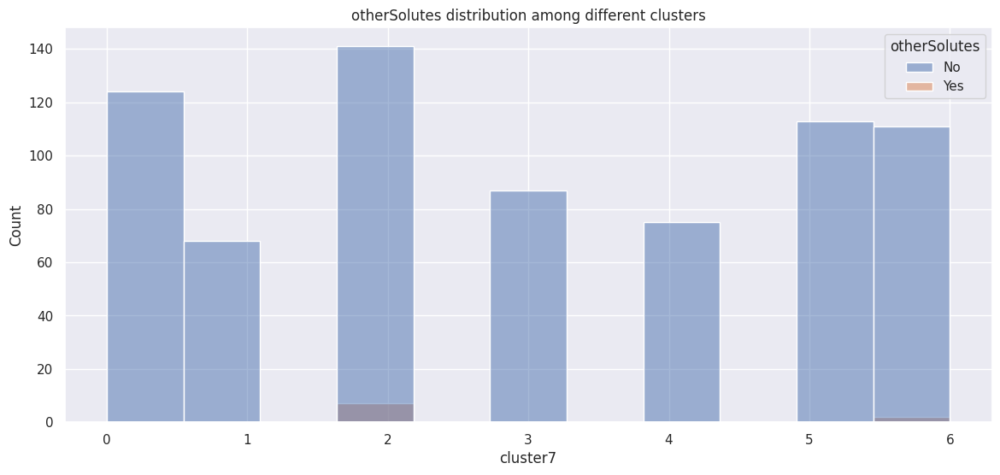

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='otherSolutes',
             data=cluster_outr).set(title = "otherSolutes distribution among different clusters")

In [ ]:
cluster_outr.groupby(['cluster7'])['otherSolutes'].value_counts()

cluster7  otherSolutes
0         No              124
1         No               68
2         No              141
          Yes               7
3         No               87
4         No               75
5         No              113
6         No              111
          Yes               2
Name: otherSolutes, dtype: int64

###Profiling for Filtration Mode

[Text(0.5, 1.0, 'filtrationMode distribution among different clusters')]

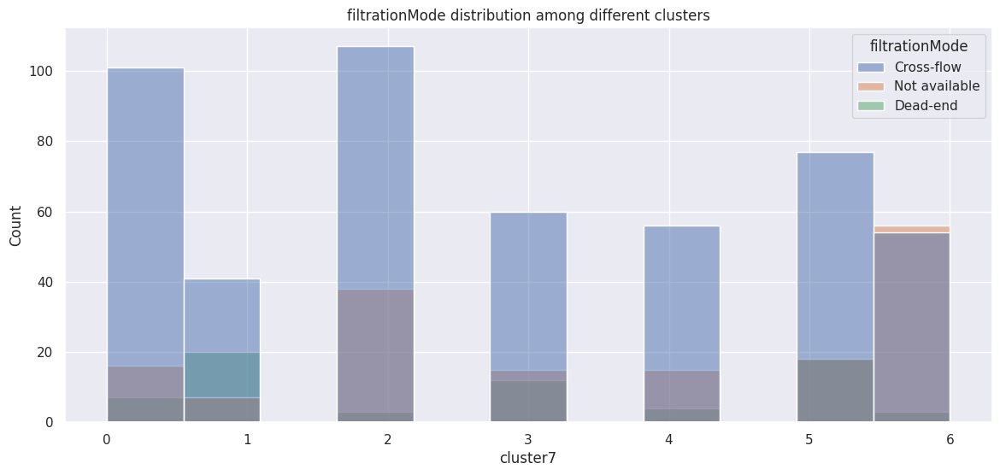

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='filtrationMode',
             data=cluster_outr).set(title = "filtrationMode distribution among different clusters")

In [ ]:
cluster_outr.groupby(['cluster7'])['filtrationMode'].value_counts()

cluster7  filtrationMode
0         Cross-flow        101
          Not available      16
          Dead-end            7
1         Cross-flow         41
          Dead-end           20
          Not available       7
2         Cross-flow        107
          Not available      38
          Dead-end            3
3         Cross-flow         60
          Not available      15
          Dead-end           12
4         Cross-flow         56
          Not available      15
          Dead-end            4
5         Cross-flow         77
          Dead-end           18
          Not available      18
6         Not available      56
          Cross-flow         54
          Dead-end            3
Name: filtrationMode, dtype: int64

###Profiling for Concentration Polarization Mode

[Text(0.5, 1.0, 'cpMode distribution among different clusters')]

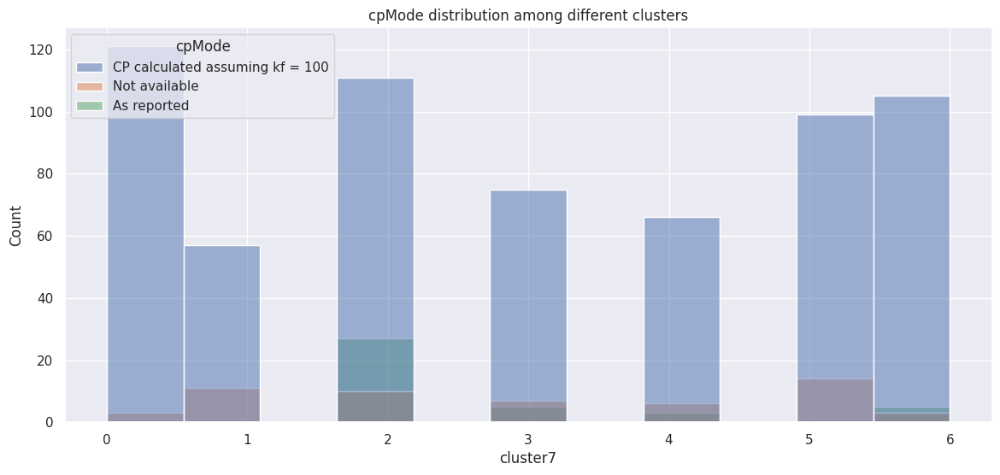

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='cpMode',
             data=cluster_outr).set(title = "cpMode distribution among different clusters")

In [ ]:
cluster_outr.groupby(['cluster7'])['cpMode'].value_counts()

cluster7  cpMode                         
0         CP calculated assuming kf = 100    121
          Not available                        3
1         CP calculated assuming kf = 100     57
          Not available                       11
2         CP calculated assuming kf = 100    111
          As reported                         27
          Not available                       10
3         CP calculated assuming kf = 100     75
          Not available                        7
          As reported                          5
4         CP calculated assuming kf = 100     66
          Not available                        6
          As reported                          3
5         CP calculated assuming kf = 100     99
          Not available                       14
6         CP calculated assuming kf = 100    105
          As reported                          5
          Not available                        3
Name: cpMode, dtype: int64

##For All (Rank)

In [ ]:
cluster_allr.head(1)

,mebraneID,structure,chemistry,modification,otherSolutes,waterPermeabilityCoefficient,solutePermeabilityCoefficient,Water/Salt-Selectivity,realRejection,observedSoluteRejection,filtrationMode,saltConcentration,cpMode,concentrationPolarization,pressureDiff,structureNumerical,chemistryNumerical,modificationNumerical,otherSolutesNumerical,filtrationModeNumerical,cpModeNumerical,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank,averageEfficiencyRank,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7
0,3,Polymeric TFC,Polyamide,Synthesis: monomers;Post-treatment: surface,No,2.69,0.1028,26.13482,99.8,99.7,Cross-flow,0.03422,CP calculated assuming kf = 100,1.51,26.09,3,4,15,0,0,1,97.0,80.0,21.0,192.0,14.0,19.0,109.0,83.0,76.875,1,2,1,1,1,1


In [ ]:
sns.set(rc={'figure.figsize':(14,6)})

###Profiling for Water Permeability Coefficient



<Axes: xlabel='cluster7', ylabel='waterPermeabilityCoefficientRank'>

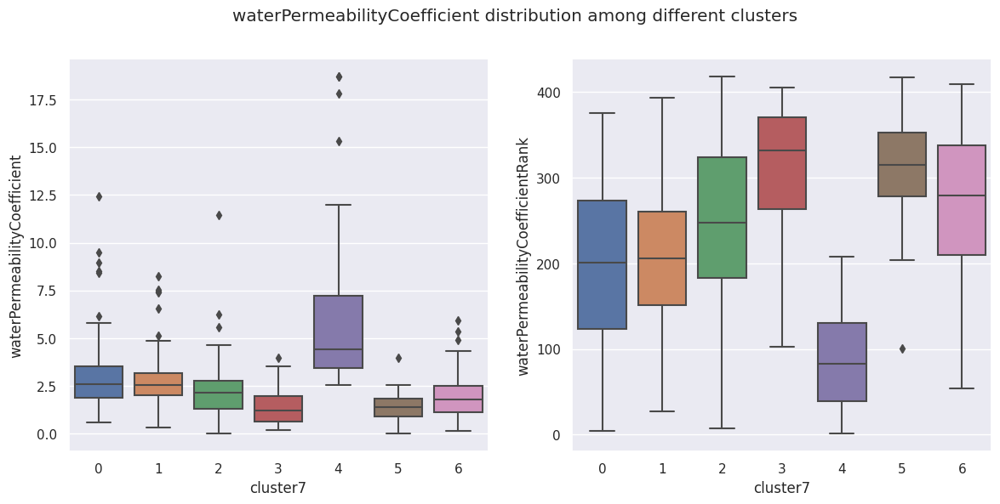

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("waterPermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='waterPermeabilityCoefficient', data=cluster_allr)
sns.boxplot(ax=ax[1],x='cluster7', y='waterPermeabilityCoefficientRank', data=cluster_allr)

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'waterPermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficient                                        \
                                count     min      mean    max median  mode   
cluster7                                                                      
0                                  90  0.5700  2.990414  12.44  2.600  1.89   
1                                 149  0.3200  2.684398   8.24  2.550  2.64   
2                                 125  0.0016  2.096469  11.44  2.130  1.82   
3                                  78  0.1900  1.391692   3.96  1.195  1.89   
4                                 127  2.5400  5.736973  18.69  4.430  3.44   
5                                 112  0.0300  1.340841   3.98  1.390  1.57   
6                                  47  0.1300  1.877660   5.95  1.810  0.22   

                    
               std  
cluster7            
0         1.969919  
1         1.248461  
2         1.433428  
3         0.915723  
4         3.238690  
5         0.734620  
6         1.330871

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'waterPermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

waterPermeabilityCoefficientRank                                   \
                                    count    min        mean    max median   
cluster7                                                                     
0                                      90    4.0  199.666667  376.0  201.0   
1                                     149   27.0  207.711409  393.0  206.0   
2                                     125    7.0  255.304000  418.0  247.0   
3                                      78  103.0  308.615385  405.0  332.0   
4                                     127    1.0   85.779528  208.0   83.0   
5                                     112  101.0  315.250000  417.0  315.0   
6                                      47   54.0  274.170213  409.0  279.0   

                            
           mode        std  
cluster7                    
0         271.0  94.512825  
1         197.0  78.713584  
2         278.0  94.462932  
3         271.0  77.726833  
4         131.0  56.405549  
5         301.0  59.557301  
6         402.0  97.010156

###Profiling for Real Rejection Coefficient

<Axes: xlabel='cluster7', ylabel='realRejectionRank'>

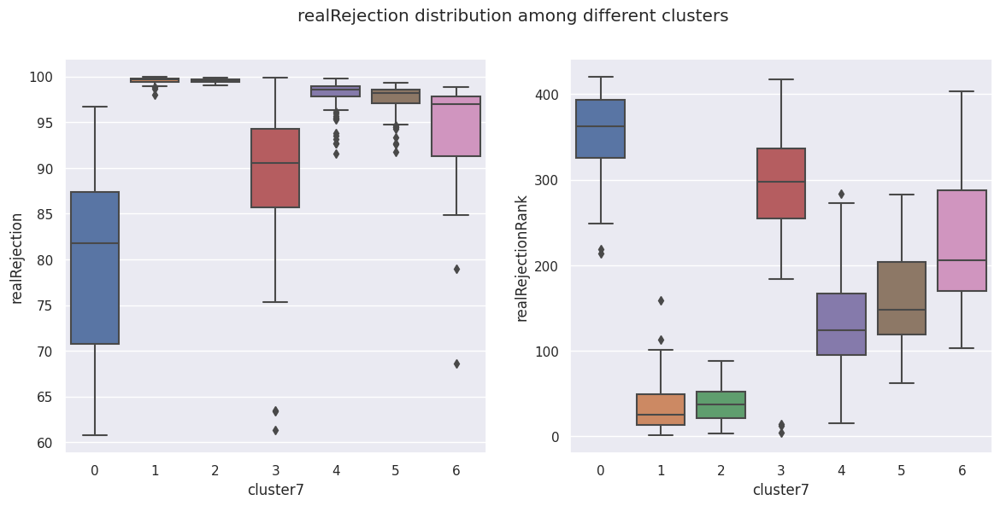

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("realRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='realRejection', data=cluster_allr)
sns.boxplot(ax=ax[1],x='cluster7', y='realRejectionRank', data=cluster_allr)

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'realRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejection                                                   
                 count    min       mean    max  median   mode        std
cluster7                                                                 
0                   90  60.75  79.380333  96.73  81.745  85.56  10.077810
1                  149  98.01  99.597013  99.94  99.690  99.92   0.300350
2                  125  98.99  99.553680  99.91  99.580  99.86   0.228341
3                   78  61.36  88.788205  99.90  90.550  95.62   7.832907
4                  127  91.58  98.080236  99.79  98.560  98.81   1.471220
5                  112  91.75  97.590783  99.31  98.220  98.57   1.558817
6                   47  68.63  94.128936  98.81  97.000  90.53   5.865041

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'realRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

realRejectionRank                                                   
                     count    min        mean    max median   mode        std
cluster7                                                                     
0                       90  214.0  354.311111  420.0  362.5  336.0  48.908225
1                      149    1.0   33.671141  159.0   25.0    2.0  27.621095
2                      125    3.0   38.520000   88.0   37.0    8.0  21.815798
3                       78    4.0  290.102564  417.0  297.5  234.0  76.958682
4                      127   15.0  135.055118  284.0  124.0  103.0  56.573917
5                      112   62.0  160.267857  283.0  148.0  123.0  53.284209
6                       47  103.0  222.893617  403.0  206.0  299.0  77.448225

###Profiling for Observed Solute Rejection Coefficient

<Axes: xlabel='cluster7', ylabel='observedSoluteRejectionRank'>

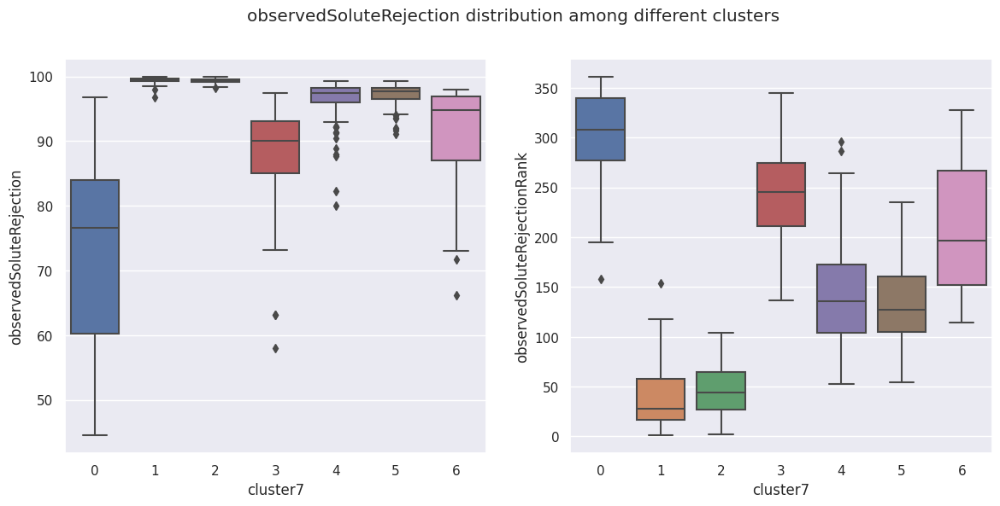

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("observedSoluteRejection distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='observedSoluteRejection', data=cluster_allr)
sns.boxplot(ax=ax[1],x='cluster7', y='observedSoluteRejectionRank', data=cluster_allr)

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'observedSoluteRejection': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejection                                         \
                           count    min       mean    max  median  mode   
cluster7                                                                  
0                             90  44.50  72.528458  96.73  76.600  53.4   
1                            149  96.84  99.431686  99.91  99.590  99.5   
2                            125  98.20  99.322000  99.90  99.400  99.8   
3                             78  58.00  87.915490  97.42  90.055  85.0   
4                            127  80.00  96.412423  99.30  97.500  98.2   
5                            112  91.13  97.132292  99.29  97.745  98.0   
6                             47  66.20  90.861702  98.00  94.850  96.0   

                     
                std  
cluster7             
0         14.263014  
1          0.442676  
2          0.389613  
3          7.851975  
4          3.079820  
5          1.663715  
6          8.475730

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'observedSoluteRejectionRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

observedSoluteRejectionRank                                          \
                               count    min        mean    max median   mode   
cluster7                                                                       
0                                 90  158.0  304.744444  361.0  308.0  350.0   
1                                149    1.0   37.167785  154.0   28.0   35.0   
2                                125    2.0   45.776000  104.0   44.0   11.0   
3                                 78  137.0  244.141026  345.0  245.5  275.0   
4                                127   53.0  144.598425  296.0  136.0  104.0   
5                                112   54.0  134.232143  235.0  127.5  114.0   
6                                 47  114.0  206.872340  328.0  197.0  172.0   

                     
                std  
cluster7             
0         41.546390  
1         27.416804  
2         24.445088  
3         46.172102  
4         50.019085  
5         40.535155  
6         65.677280

###Profiling for Solute Permeability Coefficient

<Axes: xlabel='cluster7', ylabel='solutePermeabilityCoefficientRank'>

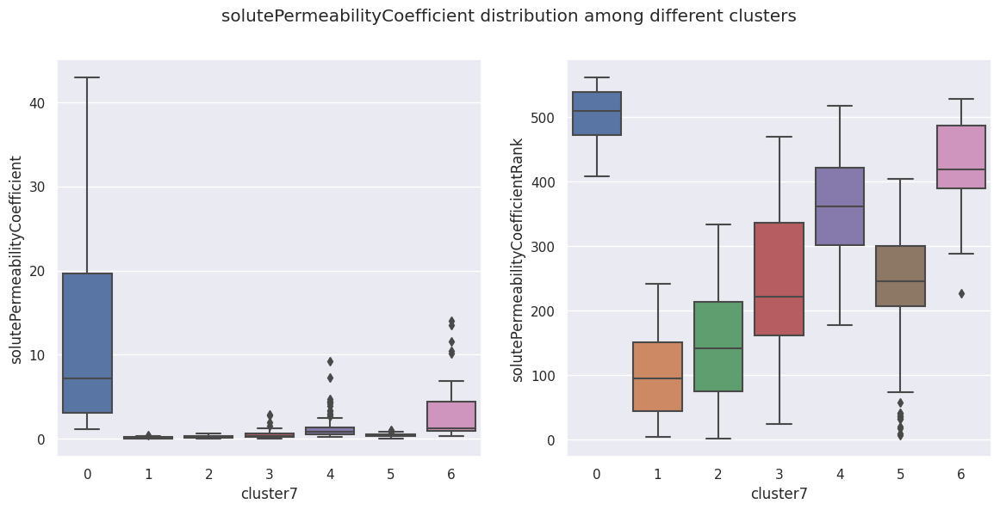

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("solutePermeabilityCoefficient distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='solutePermeabilityCoefficient', data=cluster_allr)
sns.boxplot(ax=ax[1],x='cluster7', y='solutePermeabilityCoefficientRank', data=cluster_allr)

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'solutePermeabilityCoefficient': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficient                                       \
                                 count     min       mean      max   median   
cluster7                                                                      
0                                   90  1.1254  12.613527  42.9300  7.22500   
1                                  149  0.0096   0.130093   0.3839  0.10000   
2                                  125  0.0002   0.216390   0.6600  0.17000   
3                                   78  0.0340   0.530824   2.9200  0.34500   
4                                  127  0.2428   1.220190   9.1970  0.79880   
5                                  112  0.0154   0.420639   1.0865  0.39595   
6                                   47  0.3592   3.259977  14.0570  1.30000   

                             
            mode        std  
cluster7                     
0         4.8557  11.672492  
1         0.0360   0.095132  
2         0.1300   0.152381  
3         0.2900   0.531475  
4         4.3710   1.275386  
5         0.4936   0.222145  
6         1.0900   3.603689

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'solutePermeabilityCoefficientRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

solutePermeabilityCoefficientRank                                   \
                                     count    min        mean    max median   
cluster7                                                                      
0                                       90  408.0  503.722222  561.0  509.5   
1                                      149    4.0  101.664430  241.0   95.0   
2                                      125    1.0  148.984000  334.0  141.0   
3                                       78   24.0  244.782051  469.0  221.0   
4                                      127  178.0  361.086614  517.0  362.0   
5                                      112    7.0  238.437500  404.0  246.0   
6                                       47  227.0  430.787234  528.0  419.0   

                             
           mode         std  
cluster7                     
0         492.0   40.074938  
1          27.0   63.735370  
2         112.0   84.325118  
3         199.0  111.964819  
4         488.0   74.292218  
5         284.0   92.001839  
6         405.0   66.225549

###Profiling for Pressure Difference Coefficient

<Axes: xlabel='cluster7', ylabel='pressureDiffRank'>

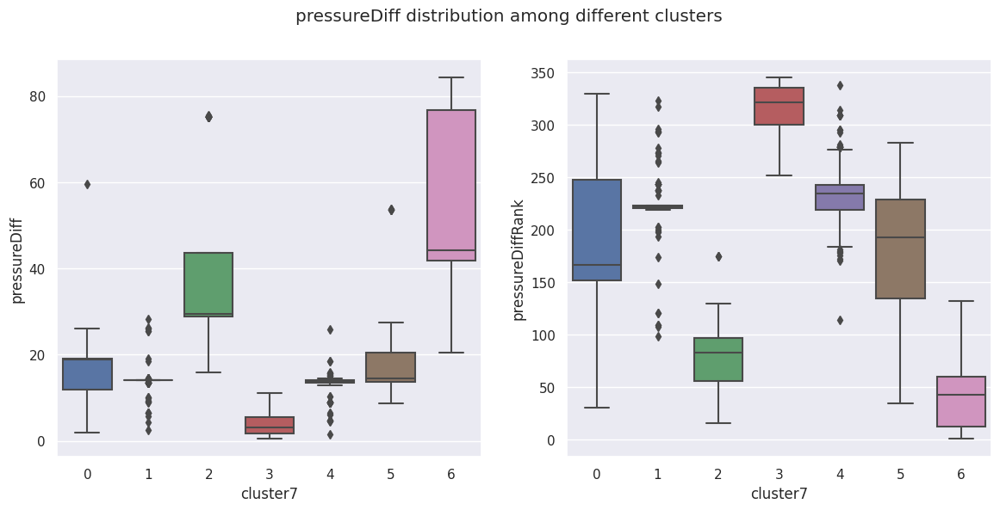

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("pressureDiff distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='pressureDiff', data=cluster_allr)
sns.boxplot(ax=ax[1],x='cluster7', y='pressureDiffRank', data=cluster_allr)

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'pressureDiff': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiff                                                         
                count    min       mean     max     median     mode        std
cluster7                                                                      
0                  90   1.89  15.805020  59.630  18.775000  19.0800   7.009214
1                 149   2.45  13.871420  28.270  13.994296  14.0000   3.331176
2                 125  15.78  38.838697  75.490  29.518100  28.9900  18.017598
3                  78   0.45   4.075166  11.017   3.005000   1.8486   3.064979
4                 127   1.59  12.782653  25.830  13.610000  14.0100   3.161727
5                 112   8.75  18.775282  53.690  14.545000  13.5200   9.436150
6                  47  20.43  52.580164  84.260  44.180000  41.7500  20.924758

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'pressureDiffRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

pressureDiffRank                                                   
                    count    min        mean    max median   mode        std
cluster7                                                                    
0                      90   31.0  195.100000  330.0  166.5  152.0  61.722112
1                     149   99.0  224.302013  323.0  222.0  221.0  32.431155
2                     125   16.0   78.440000  175.0   83.0   91.0  34.573531
3                      78  252.0  314.551282  345.0  321.5  331.0  25.906750
4                     127  114.0  236.055118  338.0  235.0  219.0  33.895101
5                     112   35.0  180.357143  283.0  192.5  242.0  58.082398
6                      47    1.0   47.468085  132.0   43.0   60.0  38.550278

###Profiling for Concentration Polarization

<Axes: xlabel='cluster7', ylabel='concentrationPolarizationRank'>

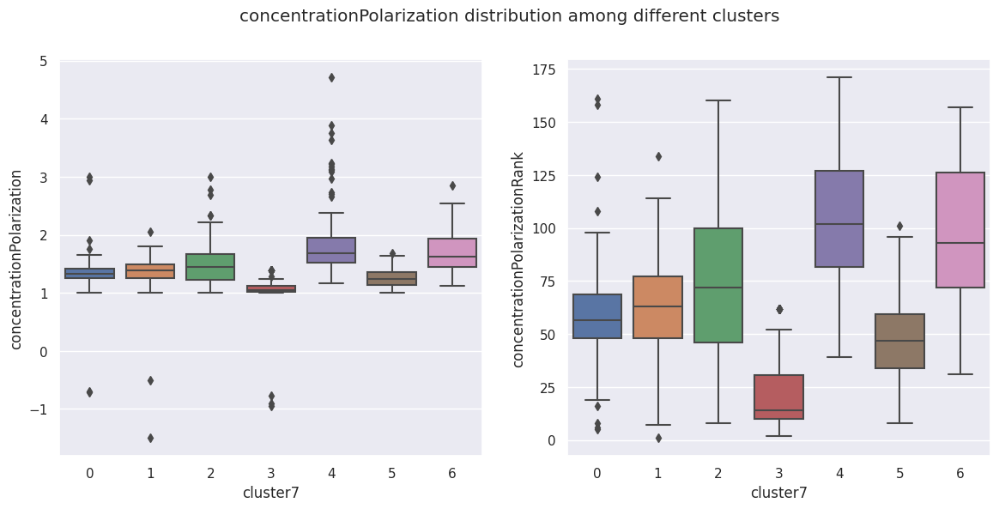

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("concentrationPolarization distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='concentrationPolarization', data=cluster_allr)
sns.boxplot(ax=ax[1],x='cluster7', y='concentrationPolarizationRank', data=cluster_allr)

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'concentrationPolarization': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarization                                         \
                             count   min      mean       max median  mode   
cluster7                                                                    
0                               90 -0.71  1.320980  3.005668  1.325  1.31   
1                              149 -1.50  1.342375  2.050000  1.390  1.00   
2                              125  1.00  1.506778  3.002950  1.450  1.47   
3                               78 -0.95  1.039392  1.380000  1.050  1.38   
4                              127  1.17  1.863604  4.710000  1.690  1.44   
5                              112  1.00  1.239869  1.680000  1.240  1.38   
6                               47  1.12  1.698085  2.850000  1.620  1.18   

                    
               std  
cluster7            
0         0.418814  
1         0.339293  
2         0.358033  
3         0.408412  
4         0.583919  
5         0.149863  
6         0.388261

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'concentrationPolarizationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

concentrationPolarizationRank                                        \
                                 count   min        mean    max median  mode   
cluster7                                                                       
0                                   90   5.0   57.800000  161.0   56.5  55.0   
1                                  149   1.0   61.087248  134.0   63.0   8.0   
2                                  125   8.0   75.128000  160.0   72.0  74.0   
3                                   78   2.0   24.192308   62.0   14.0  62.0   
4                                  127  39.0  105.204724  171.0  102.0  71.0   
5                                  112   8.0   44.660714  101.0   47.0  62.0   
6                                   47  31.0   95.680851  157.0   93.0  40.0   

                     
                std  
cluster7             
0         25.303195  
1         25.655444  
2         35.201259  
3         19.867782  
4         31.745851  
5         20.854949  
6         35.740676

###Profiling for Salt Concentration

<Axes: xlabel='cluster7', ylabel='saltConcentrationRank'>

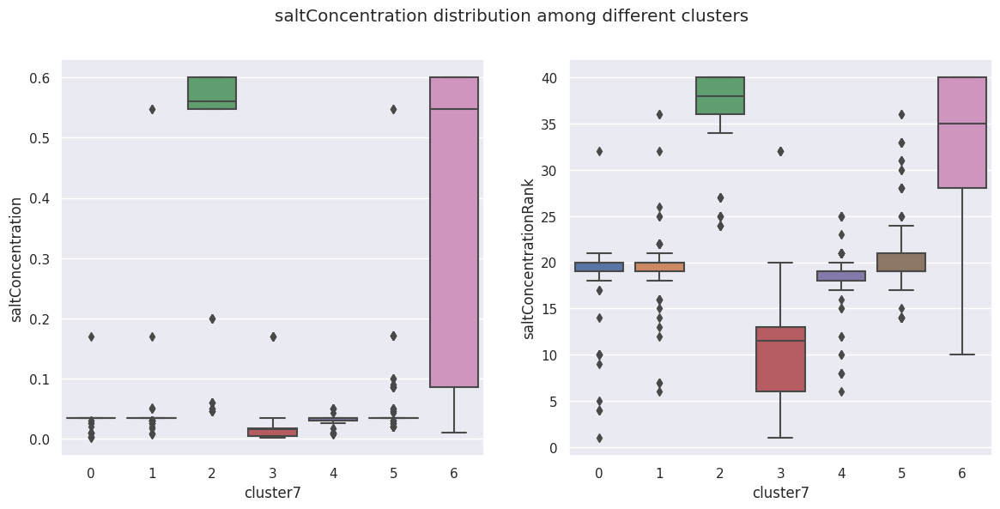

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("saltConcentration distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='saltConcentration', data=cluster_allr)
sns.boxplot(ax=ax[1],x='cluster7', y='saltConcentrationRank', data=cluster_allr)

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'saltConcentration': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentration                                              \
                     count      min      mean     max  median     mode   
cluster7                                                                 
0                       90  0.00154  0.031623  0.1700  0.0342  0.03420   
1                      149  0.00800  0.040337  0.5476  0.0342  0.03420   
2                      125  0.04600  0.511746  0.6000  0.5600  0.60000   
3                       78  0.00154  0.021362  0.1700  0.0155  0.01711   
4                      127  0.00800  0.031430  0.0500  0.0340  0.03400   
5                      112  0.02000  0.054035  0.5476  0.0340  0.03400   
6                       47  0.01000  0.423335  0.6000  0.5475  0.60000   

                    
               std  
cluster7            
0         0.017496  
1         0.060685  
2         0.169103  
3         0.035902  
4         0.007494  
5         0.074487  
6         0.248324

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'saltConcentrationRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

saltConcentrationRank                                              
                         count   min       mean   max median  mode       std
cluster7                                                                    
0                           90   1.0  18.200000  32.0   20.0  20.0  4.748033
1                          149   6.0  19.463087  36.0   20.0  20.0  3.511609
2                          125  24.0  36.856000  40.0   38.0  40.0  4.413513
3                           78   1.0  11.448718  32.0   11.5  13.0  6.844559
4                          127   6.0  18.377953  25.0   19.0  19.0  3.256079
5                          112  14.0  20.991071  36.0   19.0  19.0  5.076878
6                           47  10.0  33.340426  40.0   35.0  40.0  8.686012

###Profiling for Water/Salt Selectivity Coefficient

<Axes: xlabel='cluster7', ylabel='Water/Salt-SelectivityRank'>

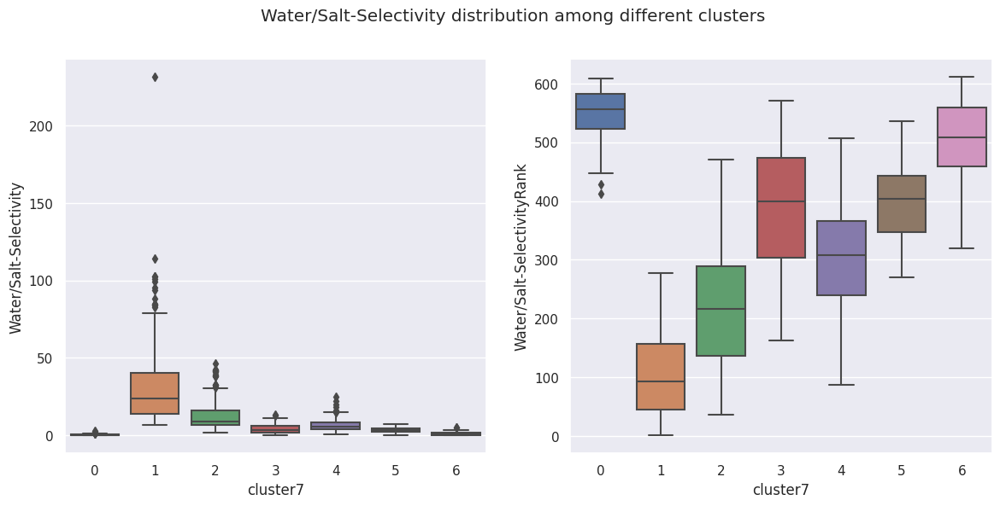

In [ ]:
fig, ax = plt.subplots(1,2)
fig.suptitle("Water/Salt-Selectivity distribution among different clusters")
sns.boxplot(ax=ax[0], x='cluster7', y='Water/Salt-Selectivity', data=cluster_allr)
sns.boxplot(ax=ax[1],x='cluster7', y='Water/Salt-SelectivityRank', data=cluster_allr)

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'Water/Salt-Selectivity': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-Selectivity                                              \
                          count       min       mean         max     median   
cluster7                                                                      
0                            90  0.083053   0.478910    2.900000   0.271805   
1                           149  6.900000  33.597549  231.250000  23.790590   
2                           125  1.595875  13.479670   46.520000   9.000000   
3                            78  0.200000   4.048978   13.377193   3.265714   
4                           127  0.900000   6.855626   25.200000   5.800000   
5                           112  0.404255   3.335798    7.200000   3.200000   
6                            47  0.026670   1.270037    5.380000   0.863570   

                            
           mode        std  
cluster7                    
0          0.20   0.531660  
1         26.10  29.958735  
2         10.00  11.130380  
3          1.80   3.109190  
4          4.00   4.478919  
5          1.30   1.628197  
6          1.27   1.285706

In [ ]:
cluster_allr.groupby('cluster7').agg({
    'Water/Salt-SelectivityRank': ['count',
                                     'min',
                                     'mean',
                                     'max',
                                     'median',
                                     ('mode',lambda x: x.value_counts().index[0]),
                                     'std']
    })

Water/Salt-SelectivityRank                                          \
                              count    min        mean    max median   mode   
cluster7                                                                      
0                                90  413.0  549.000000  609.0  555.5  570.0   
1                               149    1.0  103.973154  277.0   93.0   84.0   
2                               125   36.0  216.728000  471.0  217.0  193.0   
3                                78  163.0  384.692308  570.0  400.0  455.0   
4                               127   87.0  303.417323  507.0  308.0  362.0   
5                               112  270.0  399.008929  536.0  403.0  488.0   
6                                47  319.0  502.510638  611.0  508.0  490.0   

                      
                 std  
cluster7              
0          42.560994  
1          71.987325  
2         107.911357  
3         104.909275  
4          97.139847  
5          63.860278  
6          71.486962

###Profiling for Structure

[Text(0.5, 1.0, 'structure distribution among different clusters')]

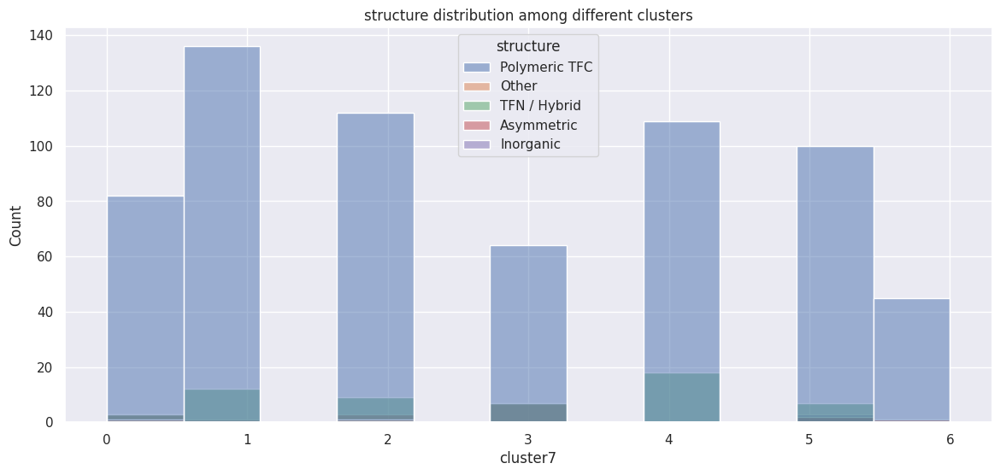

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='structure',
             data=cluster_allr).set(title = "structure distribution among different clusters")

In [ ]:
cluster_allr.groupby(['cluster7'])['structure'].value_counts()

cluster7  structure    
0         Polymeric TFC     82
          Asymmetric         3
          TFN / Hybrid       3
          Inorganic          1
          Other              1
1         Polymeric TFC    136
          TFN / Hybrid      12
          Asymmetric         1
2         Polymeric TFC    112
          TFN / Hybrid       9
          Asymmetric         3
          Other              1
3         Polymeric TFC     64
          Asymmetric         7
          TFN / Hybrid       7
4         Polymeric TFC    109
          TFN / Hybrid      18
5         Polymeric TFC    100
          TFN / Hybrid       7
          Inorganic          3
          Asymmetric         2
6         Polymeric TFC     45
          Asymmetric         1
          Other              1
Name: structure, dtype: int64

###Profiling for Chemistry

[Text(0.5, 1.0, 'chemistry distribution among different clusters')]

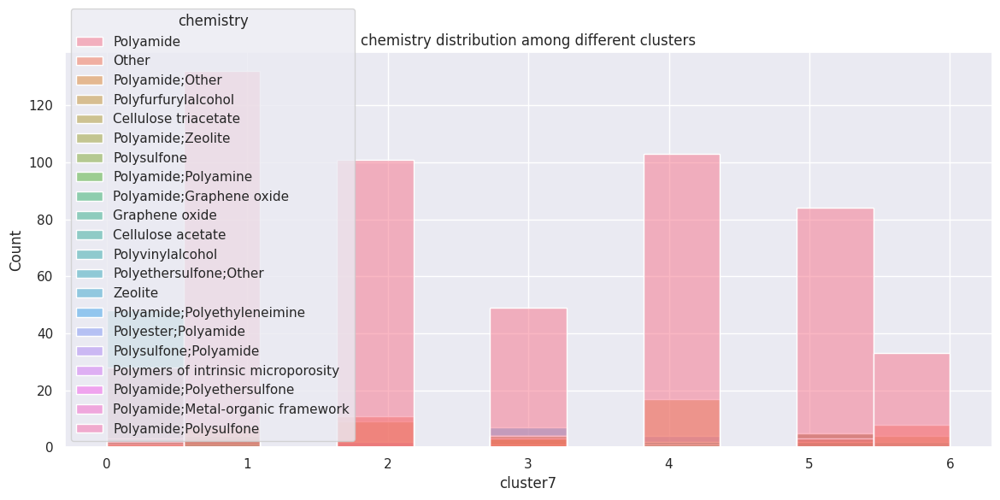

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='chemistry',
             data=cluster_allr).set(title = "chemistry distribution among different clusters")

In [ ]:
cluster_allr.groupby(['cluster7'])['chemistry'].value_counts()

cluster7  chemistry                          
0         Polyvinylalcohol                        48
          Polyamide                               28
          Cellulose acetate                        3
          Graphene oxide                           2
          Other                                    2
          Polyamide;Graphene oxide                 2
          Polyester;Polyamide                      2
          Polyamide;Other                          1
          Polymers of intrinsic microporosity      1
          Polysulfone                              1
1         Polyamide                              132
          Polyamide;Other                          7
          Polyamide;Graphene oxide                 4
          Polyamide;Metal-organic framework        3
          Cellulose acetate                        1
          Polyester;Polyamide                      1
          Polyethersulfone;Other                   1
2         Polyamide                              101


###Profiling for Modification

[Text(0.5, 1.0, 'modification distribution among different clusters')]

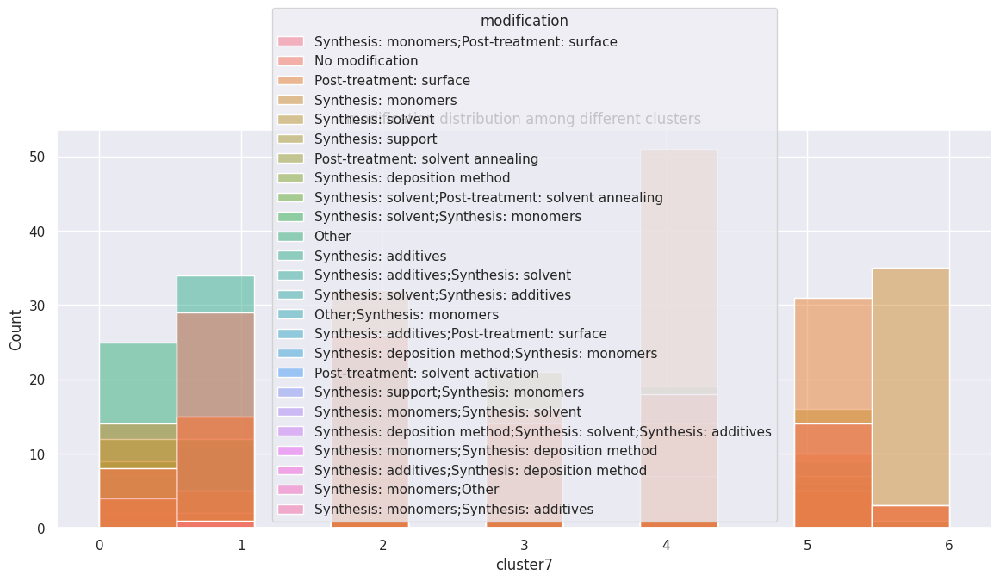

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='modification',
             data=cluster_allr).set(title = "modification distribution among different clusters")

In [ ]:
cluster_allr.groupby(['cluster7'])['modification'].value_counts()

cluster7  modification                                    
0         Other                                               25
          Synthesis: monomers                                 14
          Synthesis: solvent                                  12
          Synthesis: deposition method                         9
          No modification                                      8
                                                              ..
6         Post-treatment: solvent annealing                    3
          Post-treatment: surface                              3
          Other                                                1
          Synthesis: deposition method;Synthesis: monomers     1
          Synthesis: solvent                                   1
Name: modification, Length: 76, dtype: int64

###Profiling for Other Solutes

[Text(0.5, 1.0, 'otherSolutes distribution among different clusters')]

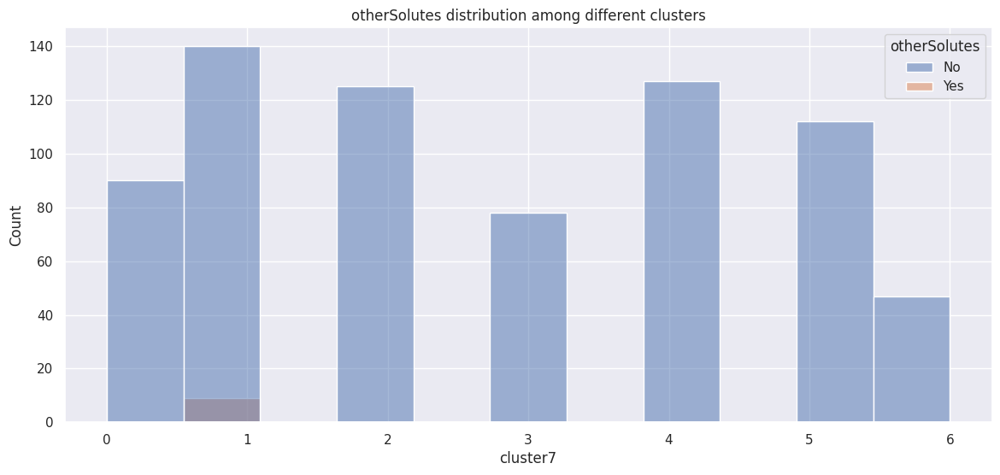

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='otherSolutes',
             data=cluster_allr).set(title = "otherSolutes distribution among different clusters")

In [ ]:
cluster_allr.groupby(['cluster7'])['otherSolutes'].value_counts()

cluster7  otherSolutes
0         No               90
1         No              140
          Yes               9
2         No              125
3         No               78
4         No              127
5         No              112
6         No               47
Name: otherSolutes, dtype: int64

###Profiling for Filtration Mode

[Text(0.5, 1.0, 'filtrationMode distribution among different clusters')]

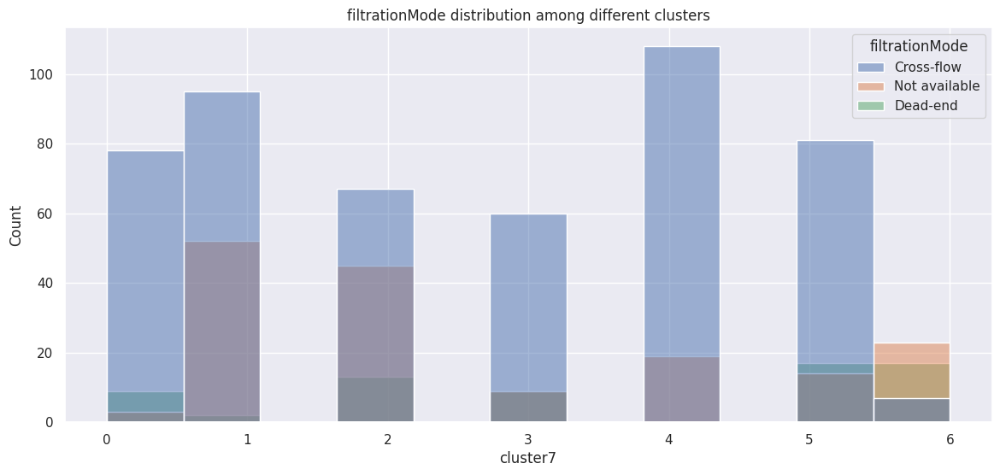

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='filtrationMode',
             data=cluster_allr).set(title = "filtrationMode distribution among different clusters")

In [ ]:
cluster_allr.groupby(['cluster7'])['filtrationMode'].value_counts()

cluster7  filtrationMode
0         Cross-flow         78
          Dead-end            9
          Not available       3
1         Cross-flow         95
          Not available      52
          Dead-end            2
2         Cross-flow         67
          Not available      45
          Dead-end           13
3         Cross-flow         60
          Dead-end            9
          Not available       9
4         Cross-flow        108
          Not available      19
5         Cross-flow         81
          Dead-end           17
          Not available      14
6         Not available      23
          Dead-end           17
          Cross-flow          7
Name: filtrationMode, dtype: int64

###Profiling for Concentration Polarization Mode

[Text(0.5, 1.0, 'cpMode distribution among different clusters')]

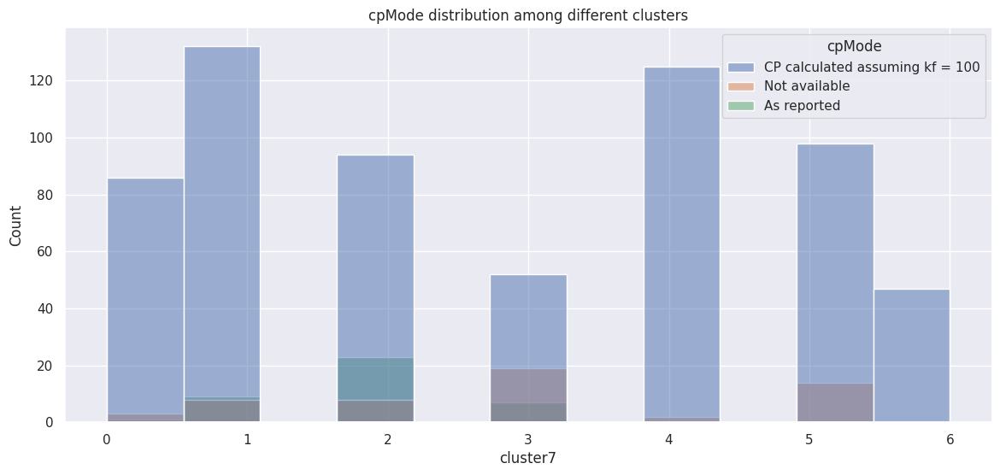

In [ ]:
#TO understand distribution of categorical variables
sns.histplot(x='cluster7',
             hue='cpMode',
             data=cluster_allr).set(title = "cpMode distribution among different clusters")

In [ ]:
cluster_allr.groupby(['cluster7'])['cpMode'].value_counts()

cluster7  cpMode                         
0         CP calculated assuming kf = 100     86
          Not available                        3
          As reported                          1
1         CP calculated assuming kf = 100    132
          As reported                          9
          Not available                        8
2         CP calculated assuming kf = 100     94
          As reported                         23
          Not available                        8
3         CP calculated assuming kf = 100     52
          Not available                       19
          As reported                          7
4         CP calculated assuming kf = 100    125
          Not available                        2
5         CP calculated assuming kf = 100     98
          Not available                       14
6         CP calculated assuming kf = 100     47
Name: cpMode, dtype: int64

##Trying to Identify Most Efficient Membrane

In [ ]:
sortedByAverageRank = processed_filtered.sort_values(by = "averageEfficiencyRank", ascending = True)

In [ ]:
sortedByAverageRank[["mebraneID", "averageEfficiencyRank"]]

,mebraneID,averageEfficiencyRank
245,250,59.500
247,252,59.750
267,272,65.750
243,248,66.500
277,282,66.625
...,...,...
466,483,291.000
459,476,291.500
31,34,297.250
105,110,298.125


In [ ]:
sortedByAverageRank[rankCols]

,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank
245,21.0,1.0,20.0,196.0,2.0,4.0,223.0,9.0
247,14.0,7.0,20.0,210.0,1.0,1.0,223.0,2.0
267,38.0,85.0,20.0,135.0,4.0,6.0,223.0,15.0
243,21.0,73.0,20.0,179.0,3.0,5.0,223.0,8.0
277,40.0,84.0,20.0,139.0,4.0,7.0,223.0,16.0
...,...,...,...,...,...,...,...,...
466,557.0,59.0,20.0,167.0,419.0,358.0,139.0,609.0
459,537.0,55.0,20.0,233.0,400.0,342.0,151.0,594.0
31,470.0,25.0,20.0,359.0,384.0,316.0,251.0,553.0
105,370.0,3.0,5.0,398.0,417.0,345.0,305.0,542.0


In [ ]:
sortedByAverageRank[rankCols]

,solutePermeabilityCoefficientRank,concentrationPolarizationRank,saltConcentrationRank,waterPermeabilityCoefficientRank,realRejectionRank,observedSoluteRejectionRank,pressureDiffRank,Water/Salt-SelectivityRank
245,21.0,1.0,20.0,196.0,2.0,4.0,223.0,9.0
247,14.0,7.0,20.0,210.0,1.0,1.0,223.0,2.0
267,38.0,85.0,20.0,135.0,4.0,6.0,223.0,15.0
243,21.0,73.0,20.0,179.0,3.0,5.0,223.0,8.0
277,40.0,84.0,20.0,139.0,4.0,7.0,223.0,16.0
...,...,...,...,...,...,...,...,...
466,557.0,59.0,20.0,167.0,419.0,358.0,139.0,609.0
459,537.0,55.0,20.0,233.0,400.0,342.0,151.0,594.0
31,470.0,25.0,20.0,359.0,384.0,316.0,251.0,553.0
105,370.0,3.0,5.0,398.0,417.0,345.0,305.0,542.0


#Saving Files

##To Excel

Non-Clustering

In [ ]:
sortedByAverageRank[rankCols].to_excel('averageRankRankings.xlsx', index=False)

Input

In [ ]:
cluster_in[cluster_in['cluster11'] == 2].to_excel('cluster2in.xlsx', index=False)

In [ ]:
cluster_in[cluster_in['cluster11'] == 8].to_excel('cluster8in.xlsx', index=False)

Output

In [ ]:
cluster_out[cluster_out['cluster8'] == 0].to_excel('cluster0out.xlsx', index=False)

In [ ]:
cluster_out[cluster_out['cluster8'] == 6].to_excel('cluster6out.xlsx', index=False)

In [ ]:
cluster_out[cluster_out['cluster8'] == 2].to_excel('cluster2out.xlsx', index=False)

All

In [ ]:
cluster_all[cluster_all['cluster11'] == 5].to_excel('cluster5all.xlsx', index=False)

In [ ]:
cluster_all[cluster_all['cluster11'] == 2].to_excel('cluster2all.xlsx', index=False)

Input Rank

In [ ]:
cluster_inr[cluster_inr['cluster5'] == 0].to_excel('cluster0inr.xlsx', index=False)

In [ ]:
cluster_inr[cluster_inr['cluster5'] == 2].to_excel('cluster2inr.xlsx', index=False)

Output Rank

In [ ]:
cluster_outr[cluster_outr['cluster7'] == 6].to_excel('cluster6outr.xlsx', index=False)

In [ ]:
cluster_outr[cluster_outr['cluster7'] == 2].to_excel('cluster2outr.xlsx', index=False)

In [ ]:
cluster_outr[cluster_outr['cluster7'] == 0].to_excel('cluster0outr.xlsx', index=False)

All Rank

In [ ]:
cluster_allr[cluster_allr['cluster7'] == 1].to_excel('cluster1allr.xlsx', index=False)

In [ ]:
cluster_allr[cluster_allr['cluster7'] == 2].to_excel('cluster2allr.xlsx', index=False)

##To CSV

Non-Clustering

In [ ]:
sortedByAverageRank[rankCols].to_excel('averageRankRankings.xlsx', index=False)

Input

In [ ]:
cluster_in[cluster_in['cluster4'] == 1].to_excel('cluster2in.xlsx', index=False)

In [ ]:
cluster_in[cluster_in['cluster10'] == 1].to_excel('cluster8in.xlsx', index=False)

Output

In [ ]:
cluster_out[cluster_out['cluster2'] == 1].to_excel('cluster0out.xlsx', index=False)

In [ ]:
cluster_out[cluster_out['cluster8'] == 1].to_excel('cluster6out.xlsx', index=False)

In [ ]:
cluster_out[cluster_out['cluster4'] == 1].to_excel('cluster2out.xlsx', index=False)

All

In [ ]:
cluster_all[cluster_all['cluster7'] == 1].to_excel('cluster5all.xlsx', index=False)

In [ ]:
cluster_all[cluster_all['cluster4'] == 1].to_excel('cluster2all.xlsx', index=False)

Input Rank

In [ ]:
cluster_inr[cluster_inr['cluster2'] == 1].to_excel('cluster0inr.xlsx', index=False)

In [ ]:
cluster_inr[cluster_inr['cluster4'] == 1].to_excel('cluster2inr.xlsx', index=False)

Output Rank

In [ ]:
cluster_outr[cluster_outr['cluster8'] == 1].to_excel('cluster6outr.xlsx', index=False)

In [ ]:
cluster_outr[cluster_outr['cluster4'] == 1].to_excel('cluster2outr.xlsx', index=False)

In [ ]:
cluster_outr[cluster_outr['cluster2'] == 1].to_excel('cluster0outr.xlsx', index=False)

All Rank

In [ ]:
cluster_allr[cluster_allr['cluster3'] == 1].to_excel('cluster1allr.xlsx', index=False)

In [ ]:
cluster_allr[cluster_allr['cluster4'] == 1].to_excel('cluster2allr.xlsx', index=False)